In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
#HIDE WARINGS
import warnings
warnings.filterwarnings("ignore")

## Data set (CSV file)

In [3]:
df = pd.read_csv("covid19_tweets.csv")


In [4]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [5]:
df.shape

(179108, 13)

In [6]:
df.describe()

,user_followers,user_friends,user_favourites
count,1.791080e+05,179108.000000,1.791080e+05
mean,1.090555e+05,2121.701566,1.444411e+04
std,8.414670e+05,9162.553072,4.452270e+04
min,0.000000e+00,0.000000,0.000000e+00
25%,1.720000e+02,148.000000,2.060000e+02
50%,9.920000e+02,542.000000,1.791000e+03
75%,5.284000e+03,1725.250000,9.388000e+03
max,4.944256e+07,497363.000000,2.047197e+06


### TASK
+ Sentiment Analysis
+ text processing
+ Keyword Extraction
+ Entity extraction

In [7]:
# COLOUMS
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [8]:
df.dtypes

user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [9]:
df.isnull().sum()

user_name               0
user_location       36771
user_description    10286
user_created            0
user_followers          0
user_friends            0
user_favourites         0
user_verified           0
date                    0
text                    0
hashtags            51334
source                 77
is_retweet              0
dtype: int64

In [10]:
df['source'].unique()

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [11]:
df.source.nunique()

610

In [12]:
df['source'].value_counts()

Twitter Web App                 56891
Twitter for Android             40179
Twitter for iPhone              35472
TweetDeck                        8543
Hootsuite Inc.                   7321
                                ...  
WeVideo                             1
Auto tweets                         1
Woofy Social Media Scheduler        1
Mediaproxy LogJam                   1
DataBlogger                         1
Name: source, Length: 610, dtype: int64

In [13]:
df['source'].value_counts().nlargest(10)

Twitter Web App        56891
Twitter for Android    40179
Twitter for iPhone     35472
TweetDeck               8543
Hootsuite Inc.          7321
Twitter for iPad        4336
Buffer                  2728
Sprout Social           1833
Instagram               1759
IFTTT                   1545
Name: source, dtype: int64

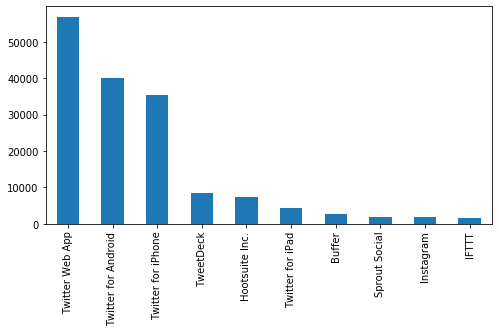

In [31]:
plt.figure(figsize=(8,4))
src = df['source'].value_counts().sort_values(ascending=False)
source = src.head(10)
source.plot.bar()
#plt.title('bar chart for maximum no. of tweets',size=17)
#plt.xlabel('Source of tweets',size=17)
#plt.ylabel('No.of tweets',size=17)
plt.show()

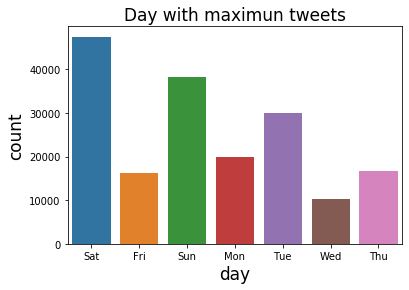

In [32]:
df["date"] = pd.to_datetime(df["date"])
df["Month"] = df["date"].apply(lambda x : x.month)
df["day"] = df["date"].apply(lambda x : x.dayofweek)
dmap = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
df["day"] = df["day"].map(dmap)
plt.title("Day with maximun tweets", size=17)
plt.xlabel('week days',size=17)
plt.ylabel('No.of tweets',size=17)
sns.countplot(df["day"])

## TEXT ANALYSIS OF TWEET

In [33]:
#!pip install neattext

In [34]:
# load text cleaning package
import neattext.functions as nfx

In [35]:
# methods / attributes
dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [36]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,Month,day
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,7,Sat
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,7,Sat
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,7,Sat
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,7,Sat
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,7,Sat


In [37]:
df['text'].iloc[0]

'If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated that… https://t.co/QZvYbrOgb0'

### clean data
* remove urls
* remove hashtags
* remove emojis
* remove spacial chr

In [38]:
df['text'].apply(nfx.extract_hashtags)

0                                      []
1                                      []
2                              [#COVID19]
3                              [#COVID19]
4         [#CoronaVirusUpdates, #COVID19]
                       ...               
179103                       [#WearAMask]
179104                         [#COVID19]
179105                                 []
179106                         [#COVID19]
179107                                 []
Name: text, Length: 179108, dtype: object

In [39]:
df['extracted_hashtags']=df['text'].apply(nfx.extract_hashtags)

In [40]:
df[['extracted_hashtags','hashtags']]

,extracted_hashtags,hashtags
0,[],NaN
1,[],NaN
2,[#COVID19],['COVID19']
3,[#COVID19],['COVID19']
4,"[#CoronaVirusUpdates, #COVID19]","['CoronaVirusUpdates', 'COVID19']"
...,...,...
179103,[#WearAMask],['WearAMask']
179104,[#COVID19],['COVID19']
179105,[],NaN
179106,[#COVID19],['COVID19']


In [41]:
#remove hashtags
df['clean_tweet'] = df['text'].apply(nfx.remove_hashtags)

In [42]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [43]:
##remove_emojis
df['clean_tweet'] = df['text'].apply(nfx.remove_emojis)

In [44]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift #COVID19 has give me...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel #CoronaVirus...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! #COVID19 http...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for #CO..."


In [45]:
#remove userhandles
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_userhandles(x))

In [46]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and - wouldn't it have made more sen...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed #COVID19 was a ...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift #COVID19 has give me is an appr...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel #CoronaVirus...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the #WearAMas...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! #COVID19 http...
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena. It's a t...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for #CO..."


In [47]:
#remove urls
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_urls)

In [48]:
df['clean_tweet'].iloc[0]

'If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated that… '

In [49]:
df['clean_tweet'].iloc[1]

"Hey     and   - wouldn't it have made more sense to have the players pay their respects to the A… "

In [50]:
#remove punctation
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_puncts)

In [51]:
#remove multiple spaces
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_multiple_spaces)

In [52]:
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_stopwords)

In [53]:
df['clean_tweet']

0         smelled scent hand sanitizers today past think...
1                 Hey wouldnt sense players pay respects A…
2              Trump claimed #COVID19 hoax claim effort to…
3              gift #COVID19 appreciation simple things me…
4         25 July : Media Bulletin Novel #CoronaVirusUpd...
                                ...                        
179103      Thanks nominating #WearAMask challenge nominate
179104                      2020 year insanity Lol #COVID19
179105    powerful painting Juan Lucena tribute grandpar...
179106    1200 students test positive #COVID19 major uni...
179107                                            stop Stop
Name: clean_tweet, Length: 179108, dtype: object

### Sentment analysis

In [54]:
#!pip install textblob

In [55]:
from textblob import TextBlob

In [56]:
#dir(TextBlob)

In [57]:
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
              'subjectivity':sentiment_subjectivity,
              'sentiment':sentiment_label}
    return result

In [58]:
ex1 = df['clean_tweet'].iloc[0]
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [59]:
df['sentiment_results'] = df['clean_tweet'].apply(get_sentiment)

In [60]:
df['sentiment_results']

0         {'polarity': -0.25, 'subjectivity': 0.25, 'sen...
1         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
2         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
3         {'polarity': 0.0, 'subjectivity': 0.3571428571...
4         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
                                ...                        
179103    {'polarity': 0.2, 'subjectivity': 0.2, 'sentim...
179104    {'polarity': 0.8, 'subjectivity': 0.7, 'sentim...
179105    {'polarity': 0.3, 'subjectivity': 1.0, 'sentim...
179106    {'polarity': 0.14488636363636365, 'subjectivit...
179107    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
Name: sentiment_results, Length: 179108, dtype: object

In [61]:
pd.json_normalize(df['sentiment_results'].iloc[0])

,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [62]:
df = df.join(pd.json_normalize(df['sentiment_results']))

In [63]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,source,is_retweet,Month,day,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,...,Twitter for iPhone,False,7,Sat,[],smelled scent hand sanitizers today past think...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,...,Twitter for Android,False,7,Sat,[],Hey wouldnt sense players pay respects A…,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,...,Twitter for Android,False,7,Sat,[#COVID19],Trump claimed #COVID19 hoax claim effort to…,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,...,Twitter for iPhone,False,7,Sat,[#COVID19],gift #COVID19 appreciation simple things me…,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,...,Twitter for Android,False,7,Sat,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin Novel #CoronaVirusUpd...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [64]:
df['sentiment'].value_counts()

Neutral     88510
Positive    63792
Negative    26806
Name: sentiment, dtype: int64

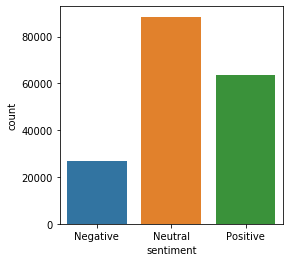

In [75]:
plt.figure(figsize=(4,4))
sns.countplot(df['sentiment'])
# plt.title(" ", size=17)
# plt.xlabel('Sentiment',size=17)
# plt.ylabel('No.of tweets',size=17)

##  Keyword Extraction
+ For Positive and Negative Sentiment
+ General

In [49]:
positive_tweet = df[df['sentiment'] == 'Positive']['clean_tweet']
neutral_tweet = df[df['sentiment'] == 'Neutral']['clean_tweet']
negative_tweet = df[df['sentiment'] == 'Negative']['clean_tweet']

In [50]:
positive_tweet

6         #COVID19 Change Work General (and recruiting s...
8         Praying good health recovery #covid19 #covidPo...
12                      — safe #COVID19 safe commit ensure…
13        Lets protect #COVID19 real numbers climbing fa...
19        COVID Update: infection rate Florida following...
                                ...                        
179095    #COVID19 Update: 23 new cases today TriCounty ...
179103      Thanks nominating #WearAMask challenge nominate
179104                      2020 year insanity Lol #COVID19
179105    powerful painting Juan Lucena tribute grandpar...
179106    1200 students test positive #COVID19 major uni...
Name: clean_tweet, Length: 63792, dtype: object

In [51]:
# Remove Stopwords and Convert to Tokens
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [52]:
positive_tweet_list

['#COVID19 Change Work General (and recruiting specifically) via/ #Recruiting…',
 'Praying good health recovery #covid19 #covidPositive',
 '— safe #COVID19 safe commit ensure…',
 'Lets protect #COVID19 real numbers climbing fast Continent Lets n…',
 'COVID Update: infection rate Florida following natural curve experts predicted initial cu…',
 'Good Patriots Volunteer Election Judge Polls open without…',
 '#TNCoronaUpdate #TN crosses 2 lakh mark 150055 ppp recovered far #COVID19 positive today 6988/total…',
 'Actor father MrGKReddy tested positive #Covid19 15/20 days #Vishal s…',
 'safe place visit guests said hotel meticulous applying hand sanitation als…',
 'CEO live WSU talking “The effects Covid19 students”…',
 'Actionables healthy recovery #COVID19 #climate',
 'released new #COVID19 podcast episodes week: Technology Platforms Conduct Telehealth Visits C…',
 '#Delhi reports 1142 #COVID19 positive cases 29 deaths Saturday Death toll rises 3806 reports ANI quot…',
 'Venezuelas Economy

In [53]:
negative_tweet_list

['smelled scent hand sanitizers today past think intoxicated that…',
 '#coronavirus #covid19 deaths continue rise bad Politicians businesses want…',
 'image doesnt list source Id careful overall risk dying statistics related to…',
 'Im feeling little anxious #COVID19 detracted everyones…',
 'Crazy world come Americans fight #covid19',
 '#COVID19 aka #Coronavirus Ill sending 500 people like amp retweet $300 $1500 Cas…',
 'time spike #Covid19 cases isvery hard reverse drastic lockdown time y…',
 'Hi long time preparation reopening homework #clean…',
 'OK Im angry believe stupidity #COVID19 virus kills must…',
 '#DurbanJuly weekend Yall pity year facing #COVID19 cant person…',
 'Shout Earth Hands worst reaction “emergency” I’ve seen Lottery shut and…',
 'Egyptians aint got shit #COVID19',
 'Cum Check Ill DM Nudes #onlyfansbabe #ihaveajoke #onlyfansgirl #alreadyvideo…',
 'worst type spread #COVID19 #COVID19 #COVIDIOTS',
 'Agreed % mean exactly problem travellers needs educatin…',
 'I’m emo

In [54]:
neutral_tweet_list

['Hey wouldnt sense players pay respects A…',
 'Trump claimed #COVID19 hoax claim effort to…',
 'gift #COVID19 appreciation simple things me…',
 '25 July : Media Bulletin Novel #CoronaVirusUpdates #COVID19',
 'wear face coverings shopping includes visit local Community Pharmacy…',
 'POPE GOD Prophet Sadhu Sundar Selvaraj Watch #HurricaneHanna #COVID19…',
 '49K+ Covid19 cases response cancel compartment exa…',
 'Order here: #logo #graphicdesigner #logodesign #logodesinger #icon #minimalist #Abstract…',
 'Rajasthan Government today started Plasma Bank Sawai Man Singh Hospital Jaipur treatment COVID19 pa…',
 'Nagaland police Covid19 Awareness City Tower Junction Dimapur #Covid19 #keepsocialdistance…',
 'July 25 #COVID19 update #TamilNadu 6988 Discharge 7758 People tested 61729 Actice cases 52273 #chennai 1329',
 'Second wave #COVID19 Flandersback #homework',
 'darkest moments focus #light~Aristotle',
 'Coronavirus South Africa: COVID19 update South Africa (24 July 2020)',
 'comprehensive 

In [55]:
# Tokenization
for line in positive_tweet_list:
#     print(line)
    for token in line.split():
        print(token)

#COVID19
Change
Work
General
(and
recruiting
specifically)
via/
#Recruiting…
Praying
good
health
recovery
#covid19
#covidPositive
—
safe
#COVID19
safe
commit
ensure…
Lets
protect
#COVID19
real
numbers
climbing
fast
Continent
Lets
n…
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
Good
Patriots
Volunteer
Election
Judge
Polls
open
without…
#TNCoronaUpdate
#TN
crosses
2
lakh
mark
150055
ppp
recovered
far
#COVID19
positive
today
6988/total…
Actor
father
MrGKReddy
tested
positive
#Covid19
15/20
days
#Vishal
s…
safe
place
visit
guests
said
hotel
meticulous
applying
hand
sanitation
als…
CEO
live
WSU
talking
“The
effects
Covid19
students”…
Actionables
healthy
recovery
#COVID19
#climate
released
new
#COVID19
podcast
episodes
week:
Technology
Platforms
Conduct
Telehealth
Visits
C…
#Delhi
reports
1142
#COVID19
positive
cases
29
deaths
Saturday
Death
toll
rises
3806
reports
ANI
quot…
Venezuelas
Economy/Budget
tied
Oil
like
Louisianas
Funny
rightwing
examp

[13:16
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
best
teachers
dont
ignore
chaos
world
outside
classroom
writes
Instead
us…
Latest
updates
covid19
Qatar
#COVID19
enjoy
#Covid19
#telecommuting
#remoteteaching
#remotelearning
#Barbados
#BeachOffice…
new
#COVID19
cases
Sorsogon
include
teenagers
#BicolNews
#COVID19
#ClimateChange
intersect
ways
Right
#HurricaneHanna
expected
bring
severe
flood…
Barcelona
legend
Xavi
Hernandez
tested
positive
#COVID19
head
coach
Qatars
Al
Sadd
said
soc…
government
Rajasthan
poor
pro
Look
kind
slum
sitting
what…
University
Kentucky
working
Somerset
Community
College
create
new
advancements
mask
filtrati…
safely
restart
nonemergent
#EssentialSurgery
#COVID19
pandemic
Join
910:30am
EDT
o…
love
wicked
🤷‍🤷‍🤷‍🤷‍
#RihannaXTiwa
#alreadyvideo
#ObasekiFlagsOffToday
#odikwabyblaqdee
#COVID19…
thing
distinct
#Covid19
#COVID19
Running
Balance
SMART
number
recharge
online
#StayHome
care
#Smart
#covid19
online
retail
sector
busier
outbreak
#covid

Directed
Multiple
Epitopes
SARSCoV2
Spike
Amen
Trump
administration
inadequate
appointees
ignored
early
warnings
misled…
Actor
Father
MrGKReddy
Tested
positive
#Covid19
15/20
Days
#Vishal
s…
FIXED:
starting
today
draconian
new
rules
protesters…
great
summary
evidence
limitations
information
#SARSCoV2
#COVID19
transmission
schools
Hong
Kongs
#COVID19
situation
remains
grave
new
cases
hit
record
Real
#COVID19
deaths
figures
chart
showing
number
new
cases
#COVID19
cases
#Poland
plus
average
number
daily
new
cases…
#COVID19🦠
situation
companies
given
work
remotely
Right
stay
focused
on…
love
#DJSBU
#COVID19
Wash
Hands
Clean
Hands
Save
Lives
🧼
Download
FREE
Google
Play
Store:
#COVID19
Lessons
learned
past
epidemics
sexual
reproductive
health
#SRH
learn
…
everyones
health
amp
wear
mask
simple
action
sure
covers
nose
mouth
amp…
Qatar’s
announced
today
recorded
398
new
#COVID19
cases
330
recoveries
4326
people
tested…
GOP
bureaucrat
like
Steve
(
)
loved
paid
#FireHanke
#Sledgehammer…
new
#face

Actor
father
MrGKReddy
tested
positive
#Covid19
15/20
days
#Vishal
s…
symptoms
coronavirus
weeks
testing
positive
Follow
Families
St
Basils
Homes
Aged
residents
fear
loved
ones
coronavirus
outbreak
grows…
Good
morning
#TheFortress
weather
mild
sunny
Today
a:
#bikingday
2020
#skiing
amp…
asked
occupation
replied:
forced
stay
insidewhile
outsiders
enjoying
my…
order
recover
economically
#COVID19
start
support
British
jobs
Im
banning
in…
#IPAN
pleased
recent
news
emanating
Abia
State
like
returned
the…
remembers
advert
🤷‍
funniest
best
advert
ma…
amazing
#NFL
player
Super
Bowl
champion
giving
shot
championship
hea…
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
Kuwait
(+684
tot
63309)
El
Salvador
(+429
tot
14221)
Uni…
peak
season
we’re
encourage
people
follow
social
distancing
help
stop
t…
3
easy
steps
Stop
acting
like
3
stooges
#COVID19
friends
Walter
worse
kind
cancerhe
#COVID19
c…
arrange
bed
#Covid19
patient
temple
premises
important
Ahead
Mega
Ram
Temple…
Allcure
Lifescience
delive

hands
Wear
mask
Stop
s…
MOISTURISER
HAND
SANITIZER
SALE
Enjoy
instant
clean
natural
hand
sanitizer
#health
#healthylifestyle…
youre
going
weekend
remember
social
distancing
#COVID19
#ProtectSuffolk
#ProtectNorfolk
“To
able
meet
financial
needs
women
diversifying
activities
include
animal
husba…
case
werent
aware
capitalism
beating
socialism
#COVID19
#Coronavirus
#COVID
Best
Proper
way
Wear
Viral
Face
Shield
Federal
Ministry
Health
Lets
inform
Public
ad…
agents
plans
Chinese
students
Know
More:
#InternationalStudents…
#CoronaWatch
1336861
total
confirmed
cases
849432
cases
cured/recovered
15849068
samples
tested
He…
sure
missed
concern
cost…
COVID19:
2984
fresh
cases
active
cases
cross
#Coronavirus
#COVID19
#UP
Kuwait
reports
684
new
#COVID19
cases
692
new
recoveries
government
needs
step
save
American
businesses
going
spiral
second
Great
Depre…
According
women
talked
#Alhol
(and
internal
social
media)
got
#COVID19
case
One…
SRASCoV2
experiments
available
kind
research…
latest
1310
#PHE

new
Mode
video
meet
app
Microsoft
Teams
place
basketball
fans
courtside
in…
total
number
#COVID19
infections
worldwide
quickly
nearing
16
million
10
million
patients
recovered…
1
Updated
thread
children
#COVID19
summarising
latest
research
Summary:
schools
reopen
safe…
important:
‘people
safe
virus’
he’s
failure
#TrumpVirus
#COVID19
killed
145k
(amp…
#Covid19
legitimately
increasing
nearly
40
cases
14
days
Yihh
#BREAKING
adequate
#COVID19
hospital
facilities
Promoting
home
isolation
mild/asymptomatic
cases
167
case…
#Romania
Strategic
Communication
Group
reported
Saturday
new
recordhigh
number
#COVID19
cases1284…
#POTUS46
↔↔
fans
truly
love
Joe
↔↔
takes
mi…
#COVID19
giving
gift
support
unique
gift
idea
way
ensure
expecting
fam…
Good
afternoon
quick
question
apparent
£12m+
cost
#COVID19
contact
tracing
app
…
#COVID19
South
Africans
hostage
kubi
cant
fly
coastal
provinces
joy
mxm
2020
FREE
business
webinar
providing
COVIDsecure
guidance
people
work
run
🥣restaurants
pubs
🥂bars
caf…
Deligh

cities
large
towns
England
great
weekend
FTL
🤩
#goodmorning
#fortlauderdale
#morning
#coffee
#southflorida
#florida…
Backpacker
hostels
#coronavirus
(#COVID19):
Lonely
guests
adjust
new
normal
Home
projects
havent
taken
day
COVID19
began
Happy
asked
share
experience
pres…
Presenting
#happymoments
#positive
amp
#kind
gestures
world
ser…
offering
free
20
step
#COVID19
workplace
checklist
action
plan
helping
return
workplace…
great
chance
#covid19
given
save
#environment
shown
limit
#lifestyle…
New
COVID19
Data
20200725
07:00:01
EDT
#Coronavirus
#COVID19
Planning
#homerenovation
#Toronto
walk
managed
safely
#COVID19…
FC
Barcelona
Legend
Xavi
Hernandez
Tested
Positive
COVID19
#Xavi
#COVID19
#Xavi…
New
Podcast
GSMC
Baseball
Podcast
Episode
215:
Opening
Day
Games
#baseballnews
#covid19
#dodgers…
#LMALLC:
Black
People’s
COVID19
Anxieties
Covering
Faces
Proven
Right
Racial
Profiling
Reports
Worries…
3
Steps
#SmallBusiness
Owners
need
Future
Growth
post
#Covid19
whilst
rightly
great
conc…
Dont


#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
India
conducted
420
lakh
tests
day
highest
far
tests
million
rises
11485:
Health
Ministry
#COVID19
decision
influence
left
meeting
directly
council
deci…
Cultural
institutions
Boston
continue
scramble
money
reopen
via…
#COVID19
recovery
weeks
young
adults:
study
CM
expressed
happiness
encouraging
result
#PlasmaTherapy
48
year
woman
recovering
fro…
Interesting
read
persoective
outside
Germany
habdling
#COVID19:
#germany
#gdp
#corona
Mass
update
724:
107897
cases
8279
deaths
214
new
cases
14
new
deaths
uptick
cases…
long
wait
meet
loved
ones
termed
non
essential
travel
resume
INT…
Rakesh
Sharma
Best
business
Coach
India
Website:
#salescoach
#BusinessCoach
#salesforce…
El
Salvador
reports
429
new
#COVID19
cases
setting
new
daily
record
134
new
recoveries…
2803
new
#COVID19
positive
cases
reported
Bihar
taking
total
number
cases
36314:
State
Health
Department
Barret
man
wants
tell
world
problems
human
race
needs
think
redue
thing…
Schools
sc

te…
Despite
government
telling
eat
help
scared
restaurant
new
te…
Despite
government
telling
eat
help
scared
restaurant
new
te…
Despite
government
telling
eat
help
scared
restaurant
new
te…
lines
want
tell
idea
“clean”
“saniti…
People
stressed
need
anti
depressants
Governments
busy
chasing
weed
alcohol
cigarettes…
#COVID19
happens
#coronavirus
#vaccine
developed
Charlize
Theron
he…
lagi
#Promo
loh
1
hours
FREE
CP
Bio
DMCome
join
#JAKSEL
#bojaksel
#colmek…
lets
send
kids
amp
teachers
filled
schools
amp
school
days
weeks
blood
th…
lagi
#Promo
loh
1
hours
FREE
CP
Bio
DMCome
join
#JAKSEL
#bojaksel
#colmek…
canceled
clear
attendance
sparse
narcissism
cant
stomach
another…
Corona
cultists
provide
infection
transmission
rates
#COVID19
constantly
touching
c…
2020
tourism
facing
unprecedented
challenges
caused
#COVID19
predicted
78%
decline
compared
2…
true
test
#leadership
function
crisis—
#COVID19
Pandemic
calls
for…
thankyou
face
masks
Ready
wear
customers
homes
#watersofteners…
status
offic

ship
floats
built
right
material
life
you‘re
able
float
the…
Shivraj
Singh
Chouhan
CM
MP
tests
positive
#covid19
Covid
positive
cases
doubled
recent
p…
Short
things
won’t
better
Gove
Boris
rap…
Good
News:
#sunrisemanorrehab
#COVID19
#free
wearing
mask
good
Countries
wear
mask
found
drop
case
of…
ask
#Trump
ACCOMPLISHED
4
years
(other
bungling
pandemic
response
destroyed
relat…
detailed
report
#covid19
recovered
patients
chennai
reporting
blood
clots
wor…
New
Healthcare
Marketing
Matters
post:
Lessons
SARSCoV2
Pandemic
Ready
Chief
Engagement…
New
Healthcare
Marketing
Matters
Post:
Reengaging
Patients
Post
COVID19
#hospital
#covid19…
47
new
#COVID19
cases
reported
today
#Cuttack
district
35
cases
belong
Cuttack
Municipal
Corporat…
went
phlebotomy
clinic
week
surprised
nurse
wore
mask
covering
nose…
new
old
man
blog
post:
Ways
Stay
Safe
SARSCoV2
(Coronavirus)
Surge
Enjoy
Going
Out…
new
old
man
blog
post:
AllTime
Favorite
Movie
List
Whats
List
#movies
#favoriates
#hollywood…
Mother
fvcker


Drizzling
disinfectants
Corniche
beach
walkers
#AbuDhabi
restrict
#COVID19
transmission
Awesome
effor…
Thank
excellent
summary
protocols
reflect
different
point
views
i…
Enjoy
chat
Haydar
founder
#jimscleaning
talk
#health
#work
#wellbeing
#weightloss…
considerable
#economic
challenges
unjust
#US
sanctions
#Iran
proven
innovative
in…
#COVID19
:
BJP
States
v/s
Delhi
Total
Positive
Cases
day
Delhi
128389
13681…
Mali
risk
spreading
#COVID19
high
Humanitarians
partners
supporting
government
response…
#Free
#Webinar
#COVID19
#Payments
Industry
#atm
#banking
#covid19
#fintech…
Bangladesh
reports
2520
new
#COVID19
cases
38
new
deaths
#Kazakhstan
Ministry
Finance
extended
special
procurement
procedure
July
31
October
1202…
Frequent
handwashing
soap
🧼
water
touching
surfaces
critical
protecting
and…
said
Mona
Siddiqui
Radio
Sco
Shareen
prog
stressing
unique
Scottish
approach
#COVID19
pandemic
pandemic
sure
follow
tips
loved
ones
heart
strong
healthy
To…
Brilliant
training
morning
thinking
curio

#Covid19
GetwellSoonMaestro
Best
lockdown
moment
6
months
baby
Ezra
planking
sunshine
cat
making
sure
right
te…
economic
social
impacts
#COVID19
fall
harder
women
men
Join
Indias
program…
Saddened
hear
news
good
person
village
lost
life
battling
corona
morning
#COVID19…
Arunachals
#COVID19
tally
crosses
1000mark
65
fresh
cases
process
info
degenerated
brain
decipher
SAFE
UNSAFE
means
🤔
What’s
y…
CAPTION
PHOTO
COMMENTS
Best
comment
wins
NHE
postcard
#natashahumeraejaz
#longhair…
LIVE
|
comprehensive
townwide
lockdown
imposed
WB’s
Kalimpong
Municipality
seven
days
starting…
Important
note
Xavi’s
positive
#COVID19
test:
Feeling
inspired
study
PhD
loved
work
compassion
think
th…
Thanks
highlighting
impacts
#covid19
children
young
peoples
mental
health…
study
Angelo
Carfi
colleagues
high
proportion
patients
(874%)
recovered
#COVID19
repo…
•MASKS•
Simple
rules
little
light
hearted
humour
#mask
#treatitlike
#covid19
#staysafe
#sillythings…
worth
reading
#wisdom
amp
#resilience
tackle
#COVID19

Zanzibar
thanks
support
COVID19
COVID
19
astonishing
rise
cause
death
2020
#COVID19
#WearADamnMask
proud
branding
logo
website
designing
sourcing
profit
margins
myself…
XAVI
Tested
covid
19
positive
Best
wishes
#xavi
#COVID19
#coronavirus
#xavicorona
early
#COVID19
Jan2020
picked
stock
exchange
hit
changed…
World
changing
everyones
safety
need
adapt
new
normal
quickly
possible
easy…
Feel
Safe
Uncertainty
Moving
currents
change
order
feel
safe
uncertainty…
actually
successfully
managed
claim
#travelinsurance
trip
cancelled
due…
#DEnewsflash:
Ministry
Health
announced
23
new
#Covid19
cases
including
17
local
transmissions
new
c…
Esala
Perahera
Festival
July
25
August
4
Info:
Subscribe
LIVE
Watch:…
Esala
Perahera
Festival
July
25
August
4
Info:
Subscribe
LIVE
Watch:…
Esala
Perahera
Festival
July
25
August
4
Info:
Subscribe
LIVE
Watch:…
Esala
Perahera
Festival
July
25
August
4
Info:
Subscribe
LIVE
Watch:…
Esala
Perahera
Festival
July
25
August
4
Info:
Subscribe
LIVE
Watch:…
UK
neurologists

#Company
#illustration
#Illustrator
#Indian
#Video
#covid19…
Went
#gym
morning
laid
social
distancing
observed
organisers…
amp
thing
Guys
y’all
food
high
tasting
like
3
Niggas
#COVID19
#netflixisoverparty
#ihaveajoke
Rashi
Diagnostic
Center
NABL
Certified
Laboratory
Bangalore
provides
best
packages
health
che…
I’m
sure
we’re
getting
unbiased
analysis
Scottish
Government’s
performance
Scottish
Government’s
advisers
#covid19
Ive
masked
gloved
shops
March
live
village
nece…
#economists
talk
Vshaped
Ushaped
recovery
bring
complete
guide
incor…
Good
morning
admin
yes
yes
tell
you’re
best
best
tipster
thanks
yest…
tax
dollars
like
better
pepper
spray
rubber…
LIVE
BLOG:
Austrian
coronavirus
testing
push
hotels
falls
far
short
target
via…
times
#COVID19
biggest
source
happiness
news
moved
No1⃣
the…
proud
fouryearold
donning
#facemask
unsure
knows
protectin…
acceptable
bump
elbows
enjoy
#COVID19
soon
hope
youll
feel
brighter
soon
care
ready
help
y…
3
good
reasons
wear
mask
wondering
#COVID19
#n

#Medical
coverage
#Lifeinsurance
#Riskmanagement…
148492
#COVID19
Deaths
WATCH
old
Lie
#LiarInChief
#Trump’s
favored
right…
end
promotion
disposal
masks
huge
global
pollution
crisis
P…
Classic:
Religious
leaders
want
reopen
group
doesn’t
believe
*science*
they’ve
decided
th…
1320
new
#COVID19
cases
10
deaths
reported
Odisha
71%
new
#trade
related
measures
imposed
worldwide
linked
#COVID19
pandemic
says
report…
Tips
effective
#customerengagement
amp
post
#COVID19
Nominate
organization
BEST
INITIATIVES…
place
right
time
I’ve
actually
decided
sit
snack
place…
like
classic
Jim
Lee
comics
help
pandemic
emelongr
#berlin
#sbahn…
#UnitedArabEmirates
vows
free
#Covid19
tests
resident
Ajamn
begins
#freetesting
o…
#China
confirms
34
#COVID19
new
cases
bit
#architectural
#photography
***
High
#Holborn
#London
|
Fujifilm
XT20
|
Fujinon
XF
1855mm
|
ISO…
#HongKong
reports
133
new
confirmed
#COVID19
cases
hitting
new
daily
high
Registration
(1067)
new
confirmed
cases
coronavirus
#COVID19
(1054)
new
re

new
cases:
133
•
imported:
7
•
local:
126
(71
linked
55
source
yet)
•
Days…
India
social
security
hit
#Covid19
crisis
positive
feedback
loop
tran…
Medical
appliance
business
completely
dominated
Chinese
cos
Fogging
machines
Pulse
oximeter
thermomete…
sold
#stock
#video
thanks
buyer
Check
#profile
in:
#COVID19
$BNTX
Bullish
hammer
candlestick
near
8500
start
making
masks
addictiveanyone
got
loads
stock
supplies
cut
ready
ke…
kind
world
live
people
don’t
care
safety
#safetyfirst…
CANTU
Hydrating
Cream
Conditioner
3000
naira
Helps
hair
retain
natural
oils
Reveals
healthier
hydrated…
UPDATE:
13
Presidential
communications
office
personnel
positive
#COVID19
Andanar
hardest
pandemics
social
behavior
change
risk
virus
humans
behavior
Remember
#COVID19
#COVID19
#COVID19
#Covid19
COVID19
cases
India
cross
13
lakh
nearly
49000
new
cases
recorded
quiet
day
fantastic
day:
Meet
#Covid
detectives:
Inside
HSE’s
contact
tracing
centre
people…
#BIGNEWS:
#IITKharagpur
researchers
developed
technology
#C

Stay
safe
stay
kind
pleaseWEAR
MASK
(44/44)
#medtwitter
#covid
#coronavirus…
Cummings
latest
spin
fool
govt
actually
cares
Raab
‘supporting’
users’
#Foodbanks
Patel’s
‘sadness’
for…
strong
leadership
community
engagement
comprehensive
strategy
suppress
transmission
save…
#COVID19
:
Minister
Planning
urges
general
public
avoid
going
entertainment
places
amp
gathering…
#Masks
genuinely
work
point
#lockdown
dont
whats
point
mandatory…
Ive
backed
campaign
ensure
potential
#Covid19
vaccine
available
–
j…
124
new
cases
1
new
death
Austria
[9:32
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
UPDATE:
13
Presidential
communications
office
personnel
positive
#COVID19
Andanar
art
printed
awesome
products
Support
Redbubble
#RBandME:
#findyourthing…
Wow
Whats
opposite
datadriven
science
h/t
#COVID19
Regardless
tired
absolutely
understandable
okay
#COVID19
taken
u…
lovely
quote
families
#COVID19
Thanks
retweet
Hope
resolution
region
#porbandar
facing
poor…
#CoronaInfoCH
#COVID19


sunk
faster
bus
quick
sand
Nov
2019
had…
3
Foundational
Blocks
Successful
Investing
are:
1
Comprehensive
Financial
Plan
2Investment
Policy
Statemen…
HOPE
PANDEMIC
WEAPONIZED
Commission
Human
Rights
surprised
concerned
t…
pampering
session
intended
#lionesses
feel
beautiful
inside
boosting
#confidence…
hour
Register
Free:
#webinar
#webinars2020
#Zoom
#Covid19
#CovidImpact…
wanna
thats
living
life
right
#lebanon
delay
fun
2
m…
Best
super
rugby
covid19
free
New
Zealand
Pity
covid19
invested
south
africa
n…
find
super
funny
hear
repeatedly
predicted
#COVID19…
know
reputable
company
London
offering
24
turnaround
COVID19
tests
Dont
symptoms
purely…
UPDATE:
PCOO
employees
test
positive
#coronavirus
total
13
#COVID19
|
via…
graph
#COVID19
cases
Austria
Notice
got
quickly
control
Masks
Notice
it…
documentary
“my
75
days
lockdown
journey
“
inspiring
story
Tell
love
lie
follow
try
reply
Dms
#BBNaijia…
98yearold
grandma
sewing
mask
lt3
#WearAMask
#grandma
#love
#COVID19
Trump
Admin
Secures
600M
Vi

event
winter
stor…
Let
doubters
doubting
let
subscribers
winning
Yes
want
real
fixed
match
y…
Vaccine
progress
report:
projects
bidding
win
race
COVID19
vaccine
via…
Students
Professional
looking
build
future
India
Abroad
Interested
members
contact
at…
139
new
#COVID19
cases
#Puducherry
tally
2654
#CoronavirusPandemic
#Coronavirus
Fascinating
article
touch
influence
#COVID19
:
“We
feel
skin
hunger
notice
discrepancy
betw…
PHOTOS:
#Myanmar
—
6
years
old
#COVID19
positive
kid
gifts
discharged
hospital
morning
Te…
Teaching
noble
profession
worth
risking
life
Government
intends
#schoolsreopening…
IIT
Kharagpur
researchers
claim
developed
novel
technology
#COVID19
rapid
test
Ultraportable
devic…
#CoronaInfoCH
#COVID19
#corona
Shopping
amp
Special
Offers
#CoronaInfoCH
#COVID19
#corona
Shopping
amp
Special
Offers
gt100
new
cases
1
DEATH:
hashtags
ONESEVEN
hashtags
amp
(July
25
2020
16:00
HKT)…
Dr
Kong
talked
creative
ways
delivering
#flu
#vaccination
programme
#SocialDistancing
#COVID19
time…

cases
deaths
–
new
study
#COVID19…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
right
wing
America
complete
disgrace
They’ve
shown
care
conman
cult
leader
their…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
#Covid19
Positive
cases
reach
421
996
Covid19
cases
con

converting
handicap
incentive
success
#thesuccessfactor…
Bihar:
35yearold
#COVID19
positive
man
homeisolation
dies
suicide
Patna
Citys
Malsalami
Police
Station
limits
#World
#Covid19
23336
New
Cases
1136
New
Deaths
15954781
Cases
643021
D…
infected
person
coughs
sneezes
breathes
near
touch
things
touched
an…
novel
FREE
ENJOY
🥰
#fantasy
#thriller
#fiction
#suspense…
Love
#facecoverings
#COVID19
Sensible
advice
wearable
wrist
tracker
detect
#COVID19
symptoms
early
stage
available
market
month
w…
careful
dont
think
Precaution
best
amp
free
treatment
proce…
happy
foreignowned
youre
going
#Covid19
spreading
march
take…
CM
Madhya
Pradesh
tested
positive
#Covid19
symptoms
Pregnant
women
risk
death
Kenya’s
COVID19
curfew
#Pregnant
#COVID19
#Curfew
#Coronavirus
#Virus…
#Covid19
Files
(Doing
Part):
Friday
night
outdoor
dinner
adventure
world
famous
#monalisarestaurant…
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
says
tested
#COVID19
positive
meaningful
graph
number
daily
cases
scale
right
magnificat

#COVID19
Social…
thing
Ive
missed
lockdown
people
posting
social
media
let
know
theyre
gy…
#MadhyaPradesh
Chief
Minister
#ShivrajsinghChouhan
(
tested
positive
#Covid19
informa…
“#Companies
flipped
workfromhome
model
overnight
decades
right
things
s…
MP
CM
#ShivrajSinghChouhan
Tests
Positive
#Covid19
Taking
official
twitter
handle
#MadhyaPradesh…
CM
Uddhav
Thackeray
says
favour
complete
lifting
#lockdown
Maharashtra
says
needs
b…
Madhya
Pradesh
CM
#ShivrajSinghChouhan
says
tested
#COVID19
positive
#MadhyaPradesh
Professor
Newton
aware
#Covid19
impacts
ITALY
SPAIN
UK
*could*
prepared
a…
latest
#AgChatOZ
Daily
Thanks
#auspol
#covid19
#CoranationStreet
talking
#COVID19
Thanks
poor
people
ones
claim
wise
invest
platform
works
others*
*Think
Su…
#OnAir
CEO
latest
report
highlights
impact
tha…
500
people
newly
evacuated
flood
#Kachin
#Myanmar
#RedCross
volunteers
aff…
Australian
Open
organizers
settled
plan
host
2021
tournament
complete
biosecurity
a…
24/7/2020
Kogi
State
Commissioner
Health

performers
category
handling
wave
#COVID19
#cdnpoli…
Live
#NewstalkBreakfast
–
joins
discuss
latest
#covid19
developments
return
to…
chances
risks
facing
current
economic
crisis
Dean
Baker
Thoughts…
#NATIONAL
|
Madhya
Pradesh
CM
Tests
COVID19
Positive
#MadhyaPradesh
#ShivrajSinghChouhan
#COVID19
#NationalNews…
Children
hugely
affected
prevailing
pandemic
Online
school
module
include
#MentalHealth…
July
23
update:
6472
new
cases
reported
Tamil
Nadu
today
highest
Chennai
cases:
1336…
Soooooo
thought
singing
crowds
NONO
oh
thats
church
OH
OK
#idonotsee
#liars…
LAWSUIT
LAUNCHED
Trudeau
Government
“Totalitarian”
Covid19
Policies
|
Cultural
Action
Party
Canada…
New
video
OTV:
Ganjam
Family
Destroyed
#COVID19
Seek
Govt
Help
New
video
OTV:
#COVID19Record
1594
Positives
Detected
Odisha
24
Hrs
today
cumulative
total
421
996
confirmed
COVID19
cases
South
Africa
recorded
total
n…
Complement
C3
identified
unique
Risk
Factor
Disease
Severity
Young
#COVID19
Patients
Wuhan
#COVID19
real
Dont
like
poli

cases
24
new
deaths
#BREAKING
:
Madhya
Pradesh
Chief
Minister
tests
positive
#COVID19
#COVID19
#COVID19India
African
Region:Over
769000
confirmed
#COVID19
cases
African
continent
435000
recoveri…
#BREAKING:
#MadhyaPradesh
Chief
Minister
Shivraj
Singh
Chouhan
tests
positive
#Covid19
#Coronavirus
Updates:…
commends
govt
commitment
ensure
district
#Ghana
decent
hospital
reinforced…
Clean
hands
Use
soap
water
alcoholbased
hand
rub
#COVID19
clear
drugs
touted
effective
#covid19
data
small/not
convinci…
Plans
change
stick
it’s
working
clearly
a…
Madhya
Pradesh
CM
tests
positive
#COVID19
Live
Updates:
Kazakhstan
reports
1740
new
#COVID19
cases
1772
new
recoveries
Madhya
Pradesh
Chief
Minister
Shivraj
Singh
Chouhan
tests
positive
#COVID19
soon
sir
Madhya
Pradesh
Chief
Minister
tests
positive
#COVID19
Bolivia
reports
1204
new
#COVID19
cases
66
new
deaths
#BREAKING
Apparently
#Lombardy
region
emergency
#COVID19
got
caught
h…
#BreakingNews
:
#MadhyaPradesh
CM
Shivraj
Singh
Chouhan
tests
positive


gave
cash
the…
German
army
dogs
smell
#COVID19
interesting
tool
toolbox
#pandemic
1/5
Dear
Nick
Mangwana
Ministry
Health
day
26
contact
positive
#COVID19
patient…
IPL
2020:
Watch
forem
iconic
stars
IPL
anymore
#ipl2020…
sit
line
8
hours
#covid19
test
Im
sure
theyll
GLADLY
get…
poor
people
ones
claim
wise
invest
platform
works
others*
*Think
Su…
Gold
traditional
safe
asset
lost
glitter
#Covid19
crisis
Swiss
franc
dollar…
#REGIONAL
|
COVID19
Assam:
3
Patients
Donate
Plasma
GMCH
#COVID19
#Assam
#PlasmaBank
#PlasmaTherapy
#GMCH…
Real
warrior
standing
#america
brown
shirt
making
Ru…
Vijay
Shalby
Saves
Life
Corona
Positive
Patient
#AhmedabadFightsCorona
#VijayShalby
#COVID19
#ShalbyCare…
Vijay
Shalby
Saves
Life
Corona
Positive
Patient
#AhmedabadFightsCorona
#VijayShalby
#COVID19
#ShalbyCare…
France
reports
1130
new
#COVID19
cases
343
new
recoveries
NYC
school
NEST+M
wants
fulltime
remote
learning
year
#COVID19…
#Gujarat
#India
1068
new
#Covid19
confirmed
cases
reported
24
hours
Info
from:
Go

Confirmed
Cases:
4112531
Total
Deaths:
145546
Total
Recoveries:
1261624
New
Conf…
Gargle
way
adding
salt
hot
water
twice
day
#corona#coronavirus
#COVID19
—
safe
#COVID19
safe
commit
ensure…
ALERT:
New
Jersey
close
gym
defiantly
stayed
open
amid
COVID19
judge
rules
Global
Pandemic
News
|…
greatest
success
eradicating
coronavirus
Australia’s
backyard
|
New
Daily
#Covid19
#COVID19
profoundly
disrupted
operations
globe
prolonged
impact
business
continuity…
Alabama
residents
#WearAMask
help
stop
spread
#COVID19
#Alabama
gotta
better
557
new
#COVID19
positive
cases
#Rajasthan
34735
total
cases
#CoronavirusOutbreak
#Coronavirus
Mexicos
health
ministry
announced
7573
new
Covid19
infections
737
new
deathson
Friday
bringing
nationwi…
Hey
guys
need
helpWe
able
gather
$95
needed
$250
goal
maintaining
busin…
Important
Message
people
hope
#covid19
#FightagainstCoronavirus…
new
podcast
#COVID19related
sports
discussion
week
#Coronavirus
symptoms
update:
Mouth
lesions
found
new
warning
sign
COVID19
|


hundreds
high
drugs
lunatics
domestic
terrorists
#COVID19
got
Honble
Governor
expressed
concern
knowing
Honble
MLA
Srikant
Sahu
tested
positive
for…
High
level
summary
#COVID19
vaccine
progress
$SPY
$DIA
$QQQ
$IBB
$LABU
$MRNA
$GILD
$BNTX
$PFE
$JNJ
$INO
$VXRT
Daily
New
Cases
United
States
Novel
Coronavirus
Daily
Cases
Daily
New
Cases
Cases
DayData
24/07/20…
SPECIAL
OFFER
ITEMS
Explore
selection
bestselling
products
best
pricing
Visit
st…
557
new
#COVID19
positive
cases
6
deaths
reported
Rajasthan
till
1030
today
total
number
cases
i…
mentality
worry
Dont
discouraged
trying
best
come…
Cipla
launching
Corona
treatment
drug
:
Pharmaceutical
major
Cipla
hs
announced
receiving
approval
launching
Fa…
#ExcelEntertainment
Successfully
Completes
Shooting
Films
#HelloCharlie
amp
#DongriToDubai
Taking
Necessary…
#COVID19
#DeVos
FACT
CHECKED
AWARDED
4
5
PINOOCCHIOS
New
study
shows
SPREAD
Virus
Analysis
|
DeVos’s
clai…
Wellington
likes
walk
find
video
lucky
took
strong…
Safe
amp
Secure
Delivery
guar

https:
trying
support
#BlackLivesMatter
cope
#COVID19
grieving
death
beloved
congr…
Good
morning
government
mismanages
economy
hardest
hit
poor
Easy
blame
#COVID19
fa…
15
crore
#COVID19
samples
tested
far
said
#ICMR
adding
420
lakh
samples
tested
Fr…
#COVID19
UPDATE
•
#Indias
total
cases
cross
13lakh
mark
•
Total
positive
cases
stand
1336861
•
456071
ac…
July
24
2020
4PM
Department
Health
reported
2103
new
COVID19
cases
bringing
total
number
c…
Hydroxychloroquine
works
best
treat
cure
#COVID19
virus
conjunction
Azithro…
right
answer
Rs
5
Lakh
Thank
participation
#COVID19India
#Corona
#covid19
#COVID…
LMAO
WAKE
Pencil
Ick
wonder
pay
Sex
wonder
Pussy…
#COVID19
joke
infectious
laugh
#MaskOn
true
#COVID19
wonder
high
number
covid
patients
visionary
leaders…
need
net
worth
republican
wants
cut
unemployment
they’re
broke
we…
Hopefully
recovers
reflects
errors
strong
voice
fi…
New
look
Dre
Spray
premium
hand
sanitizer
Stay
Clean
Streets
Available
at…
good
day
connoisseursbarberclub
think
OK
g

panel
charged
plan
fair
distribution
eventual
COVID19
vaccine
|
Article
[AMP]
|
Reuters…
honored
pleased
announce
release
projects
Annals
Medicine
Surgery
would…
Jul24
48895
new
#Covid19
cases
761
deaths
32514
recovered
Track
daily
#Covid19india
cases
App:…
Singleday
spike
48916
positive
cases
amp
757
deaths
#India
24
hours
Total
#COVID19
positive
ca…
Whats
better
avail
safe
amp
hygienic
home
visit
facility
Mumbai
convenience
amp
re…
think
#TheSopranos
superior
finale
believe
#BreakingBad
better
series
overall
Dont…
Dr
Anita
Gupta
John
Hopkins
U—amp
impressive
credentials
—not
sending
child
#F2F
schooling
says
thisr…
Perfect
use
Mask
#WearAMask
#COVID19
48916
new
#COVID
cases
reported
24
hours
taking
total
count
1336861
#coronavirus…
2nd
consecutive
day
#TamilNadu
reported
6000
new
cases
#COVID19
6785
persons
tested
positi…
Covid19
Report
Odisha
24th
July
New
Positive
Cases:
1320
Quarantine:
887
Local
Contacts:
433
New
Recove…
ThousandEyes
natural
fit
Cisco
plans
tuck
company
Enterpris

cases
148490confirmed
dead
+1141
ne…
light
going
lately
agree
#BobLazar
telling
truth…
Total
420898
tests
yesterday
highest
testing
India
single
day
far
t…
BETTER
amp
#birmingham
amp
#alabama
STOP…
Im
proud
led
bill
Congress
ignoring
constituents
I…
Backed
demand
Bharat
Ratna
Veer
Savarkar
50000pa
judge
Bombay
High
Co…
Autism
Little
Learners
variety
free
downloadable
COVID19
related
stories
students
paren…
clearly
#coronavirus
satanic
performance
2019
#Madonna
#COVID19
shutting
shit
theme
parks
r
open
#COVID19
lol
thing
point
COVID19
🦠
⏭
fast
forward
ready
Christmas
yet‍…
#COVID19
Donate
Free
Gas
USA
Inc
Help
free
gasoline
Essential
Frontline
workers
Thank
you…
I’m
glad
children
school
worry
got
daddy’s
gun
nut
teen
C…
Art
Imitating
Life:
bestfriend
asks
6year
old
“Can
draw
picture
think
going
on…
Live
updates
coronavirus
pandemic
click
link
#plandemic
#news
#trump
#NWO…
know
lockdown
related
deaths
dwarf
#Covid19
deaths
Laura
kuennsberg
interested
w…
Instead
proactively
planning
reope

understand
system
works
she’s
willingly
lev…
(1)
leadership
moments
think
this:
gt
pandemic
normal
day
day…
started
guard
victory
49ers
Super
Bowl
LIV
earlier
year…
statement
man
looks
#brave
#conviction
#COVID19
#optout
“She
tested
positive
coronavirus
Shes
#singlemom
caring
#disabled
teenage
son
sic…
Xmas
July
Rachael
received
fridge
thanks
generous
GIVIT
donors
We’ve
working
wit…
Check
great
info
people
communicating
masks
#COVID19
#COVIDVic
#Masks
#IPL2020
advanced
week
New
schedule
Sep
19
Nov
8
51day
window
allow
60
matc…
friends
brace
VIRUS
CONSPIRACY
shit
fest
true
blowout
m…
weekly
science
review
snapshot
new
amp
emerging
scientific
evidence
related
#COVID19…
reduce
spread
#COVID19
15m
distance
That’s
approximately
adult
bike
couldnt
park
a…
threat
#Covid19
loved
ones
community
lead
worry
fear
sadness
hopel…
ETRealty
|
Rajasthan
government
lost
stamp
duty
worth
Rs
500
crore
lockdown
#Jaipur
#Coronavirus
#Covid19…
Todays
#COVID19
Stats
Confirmed:
228169
Recovered:
222672
Deaths:

7573
new
cases
#Covid19
737
deaths
Cyber
Scammers
Stay
Busy
Pandemic
|
#coronavirus
|
#scams
|
#covid19
I’m
sure
red
shirt
good
idea
“What’s
don’t
name”
#startrek
#mask
#covid19…
Sign
“Stop
Trumps
latest
attack
CDC
American
public
health”
I’ll
deliver
copy
officials…
352
new
cases
5
new
deaths
Belgium
[4:41
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#UnsungHeroes
#SecurityGuards
play
vital
role
fight
#Covid19
screening
visitors
b…
talked
staying
online
teachers
ready
class
instruction
soon…
123
new
cases
(REVISED
total:
2373)
1
new
DEATH
(REVISED
total:
16):
hashtag
(July
25
2020
11:00
HKT)
#COVID2019
#COVID19
#HONGKONG
golfing
New
Jersey
Americans
die
#COVID19
8
minutes
Fl…
direct
link
podcast
discussing
#COVID19
return
#sports
Social
distancing
Quarantine
Flatten
curve
#thankyoukeyworkers
#photography
#gettyimages…
READ
(not
paywalled)
Job
Guarantee
better
cheaper
option
reset
Australian
economy
from…
Ep
184
Remote
Learning
Looms
Large
amp
discuss
#covid19…
fa

130…
labour
point
(he
says
labouring
point)
light
Spanish
Flu
now…
Important
Things:1There
pending
confirmatory
tests
Truenat
2
Maximum
cases
came
testin…
incompetence
administration
president
particular
doomed
Trumps
pandemic
#COVID19
—
safe
#COVID19
safe
commit
ensure…
Gotta
sniff
tests
ready
school
#COVID19
12
confirmed
dead
NCDC
announce
591
new
cases
#COVID19
191
Oyo
168
Lagos
list
bringing
th…
103yearold
released
week
emergency
response
center
Pakistan
testing
positive
CO…
#SD29
#Coronavirus
Update
Friday
July
24th:
total
240
new
confirmed
cases
#COVID19
cities
o…
Latest:
#Coronavirus
watch
July
25:
Sao
Paulo
postpones
Carnival
celebrations
to…
657
new
cases
50
new
deaths
Honduras
[4:14
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
ET
Reports:
Nagpur
trials
start
Julyend
early
August
race
#COVID19
vaccine
heats
Considering
success
Plasma
Therapy
State
CM
assigned
district
responsibilities
to…
NEW:
Federal
judge
rejects
legal
challenges
WA
emergency
orders
cur

successfully
emerge
#COVID19
epidemic
America
struggles
eve…
mean
pointy
hats
good
water
cups
#Memes
#FamilyGuy
#COVID19
#bruh
PM
Narendra
Modi
inaugurate
3
new
high
throughput
labs
#ICMR
July
27
#Covid19…
thanks
showing
lives
numbers
wonderful
people
lost…
golfs
wasting
taxpayers
money
Im
sure
#Covid19
lockdowns
dictating
lives
#health
weighing
minds
great
time
check
ou…
Oh
greatour
county
added
list
hot
spots
Mississippi
getting
real
Scary…
I’ve
major
investments
dog
pay
#Memes
#FamilyGuy
#COVID19
#bruh
Win
Buy
Box
Increase
#Amazon
sales
Alpha
Repricer
#Amazon
#Amazonfba…
Exactly
living
fear
pseudoscience
(ahemmasks)
#COVID19
#coronavirus
#COVID19
#MasksOnOhio…
Interesting
Export
Indian
spices
increased
big
way
#COVID19
west
saying
Indians
smel…
date
78
citizens
afflicted
#Covid19
infection
rate
213x
higher
tha…
Today
7/24/20
lost
1141
#Americans
lives
78009
new
#COVID19
cases
#USA
#Florida
12444
#Deaths
1…
Baseball
Australia
bans
Alcohol
sponsorships
advertisingdoing
right
thingand


far
away
calls
tell
MD
daughter
excellent
#COVID19
article
a…
44%
984
prisoners
#Guwahati
Central
Jail
tested
positive
#Covid19
ICE
bars
new
foreign
students
classes
fully
online
fall
term
#COVID19
#Covid
#Coronavirus…
Fauci’s
completely
honest
#COVID19
#COVID19BC
Update
July
24th:
Good
news
#BCgovernment
statistics:
14%
tests
+…
Teenage
Outbreak
town
5
6
new
#COVID19
cases
under18
satellite
suburb
New…
Pentagon
wants
mobile
coronavirus
hospitals
#Florida
outbreak
worsens
#COVID19
#Covid
#Coronavirus
#trump…
Learning
collaborate
essential
life
skill
students
need
social
distancing
technology
will…
#Florida
tops
400000
coronavirus
cases
governor
says
state
moving
better
direction
#COVID19
#Covid…
#COVID19
#Coronavirus
#AssamCovidUpdate
#Assam
#DY365
Assam:
COVID
19
tally
crosses
29000
mark
1130
new
posit…
Thanks
I’ll
look
that’s
can’t
understand
fighting
bac…
6
months
ago
thought
I’d
#LA
today
getting
ready
board
#CarnivalCruise
tomorrow
week
long…
Trade
Wars
invariably
lead
Real
Wars
b

civic
example
important
right
country
needs
you…
#News
StartUPDATES:
New
developments
healthcare
startups
#Affordablehealthcare…
Fresh
garden
time
years
Thank
#covid19
snack
Life
good
#ranchlife
#Corona
24hour
Update
Ending
7/24/2020
9
pm
#NewYork
growing
posted
1800
new
cases
2
days…
Historic
response
#COVID19
sure
Today’s
#COVID19
numbers
Illinois:
1532
new
cases
44330
new
test
results
reported
346%
positivity
rat…
Win
Win
#FlyTheW
#OpeningDay
#COVID19
Wow
⁦
store
#204126
Irvine
—
driver
appears
eaten
sandwich
offering…
Hearing
4K
tests
yesterday
That’s
actually
good
thing
#covid19
R
u
#excited
#MLBOpeningDay
arrived
#Polls
#Poll
#Polling
#TwitterPoll
#tweet
#TwitterPolls
#MLB…
interesting
#Hockey
Night
#Covid19
creates
passing
game
good
know
America
isnt
leading
#COVID19
cases
saddening
numbers
worldwide
vas…
10
Presidential
communications
office
personnel
positive
#COVID19
Andanar
#Corona
24hour
Update
Ending
7/24/2020
9
pm
USA
32
50
states
(64%
COUNTRY))
gt400
new
ca…
lives
Riskin

#MedEd
PGY4
rotation
⁦
gets
lively
Microsoft
Paint
#COVID19
#ntfc
#FakeNews
Andanar:
office
disinfection
continue
carried
New
Executive…
#FridayMotivation
happy
errands
today
gas
etc
3
stores
visited
western…
sobering
reminder
vulnerability
elderly
#IBD
patients
#Covid19
pandemic
Great
see…
#Maddow
WH
writing
#CDC
policy
raging
pandemic
WH
responsible
death
because…
road
goes
Bilbo
#LOTR
Umm
appropriate
2020
#quote
#tolkien
#covid19
Saturate
OC
attendees
kneeling
sand
singing
right
beach
Said
organizer
Jessi
Green
respon…
UNACCEPTABLE
govt
botched
#COVID19
response
worse
country
amp
people
can’t
safely
wor…
NEW
Published
Peritoneal
Dialysis
Acute
Kidney
Injury
#COVID19
Pandemic
New
York…
#COVID19:
14
die
24
hrs
#JK
toll
296
JK
#reports
353
#fresh
cases
tally
16782
24
July
2020
||
11:30
PM
Rep…
slow
death
American
allyoucaneat
buffet
READ
MORE:
#cdc
#coronavirus…
#MISC
Treatment
guidelines
Great
work
Dr
Jay
Mehta
useful
practical
#COVID19…
Liberal
MPs
#COVIDIOTS
fly
#COVID19
disaster
Am

rally
@
#ParliamentHill
advocating
National…
SHUT
SHUT
START
LETS
TRY
RIGHT
#ShutItDownStartOver…
Coronavirus
US:
Latest
Map
Case
Count
…
Im
pretty
sure
point
mask
dehumanizes
People
recognizing
humans…
Help
research
maybe
win
cash
waiting
#COVID19
Breaking
increasing
number
#CoronaVirus
cases
overseas
SKorea
gets
113
daily
confirmed
cases…
popular
Governors
common
buckle
pressure
#ReOpen
crowd
to…
Look
appreciate
beauty
present
moment
find
especially
great
nature
(tree…
time
shut
right
#COVID19
ALERT:
Dr
Fauci’s
Genius
Opening
Pitch
Highlights
Social
Distancing
Prowess
Global
Pandemic
News
|…
nice
somebody
best
way
feel
good
#COVID19
#COVID19US
#School
#EastGippsland
#VIC
needs
chairs
amp
shelves
replace
old
furniture
#Library
amp
#Playground
Mos…
sensible
story
Atlanta
#covid19
affect
young
healthy
ppl
#gym
industry
#COVID19
didn’t
cause
new
happen
accelerated
things
tha…
Local
skilled
nursing
facilities
experienced
#COVID19
outbreaks
affecting
staff
residents
alike
and…
Coronavirus


weekend
golf
#COVID19
raging
control
innocent
Americans
ou…
Twits
trying
block
view
quickly
search
title:
VIDEO:
Trump
Says
Fauci
Lock
USA
For…
politically
incorrect
protests
contributing
rising
#COVID19
numbers
right
refreshing
hear
honest
telling
news
dire
national
situation
#inners
…
Mans
grocery
delivery
continues
lifeline
New
Jersey
#Covid19
#seniors
#kindness
#CoronaVirus:
4248203
cases
148478
deaths
reported
United
States
date
77885
new
cases
1…
health
benefits
napping
Inspiring
Future
Leaders
#UCTATINation
#infopenting
#covid19
Sumber
foto:…
Don’t
Compete
Complement
Don’t
start
can’t
complete
Value
enhancement
vital
crav…
issued
new
order
extending
moratorium
evictions
residential
tenants
#Austin
during…
#COVID19
makes
important
look
upstream
(via
ICYMI:
Trump
Admin
Ended
Funding
New
Lung
Treatments
#COVID19
#Pandemic
READ:
Thanks
wearing
masks
safe
sure
dispose
masks
trash
properly
–
in…
found
effective
hydroxychloroquine
treatment
#COVID19
be…
Wear
#facemasks
actually
look
go

Open
Shutdown
state
judge
ruled
Friday
New
Jersey
authorities
shut
repea…
friendly
reminder
open
50%
summer
Heres
little
#animation
created
t…
Joining
talk
critical
need
sciencebased
guidance
determining
safe
scho…
TEAM
CHIP:
launching
ambitious
mailing
drive
reach
150k
voters
w/
personal
note
Chip
safely
du…
It’s
completely
irresponsible
frivolous
sports
teams
playing
essential
#COVID19
wins
Nov
hell
declare
victory
#covid19
taking
oath
office
amp
seek
r…
Dept
Chair
Brad
Pollock
weighs
safely
reopening
schools
#COVID19
interview
with…
plans
mega
#COVID19
testing
plans
employees
amp
students
safer
interesting
strategy
em…
surprised
#ChinaLiedPeopleDied
#WuhanVirus
#COVID19
#Covid19
#BioWeapon
Statewide
tests
steady
positive
rate
okay
#WesternMA
#COVID19
total
cases
good
Berkshire
amp
Hampshi…
74000
new
#Covid19
cases
today
second
highest
recorded
1200
deaths
today
daily
death
tolls
contin…
Raise
awareness
support
behavioral
health
needs
frontline
responders:
Doctors
nurses
social
worke

Orange
County
reports
702
new
cases
25
new
deaths
July
18
READ
MORE:…
Join
ONLINE
Sunday
8am
11am
#SundayService
Stream
#YouTube
Join
LIVE
on…
initial
Irish
Financial
Provisions
Covid
19
bill
published
interesting
changes
ahead…
Heartbreaking
seniors
deserve
better
months
pandemic
#COVID19
#twil
Despite
suspension
routine
transfers
81
incarcerated
people
moved
New
Orleans
jails
Lear…
Painfully
funny
tell
despite
estrangement
there’s
plan
#WearAMask
#COVID19
Captures
mood
decent
American
right
#COVID19
#BLM
#PortlandProtests
mention
SEVENTY
SEVEN
THOUSAND
new
cases
#COVID19
THOUSAND
new
de…
BREAKING:
announce
latest
#COVID19
test
results
6
10939
samples
(005%)
new
positi…
Check
podcast
discussing
latest
#COVID19
solutions
including
IQVIA
CARE…
#PhysicalDistancing
frequent
hand
washing
effective
methods
#FlattenTheCurve
limit
spread…
COVID19
ravaged
New
York
City
starting
March
2020
Valdostabased
family
nurse
practitioner
Ashli
Scruggs…
New
#COVID19
cases
Ontario
jump
195
younger
people


tools
Theres
choose
YOU…
3727
new
cases
32
new
deaths
India
[10:32
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#BTSInspiringStories
time
good
time
start
getting
#fit
the…
Note
latest
piece
misleading
reporting
intended
#masks
amp
#lockdown
low…
KNOW
virus
causes
#COVID19
live
surfaces
hours
Limit
avoid
sharing
pers…
Hats
Modellers
fantastic
job
Known
Unknown
Unknowable
M…
#vegetarian
#meating
#COVID19
widetransmission:
#Europe
#migrantworkers
[animals
treated
better
(than
human…
131
new
#COVID19
cases
#Puducherry
tally
2787
active
cases
1102
toll
rises
40
2
deaths
PTI
re…
honestly
#COVID19
#Grantshapps
#Spain
#quarantine
#BorisHasFailedTheUK
currently
capacity
treat
100
patients
time
beds
available
ever…
Australian
Government
wants
mount
#COVID19
recovery
need
invest
human
ingenuity…
New
Remote
Job
Listing
Work
HOME
#remotejobs…
131
new
#COVID19
cases
#Puducherry
tally
2787
active
cases
1102
toll
rises
40
2
deaths
PTI
re…
knows
#covid19
stimulus
adequately
WA
Pre

work
tough
right
sending
virtual
hugs
🤗
thank
wa…
coronavirus
cluster
New
Jersey
traced
high
school
house
party
teens
parents
a…
Sir
know
time
precious
Request
u
C
dis
video
understand
plight
commo…
Dear
Learners
#IGNOU
RC#Chennai
Hereis
Interactive
#Radio
#Counseling
#Live
#Sessions
Schedule
270…
true
beggars
belief
16k
increases
junior
ministers
124k
8
special
advisers
for…
DOHID
reported
today
3:15PM
July
26
2020
Indonesia:
1492
New
Cases
Total
98778
67
New…
#KFGOpodcast
found
good
#COVID19
#CoronaCoalition
#BBINonsense
brigade
making
money
thanks
#COVID19
the…
Good
#Cyprus
value
residents
good
health
reputation…
know
smoking
increase
chances
contracting
#COVID19
wise
decision
and…
New
Spain
travel
update
site
#COVIDIOTS
#COVID19
#coronavirus
#corona
#travel…
#COVID19
stats
gt
Worldwide
159
million
confirmed
cases
amp
643300
deaths
w/
spikes
USA
Brazil
India
amp
South…
Find
resources
support
#socent
social
procurement
work
#COVID19
including:
Webinars
Coronaviru…
443
new
cases
7
new

best
empathy
patience
spread
positivity
#COVID19
numbers
continue
rise
forget
real
people
lives
stories…
I’m
incredibly
scared
rise
#Covid19
cases
seeing
are…
#CoronavirusUpdates:
28
Kohima
13
Mon
9
persons
Dimapur
test
positive
COVID19
active
case…
Thank
virus
interested
abandoning
safety
precautions
virus
W…
Instead
mocking
Government
incompetence
time
#COVID19
crisis
Mongolia
devises
unique
aid
emerg…
wearing
mask
socially
distancing
avoiding
suspicious
soapdodgingtypes
(always
recommended)…
Despite
clear
guidelines
clearly
advised
NCDC
mortality
coding
(irrespective
pt…
Pi
new
digital
currency
developed
Stanford
PhDs
6
million
members
worldwide
jo…
80448
Total
Number
Cases
52406
Total
Number
Active
Cases
2110
Total
Confirmed
Cases
26110
Total
Recove…
Daily
new
#COVID19
cases
United
States
end
seeing
Mysterious
Curses
Episode
exactly
3
Episode
m…
80K
cases
PH
CoVid19
wear
mask
practice
social
distancing
dont
hou…
successful
marriage
requires
falling
love
times
person
#marriageandcou

new
deaths
India
[9:38
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#IndiaFightsCorona:
Prime
Minister
launch
High
Throughput
#COVID19
testing
facilities
27
July…
Misfortune
seldom
comes
Stay
strong
fellow
human
beings
#Texas
affected
#natural…
PHILIPPINES
#COVID19
UPDATE
•HELLO
UNREPORTED
RECOVERIES
WAITING
OKAY
HAHAHA
4TH
STRAIGHT
TIME…
Australia
entered
#COVID19
crisis
position
economic
strengthexcept
e…
distinct
types
COVID19
identified
Analysis
data
COVID
Symptom
Study
app
led
researchers
f…
#BREAKINGgtgtgt
#Covid19:
54
die
2275
new
cases
24hrs
Congratson
happy
day
declare
PURUSHARTHAM
fundamental
aim
life
Ind…
#Many
people
experiencing
fears
worries
sadness
amid
#covid19
#CoronavirusPandemic
deal
…
letting
events
like
Indie
Beach
St
Tropez
happen
willing
risk
pu…
8
confirmed
#covid19
cases
#PNG
35
active
cases
isolation
facility
POM
current…
WW2
German
V2
rockets
Peenemunde
effective
weapons
psychological
terror
destruct…
wake
watch
news
handsome
man
anchor


#COVID19
Training
Course
16
Colleagues
Test
Positive
PEOPLEcom
fence
going
live
#TrumpIsACompleteFailure
#oaklandprotest…
conversation
Japanese
work
culture
#COVID19
research
postcorona
world
Thanks
feature…
day
work
today
find
contemplation
mood
Looking
life
far
Evaluating
child…
#BREAKING
:
Tokyo
confirms
239
new
#COVID19
cases
Sunday
bringing
total
capital
11214
321
new
cases
5
new
deaths
Armenia
[9:16
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Went
local
pub
night
stayed
inside
adhered
social
distancing
Beer
garden
Packe…
Spread
Joy
Germs
#MaskUp
#COVID19
IN:
today
reports
36
new
#COVID19
cases
Filipinos
Asia
Pacific
European
regions
no…
Honoured
host
#4
livestream
#coronavirus
QampA
partners
Ask
#COVID19
questions
live
t…
enforcing
law
people
aren’t
acting
responsibly
#Malta
#gozo
#covid19
friends
family
social
distancing
moment
explain
important
somebody
close
to…
Wish
#CM
#MadhyaPradesh
soon
#JustAsking:
tested
positive
#Covid19
w…
lot
responses
latest
we

theres
cases
li…
#Insomnia
draining
overwhelming
burden
lifes
hardships
taking
toll
long
peace
serenity
and…
Im
#COVID19
community
Use
new
community
page
contribute
articles
preprints
and…
Kindly
article
today’s
situation
#seniorCitizens
titled
‘Trunk
family
tree’
publishe…
watch
daily
new
#COVID19
cases
day
amp
good
news
stabilizing
13000
last…
look
Father
says
Look
neighbour
complete
itMay
best
caption
win
Let…
looks
#COVID19
safe
right
wing
claims
public
ownership
stymies
#innovation
lets
remember
public
are…
best
#friends
hangout
daily
#Covid19
positive
Treat
#COVID19
case…
RTPCR
result
reflect
condition
PROCEDURE
infected
right
af…
beautiful
stories
#COVID19
pandemic
North
Korea
declared
lockdown
+
state
emergency
SINGLE
Covid19
case
kind
sad
tha…
sudden
windfalls
highlight
powerful
financial
incentives
company
officials
generate
positive
headlin…
#Occupied
#Kashmir
twin
lock
amid
#covid19
seen
frequent
closures
harassment
barricades
chec…
Lou
Williams
knows
stop
Lakers
winning
ti

misinformation…
Hey
know
exactly
you’re
feeling
Let’s
support
this”
#youngpeople
need
ta…
customers
wear
face
coverings
shops
England
way
feel
safe
shop
l…
BOOM
contacted
doctor
Rana
Singh
recorded
video
confirmed
hospital
question
AI…
Karnataka
High
Court
refuses
grant
injunction
letters
credit
grounds
hardship
caused
to…
#COVID19
|
Kashmir
reports
fresh
death
COVID19
80
year
old
man
Beerwah
Budgam
died
CD
Hospital
Srinagar
Death
toll
309
JK
#spar
#llwynhendy
#offer
#fresh
#fruit
#juice
2
£2
#breakfast
#sparTheDayHealthy
#diet
#healthyStart…
Victoria’s
investigation
count
increases
43
smallest
daily
increase
fair
hasn’t
t…
#COVID19
virus
#France
latest
328
samples
tested
50
new
cases
#COVID19
detected
#Nagaland
50
28
at…
dont
know
people
live
United
States
America
true
united
n…
Good
morning
Tweeters
wonderful
Sunday
Stay
safe
care
#GoodMorning…
Ventilation
going
vitally
important
winter
#COVID19
#COVID19
Maybe
#Senate
#Republicans
think
good
hero
dead
hero
#PassTheHeroesAct…
Tokyo
re

#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
Seven
States
outrank
countries
global
Top10
#Covid19
deaths
million
ppl
1
New
Jersey
1785
2
New…
Iraq
registered
daily
new
record
high
number
#Covid19
cases
entered
worldwide
Top10
first…
#Covid19
312
new
deaths
bring
total
6
655
Top10
daily
new
#Covid19
cases
country
Jul
25
1
USA
+67
413
(1)
2
India
+48
472
(3)
3
Brazil
+48
234
(2…
Gauhati
High
Court
seeks
know
Assam
Govt
number
Covid19
positive
cases
detected
of…
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
#Covid19
312
new
deaths
bring
total
6
655
employees
nursery
school
children
safe
branded
hivis
vests
prices
include
print
set…
#Covid19
312
new
deaths
bring
total
6
655
glad
#scamdemic
aka
#covid19
gone


Punjab
3550
cases
crore
populationPunjab
better
pos…
Trumps
high
power
states
like
Florida
he’s
trying
force
states
gestapo
li…
garden
sleep
Sleeping
favorite
way
boost
immune
system
helps
I’m
face
p…
Social
distancing
important
reduce
chances
#COVID19
infection
#StayHomeSaveLives
leave
home…
July
26
11:00
37317
cases
coronavirus
confirmed
#Armenia
26478
recoveries
705
d…
great
day
ahead
fam
Remember
maintain
social
distancing
use
sanitizer
wash
hands
wear
face
ma…
Powerful
words
#Zola7
Listen
Good
people
#JerusalemaChallenge…
Attention
#Melbourne
+
#Victoria
#Australia
WAKE
#COVID19
REAL
happened
today
amp
m…
Perfect
read
Sunday
morning
#Career
#education
handinhand
#FutureofWork
5
keys
thriving…
New
COVID19
Data
20200726
03:00:03
EDT
#Coronavirus
#COVID19
8
September
Canning
House
amp
partners
provide
update
#LatAmOutlook
considering
latest
develop…
Catch
latest
news
#medicalimaging
Diagnostic
Reading
#COVID19
updates
#ECR2020
among…
July
26
11:00
#Armenia
registered:
Confirmed
cases

clear
planning
provided
completion…
#COVID19
real
okay
guys
I’m
superstitious
basically
possible
sure
2021
isn’t
worse
year
tha…
1
new
death
Bahrain
[7:41
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
new
Covid19
cases
state
quarantine
#Covid19
#Thailandnews
#TheNationThailand
survived
Covid19
Lockdown
5
easy
steps
#lockdown
#covid19
#mentalhealthmatters
#Karnataka:
Complete
#Lockdown
observed
Hubli
State
govt
imposing
complete
lockdown
Sunday
till…
Kindly
follow
medical
advice
doctor
touch
case
emergency
like
difficulty
breathi…
#BreakingNews
|
48661
COVID19
positive
cases
amp
705
deaths
India
24
hours
Total
positive
cases
sta…
Thanks
chances
increasing
winnings
#covid19
avoid
spreading
hunger
Better
youre
upset
#MedBikini
lack
transparency
patients
their…
#COVID19
#HongKong
SAR
government
introduces
new
rules
limiting
ship
crew
movement
more:
Om
actually
gonna
sign
poll
worker
pays
230+
dollars
hell
thats
awesome
paycheck
1
days
wort…
Media
Bulletin
status
positi

#covid19
#mers…
Covid
warriors
suffer
Karnataka
increasing
number
family
members
tested
positive
T…
#COVID19
|
10
new
cases
detected
#Bhadrak
district
today
5
local
contact
(Details
)
Chinese
health
authority
said
received
reports
46
newly
confirmed
COVID19
cases
Chinese
mainland
F…
need
Personal
Premium
LinkedIn
account
real
qualified
leads
#thedrivesales
#startups…
Currently
infected
patients:
5642931
5576751
(99%)
mild
condition
66180
(1%)
critical…
Latest
data
confirmed
#COVID19
cases
06:00
GMT
July
26:
World:
16048100
US:
4178027
Brazil:
2394513…
WONDERFUL
Rajneeti
Karne
Nahi
Badalne
aaye
Hai
Modi
Govt
prepare
plan
states
Follow…
eleventh
hour
Republican
Governors
bandwagon
masks
social
distancing
prevent
th…
CNN
chart
clearly
demonstrates
exponential
growth
potential
#COVID19
United
States
Couldnt
fin…
Todays
#Covid19
Report
New
Positive
Cases:
1376
Quarantine:
917
Local
Contacts:
459
#odishafightscoronavirus
new
study
published
stated
overemphasis
sole
focus
fever
predominant
s…

20200725
02:47
overall
8956
confirmed
cases
latest
daily
in…
Odisha
detects
1376
new
#COVID19
positive
cases
taking
total
number
cases
25389
including
15928
recov…
Odisha
Sunday
reported
1376
new
COVID19
cases
taking
total
tally
state
25389
#COVID19…
Apparently
#BLM
vaccine
#COVID19
#PortlandRiots
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
father
#GKReddy
recovered
completely
#COVID19
week
ago
father
#GKReddy
recovered
completely
#COVID19
week
ago
#coronavirus
#lockdown
#COVID19
48661
new
COVID19
cases
India
24
hours
tally
1385
lakhmark
Check
sta…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Activ…
‼#BREAKINGNEWS‼
North
Korea’s
#KaesongCity
(near
SKorean
border)
lockdown
1st
suspected
case
of…
Rajasthans
#COVID19
cases
tally
rises
35909
611
new
infections
today
till
1030
hours
number
activ…
#JHARSUGUDA
DISTRICT
REPORTS
6
NEW
#COVID19
POSITIVE
CASES
Employee
(driver)
Health

Scott
Brown
aside
aggressive
consistent
national
plan
mitig…
#Assam
#India
1165
new
#Covid19
confirmed
cases
reported
24
hours
Data
source:
Ministry
Healt…
Coronaviris
control
USA
Stock
Market
starting
look
good
—
Don…
#Breaking:
#Rajasthans
#COVID19
cases
tally
rises
35909
611
new
infections
today
till
1030
hours
num…
Excellent
review
general
immunology
special
attention
mechanisms
related
#COVID19
infections
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
#COVID19
positive
case…
sound
like
bars
open
College
Station
people
acting
like
COVID19
around…
need
vote
mail
#COVID19
amp
Trump
wants
yo
sure
complete…
dunno
Ronnyboy
poll
#s
arent
looking
good
Yikes
feel
to…
1
new
case
Bhutan
[6:15
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Odisha
detects
1376
new
#COVID19
positive
cases
taking
total
number
cases
25389
including
15928
recov…
Meditating
great
way
clearing
mind
slowing
heart
rate
#COVID19
#SocialDistancing
#EmotionalConnection
1226
n

🤡
#DeSantisKILLS
#Floriduhhhhh
#COVID19
SARSCoV2
spatial
structure
2:
New
evidence
RNA
protein
sequences
amino
acid
variants
distribut…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
#COVID19
positive
case…
#Covid19
rips
America’s
biggest
cities
effect
felt
far
140000
America…
Valhalla
Great
Danes
friends
surely
deserve
don…
ZERO
new
#COVID19
cases
#Beijing
20
consecutive
days
municipal
health
commission
announced
Sunday
Quarantine
Golf
Pie
:)
#COVID19
#KAG2020
#PGA
#CoronaVirusUpdates:
Statewise
details
Total
Confirmed
#COVID19
cases
(till
26
July
2020
8
AM)
States
w…
ventilator
fun
good
reason
wear
fucking
mask
wearing
wit…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
Money
deemed
important
lives
It’s
hard
discern
point
#COVID19…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
#COVID19
positive
cases…
cool
charlotte
seattle
new
sports
teamsbut
#COVID19
expecting
sports
res

shouldnt
play
smart
a$$
#COVID19
impressed
Trump
easily
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
#COVID19
positive
case…
LNP
Govts
R
brilliant
economic
managers
Surpluses
away
Tax
Cuts
4
Wealthiest
amp
no…
Oldest
Lowest
Slowest”:
Voting
Isn’t
Easy
Homeless
People
Texas
dont
h…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
#COVID19
positive
cases…
neighborhood
coming
life
amp
it’s
nice
wearing
masks
enjoying
wine
amp
great
DJ…
Andhra
Pradesh
101
years
old
woman
P
Mangamma
recovers
#Covid19
lose
power
during…
Scientists
Uncover
Evidence
Level
PreExisting
#COVID19
/
#SARSCoV2
Immunity
Present
General
P…
#UPDATE:
#Pakistan
#COVID19
cases
Sunday
•
Confirmed
273113
•
Active
29857
•
Deaths
5822
•
Recovered
237434
…
Antibody
study
finds
coronavirus
infections
10
times
higher
Bay
Area
READ
MORE:…
48661
new
#COVID19
positive
cases
amp
705
deaths
India
24
hours
Total
positive
cases:
1385522
Active
c…
Singleday
spike
48661
positive
cases
a

#COVID19
Qualifiers
vaccine
#covid19
SAFE
EFFECTIVE
Unavoidably
unsafe
Congress
1986
Stopped
protecting
c…
~100000
#Covid19
new
cases
2
days
talk
#NMKMKB
today
DARE
advic…
Bro
he’s
cute
biases
wish
seen
video
sooner🥺…
soon
ban
tourism
:)
#NOKO
#NorthKorea
#COVID19
#coronavirus
#pandemic
OK
#Covid19
Face
Mask
enter
#BANK
#Government
Building
#Business
etc
#Pandemic
#Coronavirus
#Covid19…
#Cuba
|
Authorities
reported
#COVID19
positive
cases
prison
system
#CubaSavesLives
OK
#Covid19
Face
Mask
enter
#BANK
#Government
Building
#Business
etc
#Pandemic…
kind
illiterates
save
country
educate
#RSS
#BJP
i…
Mild
Obesity
Raises
Odds
Severe
COVID19
quoted
#COVID19
#obesity
safe
fasttrack
process
#COVID19
vaccine
Doctors
weigh
via…
New
Podcast
PGP
EP
186
(Popular
Unpopular
Opinions)
#covid19
#kanye
#maxwell
#rump
#wayfair
#COVID19
#Coronavirus
#PositiveCases
#Guwahati
#Assam
#Regional
#DY365
353
new
COVID19
cases
detected
Guwahati
woman
returning
#MiddleEast
tested
positive
#COVID19
#Paro
taking
ove

o…
praise
#Korea
easily
ability
tackle
#COVID19
shouldnt
forget
disgraceful
treatment
o…
ongoing
economic
crisis
growing
povertycrores
people…
completed
new
course
COVID19:
Tackling
Novel
Coronavirus
London
School
Hygiene
amp
Tropi…
#Love
#FishCamp
#FrMarkGoring
CC
#Camp
#COVID19
#coronavirus
Ohios
24hour
#COVID19
data
5:30pm
ET
7/25/20
New
tests:
26194
(+18%
vs
7da…
#covid19
#covid19
#covidmemes
#joke
#excuseme
far
cough
#far
#queue
INCREDIBLE
#SARSCoV2
antibody
thread
#COVID19
Sheds
light
questions
#SapnasCOVIDDoary
#covid19
win
clearing
VHS
instruction
manuals
receipt
getting
last…
#COVID19
#Plandemic
#MaskTodayMarkTomorrow
#hoaxvirus
#transhumanism
Excellent
video
Trump
cancels
Florida
convention
coronavirus
cases
spike:
Live
READ
MORE:
#cdc…
nearly
50000
cases
second
consecutive
day
total
number
coronavirus
infections
India
crossed…
#NorthKorea
holds
#Emergency
meeting
following
#first
suspected
#COVID19
case⁉
according
#KCNA
#reports🤣…
UPDATE:
New
cases
#coronavirus
#COVID19
#COV

simple
acts
stop
#COVID19:
wash
hands
regularly
wear
masks
social
distance…
1494
new
cases
Kazakhstan
[4:16
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
lung
scarring
heart
damage
COVID19
leave
lingering
marks
Mild
asymptomatic
cases
too…
song
idea
Natural
Selection/Evolutionary
rejection
/
Wont
avoid
infection
#science
#covid19
okay
need
nap
#COVID19
#COVID
Original
research
deep
pockets
pushing
#covid19
denialism
#COVID19
Provides
Unique
Opportunities
Fraudsters
Britain
advises
citizens
travel
Spain
removes
country
list
safe
places
visit
fol…
#COVID19
finally
professional
sports
focus
African
American
Owners
amp
Coaches
(
Question
Facebook
)
Great
information
#COVID19
developing
#innovative
#technology
help
#Scientist
#Healthcare
Providers
diagnose
treat
p…
“Teachers
strong
resilient
amp
creative
situation
don’t
think
‘Donors
Choose’
wa…
need
guiding
principles
inform
decisions
HARM
best
hope…
Guys
Help
Man
Im
gaining
making
good
funny
content
yt
goal
200
subs
g

task
force
#covid19
CO…
mass
pandemic
situation
3
months
lockdown
new
normal
protocol
God
Jesus
Lord
mer…
It’s
astounding
worried
America
#Golf
#COVID19
#COVID19
map
US:
latest
cases
state
state
#Russia
Claims
Safe
#CoronavirusVaccine
Given
Troops:
#Coronavirus…
Media
best
actual
truth
forget
trump
angry
Stand…
DMV
allow
drivers
renew
expired
licenses
online
Easy
fix
growing
problem
#NJ…
pro
athletes
mask
manage
breathe
playing
I’m
thinking
we’ll
fine
wearing
th…
saw
Mahi
Gold
Plated
Sparkling
Multicolour
Crystals
Rakhi
Bracelet
Beloved
Brother/Bhaiya
RA1100627G…
Im
reTweeting
article
#globalwarming
creating
new
varieties
#viruses
afflictin…
Business
Opportunity
join
free
#covid19
#businessleadership
#Pak
reports
1487
new
#COVID19
cases
|
Greater
Kashmir
Let’s
start
new
trend:
Trump
supporter
let’s
create
follow
chain
post
Follow
wh…
#COVID19
numbers
(7/25):
New
cases:
+67413
New
deaths:
+908
Total
cases:
4315709
Total
deaths:
149398
Act…
man
right
outset
imposing
total
lockdown
#COVID

Brazilian
president
tests
negative
Egypt
registers
511…
right
thing
Washington
support
$600
benefit
people
in…
need
watch
Mr
President
Mask
Science
Clear:
Doubti…
Relief
bill
include
coronavirus
service
jobs
READ
MORE:
#cdc
#coronavirus
#covid19…
WI
DHS
reported
955
new
cases
#COVID19
today
cumulative
47870
cases
084%
WI
population
have…
sees
1000
deaths
fourth
day
Florida
overtakes
New
York
cases
#COVID19
#RepublicansVirus…
sure
heard
#COVID19
$20$30
worth
investment
especially
elderly
relatives
#COVID19…
Practicing
social
distancing
dinosaurs
🦖🦖
#weekendvibes
#QuarantineLife
#COVID19
interesting
research:
#COVID19
sickens
men
women
children
biologists
theorize
d…
know
Im
dickbut
good
hoax
peeps
need
die
actions
leadership
words
a…
coronavirus
challenging
assumption
Americans
stay
physically
tethered
traditionally
hot
job…
Gin
amp
Tonic
Time
Home
#covid19
Thankful
experienced
spiritofyork
#socialdistancing
exciting
longterm
impacts
#covid19
shift
#business
focus
include
stakeholders…


#SocialDistancing…
#MondayMotivation
Live
Purpose
lot
said
probably
heard
…
#ACHIEVING
#success
FORCE
WILLING
STEP
WORK
IT*
*NO
STORY
GLORY
A…
New
video
OTV:
17
Staff
Nischintakoili
Block
Office
Cuttack
Test
Positive
#Covid19
Office
Sealed
New
video
OTV:
#Covid19
Crisis
Ganjam
Comes
New
Strategy
Shops
New
video
OTV:
Video
#COVID19
Isolation
Ward
SCB
Hospital
Cuttack
Goes
Viral
New
video
OTV:
#COVID19
BREAKING864
Recuperate
Disease
Odisha
convey
condolences
loved
ones
departed
thank
health
care
workers
treated
decea…
today
cumulative
total
445
433
confirmed
COVID19
cases
South
Africa
recorded
Number
t…
#obesity
campaign
distraction
main
#coronavirus
message
…
Amid
#COVID19
new
rules
crossing
contact
line
#Donbas
require
installing
mobile
app
tracking
selfisol…
Guys
early
morning
gains
follow
follow
back#MotivationalMonday
#Ghana
#fellowghanaians…
Reports
suggest
43
people
attended
July
17
wedding
ceremony
tested
positive
#COVID19
Congratulations
Ratih
Dewi
Imrotul
Hasanah
passed
Virtual

#mask
#covid19
#coronavirus
Loizos
Stylish
Residences
Welcomes
#Travelers
#Santorini
#LoizosStylishResidences…
BfArM
working
colleagues
#HMA
facilitate
supply
safe
effective…
Great
video
effect
homemade
masks
curbing
#Covid19
illustrates
wear…
Laughter
best
medicine
pay
forward
telling
joke
amp
smile
amp
laugh
today
Let’s
comb…
#NorthKorea
locked
city
near
border
#SouthKorea
declared
“maximum”
national
emergency
aft…
New
York
45%
doctors
amp
58%
registered
nurses
foreign
#immigrants
2016
home
health
care
aid…
Churches
channelled
innovative
thinking
functioning
new
excited
avenu…
New
paper
building
blocks
professional
development
#COVID19
pandemic
started
volunteering
Methodist
Hospital
St
Louis
Park
14
years
old
th…
Englands
weekly
death
rates
higher
rest
EU
late
tad
ironic
blanket…
Changes
consumer
buying
habits
caused
#covid19
force
#retail
industry
quickly
innovate
race
s…
new
#COVID19
series
COO
Agenda
series
offers
insight
operations
leaders
build
op…
Good
morning
Twitter
fam
hv
g

#RubyPrincess
fiasco
vs
current
#covid19
situation
Melb
was…
hope
sake
sake
lets
honest
the…
#COVID19
success
stories
date
Vietnam
reports
case
3
months
Danang
w
12mn
population…
#CORONAVIRUS:
Storefronts
struggling
#COVID19
pandemic
According
new
report
Colliers
Interna…
Experts
preliminary
epidemiological
investigation
shows
4
5
#COVID19
cases
confirmed
past
week…
Giving
audience
youd
enjoy
Isnt
trick
#followme…
Lakozy
Toyota
safety
amp
convenience
rare
deal
grab
know
…
#IndiaFightsCorona:
Wear
face
mask
Wearing
mask
makes
responsible
citizen
utmost
important
to…
#COVID19:
49931
fresh
cases
708
deaths
reported
24
hrs
infections
India
cross
14lakh
mark
What’s
going
#London
#rain
#wind
#WeatherUpdate
#WeatherChannel
promising
Don’t
know
whe…
districts
selfinsured
large
cooperations
w/
districts
Word
th…
+1
today
guys
wish
Happy
Birthday
Today
#bbnaijialockdown
#MondayMotivation
#COVID19
#KeaDrive
#CoronaVirusUpdates:
Statewise
details
Total
Confirmed
#COVID19
cases
(till
27
July
2020
8

#trumptards
#covid19
#Democrat
#hoax
Democrats
better
realize
powerful
influence
be…
#CoronaVirusUpdates:
Statewise
details
Total
Confirmed
#COVID19
cases
(till
27
July
2020
8
AM)
…
Best
description
covid
fair:
“this
silliness”
#COVIDIOTS
#COVID19
reviews
new
Canada
Health
#COVID19
app
Basically
nationwide
cross
provinces…
know
Exposure
Notifn
Framework
spec
allowing
fixed
beacons
locations
apart
the…
#Coronavirus
China
reports
biggest
Covid19
surge
months
Australia
sets
new
infections
record
China’s
61
ne…
register
webinar
know
amazing
girls
amp
founder
amp
learn
programs…
BNT162b1
BNT162b2
(by
amp
advanced
mRNAbased
#vaccine
candidates
th…
Guys
#efficiency
work
anymore
particularly
#tumultuous
period
like
#efficacy
ot…
Enjoy
Newsletter
featuring
…
Jul
27
#Innovation
#TransfoNum
#Ethics
#Tech
#BigData
#IoT…
WATCH:
India
records
nearly
50000
new
#COVID19
cases
24
hours
crossing
14lakh
mark
women
girls
threat
#COVID19
potentially
greater
widespread
preexisting
discrimination
an…
KPop
ba

CD
Hospital/Gandhi
Nagar
Hospital
Jammu
Co…
#IndiaFightsCorona:
Maintain
social
distance
2
meters
effective
way
to…
Venrap
Radio
Playing
remember
#COVID19
real
Download
Upload
free
music
keep…
amazing
sketches
#apjabdulkalam
#yks2020…
Background
work
New
project
#Design
#TraditinalArt
#ArtCollectors
#Drawing
#ArtGallery
#ArtStudio…
#COVID19
highlighted
exhausting
Filipino
deserve
better
8
new
deaths
El
Salvador
[6:52
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#mask
#Bengaluru
#startup
developed
sixlayer
#facemasks
rupture
kill
#COVID19
32
new
#COVID19
cases
Arunachal
Pradesh
tally
1158
active
cases
650:
Health
official
#Vietnam
alarms
new
4
#Covid19cases
months
#VietnamModel:
close
borders
~
travellers
excep…
PM
chair
Federal
Cabinet
Meeting
tomorrow
important
issues
agenda:
Report
good
morning
fight
#Covid19
cant
ur
govt
implement
#Homeopethic
medicine
is…
frightened
cowardly
members
modern
GOP
6
mos
feigned
respons…
#COVID19
compelling
theme
conversations
says

#COVID19
Data
Reporting
Score
(CDRS)
i…
#CoronaVirusUpdates:
Statewise
details
Total
Confirmed
#COVID19
cases
(till
27
July
2020
8
AM)
States
wit…
Correction:
staff
member
tested
positive
#covid19
school
closed
Dept
Education…
Makes
sense
open
#covid19
control
cinemas
safely
opened
Coincidentally
C…
NICE
Satmetrix
Benchmark
finds
57%
contact
center
employees
working
home
COVID19
likel…
Manu
themed
cake
Passion
fruit
flavour
Order
bout
delicious
cakes
low
1500
Free
delivery
CBD
and…
#Covid19
Prepare
worse
hope
best
Collaboration
learning
unified
response
feels
important…
“There’s
ways
smart
person
broke…‘liquor
ladies
leverage”
Warren
Buffett
US…
Free
#COVID19
#tests
#UK
:
China
recorded
61
new
coronavirus
cases
Monday
highest
daily
figure
April
propelled
clusters…
China
recorded
61
new
coronavirus
cases
Monday
highest
daily
figure
April
propelled
clusters…
Central
Victoria
#covid19
tally:
Macedon
Ranges
(10)
Greater
Bendigo
(8)
Swan
Hill
(2)
Loddon
(2)
Total
#COVID19
positive
cases
sta

tomorrow
#pharma
#quizz…
#ShoutOut
new
sneaker
3
singles
going
independent
deserve
i…
#Sikkim
Sikkim
government
extended
closure
#educational
#institutes
state
till
August
31…
Daily
#Covid19
Positive
Rate
rises
#Odisha1503
Cases
7
Deaths
#OdishaFightsCorona
#OdishaCares…
#Odisha
Registers
Big
Spike
1503
New
#Covid19
Positive
Cases
7
Succumb
Disease
#Kashmiri
students
studying
#Budgam
#Kashmir
amidst
#Covid19
pandemic
Children
seen
maintaining
social
distanc…
normal
day
#TrumpsAmerica
#COVID19
#Coronavirus
Ahead
#EidulAdha
celebrated
August
1
Doctors
Association
#Kashmir
(#DAK)
advised
people
f…
dont
understand
government
send
social
relief
funds
bank
transferthe
post
bank
iss…
Dear
#Shopstewards:
Kindly
workplace
stay
connected
thoughtful
conversation
making
sure
that…
told
cancelled
honeymoon
accommodation
early
#COVID19
wont…
Yep
live
Canyon
county
Idaho
513
#covid19
infections
thousand
think
#masks
fools
#ThingsCovidiotsSay
Victoria
records
532
new
cases
Covid19
highest
single
day
i

release
data
open
public
scrutiny
clear
hund…
werent
new
deaths
Utah
dropping
4
days
row
time
happened
July…
general
vaccine
kids
developed
following
trials
adults
pharma
world
rush
the…
#COVID19
74
non
local
labourers
tests
positive
#Budgam
3
ZMorh
TUN…
#CoronaUpdatesInIndia
27
July
#MoHFW
1435453
Total
#COVID19
cases
49931
new
cases
24
hrs
708
deaths
24
hrs…
#COVID19:
Confirmed
Cases
Hit
40
Cross
River
“According
NCDC
28
active
cases
state…
India
isnt
safe
22
players
play
IPLhow
lakhs
final
year
students
attend
exams
p…
6
New
#Tech
Products
Combat
#COVID19
Utah
number
new
cases
reached
lowest
June
16
dropping
2
days
row
the…
#Covid19
countries
high
risk
backsliding
human
development
progress
#TimorLeste
so…
#COVID19:
Confirmed
Cases
Hit
40
Cross
River
“According
NCDC
28
active
cases
state…
Trump
Americans
safe
declaring
#Covid19
hoax
#COVID19
|
RIGHT
way
discharge
#HomeIsolation
#India
Monday
registered
highest
singleday
spike
49931
fresh
#novelcoronavirus
cases
taking
the…
New
infra

house
dinner
interesting
huh
#COVID19
#TheBeforeTimes
reports
56130
new
#COVID19
cases
451
new
deaths
Big
hospital
buildings
latest
medical
equipment
good
#doctors
#nurses
world
acutely…
Brazil
reports
23467
new
#COVID19
cases
556
new
deaths
Magnesium
Miracle
Book
Dr
Carolyn
Dean
Excellent
source
information
health
benefits
of…
South
Africa
reports
11233
new
#COVID19
cases
114
new
deaths
Thanks
fun
time
#TribecaDriveIn
series
watching
#Beetlejuice
Hope
guys
add
films
to…
Happy
Birthday
ji
Today
Maharashtra
fight
#COVID19
…
refuse
live
fear
refuse
treat
different
able
wear
mask
refuse
shame
or…
Goodnight
Remember
wake
smile
Dark
times
brighter
people
#Smile…
OK
spain
taken
travel
list
new
spike
thst
spike
UK
norm
UK
w…
Americans
Going
Able
Handle
Ahead
#COVID19
$NFLX
want
hear
#COVID19
stories
technology
shaping
experience
new
normal
copi…
#NIKE
Inc
Announces
revenue
$37403
SecondQuarter
2020
Find
More:
$NKE
I…
New
COVID19
Data
20200727
12:30:01
EDT
#Coronavirus
#COVID19
Resilience
Emot

cardboard
cutouts
somewhat
bizarre
#COVID19
Wow
#MAGA
wow
GREAT
job
#Texas
#Florida
#COVID19
USA
7/25/20
Real
data:
total
4233927/146934
daily
56080/474
Prediction:
total
4284655/146936
daily
75327…
#NIKE
Inc
Announces
revenue
$37403
SecondQuarter
2020
Find
More:
$NKE
Information…
Tomorrow
learn
new
restrictions
placed
#Kentucky
#Covid19
numbers
skyrocketing
fast…
#Poll:
Predict
feel
new
#Covid19
#vaccine
approved:
Indian
restaurant
wins
AA
virus
safe
award
implementing
Covid
commandments
#asianfoodhub
#HospitalitySector…
special
plane
Israel
landed
New
Delhi
morning
Delegation
approx
20
experts
involved
de…
#COVIDIOTS
#COVIDIDIOTS
believe
#COVID19
mild
#flu
symptoms
deadly
#virus
Do…
mask
works
best
filmed
people
coughing
sneezing
find
#COVID19
#WearAMask
#Auspol
#LNPfail
2
new
cases
Bhutan
[5:15
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#universities
#pandemic’s
new
#cruiseship
#nursinghome
equivalent
NB
magazine
posing
th…
#USDoD
budget
681B
aircraft
carrier

exploiting
Reagans
legacy
doesnt
Reagan
fan
know
wouldve
handled
#COVID19
better
W…
Deep
#Breath
#WeGotThis
#Free
Guided
#Mindfulness
#Meditations
#Kids
#Parents
#Teachers
#Nurses…
Brilliant
actually
handle
#COVID19
Great
thread
Here’s
playbook
USA
stopping
#COVID19
transmission
commitment
ENT…
24
yearold
male
26
yearold
female
returning
#MiddleEast
tested
positive
#COVID19
#Paro
ta…
#international
research
development
space
Join
free
#webinar
discussing…
Families
stranded
rushed
lockdown
action
#morocco
#COVID19
want
electeds
willing
sacrifice
pay/benefits
+
page
re:
#covid19
ready
pay
ev…
49931
fresh
cases
708
deaths
reported
24
hrs
infections
India
cross
14lakh
mark
Follow
LIVE
updates
on…
legacy
#COVID19s
strategy
#Cummings
leaving
‘lost
generation’
young
pe…
#Covid19
disabled
#disability
usual
greatest
springboard
creativity
world…
Prime
Minister
Shri
Narendra
Modi
launch
Monday
“high
throughput”
#COVID19
testing
facilities
Noida
Mum…
great
escape
tears
tension
prayers
things
bett

26th:
total
224
new
confirmed
cases
#COVID19
cities
o…
proud
#APAC
managed
care
organisations
Global
Health
Healthcare
IAG
CoFo…
new
paper
Jaime
de
Souza
Júnior
Brazil
published
Collaborative
Working
Paper
Series
on…
DeSantis
Gaetz
Yoho
damn
thing
making
sure
people
Florida
infected
die…
States
began
outbreaks
time
grouped
graphs
Clearly
PREVENTING
outbreaks
the…
major
reason
cap
markets
shite
#COVID19
rampant
whilst
millions
unemployed
amp/or
facing…
Nadler
shouldn’t
mask
barely
breathe
walking
car
comorbit…
Oh
real
don’t
believe
#Republicans
mail
ins
problem
So…
Sad
surprising
hear
#elderabuse
#domesticviolence
rise
#Covid19…
#IndiaFightsCorona:
Minding
minds
#COVID19
Dont
stigmatise
people
#COVID:
Maintain
safe
ph…
Avoiding
New
York
crowd
owns
deaths
#COVID19
NY
knows
BSer
point
important
Valves
#masks
allow
#COVID19
viral
droplets
sprayed
air
Don’t
wear
Un…
person
loves
great
martini
(gin
)
Fu
#larrykudlow
economy
t…
good
tonight
Life
Liberty
Levin
Watch
Think
Ben
Carson…
Mr
Presid

#COVID19
#CityofTO
#dogsoftwitter
#Toronto
#summer
economic
recovery:
dollar
fairing
#COVID19
infections
slowing
Gold
rose
Oil
slid
SampP500…
Karen’s
America
can’t
wear
simple
face
mask
help
safe
virus
c…
VACCINE
Monday
20
July
Oxford
University’s
experimental
coronavirus
vaccine
safe
generated
strong
imm…
practice
social
distancing
getting
life
outdoors
#Coronavirus
someth…
Infection
Control
#Coronavirus
Infections
13x
Higher
Current
Estimates
Study
Shows:
#COVID19
New
COVID19
Data
20200726
11:00:00
pm
EDT
#Coronavirus
#COVID19
PM
launch
high
throughput
#COVID19
testing
facilities
Kolkata
Mumbai
Noida
today…
confusion
New
York
State
Liquor
Authority
sending
additional
guidance
bars
resta…
right
Pardon
language
y’all
hear
day
#WearAMask
#savealife…
New
Jersey
highest
case
fatality
ratio
week
thread
🧵
stats
1
Cases
2
Deaths…
Alabama
new
hospitalisations
capita
thread
🧵
stats
1
Cases
2
Deaths
3
Test…
#timetowine
Deborah
Parker
Wong
OneRepublic
Better
Days
reminder
things
g…
New
South
Wal

staff
younger
fairly
healthy
people
community
transmission
#covid19…
glad
youre
alive
#covid19
Beautiful
abstract
painting
4
sale
#COVID19
#100Days
#KarishmaTanna
#JennisBNK48
#karachirain
#yks2020aciklansin…
Oluwatoyin
Akinmoladun
needs
home
#WallofMoms
ridiculous
good
Moms
keep…
good
thing
didnt
order
assisted
living
facilities
#COVID19
positive
people
like
governors
NY
IL
NJ
PA
MI
important
Immune
response
governed
#circadian
rhythm
Generally
better
able
mount
an…
#braves
win
series
2/3
I’m
glad
#baseball
#MLB
#COVID19
#Mets
#Nationals
#Marlins
#Phillies
#NLeast
Kennedy
Jr
warns
parents
danger
largely
untested
#COVID19
#vaccines
kids
|
News
|
LifeSite
LOL
absolute
JOKE
haven’t
given
#COVID19
test
results
13
days
global
pandemic
reckoning
race
economic
crisis
presidential
election
thrown
middle…
Worth
scrolling
read
Jeb
Lund’s
words
father
year
old
boy
hasn’t
played
ano…
#coronavirus
#lockdown
#COVID19
Breaking
news
LIVE:
Headlines
Hour
total
number
global
coronavirus…
ALERT:
‘Peacef

positive
cases
reported
#AndamanAndNicobar
Islands
24
hours
Total
cases
rise…
#COVID19nz
Update:
consecutive
day
new
#Covid19
cases
reported
New
Zealand
#Coronavirus…
Pls
SUBSCRIBE
#YouTube
channel
great
content
including:
#CyberSecurity…
Theres
way
schools
reopen
safely
state
midst
national
public
health
emergency
There…
People
staying
home
#COVID19
curves
flattened
im
Taiwan
amp
New
Zealand
right
:
#JeffBezos…
Breaking:
St
Louis
County
Exec
announce
new
Covid
restrictions
Monday
10:30
RIGHT
DON’T
LET
NEAR
#COVID19
#COVIDIOTS
New
Yorks
24hour
#COVID19
data
5:30pm
ET
7/26/20
New
tests:
53568
(17%
vs…
BUSINESS
+
LEGAL
RISKS
COVID19:
|
effective
waivers
preventing
liability
for…
interesting
finding
#genetic
#predisposition
#COVID19
🤔
DNA
sequencing
independent
families…
LOOK:
Members
Alliance
Concerned
Teachers
join
SONAgKAISA
protest
demanding
safe
accessible
an…
form
schools
reopen
tend
social
amp
emotional
needs
students
Focus
on…
Aerosol
deniers
ilk
chronic
Lyme
deniers
ME/cfs
denier

1
metre…
Absolutely
It’s
important
empower
educate
public
understand
masks
important
empa…
Latest:
16412794
confirmed
cases
amp
652039
deaths
79
countries
10000+
23
100000+
13
250000+…
important
point
Pe…
#ADA30
honor
fought
fighting
#DisabilityRights
create
‘new
normal’
during…
Enjoying
diversity
performances
#CelebrationForChange
concert
amp
fundraiser
#VOTE…
latest
#COVID19
Illinois
Good
news
amp
bad
newsDepending
point
view
tell
American
Citizens
#COVID19
came
dont
smart
ass
People
Prominence(#PoPs)
Globe
U
know
#COVID19
indispensable
amp
CAUSING
Havoc
It’s
U
inc…
perfect
view
downtown
San
Francisco
Dolores
Park
city
cares
painted…
light
snuffed
soon
#COVID19
today
leaving
wife
son
family
piece
hearts
gone
1000
IQ
PLAYZ
APEX
LEGENDS
#100Days
#bestplays
#twitch
#SmallStreamerCommunity
#new
#fps…
It’s
time
responsible:
#UnmuktChand
#Covid19
Rewind:
Better
#governance
needed
#Indonesia’s
#COVID19
job
stimulus
programme
workplaces
customer
behaviors
economic
conditions
continue
change


SA
–
Gauteng
‘no
longer
epicentre’
concerns
#KZN…
#COVID19
1
hour
ago
#Hydroxychloroquine
effective
treatment
#COVID19
according
the…
It’s
like
waiting
film
till
later
year
early
Progress
covid
vaccine…
Tone
deaf
article
given
documented
rise
unpaid
work
women
#COVID19
work…
#Cyclodextrins
lower
free
concentration
drug
significantly
affect
pharmacokinetics…
#Panama
#DominicanRepuplic
#Guatelmala
#Honduras
amp
#ElSalvador
#COVID19
growth
rates
greater
2%
are…
GOOD
MORNING
OLD
NEW
SUBSCRIBERS
FRESH
DAY
OPPORTUNITY
CHANGE
LIVES
WITH…
days
Natural
History
Museum
#London
reopen
August
5
#COVID19
Yes
stop
applauding
people
bare
minimum
#COVID19
#ScottyFromMarketing
#auspol
latest
reaction
quarantine
youve
come
Spain
goes
prove
bunch
spoilt
sel…
#ACHIEVING
#success
FORCE
WILLING
STEP
WORK
IT*
*NO
STORY
GLORY
A…
RIP
Bryce
amazing
smile
flash
consciousness
kids
look
forward
ba…
India
better
#COVID19
fight
right
decisions
right
time:
PM
Shri
ji…
#Afghan
health
ministry
announced
105
new
#COVID19

today
requ…
Communitywide
nucleic
acid
testing
underway
#Beijings
Tiantongyuan
confirmed
resident…
Latest
data
confirmed
#COVID19
cases
06:00
GMT
July
28:
World:
16482592
US:
4290263
Brazil:
2442…
“There
greater
case
acceptance
work
building
trust
laying
groundwor…
#CoronaVirusindia
Odisha’s
coronavirus
tally
rises
28107
1215
new
cases
Tuesday
PTI
reports
stat…
#COVID19
|
14
new
cases
detected
#Kandhamal
district
Male:
10
Female:
4
Blockwise
breakup
cases:
Chakap…
significant
decision
regard
management
#COVID19
patients
amp
line
earlier
decision
res…
#CoronaVirusindia
Telangana
records
1610
fresh
cases
Friday
taking
overall
count
57142
PTI
reports
T…
Hes
ok
pitching
potentially
lethal
Hydroxychloroquine
#COVID19
treatment
current
crisis
aware
interdependencies
binding
#natural
#social
and…
Yes
right
India
iñ
better
position
countries
comes
#coronavirus
…
Unprecedented
measures
Central
Banks
spurred
stock
rally
driven
#technology
#healthcare
stocks…
STRONG
Dr
Anthony
Fauci
says
it’s
“co

school
main
goal
family
members…
Action
Agenda
undertaken
view
building
resilient
food
systems
agricultural
trade
and…
BRAVE
frontline
doctors
EXPOSING
truth
COVID
Hoax
RIGHT
Doctor
claims
CU…
Awesome
called
awesome
#covid19
reasonable
Moe
seen
#COVID19
close
amp
personal
wis…
Currently
infected
patients:
5753143
5686587
(99%)
mild
condition
66556
(1%)
critical…
Confirmed:
South
African
PSL
resume
August
8
#PSL
#COVID19
Nigeria
Centre
Disease
Control
(NCDC)
Monday
said
648
new
COVID19
infections
recorded
21
States…
original
Karen
#COVID19
#Chittoor
dist
records
8688
positive
cases
#COVID19
till
27th
July
463
pc
cases
reported
in…
honestly
month
trek
Mars
knowing
going
surrounded
people
#COVID19
GOOD
MORNING
OLD
NEW
SUBSCRIBERS
FRESH
DAY
OPPORTUNITY
CHANGE
LIVES
WITH…
8
new
cases
Georgia
[7:07
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Mr
Met
beautiful
#LGM
#mets
#ny
#mlb
#COVID19
#WearAMask
#Trumps
National
Sec
Adviser
tests
positive
Asked
reporters
adviser
test

#nowisthetime
#TrumpWasRight…
Corona
Virus
fucking
hard
Mpaka
kuna
mganga
sai
ana
offer
free
services
30
people
ma…
Good
morning
#corruptionmustfall
#COVID19
#LiftTheBanSA
Here’s
tonight’s
new
poem
check
single
friends
family
#poet
#poetry
#spokenword…
Hydroxychloroquine
treatment
#COVID19
Doctor
certainly
watching
censored
l…
Positive
cases
#COVID19
#Telangana
1610
(Dated28072020)
#TelanganaFightsCorona
#StayHome
#StaySafe
#Frontline
#Workers
#Tested
#COVID19
Click
read
more:
#vcan4mumbai…
Dear
Rich
People
Unfortunately
poor
people
rich
Extend
$600
unemployment
benefit
Thanks
#CARESACT2
#COVID19
public
outcry
social
media
led
Sinclair
halt
plans
air
plandemic
number
social…
works
dirt
cheap
#Hydroxychloroquine
#COVID19
#Ganjam
District
Admin
#CovidWarriors
best
control
#Covid19
situation
distur…
Okay
retweets
sounds
good#COVID19
#BlackJoy
#Cassper
#ToryLanez
#Rihanna…
new
liveries
phasing
th…
#Coronavirus
#COVID19
#PositiveCases
#India
#DY365
COVID19:
India
recorded
47704
new
cases
24

response
powerful
Remember
Good
morning
#JammuIsNotKashmir
#Lahore…
India
reported
47703
new
#COVID19
cases
24
hours
Total
cases
1483156
Active
cases
496988
Cure…
Sleeping
natural
waking
graceThank
God
day#bbnaijalockdown2020
#BBLaycon
#COVID19
#
Wow
#COVID19
Trump
right
deaths
related
disease
new
suspected
#Covid19
cases
reported
Monday
#China
GLITTER
learn
pandemic
#Covid19
explained
“gay”
terms
makes
🤣
#Pakistan
records
LOWEST
number
#covid19
cases
90+
days
24hours
936
new
cases
24hours
o…
Health
amp
life
insurance
important
elements
personal
finance
Click
read
more…
latest
article
#COVID19
thoughts
incoming
freshmen
Stay
strong
stil…
Yes
sure
#GOTV
#VoteByMail2020
#AmericaStrongerWithBiden
#VoteBlueToSaveAmerica
#COVID19…
People
living
#northernpart
country
especially
#Bihar
facing
major
life
threatening
problem
o…
#coronavirus
#Covid19
Best
Practices
Shipowner
Abuja
Residents:
COVID19
test
free
walk
930am
daily
@
Federal
Medical
Center…
Getting
ready
second
coming
⁦
#COVID19
Every

strategies
#COVID19
need
hour
Indian
institutes
redirected
resear…
#COVID19
Global
#infections
rise
new
daily
infections
averaging
200000
economies
#reopen
chart
Demise
7
#COVID19
positive
patients
#Odisha
today
Toll
Reaches
154
#death
#CoronaVirusUpdates
#Rajasthan
Today’s
#COVID19
Cases:
1134
Cumulative
Positive:
37564
Patients
Recovered:
26…
Great
news
Victorians
experiencing
#homelessness
#pandemic
#hope
future
Thank
you…
vast
majority
Australians
(77%)
‘feel
good
health’
clear
majority
Australians
feeling…
amp
Facebook
complicit
censoring
#WhiteCoatSummit
videos
lost
loved
ones
job
busi…
Ka
Dum
Offer
Flat
50%
Frames
Pay
Frame
amp
ARC
Lens
Free
Visit
Nearest
ClearDekho
Store…
COVID19:
Win
Fight
Win
Future
5
core
questions
acc
#coronavirus
#COVID19
#health…
Total
#Covid19
tally
#Odisha
crosses
28K
mark
1215
new
positives
today
Active
cases
touch
10545
re…
When’s
pornhub
going
free
premium
quarantine
shot
funny
#COVID19
#coronavirus
#pornhub
#thehub
#ph
Cat
lovers
hearing
latest
#COV

samples
tested
ZMC
2772020
22
new
positives
Assam
Rifles
person…
seven
deaths
#Covid19
death
toll
Odisha
rises
154
1215
test
positive
viru…
Tonight
Indians
receive
1500000
promised
2014
Greatest
Lier
History
hardcore
criminal…
#FrancePresident
wrote
PM
announce
exceptional
package
support
India’s
fi…
Bunnings
antimasker
Lizzy
Rose
performs
exorcisms
$750
#COVIDIOTS
#covidVic
#COVID19
⁦
7
#COVID19
positive
patients
die
24
hours
Total
deaths:
154
Fascist
rest
Big
Tech
Tyrants
suppressing
new
information
th…
July
27th
evening:
6891
new
cases
today
California
#COVID19
#COVID19california
Tamil
Nadu
Theater
Owners
Association
General
Secretary
Rohini
Paneerselvam
says
theaters
incurred
a…
Check
county
surge
Covid19
cases
Stay
safe
#powerbi
#COVID19…
UPDATE:
Cat
UK
Tests
Positive
Coronavirus
Officials
UK
confirmed
case
pet…
#Covid19
excuse
close
international
borders
people
spend
funny
money
loca…
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
#COVID19
positive
case…

People
confirmed
suspected
Coronavirus
foll…
Brace
new
#COVID19
super
spreader
Najib
cluster
time
150
day
long
pandemic
Telangana
government
notified
beds
available
private
ho…
Chuck
Woolery
Says
Called
Coronavirus
“A
Hoax”
READ
MORE:
#cdc
#coronavirus…
Wow
17
anesthesia
residents
went
party
tested
positive
COVID19
#COVID19
#coronavirus…
America
LETTING
virus
spread
social
media
stop
don’t
chose
too…
Total
#COVID19
positive
cases
stand
1483157
including
496988
active
cases
952744
cured/discharged/migrate…
#AmericasFrontlineDoctors
latest
group
learn
#GRIFT
like
instead
helping
to…
Time
Merchants
Adapted
New
Normal
Covid19
situation
given
retailers
new
oppurtunity
r…
embark
new
challenging
year
pleased
share
u
glimpse
GHIs
3rd
year
endeavors
coverin…
655
new
cases
reported
July
25
#COVID19
case
count
Ghana
33624
confirmed
March
29801…
latest
article
healthcare
transformation
post
#COVID19
era
#pandemic
#healthcare
#COVID19…
new
study
suggests
#Covid19
crisis
accelerating
migration
away


#COVID19…
#justathought
cant
love
time
🤔
#NarendraModi
#RavishKumar…
check
beloved
idol
caused
January
Februa…
10watts
Solar
Floodlights
Perfect
outdoor
security
light
auto
amp
sensor
Ksh2500
Call/WhatsApp
0703…
Fitness
Ab
Roller
Abs
Workout
Ab
Roller
Wheel
Exercise
Equipment
#COVID19
#pinargultekin
#love
#bbnajia2020…
Gooses
nice
asses
Better
ducks
Believe
#duck
#goose
#COVID19
#trumpconspiracy
#comedy
ALERT:
Analysis:
Trump
GOP
senators
economic
openings
ahead
suppressing
virus
Global
Pandemic
Ne…
Medicare
#COVID19
completely
covered
go…
taking
kids
parks
play
w/
kids
dad
thinks
important
explains
Parents…
right
decisions
taken
right
time
India
better
position
countries
fight
ag…
Weve
new
blog
post
featuring
winners
#AlanVoiceAIHackathon
Check
…
crore
collect
chesadu
antaThrough
social
media
posting
videos
corona
patients
suff…
Iraqi
health
ministry
Monday
said
2550
people
tested
positive
coronavirus…
Worldwide
Coronavirus
Statistics
Confirmed
Cases:
16650142
(+14170)
Recovered:
1023

talking
loudly
op…
#UK
extends
#Spain
nonessential
travel
advice
holiday
islands
new
blow
Spanish
tourism
#COVID19
Nice
car
mean
time
needy
people
use
lended
money
Govt
(which
ultimately
taxpaye…
good
thing
came
outta
#COVID19
music
videos
making
huge
comeback
seen
music
vi…
read
Health
Alert
latest
Consular
services
travel
updates
#COVID19
#COVID19PH…
shares
experience
#COVID19
Says
brave
best
medicine
MORE:…
thinks
Dems
win
Rigged
Election
Covids
death
toll
small
apples
comparison
the…
loved
“kicked
cancer”
present
courtesy
#facemask
#customised
#COVID19…
#HongKong
Leisure
Cultural
Services
Department
goes
extreme
length
sure
fa…
India
come
3rd
position
#COVID19
Cases
Beloved
prime
minister
saying
#China
today
reports
68
new
#COVID19
cases
64
locally
transmitted
*This
highest
number
do…
went
don’t
wear
masks
wear
masks
arrested
fined
real
quick
#COVID19
#USA
#Politics
know
brought
table
DOA
right
American
people
expect
you…
“NEW”
check
#facemask
#customised
#healthyads
#SafeAirr
#COV

🤦‍
#AllStars5
#COVID19
greatest
shortcoming
human
race
inability
understand
exponential
function
Professor
A…
government
agencies
ready
fully
transition
services
online
President
Rodrigo
Dutertes
instruc…
Mandate
city
facilities
far
Mandate
needed
public
spaces…
#COMMENTS
leave
comments
able
4200000+
#COVID19
cases
1…
Officials
warning
public
flouting
#COVID19
restrictions
large
parties
gatherings
e…
Ecuador
great
country
#USA
#FoxNews
#WalkAway
#Blexit
#Dems
#Covid19
#CoronaVirus
#America…
Twitter
trash
#Hydroxychloroquineworks
trending
number
1
removed
completely
trending
#COVID19
lives
matter
officially
#COVID19
free
Thank
warm
wishes
glad
healthy
experts
capabilities
allow
support
federal
agencies
organizations
working
better
underst…
early
clear
evidence
#Hydroxychloroquine
(HCQ)
ineffective
#COVID19
a…
BREAKING
BUNNINGS
EMPLOYEES
DEMAND
RIGHT
WEAR
EARPLUGS
#COVID19
#CovidVic
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
#UpdateSpeakUpKashmirusuk
To…
Tracking


F35s:
$2
Billion
•
FBI
building:
$175
Billion
•
Surveillance
p…
#Telangana
High
Court
miffed
Govt’s
attitude
dealing
#Covid19
ordered
Chief
Secretary
attend
cour…
Trump
tactics
corona
fall
flat
COVID19
deaths
near
150000
amid
calls
shut
country
Read
st…
morning
#Newspaper
routine
amid
#lockdown
special
Daily
Morning
Digest
l…
#GOPs
new
#COVID19
#stimulusbill:
•
F35s:
$2
Billion
•
FBI
building:
$175
Billion
•
Surveillance
planes:
$1
Bill…
true
disgrace
today
#COVID19
help
«The
Mask
Science
Clear:
Doubting
Science
Wearing
Mask
Watch
Video»
…The
Ameri…
Curie
helping
500
doctors
enhance
business
potential
pandemic
Avail
free
trial…
fascinating
story
bias
ambition
sure
amp
amazing
journalism
Exciting
news
Pfizer
BioNTech’s
#COVID19
#vaccine
candidate
advancing
stage
clinical
devel…
new
cases
#Danang
linked
hospitals
#lockdown
12am
28…
adversity
brings
new
experiences
new
lessons
Lailah
Gifty
Akita
#quote
#covid19
certainty
uncertainty
#COVID19
behaviour
important
underestimate
virus
Neve…
D

people
create…
Nigeria
Records
648
New
Cases
COVID19
Total
41180
Cases
Browns
Pot
…
Watch
ER
Doctor:
‘We
Overwhelming
Health
Care
System‘
Overwhelmed
Lies
#COVID19…
Sex
workers
heavily
impacted
#COVID19
amp
quick
respond
work
(in
loca…
Missing
#popcorn
#movies
#covid19
#cheese
#baby
#sathyam
#santhanam
#friends
#corona
#love
#thala
#tamil…
Particularly
longterm
effects
#COVID19
create
new
generation
Americans
health
problems
2059
samples
tested
yesterday
#COVID19
results
132
positive:
King
Georges
Medical
Universit…
Trump
cancels
Florida
convention
coronavirus
cases
spike:
Live
READ
MORE:
#cdc…
#COVID19
response
local
Dr
Fauci
agree
real
heroes
line
worke…
$600
FPUC
benefit
meant
California
workers
impacted
#COVID19
labor
crisis
New
Data
Point
from…
#Corona
24hour
Update
Ending
7/26/2020
9
pm
Globally
3
countries
combine
gt130000
new
cases…
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
Peru
(+13756
tot
389717)
(+2225
tot
4290237)
Venezuel…
FreeFlix
wishes
charming
actor
HappyBirthda

going
here…
major
economies
GDP
downgrade
#COVID19
sharpest
India
fiscal
response
i…
Right
Fired
#WWERAW
Rewind
#wrestling
#WWE
#Toronto
#PodernFamily
#news
#BREAKING…
Follow
Affordable
Original
Art
Ecochic
Jewelry
#هندالقحطاني
#COVID19
#ImranKhanPUBGKholo
#sakaja…
1610
new
cases
amp
9
deaths
reported
#Telanagana
15839
samples
tested
#COVID19
#COVID19
increasing
Steve
Stockmans
prison
progress
safe
home
confinement
unequal
treatme…
status
update
July
27
2020
includes
updated
#COVID19
data
including
2609
confirmed
cases
17
current
hos…
Covid19:
#tourist
tests
positive
time
border
#Coronavirus
#Covid19
#COVID19
taught
it’s
best
place
USA
spend
money
fancy
new
military…
Great
necessary
PROPHYLAXIS
stop
bouncing
sick
home
treatment
infect
h…
GOOD
NEWS
Delhi
High
Court
closes
suo
motu
proceedings
concerning
denial
beds
healthcare
facilities
to…
mild
symptoms
like
loss
taste
amp
smell
#Covid19
infection
available
antibodies
tests…
wake
amp
strong
deeply
grateful
people
showed
Overwhelming
ou

punished
major
way
Manfred
playing
“ni…
#AmericasFrontlineDoctors
Real
doctors
field
real
patients
amp
#COVID19
amp
real
SOLUTIONS
#IndiaFightsCorona:
Wear
face
mask
Wearing
mask
makes
responsible
citizen
utmost
important…
describing
#covid19
suppression
strategy
groundhog
day
apt
amp
suppress…
proves
unequivocally
committed
protecting
profits
crooked
health
insurance
ind…
⁦
Good
job
Secretary
good
f*cking
job
WTF
thinking…
Permanent
secretaries
ASEAN
countries’
economic
ministries
scheduled
hold
teleconference
July
28
t…
#Covid19
#electricity
vacant
offices
home
#ElectricityBill2020
high
vacant
of…
Great
work
team
good
luck
important
work
moving
forward
#COVID19…
#COVID19
cost
assistant
coaching
#JUCO
lax
job
follow
gemquality
pointers
Free
charge
latest
Customer
service
Daily
#covid19
#automation
daughter
lost
dad
early
goes
Theres
d…
New
directions
issued
Deputy
Commissioner
Ludhiana
cremation
bodies
#COVID19
victims
Great
video
impt
role
*contact
tracing*
Public
Health
containing
c

#Telangana
percentage
deaths
COVID19
c…
Great
great
great
question
It’s
like
scared
help…
news:
8
California
counties
latest
coronavirus
hotspots
#coronavirus
#COVID19
#2019ncov
news:
coronavirus
patients
experiencing
new
consequence
COVID19:
Hair
loss…
Comments:
Senate
Republicans
unveil
details
economic
relief
plan
#economy
#COVID19
NEW:
Leadership
representing
Lee
Health
Medical
Staff
write
Lee
County
commissioners
asking
#MaskMandate…
latest:
#COVID19
outbreak
worldwide
(Data
10
BJT
Tuesday)
Instead
browsing
websites
cute
shirts
pants
browse
cute/funny
masks
#COVID19
#CovidLife
#maskupCanada
safely
wear
Medical
Mask
:
check
DOs
Donts
recommended
World
Health
Organiz…
new
cat
sleeps
sock
drawer
#Trump2020
#covid19
#WarRoomPandemic
#BLM…
Thanks
compliment
fun
lead
#openaccess
article
with…
Quick
quick
click
link
Twitter
takes
away
real
doctors
telling
truth
theyre
fed
wit…
safe
home
company
wear
mask
#WearADamnMask
#COVID19…
God
hath
given
spirit
fear
power
love
sound
mind
2
Timothy


#COVID19
#BaseballisBack
#baseball
#MasksOffAmerica
#MasksDontWork…
dealing
COVID19led
risks
Yes
Bank
fight
memories
controversial
past
surv…
Choux
Pastry
versatile
use
discretionbut
remember
easy
app…
#Texas
#proud
#Gohmert
#covidinamerica
#COVID19
#MaskUp
#Congress
#protectourfamilies
#pandemic
#unitedstates
Good
Teachers
shouldnt
lives
line
b/c
fed
govt
incapable
formulating
natl…
skip
step
marine
1
Wow
powerful
energet…
#covid19
smiling
mask
thinking
person
smile
🤣🤣
kicks
3
dozen
#PPErelief
events
Rose
Bowl
Pasadena
**
PREMIUM
#IPTV
amp
#firestick
service
**
FREE
24
HOUR
TRIAL
1000
LIVE
Channels
50000
movies
TV…
Oh
yeah
thats
important
thing
Americans
mind
big
tech
#covid19
noth…
deaths
#COVID19
nearly
23%
global
total
660997
despite
population
4…
denier
mask
wearing
tested
positive
#COVID19
wish
recovery
#WearADamnMask
Looking
stories
sure
register
ShowStoppersTV
August
6th
130
PM
EDT:
School…
July27
different
testing
platforms
cant
consistent
test
platform…
United
States
Donates


advocate
safe
return…to
school
emphasizing
importance
of…
Parked
vehicles
amid
COVID
hot
car
death
risk
kids
|
#covid19
|
#kids
|
#childern
Absolutely
Right
Actual
aim
#Education
Life
Teaches
#COVID19
taught
us…
dig
deeper
find
sh#t
trying
divert
attention
certain
things…
Parked
vehicles
amid
COVID
hot
car
death
risk
kids
|
#covid19
|
#kids
|
#childern
Coming
soon
Episode
12
Clarity
Generates
Confidence
live
week
Stay
tuned
episode
wo…
Looks
like
#CapitolHill
mega
#covid19
cluster
Louie
Gohmert
refused
wear
mask
tests
positive
f…
Offering
safe
reliable
amp
affordable
service
fundamental
equitable
#COVID19
recovery
today’s…
signed
Sign
contacted
research
NHS
Including
#COVID19
studies
social
science
treatme…
#COVID19
pandemic
hit
implemented
farefree
bus
service
amp
reardoor
boarding
support
safe
amp
ac…
#Telehealth
flexibility
#COVID19
indispensable
#essentialhospitals
providing
high
quality
c…
#COVID19
#vaccines
new
space
race
Intrigue
suggestions
espionage
importantly
rush
t…
Charlie

COVIDrecovered
sprints
Burgos
win
Read:
RARE
GOOD
NEWS
KLAXON
Today
Colombian
sprinter
Fernando
Gaviria
stage
2
#VueltaABurgos
Gaviria
had…
Taking
learning
outside
find
elbow
room
needed
kids
physicallydistant
safe
infection
Sch…
National
update
#COVID19
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
£1
isnt
worth
leaving
house
making
aware
lapse
quality
dibs
f…
moment
conceive
amp
implement
#transport
networks
capable
reducing
immense
gaps
rich
amp…
National
update
#COVID19
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
Talk
investment
banker
#restaurant
business
days
amp
they’ll
tell
frequent
calls
th…
New
York
Times:
Screen
Time
Expert
Coronavirus
Happened
#covid19
#parenting
#screentime
Come
strong
films
🤗
soon
sir
hope
Speed
recovery
🧡
#COVID19
small
businesses
weather
economic
downturn
caused
#COVID19
Read
new
guide
#covid19
eco…
National
update
#COVID19
Canada
7
pm
yesterday
Confirmed
Cases
114994
+397
Active
Cases:
5948
+1…
im

defeats
purpose
containing
#COVID19
wow
gold
standard
clean
#pandemic
told
rep
got
#attitude…
#COVID19
crisis
highlights
need
urgent
action
cushion
pandemic’s
health
economic
consequence…
havet
seen
latest
#COVID19
operations
summary
missed
end
PPE
distribution
acti…
Attn
Teachers
‍
NEW
#COVID19
website
=
information
educator
preparation
programs
NEW
Gateway
Safety
WalkThrough
Disinfectant
Portal
Sprays
SkinSafe
Chlorine
Mist
v/…
9
new
#COVID19
deaths
Minnesota
today
increase
days
overall
trend
p…
good
morning
day
1000
Americans
dead
‘s
botched
#covid19
respon…
7/29/20:
Oklahoma
#COVID19
data
new
daily
high
reported
deaths
(+14)
Case…
deal
strong
united
Europe
Exceptional
situation
calls
exceptional
measures
EU
leaders
agreed
on…
848
news
COVID19
cases
14
new
deaths
reported
#COVID19
Director
#SSRajamouli
family
test
positive
#COVID19
director
family
currently
unde…
Catch
#LIVE
episode
Visionary
Talk
Series
Firebrand
Normally
wish
illness
case
reasonable
observer
admit
Rep
Gohm…
LOVE
#

Dear
@
ask
urgently
increase
funding
health
education
amp
social
services
protect
children…
doesnt
wanna
best
friend
like
#Liverpool
#كورونا
#صباحالخير
#Egypt…
trends
#COVID19
pandemic
shape
world
look
like
longterm
Watch
new
video
from…
School
Santise
Clean
#school
#education
#COVID19
#Cork
#Macroom
Join
live
#webinar
August
6
learn
whats
store
future
#auto
industry
post…
organized
start
#hajj1441
unprecedented
scene
pilgrims
strictly
follow…
New
data
coronavirus
led
add
stages
CKD
list
conditions
place
people…
excited
share
Mahala
Thomas
throw
ceremonial
pitch
tonight…
Shown
here:
#pharmacist
administering
experimental
#COVID19
vaccine
Pharmacists
#frontline
health…
Easy
Way
Achieve
High
Sales
Affiliate
Marketing
Click
know
Offering
FREE
#COVID19
Testing
Prueba
de
COVID19
Gratis
@
Avon
Aspens
MHP
7/22…
air
purifiers
work
#COVID19
New
research
suggests
yes
Read
quick
guide
learn
typ…
optimistic
[clinical
trial]
shortcuts
able
emplo…
#covid19
challenge
#caregivers
trying
loved
ones
#sa

positive
#COVID19
hoax
huh
Louie
Maybe
should’ve
wore
mask
and…
New
#CANVaxRes
|
Immunization
Program
Context
COVID19
Pandemic
Version
2
(24
April
2020)
|…
stop
proud
amazed
organizations
mission
lessen
burden
cancer…
death
rate
children
1%
Im
starting
realize
theres
significant
number
people
that…
*
Practice
‘Transcendental
Meditation’
Tip
#2
:)
#bekindtoyourself
#calm
#breathe
#COVID19
#COVID
#meditate…
tests
positive
#COVID19
Look
prisons
positive
dont
have…
#MEPP
|
|
latest
wave
#arrests
aspect
President
Abdel
Fattah
al…
Explore
#innovation
critically
important
help
#chemicals
industry
maintain
growth
drive
com…
Sweeden
recommended
people
maintain
safe
distance
amp
banned
gatherings
50
ppl+
asked
e…
Check
sobering
account
decline
democracy
#LatinAmerica
#COVID19
“The
economic
pa…
Fucking
massive
whinging
man
baby
couldn’t
shit
die
long
gets
comfortable
champag…
Nadias
latest
answers
frequently
asked
questions
received
in…
Telepsychiatry:
Good
Consumers
Practitioners
Mental
Health
t

#CoronavirusUpdate:
10
today
939
confirmed
cases
#COVID19
Madison
County—up
37
yeste…
New
York
State
Legislature
holding
series
joint
public
hearings
examine
effect
impac…
look
Numeraxials
stocks
week
sure
lookout
article
Friday
for…
TEXAS
GREAT
PAIN
#COVID19
Automation
amp
#COVID19
painfully
clear
need
step
Country
society
deserve…
Iowa
reports
34
new
cases
1
new
death
bringing
total
confirmed
cases
44038
857
total
deaths
with…
Meanwhilehere
Florida
averaging
9k
new
cases
day
breaking
death
records
#DeathSentence…
COVID19
Update:
July
30
Positive
Cases:
102871
(+2049)
Hospitalizations:
4572
(+90)
Fatalities:
1033
(+…
successful
firms
receive
award
~$377
billion/company)
opposed
push
funding
(funding
up…
Kids
significant
risk
#covid19
#backtoschool
it’s
ok
Pick
#Election2020
#COVID19
#Fineartamerica
Check
Glowing
Moon
Stars
Face
Mask
Design
available
m…
#COVID19
pandemic
brought
unique
challenges
#manufacturing
time
#innovation
bol…
people
stuck
rules
social
distancing
likes
cases
woul

Check
latest
blog
post
wastewater
data
predict
#COVID19
cases
#smarterdatasmarterdecisions
Shut
#WearADamnMask
including
special
people
#WearAMask
#breaking
#ThursdayThoughts
#Texas…
70+
year
old
prominent
Republican
advised
#Trump2020
Tulsa
rally
went
caug…
#Trumpenführers
latest
#COVID19
cureall
NEW
#Facemasks
Society6
#Shop
#face
#mask…
Learn
apply
weeklybased
Time
Intelligence
#PowerBI
DAX
new
#COVID19
tutorial
Learn
apply
weeklybased
Time
Intelligence
#PowerBI
DAX
new
#COVID19
tutorial
862020
9:00am
EDT
Borrowing
Money
Pandemic
Discover
resources
available
small
businesses
continue…
Florida
chapter
white
paper
points
“significant
benefits”
children…
#Covid19
pandemic
abortion
pills
available
mail
Check
#LilyNews
article
det…
love
hear
comeback
soon
But:
soon
Donald
Trump
responsible
single
person
died
USA
#COVID19
(except
15
p…
Supt
Dr
Al
Mijares
right
“This
lawsuit
continues
pattern
[litigious
board]
qua…
NE
Journal
Medicine:
Reopening
Primary
Schools
Pandemic
#SEL
#COVID19
urge


Start
Job
Searc…
Global
#CovidResponse
list
#ngos
amp
#healthworkers
claim
free
#COVID19
programmatic
r…
Recently
significant
#challenge
father’s
#illnesses
prevents
working
problem…
#DYK
signed
contract
secure
#Veklury
medicine
authorised…
#Health
experts
run
errands
safely
#coronavirus
#pandemic
#COVID…
Wrapping
head
150000
deaths
#Covid19
climate
change
economy
free
fall
unemp…
Director
General
warns
“young
people
invincible
#Covid19
updates:
Britain
reports
846
new
c…
pandemic
began
internet
usage
risen
70%
Read
more:
#technology…
Tune
interview
discuss
latest
#COVID19
response
efforts
testing
a…
10000
people
federal
prisons
tested
positive
#COVID19
#Congress
reduce
incarceration
l…
helpful
tips
successfully
wearing
face
mask
hearing
aids
Thanks
bringing
#PremierLeague
trophy
hospitals
week
thank
staff…
Loved
fact
ensured
went
early
grave
Another…
Data
privacy
important
New
research
#Kenya
shows
borrowers
value
data
privacy
are…
#Houston
Mayor
discussing
new
campaign
fight
#COVID19

tips
g…
#SchoolReopening
Oh
look
politician
willing
sacrifice
kids
#COVID19
#COVID19
Okay
looking
options
grocery
store
follow
new
CDC/FDC/CIA/NSA
Guidelines
OH
and…
$SRNE
owns
25%
stake
Celularity
applications
CYNK001
extend
far
beyond…
#Investing
$ARCT
#COVID19
#vaccine
Plan
intact
Bullish
divergence
Pennant
formation
Strong
accumulating
MACD…
Sure
Bill
40
year
career
public
service
republican
woke…
#CoronaInfoCH
#COVID19
#corona
#coronavirusapp
Impact
Corona
Digital
Educational
Publishing
Market
:
a…
host
special
meeting
4
pm
Thursday
Aug
6
discuss
possibly
vote
school
reope…
Pennsylvania
reports
257
new
cases
4
new
deaths
bringing
total
confirmed
cases
115824
7269
total…
ALERT:
Popular
Marshfield
restaurant
close
day
100
people
found
standing
bar
COVID19…
dog
test
positive
#COVID19
died
willing
share
story
#COVID19
impacted
want
uplift
lessons
learned
dr…
#SLCF
summary
#China’s
#UKAmbassador’s
speech
⁦
#OMFIF
amp
⁦
15/7
Excellent
inf…
Seriously
#Irish
teenagers
young
adults
need
co

Congress
needs
kids
mind
n…
GREAT
JOB
#NEWJERSEY
ZERO
DEATHS
YESTERDAY
#COVID19
1
hourt
til
link
goes
live
#phoenixashesradio
hosted
#AshMWarren
Im
discuss
ou…
Proud
support
effort
detect
biothreats
working
w/
years
issues
goo…
NEW
NUMBERS:
Utah
reporting
500
new
cases
4
new
deaths
#COVID19
Overall
Report
India
31/07/20
New
cases
added
Confirmed
:
+57212
Active
:
+16725
Recovered
:
+36554
Deaths
:…
TANZANIA
nullifies
approvals
KQ
protest
citizens
excluded
list
passengers
allowed
fly
i…
Enjoying
great
lunch
physically
distanced
patio
Taverna
Dallas
Nice
feel
sort
hu…
Unite
reps
work
employers
genuinely
suffering
hardship
#COVID19
reps
won’t
abdicate…
100+
physician
groups
told
CMS
strongly
supported
sunset
waivers
involving
scope
practice
licens…
number
killer
#cops
year
72/145
nearly
50%
#LEO
#PoliceOfficer
#deaths
#USA
2020…
Sir
need
help
time
crisis
help
people
better
position
li…
prolife
Trump
voter
supporting
school
reopenings
consider
childs
life
expendab…
details
NYs
testing
stra

kids
safe
amp
learning
Congress
needs
kids
mind
n…
MahaBharat
Thanks
trained
Narad
Muni…
woking
#covid19
living
evidence
project
collaboration
MAGIC
safe
road
trip
age
Covid
kids
found
heading
Lake
Ozarks
in…
WOAH
coming
hot
racial
inequality
Texas
healthcare
system…
Communities
color
need
culturally
amp
linguistically
appropriate
health
care
#COVID19
must…
love
people
tell
killing
restrictions
retort
“better
t…
Yelp
Review
homeschooling
#COVID19
:
reeeeaaallly
wanted
love
place
service
rude…
Happy
Friday
I’ll
closing
week
friend
latest
#COVID19
t…
think
parent
relate
given
new
working
situation
#COVID19
Kudos
fellow
#Ottawa
gal
Need
workout
routine
Dont
let
#COVID19
stop
Support
GREAT
cause
amp
look/feel
awesome…
#NeuroCovid
#LongCovid
#MitCoronaLeben
#COVID19
#CardioCovid
#Corona
“this
latest
chapter
COVID19
chro…
Thanks
providing
shelter
Julio
family
#Columbia
#COVID19
lockdowns…
Huge
Experiment:
look
Global
Race
Develop
#COVID19
#vaccine
Fast
Possible
#health…
best
thing
Eid
meal:


Sydney
locked
Queensland
border
closed
1am…
know
Toyota
corolla
cars
consume
Gas
Parts
easy
Nigeria…
wall
America
#ironic
#america
#COVID19
light
article
#JaredKushner
#COVID19
Blue
States
maybe
shou…
reported
€15
billion
loss
2nd
quarter
#COVID19
continues
huge
toll
on…
[6/7]
…
—
muchneeded
respite
intense
relentless
surveillan…
help
stop
spread
#COVID19
coming
better
school
plan
Lets
honest
precise
rationale
administrations
depraved
decision
consider
the…
families
able
express
gratitude
want
#FrontlineWorkers
(phone
operators
janitorial
s…
brought
husband
daughters
(8
11)
Second
special
friend
fa…
2
special
food
deliveries
#COVID19
patient
w
cochlear
implant
wh…
Happy
#FlashbackFriday
#TFHC’s
Annual
Staff
Picnic
things
look
little
different
days
are…
sure
masks
work
#COVID19
safe
home
—
#zoom
#zoomhorror
#zoomcloudhack
#thetribe
#horror
#horrortwitter
#horrorfan
#COVID19
#film
lt
Read
latest
edition
COVID19
Legal
Compass
Newsletter
Federal
Florida…
#COVID19
cases
cross
40000mark
#Ass

Contact
TODAY
FREE
case
evaluation
#meettheteam…
Experimental
approved
drugs
mentioned
context
#COVID19
07302020
collected
t…
know
find
fact
sheet
pediatric
#COVID19
fantastic
resources
healthcare
p…
Cup
Final
taking
place
tonight
delighted
assissted
COVID19
testing…
Good
news
#COVID19
update
Brazil
WIDE
OPEN
need
operate
offices
a…
Based
Tory
standard
operating
policy
outliers
expect
new
BAME
review
into…
Weapon
purchases
ridiculous
waste
greatest
challenges
face
Canadians
health
crisis’
(…
#COVID19
#LIVE
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
#COVID19
#LIVE
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
#COVID19
#LIVE
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
#COVID19
#LIVE
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
#COVID19
#LIVE
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
UAB
caring
120
#COVID19
patients
today
118
yesterday
new
high
Cathay
Pacific
offers

|
#Coronavirus
#COVID19…
case
missed
State’s
Webinar
“The
Economic
Impact
Healthcare
COVID19”
access
online:…
reports
450000
#COVID19
infections
nearly
8500
deaths
#AB1436
hel…
Want
separate
divorce
peacefully
cant
afford
professional
help
qualify
free
services
a…
RPG
rocks
great
gesture
HELP
nation
#Covid19
crisis
#BackToSchool
excited
join
PAACT:
Promise
Atlanta
Children
Thrive
Atlantabased
families
young…
think
youre
gonna
$RVV
$RVVc
$RVVTF
freakin
WOW
coming
weeks
#Covid19…
gov’t
didn’t
#Covid19
seriously
early
seen
bea…
#CoronaInfoCH
#COVID19
#corona
#tech
#us
2
Reasons
WHO’s
New
Pandem
NEW
programme
help
businesses
recover
restart
#COVID19
Adapt
new
opportunities
new
ways
workin…
guess
thats
ignore
#COVID19
info
easily
INDOOR
vs
OUT…
COVID19:
access
right
support
package
created
infographic
help
determine
init…
way
normal
good
citizens
scaremongers
apologized
#COVID19
#covidscam…
light
times
Ive
decided
publish
image
book
makes
smile
Im
happy
hits…
normally
try
avoid
tweeting
ala

going
live
sooner
Topic:
Protecting
Children
times
#Covid19
Time:
7pm
GMT
c…
COVID19:
access
right
support
package
created
infographic
help
determine
init…
FREE
mobile
#COVID19
testing
available
BR
Hester
Event
Center
Clute
TODAY
Friday
July
31st
Tests…
Efforts
alter
central
banks
policies
accelerate
#Ukraines
economic
growth
following
#COVID19
crisis…
Looking
latest
#COVID19
case
count
Montgomery
County
Check
Countys
Data
Dashboard
inform…
QB
talks
infectious
diseases
expert
Dr
Mary
Beth
Sexton
latest
on…
QB
talks
infectious
diseases
expert
Dr
Mary
Beth
Sexton
latest
on…
QB
talks
infectious
diseases
expert
Dr
Mary
Beth
Sexton
latest
on…
Faculty
Awarded
#COVID19
Economic
Recovery
Research
Grants:
#PopulationHealth
Hey
employees
masks
abiding
social
distancing
guidelines
smoking…
A4
dont
dont
Im
sure
weve
learned
LOT
c…
going
busy
soon
#COVID19
#COVID
#coronavirus
#hearthealth
Tweet
#OpenMic
#comic
want
documentary
I’ll
dm
#fridaymorning
#Epstein…
Help
supportive
happy
safe
#Twitter
#Fa

adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
July
31
#COVID19
update
752
new
cases
42511
total
cases
3
new
hospitalizations
507
total
hospitalizations
11…
Wow
Rep
doesnt
understand:
INDOOR
vs
OUTDOOR
10%
masked
vs
70%
masked
pushing
F…
Thanks
anonymous
donor
N95
masks
able
provide
needed
masks
can’t
won’t
handle
#COVID19
crisis
Good
Gracious
help
ppl…
Free
#COVID19
course
(real)
lockdown
UBI
American
household
isolate
virus
That’s
way
coun…
pandemic
hit
business
usual
new
normal
thing
sure
was…
Fool
proof
COVID
proof
#yeg
#masks
#mandatorymask
#edmonton
#funny
#radio…
Utilities
leaders
adjusting
new
challenges
like
transformed
supply
chain
global
recruiting
Adapt
t…
distributes
thousands
advanced
respirators
help
protect
healthcare
workers
battlin…
responsibility
TN
safe
contain
#COVID19
Stop
passing
buck
dumping
r…
week
that’s
it’s
extremely
cheap
Stop
walking
buy
grade
ride
now…
Insightful
look
health
care
6
months
pandemic
declared
highlights
hospitals
generally
better…


kids
safe
amp
learning
Congress
needs
kids
mind
n…
Houston
/
Harris
County
Strong
#COVID19
#StopTheSpread
#SocialDistancing
Premise
Data
able
uncover
hardware
doityourself
stores
preferred
state
Minnesota…
latest
charitable
work
#COVID19
dammed…
dog
test
positive
#coronavirus
#US
died
National
Geographic
magazine
reports
afte…
Thanks
#maga
administration’s
lack
national
response
#COVID19
predicament
having…
half
San
Quentin
inmates
testing
positive
#COVID19
irresponsible
release
in…
omg
irrate
know
Trump
gonna
win
couldnt
handle
fox…
new
Mesoblast
$MESO
#nasdaq
#covid19
#ards
#gvhd
#BBLucy
fast
scaling
stairs
#bbnaija
#BigBrotherNaijaLockdown2020
#BBNaijia2020…
3/3
#InThisTogether
#wecandothis
#COVIDAlert
app
completely
voluntary
use
people
the…
positive
gym
45
months
#COVID19
*can*
run
*can*
lift
*can*
sw…
Join
supported
webinar
addressing
research
educational
dimensions
Novel
Corona
Virus…
Kushner
thought
smart
able
pin
plan
blame
Democratic
states
mismanaging
#Covid19
t…
Good
news
c

Safely
Join
2020
NIEA
Convention
Health
safety
Native
Communities
foremost
effo…
Bee
Gees
Stayin
Alive
(Official
Video)
#alive2020
#COVID19
winning
#COVID19
#helpinghand
#InThisTogether
#Childcare
providers
facing
“chronic
underfunding
lost
revenue
increased
costs”
economic
effec…
federal
government
released
survey
today
showing
young
children
#COVID19
carriers
So…
Half
number
#Toronto
area
condos
sold
Q2
2020
compared
2019
thanks
#COVID19
says
Botox
effective
treatment
preventing
#COVID19
Congress
needs
bridge
significant
gaps
reach
electionyear
#COVID19
package
best
provide
relief…
looked
confirmed
#COVID19
cases
county
California
Southern
California
counties
high
Wow
safe
healthy
smart
buildings
outsmart
#coronavirus
#cre
#smartbuilding
#technology…
#EID
MUBARAK
Allah
Bless
Strong
ImaanGood
Deeds
amp
Relief
COVID19
pandemic
rememb…
#Pathologist
Dr
Steven
Hinrichs
notes
team
successfully
pooled
testing
track
spread
of…
COVID19
accelerated
new
digitized
normal
retailers
#IoT
#retail
#

positive
week
befor…
Hearing
#COVID19
news
updates
want
cut
relevant
employers
coronavir…
awesome
#WomenInTech
want
hear
viewpoints
opinions
worklife
balanc…
#SocialJustice
means
distributing
resources
fairly
amp
treating
vulnerable
students
equitably
feel
safe…
Theres
support
way
agriculture
latest
stimulus
package
wait
ar…
reasonable
path
work
supermarket
chronic
illness
puts
risk…
question
children
able
spread
coronavirus
260
test
positive
COVID
aft…
sure
coming
employees
feeling
uncertainty
Use
time
help
team
th…
curiosity
#COVID19
#vaccine
if/when
available
UK
Real
talk
(in
photo
form
bc
it’s
wordy)
#FlattenTheCurve
#COVID19
#maskup
#itsVITAL
new
education
policy
big
scam
shadow
#COVID19
Heres
frequently
asked
#HR
questions
2020
#covid19
delighted
consortium
led
by…
Elkhart
County
plateauing
getting
better
little
idea
going
week
are…
people
delayed
medical
care
fear
catching
#COVID19
pandemic
caused
staggering
unemploy…
dear
friend
college
love
Pete
wear
mask
Protect
people
the…
r

suffer
working
fro…
#Mumbais
latest
#COVID19
status
glance
Case
Summary
trends
etc
Available
Bed
Positions
etc
details…
#smell
loss
predictor
#COVID19
good
predictor
smell
loss
best
p…
Amid
strain
#covid19
#appsec
important
upcoming
webinar
guest
speaker…
Released
today
(free
PDF
download)
report
committee
led
Diane
Griffin
Nice
#ArcGISDashboards
example
#healthGIS…
going
learn
new
independent
commission
Professor
Martine
Lagacé
“May
Allah
bless
beautiful
feast
Sacrifice
auspicious
day
Eid
ulAdha”
Happy
Bakra
Eid
202…
PM
amp
Premier
announced
today
COVID
alert
app
available
help
con…
recommended
wash
hands
frequently
soap
water
20
seconds
available
use
a…
#CulverCity
home
we’re
proud
work
partnership
#FeedCulver
help
support
local
res…
BTW
states
#COVID19
cases
capita
right
are:
1⃣
Louisiana
2⃣
Arizona
3⃣
New
York
4⃣
Florida
5⃣
New
Jersey
Im
sure
doctors
know
doctor
personally
#COVID19
positive
know
3
hospitsl
2
city
Today
#CentralMinnesota
#EMS
Region
#JointPowersBoard
(#CMEMSJPB)
hel

Despite
busy
roads
lead
lunch
worth
Great
service
wonderful
fo…
Im
glad
didnt
send
kids
overnight
camp
260/344
(76%)
@
Georgia
camp
(no
masks)
were…
Canadian
govt
strong
commitments
protect
girls
refugees
marginalized
children’s
right…
ALERT:
Coronavirus
amp
high
school
football:
salmon
fishing
Alaska
working
assembly
line
Bay
Area
c…
Children
held
prison
sexually
assaulted
contracting…
#COVID19
pandemic
longterm
disruptive
forces
strong
influences
chemicals
industry
new…
Marcus
King
•
Kind
•
Night
airs
Monday
8PM
CT
new
“The
Waltz”
feat…
#RedMagas
vote
Trump
#BlueMAGAs
vote
Biden
Yall
exactly
opinion
bet…
Thought
Id
tweet
lovely
reply
post
people
flocking
Potobello
be…
mean
MLB
expect
happen
free
roam
exactly
Jays
couldn…
bar
sit
drink
able
vote
Nov
#donaldtrump…
#COVID19
global
pandemic
led
new
reliance
#digital
infrastructure
#connectivity
tha…
Join
Rosenblum
Healthcare
Institute
2020:
fiveweek
interactive
engaging
series
brings
lead…
explanation
numbersdiffering
databases:
Today
Ne

#COVID19
alert
app
available
Dr
Fauci
gets
2
thumbs
nonopineing
teaching
new
word
big
YES
democracy
#COVID19
#JimJordan
#EidMubarak
Maintain
social
distancing
stay
away
crowds
don’t
lower
guard…
Today’s
#COVID19
numbers
Illinois:
1941
new
cases
(the
number
cases
reported
single
day
since…
#Hydroxychloroquine
improve
symptoms
adverse
effects
considerable
randomized
trial
outpati…
go:
USPS
workers
sound
alarm
new
policies
affect
2020
mailin
voting
#vote2020
#COVID19
Great
UK
#Fintech
companies
continuing
raise
expand
internationally
despite
incredibly
challengin…
workout
habits
arrival
Covid/lockdown
abundantly
clear
people
rippe…
Hurricane
preparedness
important
#COVID19
spending
time
homes
Consider…
case
confirmed
Vietnam
males
age
70
61
#covid19
#Vietnam
live
Canada
sure
download
COVID
Alert
app
Save
big
brother
conspiracy
theories
aft…
#wow
#wow
#wow
look
terrific
engagement
Facebook
page
Wonderful
numbers
defo
reachi…
children
school
meals
healthy
food
eat
week
#COVID19
threatening


times
#retail
business
AI
making
retail
e…
LATEST
—
Number
daily
#COVID19
recoveries
Turkey
stand
996
982
new
infections
recorded
Friday
total…
#school
adopting
#SEL
#surveys
better
understand
#student
attitudes
needs
#COVID19
dont…
vital
informative
cancer
prevention
message
experts
highligh…
Trump
claimed
“young
people
immune”
#Covid19
Chief:
“Although
older
people
higher
risk…
•
Congress
needs
bridge
significant
gaps
reach
electionyear
#COVID19
package
best
provide
relie…
#BREAKING
1063
new
Covid19
cases
24
hours
record
epidemic
start
WEAR
MASK
S…
far
year
Mission
Arlington
provided
food
48000
families
171822
individuals
represents…
Today’s
news
wasn’t
good
it’s
Day
132
amp
Week
18
#Furlough
thought
long
but…
Health
Minister
announces
additional
Cypruswide
measures
special
ones
Limassol
wish
joyous
peaceful
Eid
Mubarak
Let
conscious
challenges
continue
face
c…
Attention:
Ontario
Government
released
plan
safe
reopening
schools
September
plan
was…
latest
|
global
news
500+
sources
Tha

2020
little
kindness
lets
safely
Human
Kind
Face
Mask
4
Pack
f…
California
reopens
play
keeping
communities
safe
Help
slow
spread
protect
others…
Sign
“Natural
born
American
Citizens
left
Stimulus
Packages”
I’ll
deliver
copy
officials:…
#Covid19
#Lebanon
+224
(Highest
#)
+
2
deaths
135
Hospitals
/
31
ICU
We’re
playing
Smart
525
Virtual
Public
Forum
LIVE
STREAM
available
public
session
bring
scientists
amp
journalists
to…
EXLresearch:
Lifesaving
new
treatments
risk
#Covid19
government
steps
Despite
chal…
#Unlock3
coming
action
#fitness
apps
able
retain
#Covid19
growth
detailed
report
status
Assam
regards
#COVID19
pandemic
till
30th
July
2020
Courtesy:
Kumar
Sa…
Look
McConnell
going
lie
end
responsible
150k
#Covid19
casualties
Tru…
#vegasstrong
alive
huge
strike
came
#covid19
100%
closed…
staff
travels
work
car
it’s
important
safety
precautions
CDC
advises
people
to…
COVID19
Testing
Complete
completed
testing
#COVID19
*
Cool
Heat
destroys
#coronavirus
outside
enjoy
heat
re…
fun
Find
risk

#vaccine
candidate
advancing
stage
clinical
devel…
risking
lives
wealthy
team
owners
money
gross
#COVID19
#CancelTheSeason
#BloodOnYourHands
#BloodMoney
Wins
1st
Major
OTB
Tournament
#COVID19
Lockdowns…
exactly
MOCKED
he’s
LOSING
FAILING
left
desperation…
webinar
Join
Preventing
Transforming
Career
Burnout
Opportunity
New
Era
of…
Skin
Soft
Original
Dry
Oil
Spray
Limited
Edition
3
Pack
#avon
#skinsosoft
#skincare…
proud
collaborate
development
contact
tracing
app
#Covid19
New
HVAC
Requirements
Affect
Store
Reopenings
Sustainability
Goals
Local
lockdown
5
miles
live
#BorisJohnson
expects
work…
Brilliant
#COVID19
#COVID
#coronavirus
#Free
#Webinar
#COVID19
#Payments
Industry
#atm
#banking
#covid19
#fintech…
Learn
EPA
OIGs
Response
#COVID19
Pandemic
New
report
summary
available…
Minister
Health
Lizzie
Nkosi
announces
new
#COVID19
death
Eswatini
taking
total
number
#COVID19
d…
Gowns
face
shields
REUSABLE
masks
gloves
Governor
making
sure
students
amp
school
staff
safe
fro…
Herd
Immunity
Eff

sprayed
#Hydroxychloroquine
able
stop
spread
of…
important
piece
Neha
Jain
#COVID19
poor
Bill
Montgomery
lived
long
Kirky
quit
watching
good
smh
#covid19
Fauci
optimistic
#COVID19
vaccine
widely
available:
Going
live
Premier
talk
madeinOntario
#COVIDAlert
app
#COVID19
#ONpoli
CDC
list
approved
cleaning
products
Soap
water
awesome
don’t
fal…
installed:
simple
instructions
satisfying
navigation
looks
great
visually
doesnt
run
foreground…
Exciting
early
results
larger
promise
fundamentally
understanding
help
the…
chief
medical
officer
Dr
Mark
Steffen
leaders
share
important
reminder
the…
#CrimeStats
Cele
says
113
police
officers
died
#Covid19
far
TM
Design
develop
projects
#Covid19
diagnosis
treatment
therapeutic
management
Better
Health…
Check
Great
Ramen
Available
2
days
#HANBINILAND…
Seeing
clinic
increasing
number
pts
#COVID19
Today
saw
50
year
old
female
Diabetic
Heart
Fai…
latest
Procurement
Supply
Chain
Thanks
you’re
wondering
conspiracy
theories
#COVID19
abound
right
hits
nail
rig

LIVE:
Premier
Doug
Ford
provides
#COVID19
update
Toronto
Peel
Region
businesses
reopen
Phase…
need
great
beach
day:
Towels
Sunscreen
Face
Covering
#COVID19
Test
sure
COVID…
Despite
gubernatorial
pardon
letters
Congress
amp
#COVID19
pandemic
ICE
refuses
free
Ousman
Darboe
I…
#MailInVoting
Cant
miss
guaranteed
honest
watertight
doors
effective
#Titanic
way…
152000+
dead
Americans
China
lost
4664
people
#Covid19
you’ve
got
brag
proud
abo…
Major
#wind
news:
East
Anglia
announced
completion
East
Anglia
#offshore
windfarm
despite
#COVID19
c…
latest
episode
Osterholm
Update
topic
school
reopenings
vaccine
deve…
Like
small
businesses
Carolina’s
Brownies
faced
unexpected
challenges
thanks
#COVID19
pandemic
Caroli…
July
31
update:
Knox
County
records
new
COVID19
case
Waldo
County
records
recovery
[From
archives:]
#GraphCast:
Graphs4Good
Knowledge
Graph
Fight
#COVID19
Absolutely
gang
saying
test
(and
result)…
time
looking
spend
dollars
consider
supporting
blackowned
businesses
har…
Given
new
ruli

County
American
Canyon
High
foot…
#France
reported
1346
new
#COVID19
infections
Friday
taking
total
187919
day
th…
Updated:
Latest
press
coverage
#3dprinting
amp
#COVID19:
stay
safe
Golf
morning
tweeting
afternoons
nice
150k
lives
lo…
Updated:
Latest
press
coverage
#3dprinting
amp
#COVID19:
stay
safe
#CoronaInfoCH
#COVID19
#corona
#business
#realestate
NB
housing
market
blew
COVID19
real
estate
bo…
—
safe
#COVID19
safe
commit
ensure…
Praying
quick
recovery
#COVID19
Thank
courageous
leadership
alw…
thanks
harassing
amp
honoring
#birthday
#bagel
#promotion
Karen
owners…
Cruise
cancelled
33
crew
members
test
positive
#COVID19
I’m
surprised
men
white
coats
haven’t
come
#coronavirus…
#COVID19
early
email
thread
#RedDawn
Second
Day
row
number
new
#COVID19
cases
1k
31K
tested
Wheres
7months
ago
Aww
rightit
hoax
#covid19
doesnt
car…
#COVID19
smart
yes
like
true
selflessness
means
healthcare
worker
#COVID19
#ScienceIsReal
Let’s
win
#S3599
#HEALSAct
#medtwitter
#HealthCareHeroes
#COVID19
study
C

335602
confirmed
cases
150376
people
recovered
28…
DAILY
#COVID19
UPDATE
(Italy)
247832
confirmed
cases
200229
people
recovered
35…
DAILY
#COVID19
UPDATE
GB
(United
Kingdom)
303952
confirmed
cases
0
people
recovered
an…
DAILY
#COVID19
UPDATE
(United
States)
4736014
confirmed
cases
2338613
people
recover…
DAILY
#COVID19
UPDATE
ES
(Spain)
335602
confirmed
cases
150376
people
recovered
28…
DAILY
#COVID19
UPDATE
(Italy)
247832
confirmed
cases
200229
people
recovered
35…
DAILY
#COVID19
UPDATE
GB
(United
Kingdom)
303952
confirmed
cases
0
people
recovered
an…
DAILY
#COVID19
UPDATE
(United
States)
4736014
confirmed
cases
2338613
people
recover…
lived
#COVID19
#UAE
spare
10
minutes
precious
time
survey:
know
wastewater
provides
clues
real
extent
Covid19
cases
#COVID19…
staying
home
best
way
stop
#COVID19
evict
millions
renters
need
to…
“This
result
government
prioritizing
economic
activity
getting
people
in…
Great
article
Biggest
Fraud
2:
Vaccine
Swindle
#Covid19
#SayNoToBillGates
#Covid19
:
lo

stop
community
spread
#COVID19
Tha…
Logical
conclusions
#freedom
#masks
#COVID19
#opening
plays
important
role
help
slow
spread
#COVID19
#MasksOn…
Econ
Insights:
initial
jobless
claims
1
million
19
straight
weeks
Pandemic
Unemployment
Ass…
latest
Emergency
Management
Times
Thanks
#covid19
#maskupphl
recent
interview
new
#COVID19
restrictions
#AndyBurnham
referred
concerns
surrounding
pub…
Trump
wins
absurdity
continue
#COVID19
#AntifaRiots
#Lockdowns
Biden
wins
w…
Evangelical
Christians
choice
Donald
Trump
Jesus
Christ
exact
opposites
choose
to…
Da
kitchen
cookin
lunch
enjoy
big
bite
#saturdaymorning
#amblogging
#christianblogs…
KNOW
Chloroquine
potent
inhibitor
SARS
coronavirus
infection
spread
Virology
Journal
22
A…
Lets
#California
weekend
members
household
enjoying
outdoo…
Arizona
Rep
Grijalva
tests
positive
#COVID19
days
attending
hearing
Rep…
Antilockdown
rightwing
#Texas
lawmaker
nearly
dies
#Coronavirus
#COVID19
#COVID19
#CoronavirusInTexas
daughter
started
business
lost
job
#C

#BarnardCastle…
New
Feature
Paper
entitled
Potential
COVID19
Outbreak
Fire
Camp:
Modeling
Scenarios
Interventio…
FL
new
#Covid19
cases/day
falling
peak
~11000
cases/day
week
ago
10000…
great
example—so
far
#COVID19
era
live
online
lectures/cases
mor…
Students
corona
v(i)rus
M(i)ss(i)ss(i)pp(i)
facing
challenges
social
distancing…
Looks
like
resounding
majority
Americans
agree
China
held
responsible
r…
SA
alcohol
ban
depriving
Mzantsis
people
fine
beverages
#lockdown2020
#COVID19
#alcoholban
#whisky…
Hope
Rep
Grijalva
swifly
amp
completely
recovers
#Covid19
Dramatically
increase
#COVID19
cases
#Erbil
recent
days
943
new
cases
recorded
city
5
days
42000:
$BBC
#Persian
Reveals
Real
Number
#COVID19
Victims
#Iran
#IranWire
Thanks
Healthy
Lakewood
Foundation
HFLA
Northeast
Ohio
able
provide
#interestfree
#COVID19…
help
out:
exposed
#COVID
#COVID19
work
(a
coworker
work
closely
tested
positive)
a…
Check
complete
interview
things
#COVID19
#COVID
cant
cope
new
stinky
hand
sanitizers
#COVID19
#h

app
Contact
tracing
proven
key
element
reducing…
Western
Center
proud
endorse
Pandemic
Child
Hunger
Prevention
Act:
rundown
financial
programs
guidance
available
#smallbusinesses
recovering
#COVID19…
#Ottawa
officials
brace
perfect
storm
#COVID19
contributes
increased
drug
#overdoses:
cr…
best
team
expert
professionals
sameday
service
trained
broken
garage
door
repair
technician…
cute
laugh
Max
#COVID19
shut
ladies
hav…
responsibility
TN
safe
contain
#COVID19
Stop
passing
buck
dumping
r…
Exactly
#WakeUp
#NWO
#COVID19
#Plandemic
#COVID1984
#BigBrother
#MasksDoNotWork
#Exosomes
#VirusTheory…
Im
thanks
asking
Im
glad
talking
journey
helped
underscore
t…
Reopening
school
#nyc
calls
temperature
checks
#COVID19
testing
good
school
find…
course
come
positive
deaths
#COVID19
#Scaretactic
#OpenSchools
Great
article
hope
Aka
#COVID19
vaccine
candidates
amp
outlook…
#Japan
#geishas
grappling
#Covid19
social
distancing
rules
tea
ceremonies
dancing…
I’m
surprised
level
Ignorance
#COVID19
obviously


trump
administrations
EPIC
FAILURES
Exampl…
live
thousand
fibers
connect
fellow
men
amp
fibers
sympa…
delay
nearly
12
hours
arrival
ambulance
body
elderly
#COVID19
victim
seen
bein…
getting
tired
unmasked
drivers
Aren’t
pledging
employees
safe
#COVID19…
Pune
company’s
76
employees
test
#Covid19
positive
cases
ruled
Thank
NHS
analysts
sifting
accurate
data
easier
said
critical
care
Ensuring
evidenc…
amazing
job
welcoming
guest
home
know
#covid19
challenge
especially
to…
reopen
schools
cant
safe
#donotreopenschools
#SchoolReopening…
It’s
fun
frontline
medical
team
love
team
Thank
making
happen
virginiafamily…
Wishing
Arizona
Favs
swift
recovery
⁦
tested
positive
#COVID19
days
D…
Sensing
post
#COVID19
different:
collective
action
+
awareness
way
Women
majority
health
social
workforce
performing
superhero
tasks
day
Today
give…
nice
post
#covid19
herd
immunity
questions
#COVID19
#COVIDIOT
#COVIDIOTS
tested
positive
#globalist
#NWO
technocracy
Tennessee
Attorney
General:
Mask
Mandates
Dont
V

think:
Worth
checking
Hardin
County
health
department
includes
positive
results
antigen
tests
its…
latest
POZ:
Remembrance:
#HIV
heroes
lost
pandemic
#COVID19
Stay
safe
amp
support
local
Lockside
Trading
Co
#YoungsPoint
moving
online
pandemic
popular…
play
nice
#China
point
dancing
important
#COVID19
I’m
grateful
church
corner
free
food
box
giveaway
today
heart
breaking
th…
#COVID19
contact
tracing
action
Georgia…NOT
#COVIDIOTS
#coronavirus
#StayHome
#WearAMask
#GeorgiaVoter
Dear
regards
amazing
work
#Covid19
crisis
it’s
coz
peopl…
Mississippi
reports
1134
new
cases
30
new
deaths
bringing
total
confirmed
cases
59881
1693
tota…
help
fit
#covid19
Thank
walking
neighborhood
leaving
flyers
voters
and…
round
GOLF
today
142
Americans
died
Covidbut
shot
84
good
Okay
baseball
players
making
millions
tens
millions
dollars
think
appr…
spreads
kind
misinformation
allowed
practice
medicine
Lets
focus
science…
Suggested
#FAM46
prepared
videos
showing
trump
administrations
EPIC
FAILURES
Example…
Rou

monitoring
#COVID19
patients
Video:…
Iowans
counties
found
similar
discrepancies
discusses
Hardin
County
Huge
t…
#COVID19
#Pandemic
#NationalEmergency
Keeping
#USA
#Healthy
Thats
#JoeBidenJob
#Chhattisgarh
#COVID19
UPDATE
Today
42
new
#COVID19
cases
reported
total
number
positive
cases
235…
738
new
#COVID19
cases
reported
Jharkhand
today
Total
number
cases
rises
12104
including
7477active
cas…
news:
Colorado
coronavirus
latest
numbers
Aug
1
#coronavirus
#COVID19
#2019ncov
figure
school
bc
apparently
sending
class
isnt
work…
lockdown
happened
December
wouldn’t
able
celebrate
Xmas
family
it’…
DHEC
reports
1491
COVID19
cases
SC
confirmed
cases
surpass
90000
25th
day
row
South
Carolina…
Hydroxychloroquine
synthetically
manufactured
drug
developed
based
chemical
structure
quinine
gt
Qui…
AgeRelated
Differences
Nasopharyngeal
Severe
Acute
Respiratory
Syndrome
Coronavirus
2
(#SARSCoV2)
Levels
Pa…
Republican
congress
members
newly
orphaned
bring
#Covid19
Mom
Dad
Powerful
words
wisdom
amp
steps

real
#leadership
peoples
lives
risk
#COVID19
Okay
Im
going
talk
bit
Participation
Points/Contribution
Points
use
class
(…
Wishing
Congressman
speedy
recovery
safe
failures
President
Governor
y…
checked
latest
issue
Blue
new
issue
read
about:
Stage
III
survivor
Eddie
Ol…
Lets
continue
safe
healthy
decisions
#COVID19
brings
added
danger
to…
Ive
gone
ahead
cancelled
Xmas
New
Year
events
BAME
communidee
ensuring
#COVID19
tearing…
Remember
asked
willing
#Fight
know
#COVID19
endorses
…
Oh
great
touchscreen
ordering
system
dark
days
#COVID19
rarely
saw
tweets
people
losing
loved
death
daily
#COVID19
920000
confirmed
#COVID19
cases
African
continent
590000
recoveries
amp
19600
deaths…
Lets
ponder
guys
populated
areas
markets
recording
#Covid19
cases
social
d…
actually
know
people
don’t
believe
#COVID19
real
know
#COVIDIOTS
think
highly
ought
think
think
sober
ju…
Toronto
we’ve
good
job
slowing
spread
#COVID19
far
Let’s
complacent
continue
to…
NICE
EARRINGS:
#Football
Muppets
#Socialengineering

lives
(a
lot
turns
out)
PERCEIVED
political
a…
2589
new
#COVID19
cases
48
deaths
reported
West
Bengal
today
total
number
cases
stands
7277…
surprise
early
open
schools
virus
raging
“A
school
reopened
h…
hundreds
thousands
protest
peacefully
Berlin
#COVID19
restrictions
Germany
Protesters…
“Amid
Americas
#COVID19
disaster
come
clean
lie
spread
health
insurance
exec:
spent
big…
maybe
great
choice
open
restaurants
gyms
etc
certainly
schools
#Covid19…
excellent
episode
listened
twice
row
#COVID19
#sciencematters
Thank
Thank
lovely
reviews
#littlebookfhope
little
pocketbook
help
guide
di…
incredible
running
#Tech
Giant
#Covid19
crisis
TY
#fintech…
excellent
clear
message
remind
protect
time
wh…
heck
going
kind
stories
#Texas
Downgrades
COVID…
76
workers
firm
Chakan
area
Pune
district
test
positive
#COVID19
“Full
bladders
closed
bathrooms
Strategies
peeing
coronavirus”
know
what…
#clean
#sanitize
#Bus
amp
#Tram(s)
regularly
(daily)
#safe
sit
seats
o…
5/6
enjoy
great
Canadian
outdoors
limit
s

economy
shrink
developed
economy
following
coronavirus
pandemic
Following…
thankful
govt
efforts
#COVID19
Sir
provide
detailed
syllabus…
It’s
pre
season
friendly
crowd
travesty
cup
final
#breadandcircuses
#FACupFinal
#COVID19
Learn
more:
#UnleashAfrica
#AfricanCountries
#Africa
#China
#Economy
#COVID19…
Offering
#COVID19
test
service
#pandemic
best
moves
comes
#COVID19
vigilant
remain
calm
Find
ways
reduce
#stress
#anxiety
will…
loved
talking
Carol
Tosone
shared
trauma
#COVID19
Check
conversation:
#SWTech
#therapy
suburban
Buffalo
medical
supply
company
barred
selling
#PPE
New
York
Attorney
General
Letitia
James…
Fixed
#COVID19
#BorisJohnson
#BorisHasFailedUK
NEW
ENGLAND
UPDATE
Cases
#COVID19
kids
12095
PICU
admissions
=
20
Deaths
=
2
#epitwitter…
5
Myths
Project
Meetings
#PMP
#PPM
#projectmanager
#Agile
#cybersecurity
#planning
#ai
#machinelearning…
#Manipur
135
new
#COVID19
positive
cases
10
Recoveries
amp
1
Death
reported
state
total
positive
cas…
need
national
coordinated
strategy


Don…
Toronto
step
3
#COVID19
today
lol
Remember
Trump
government
police
(military)to
clear
peaceful
protester
took
picture
f…
613
new
positive
cases
#COVID19
145
Jammu
division
amp
468
#Kashmir
division
reported
today…
touching
tribute
#COVIDIOTS
#coronavirus
#COVID19
#TrumpIsALaughingStock
Proud
amazing
work
OHSU
everyday
lines
#COVID19
Breathing
In:
INNER
PEACE
Breathing
Out:
Let
Stress
amp
Anxiety
Practice
15
Quick
Seconds…
multiple
states
compared
indiana
think
better
ares
i…
sure
wash
mask
hand
washing
machine
use
help
fight
#COVID19…
received
new
positive
results
latest
round
#COVID19
#coronavirus
testing
bu…
suspect
means
western
countries
vaccines
ready
roll
late…
happy
child
idle
home
#COVID19
pandemic
#mummycalmdown
visit…
Fascinating
Fact:
people
currently
dying
hospital
attempted
suicides
#COVID19
Hey
fellow
#veterans
#COVID19
Wear
masks
practice
social
distancing
Legion
hall
sl…
Tampa
doc
tells
TRUTH
Covid
political
Hydroxychloriquine
prevent
#Covid19
Worth
watching
Share


#CoVid19
vaccine
hesitancy
article
offers
possibly
helpful
refere…
Amazing
story
Dr
Joseph
Varon
ICU
team
#COVID19
unit
Houston
United
Memorial
Med
Center
G…
Good
morning
reminder
middle
pandemic
arent
doing…
#Stillwater
#okstate
#COVID19
Update
9
new
infections
today
total
50
currently
active
cases
b…
developing
vaccines
Covid19
differ
normal
drug
development
effective
vaccines
be…
vital
protect
#startups
#COVID19)
TY
#ehealth
#marketing
#fintech
#AI…
#Hydroxychloroquine
cure
successful
stopping
virus
track
Boris
Johnson…
#Covid19
|
45
new
fatalities
death
toll
pandemic
city
rose
6395
new
episode
boys
link
youre
outside
#Brighton
rep…
Demands
delay
upcoming
election
Wants
ban…
Arizona
reports
2992
new
coronavirus
cases
53
deaths
|
via…
Rest
easy
Louie
cares
cure
witch
doctor
concoct
know
ends
Save
your…
I’m
happy
#COVID19
rent
relief
program
EXTENDED
Aug
6th
Jump
online
to…
sooo
modelminority
celebrations
canceled
a/o
Aug1
586
#SARSCoV2
confirmed
3
#COVID19
dead
Berkati/bestofdeutschp

#mma
You’re
#COVID19
need
fight
killed
virus
win
watch
Good
article
amp
Scared
#COVID19
Immunity
Won’t
Don’t
Dropping
ant…
NEW
update
#Greece
situational
#brief
published:
Asylum
seekers
refugees
Greece
COVID19
H…
necessary
action
#coronavirus
#COVID19
community
supporting
students
#Recovery
#COVID19
thank
amp
INSIGHTS
#COVID19
BRAZIL
(+)
disease
assocn
capita
income
SARI
(severe
acute
respiratory
infectio…
Someday
hope
able
conquer
Plateau
Everest
#COVID19
#okleg
#oklaed
Join
#DefinedContribution
webinar
August
13th
quarterly
update
particular
focus
#COVID19…
Im
stuck
quarantine
results
come
Im
spending
mandatory
quarantine
looking
new
non…
Thank
#satyagrahis
pray
sure
sacrifice
wouldn’t
waste…
Jesus
30
crew
members
Norwegian
cruise
ship
test
positive
#COVID19
Watch
Mighty
Miracles
JESUS
#COVID19
pay
higher
price
plane
ticket
sit
people
#COVID19
Kids
Right
#edchat
#COVID19
#depression
#distancelearning…
Elect
clown
expect
circus
🤡
#COVID19
#COVID19
#Covid19
Great
insights
example
#vir

Wicks
Facebook
Live
physical
activity
sessions
TSDFT…
woman
#hero
cape
bright
white
Dr
Stella:
Calls
Death
Cult
WAR
Im
Warrior…
#COVID19
antibody
testing
available
MondayFriday
8
4
pm
walkin
basis
11
hospitals
a…
Incase
needed
guide
help
practice
social
distancing
inspect
post
…
“Although
#COVID19
major
focus
research
enterprise
need
effective
#HIV
#vaccine
rem…
New
research
created
list
activities
ranging
low
high
risk
evaluates
chances
catchin…
Access
FREE
#Coronavirus
elearning
programme
health
care
workers
globally
Developed
and…
good
time
worry
screened
treated
#cancer
Alas
thanks
the…
new
normal
includes
wearing
mask
maintaining
social
distance
stop
mission
ser…
addition
20
#COVID19
testing
sites
available
hospitals
community
health
centers
today
there…
special
mention
Dad
Dad’s
Mum’s
friends
watching
remotely
were…
hurricane
ready
#Isaias
way
Prepare
now:
PLAN:
evacuate…
Reports
purchase
massive
amounts
experimental
antiviral
drug
Remdesivir
caused
concern
and…
new
bike
lanes
ap

V’s:
venue
ventilat…
ATTN
studentathletes
sure
you’re
checking
university
email
There’s
important…
Detox
thanks
#CoronaWarriors
doctors
nurses
attenders
sanitation
workers
volunteers…
greatest
fail
everyday
decision
making
delayed
day
#covid19
keeps
spreading’
…
Mitch
McConnell
wants
include
liability
clause
newest
stimulus
package
people
sue…
Reopening
isn’t
worth
toll
communities’
mental
health
let
physical
health
#COVID19…
—
safe
#COVID19
safe
commit
ensure…
It’s
right
return
normal
life
respecting
measures
social
distancing
use
protecti…
needed
timely
accurate
#COVID19
groundlevel
awareness
effectively
combat
pandemic…
Utter
domination
Mercedes
super
sub
following
#COVID19
scare
Talking
points
ahead
#BritishGP
R…
#new
#word
#medicine
#mask
#hand
#covid19
wont
#pass
Announced
today
7
new
#COVID19
cases
identified
yesterday
amp
5day
average
daily
new
positi…
#SouthFlorida
#HurricaneIsaias
Looks
kike
wont
Theres
new
#COVID19
problem
Wake
up…
real
pandemic
wouldn’t
protester
street
You

#COVID19
presents
important
opportunities
#Africa
African…
1August2020
#MulundCovid19Report
#COVID19
news
cases
today
=
51
complete
list
link
…
Moncef
Slaoui
Says
Potential
Covid19
Vaccine
Ready
End
2021
#MoncefSlaoui
confident
US’
C…
volunteers
developed
coronavirus
immunity
Russian
vaccine
trials
#Covid19
#Coronavirus
#Pandemic
#Uganda
#COVID19
update
New
cases
22
Total
cases
1176
New
deaths
1
Total
deaths
4
New
recoveries
17
…
great
discuss
public
health
principles
leadership
cri…
Heres
wild
idea
hobby
precludes
COVID
precautionsTAKE
BREAK
FIND
NEW
HOBBIES
#sacrifice
#covid19
#priorities
n
time
try
isolate
bats
wild
near
wet
market
face
wr…
Montana
reports
116
new
cases
1
new
death
bringing
total
confirmed
cases
4081
61
total
deaths…
Coronavirus
#updates:
Kids
10%
new
cases
#Louisiana
Foreign
Assistance
love
Especially
September
Despotic
Act
but…
interesting
Triaging”
pediatric
surgical
cases
pandemic
#PediatricSurgery
amp
#Covid19
#SoMe4PedSurg
#Pray
Petition
Prod
TrumpPence
Reset


42
million
cases
#COVID19
confirmed
#US
today
according
tracking
Johns
Hop…
feels
great
getting
work
#BBTBKitchenRemodel
came
skreatching
hault
#COVID19
hIt…
photo
depicts
EXACTLY
I’m
feeling
inside
right
#covid19
#medtwitter
#WearAMaskPlease
2
Aug
20
World
Health
Organization
Situation
Report
195
|
Numbers
Total
(new)
cases
24
hours
Glo…
Thank
right
policy
Hopefully
people
flouting
the…
2
Aug
20
Oklahomas
Department
Health
reports
38255
Total
Cases
(494
New)
550
Deaths
#Oklahoma…
elderly
man
bought
beautiful
home
Jan
(in
OK)
died
#Covid19
week
wife
died
ye…
2
August
20
Minnesota
Department
Health
reports
55947
Confirmed
Case
(769
New)
1614
Dead
(8
New)
5241
Tota…
staying
home
best
way
stop
#COVID19
evict
millions
renters
need
to…
like
45
days…
#COVID19
#coronavirus
#cases
#US
#USA
sure
#CURVE
#CRUSHED…
i…
IAmBiotech:
Fauci
optimistic
#COVID19
vaccine
widely
available
#biotech
awesome
enforcement
smoking
youre
lined
people
outside…
people
disgust
Actually
that’s
understatement
clearly


spoke
Nancy
Fitterer
President
CEO
Home
Care
amp
Hospice
Association
New
Jersey
abou…
Motivation
Hacks
Project
Teams
Staff
#PMP
#PPM
#projectmanager
#Agile
#cybersecurity
#planning
#ai…
Looking
political
cultural
landscape
striking
golden
age
of…
important
aware
#COVID19PANDEMIC
isnt
wearing
mask
doesnt
mean
d…
New
normal
door
head
#COVID19
#Masks4Canada
Let’s
sending
#COVID19
#corpnavirus
patients
nursing
homes
better
stra…
#ICYMI:
great
sitting
(virtually)
constructive
conversation
need
t…
3
Ingredients
Successful
PMO
#PMP
#PPM
#projectmanager
#Agile
#cybersecurity
#planning
#ai
#machinelearning…
Fourth
new
#COVID19
case
#Ptbo
area
days
116
new
cases
Ontario
Reports
unavailable
for…
lot
famous
people
including
politicians
actors
sportsters
celebrities
etc
getting
#Covid19
re…
*
Plan
Silence
Doctors
(Video
available
website)
#COVID19
#coronavaccine…
ALERT:
36
crew
Norwegian
cruise
ship
test
positive
Covid19
Global
Pandemic
News
|
#Coronavirus
#COVID19…
Considering
happened
#ARod
#RedS

#COVID19
practicing
good
hygiene
social
distancing
wearing
mask
gett…
Social
media
important
#COVID19
Marketers
predict
social
media
look
like
in…
Update:
313
new
#COVID19
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Update:
313
new
#COVID19
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Update:
313
new
#COVID19
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
Telemedicine
changed
way
practice
medicine
forever
I’m
glad
continue
offer
servic…
New
COVID19
Data
20200802
05:00:01
pm
EDT
#Coronavirus
#COVID19
Touchless
CheckIn
Protect
#COVID19
Watch
latest
video
easy
use
touchless
checkin…
Read
blog
find
salespeople
successfully
approach
leads
coronavirus
pandemic:…
FREE
CASE
EVALUATION
team
evaluate
case
FREE
Contact
today
#free
#evaluation
#vehicle…
Uk
Government
needs
clear
strategy
deal
#COVID19
Mixed
messages
resulted
#LeicesterLockdown
Update:
313
new
#COVID19
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
People
#COVID19
wide
ra

21
new
cases
0
new
deaths
total
285
date
Change
In…
#COVID19
claimed
victim
Sweet
Caroline
banned
touching
hands…
news:
Birx
Says
Epidemic
New
Phase
#coronavirus
#COVID19
#2019ncov
news:
Indias
Home
Minister
Amit
Shah
Tests
Positive
Coronavirus
#coronavirus
#COVID19
#2019ncov
easy
way
stop
nonsense
person
forces
airline
turn
plane
wear…
#covid19
#music
#history
brilliant
#Coronavirus
#Andorra:
total
52
confirmed
deaths
#COVID19
thanks
joining
conference
today
Speci…
going
enjoy
happens
November
God
bless
#TheStorm
#TheStormisUponUs…
said
#COVID19
pandemic
perfect
Adrian
Monk
Masks
gloves
cleaning
time
Pe…
things
going
world
sleep
priority
Good
sleep
vita…
Huge
coming
tonight
810pm
1069FM
schools
heading
remote
lea…
Time
learned
live
#Covid19
Johnson
amp
Hancock
react
spike
cases*
nati…
Like
Phoebe
Friends
tune
‘Smelly
cat’
important
relevant
#COVID19
#TrueThat
Best
day
#BobAndDoug
left
Earth
Honestly
#COVID19
stayed
the…
week
ago
boating
#LakeErie
week
bicycling
neighborhoods
#Clevelan

tourists
safe
immigrants
#refugees
#immigrants
#COVID19
looking
new
ways
market
hotel
thanks
#covid19
havent
considered…
Published:
Global
#Business
Week:
#Economic
Impact
#COVID19
far
…
Great
news
#COVID19
preprint
#DoYouKnow
virus
causes
#COVID19
live
surfaces
hours
stop
spread
v…
dont
know
#COVID19
list
players
test
positive
came
close
contact
s…
Government
finally
starting
listen
calls
#Covid19
testing
Irish
airports
welcome
pl…
SUMMER
ROMANCE
༺༻∞∞༺༻
Pebbles:
Love
Morecambe
Bay
Visit…
Reports
#Cardinals
players
testing
positive
#covid19
#mlb
offers
#COVID19
testing
#AnneArundel
adults
amp
children
cost
symptoms
amp
doctors
notes
are…
BTW
sure
ELECTION
11/3
brainwashing
tells
date
SIGNIFICANT
T…
staying
home
best
way
stop
#COVID19
evict
millions
renters
need
to…
renamed
influenza
new
corona
#Influenza
#coronavirus
#COVID19
Seriously
general
ed
classes
credits
credits
#COVID19
#Covid19
#coronavirus
#CoronavirusPandemic
friend
new
#Covid19
mask
time
#StanleyCup
playoffs
#GoHabsGo
#Hab

travel
visit
family
friends
Travel
increases
chances
getting
amp
spreading
COVID19
T…
Help
stop
spread
cheap
overpriced
furniture
19%
Couches
Occasionals
Vases
Incliners
and…
Im
#COVID19
community
Use
new
community
page
contribute
articles
preprints
and…
ModiRSS
exported
#COVID19
antiMuslim
hatred
New
York…
concerned
#COVID19
filling
flights
capacity
Thanks
American
interview
“Meet
Press”
Giroir
specifically
mention
president
clear
the…
Stick
science
amp
science
says
#COVID19
99%
recovery
rate
greater
li…
#StayAlive
#Healthy
help
#StayAlive
#Healthy
#COVID19
#StayHome
#StaySafe
Great
thread
main
failure
continued
waiting
miraclethat
Trump
suddenly
competent
at…
announces
1467
new
confirmed
cases
#COVID19
14
additional
deaths
New
Evidence
Suggests
Young
Children
Spread
#Covid19
Efficiently
Adults
Wishing
Karnataka
CM
Thiru
Yediyurappa
speedy
recovery
tested
positive
#COVID19…
Elon
You’re
welcome
whacky
genius
create
Covid19
vaccine
You’re
guy
#nasa
#COVID19
#coronavirus
trying
book
test

sniffle
hardly
objective
indicators
#COVID19
best
doctor
CDC
Says
Play
“Important
Role”
#COVID19
Transmission:
Israel
opened
schls
May17
low
infection
pnt
w/
15
new
cases
#Covid19
Yellow
graph
schls
o…
GAS
DEADLIEST
#COVID19
WEEK:
reports
7days
342
people
died
positive
#coronavirus
Th…
latest
travel
news
here:
#travel
#news
#COVID19
Oregon
reports
280
new
cases
1
new
death
bringing
total
confirmed
cases
19097
326
total
deaths…
#Ogun:
COVID19
test
free
—
public
schools
#COVID19
Stay
safe
friends
Consider
limiting
activity
safe
essential
#COVID19
Love
humans
Wear
mask
Preserve
lives
useful
spikes
context
overall
#COVID19
profiles
diseases
Shout
County
Executive
leadership
challenging
time
point
Come
fel…
Wish
Joe
Didn’t
vote
DT
I’m
lost
France
Italy
etc
began
safe
generic…
mild
asymptomatic
cases
majority
#covid19
positive
tests
think
ex…
Subway
Risky
Safer
Think
Good
news:
#MassTransits
major
#Covid19
hotspot
Bad
n…
#COVID19
Huge
crowds
Niagara
Falls
#Social
#Distancing
#NOT
Mass
produc

#covid19
numbers
8/2/2020
+
5
days
data
New
Cases:
494
problem
#DonaldTrump
sure
PPE
possible
makes
to…
Sums
sentiments
exactly
reopening
economy
acting
like
risk
#COVID19
dis…
can’t
nice
things
lack
mask
wearing
disregard
physical
distancin…
#WhitePrivilege
it’s
best
Millions
Americans
infected
#COVID19
Thousands
dying
T…
new
mother
#CSR
#sustainability
practitioner
responsibility
sharing
story
EBF…
“Clowns
left
Jokers
right
Stuck
middle
you”
Stealers
Wheel
Media
e…
Consulting
(Give
Right
Path
Organization)
#itconsulting
#ITConsultant
#cybersecurity…
Stephen
Hahn
better
careful
sounds
like
he’s
HCQ
usage
reason
shut
do…
plan
#superspreader
infect
large
portions
population
Example
37
or…
#Coronavirus
#Romania:
total
2379
confirmed
deaths
#COVID19
California
reports
9032
new
cases
#COVID19
Hot
zone
counties:
1
Los
Angeles
2335
2
Kern
735
3
San
Bernar…
ALERT:
Paddle
Boston
temporarily
shutters
Allston
location
worker
tests
positive
coronavirus
Global
Pan…
couple
weeks
ago
trump
said
heal

COVID19…
interesting
=
#COVID19
What’s
difference
Covid19
dump
took
dump
naturally
#COVID19
#Plandemic
“The
way
people
inspired
act
right
government
mandates
information
they…
Karnataka
Chief
Minister
tests
positive
#Covid19
hospitalised
latest
data…
wonder
#COVID19
winning
#COVIDIOTS
#MLB
love
good
wishes
love
lot
fun
day
lot
fun
ca…
kind
respond
tweet
articulate
amp
compassionate
content
ap…
#HRDPostponeJEENEEET
#COVID19
Trending
with:
#AmitShah
AIIMS
#StopTargetingAkshayKumar
#Live
#KapilSharma
R…
entire
***legitimate***
medical
community
soundly
debunked
#Hydroxychloroquine
treatment
#COVID19…
msg
bhakths
like
#AmitShah
hes
going
good
#covid19
treatment
Experimental
approved
drugs
mentioned
context
#COVID19
08012020
collected
t…
Eating
dinner
brown
paper
bag
free
hotel
room
whilst
watching
Tiger
King
Netflix
phone
alrea…
Social
distancing
reduce
spread
#COVID19
increase
risk
domestic
family
violence
ti…
Occult
Ritual
Transformation
Coronavirus:
Mask
Wearing
Hand
Washing
“Social
Sep

UPDATE
(Italy)
248070
confirmed
cases
2002460
people
recovered
3…
FYI
influenza
far
deadlier
children
#COVID19
Dont
deny
science
related
data
DAILY
#COVID19
UPDATE
GB
(United
Kingdom)
304695
confirmed
cases
0
people
recovered
an…
DAILY
#COVID19
UPDATE
(United
States)
4790889
confirmed
cases
2372808
people
recover…
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
(+2978
tot
4649669)
Canada
(+175
tot
118743)
South
Su…
happy
Govt
managing
#coronavirus
crisis
jobs
medical
treatment
Answer
poll#pmo
#india
#covid19
#poll
Studying
#mentalhealth
#covid19
#lockdown
covered
free
questionnaire
drafted
aca…
IN:
#Mexico
overtaken
UK
confirmed
#COVID19
deaths
globally
official
count…
Probably
worth
checking
Globe
page
dozen
years
ago
H1N1
vaccine
access
s…
reporting
rolling
7day
average
positive
#COVID19
tests
447
day
rolling
7…
good
#WashingtonState
better
#covid19
#FakeNews
courtesy
#British
#government:
People
TESTED
POSITIVE
#Coronavirus
died…
Best
wishes
amp
HM
speedy
amp
complete
recovery
from

avoid
this…
Uttar
Pradesh
BJP
chief
Swatantra
Dev
Singh
says
tested
positive
#COVID19
daily
reminder
apparently
#COVID19
epidemic
you’re
allowed
run
busin…
Instagram
Social
Media
Growth|Marketing
Agency
Sevices
#algorithms
#social
#media
#Quarantine
#COVID19…
Workeefy
Garage
Clean
Organized
Register
Book
now:
$10
O…
primary
component
zinc
inhibits
RNA
polymerase
activity
coronaviruse…
1000
plus
108
Ambulances
amp
thousands
Rtc
Buses
look
CORONA
positive
patients
are…
best
wishes
speedy
recovery
#Covid19
Kuddo’s
Birx
HIV
efforts
strongly
criticize
she’s
sat
hands
listeni…
feels
#healthcare
worker
right
#Covid19
#COVID
#covid19
#SARSCoV2
It’s
pretty
simple:
expanding
access
abortion
especially
#COVID19
we’re
focused
saving
lives…
regime
sending
work
amid
high
rate
#COVID19
fatality
hand
taking
ppl…
Peter
Webber
New
normal
#COVID19
test
arrival
Magna
Graecia
Film
Festival
#MGFF20…
Real
facts
people
increased
cases
ZERO
testing
loser
is…
Karnataka
CM
tests
#COVID19
positive
hospitalized
Ri

listens
action
fervent
pleas
people
hand…
SAFE
Donald
Trump’s
America
158180
Americans
died
#TrumpVirus
Cases
rising
Deaths
a…
beauty
#EPP
Andrey
Kovatchev
#Borissovs
favorite
MEPs
threatens
#Bulgaria/ns
resig…
Awesome
Best
wishes
Know
adjustments
g…
#BREAKING
:
Karnataka
Chief
Minister
BS
Yediyurappa
tweets
tested
positive
#Covid19
brief
post
on…
#AmitShah
#Yediyurappa
tests
#covid19
positive
Oh
thats
good
look
#COVID19
#coronavirus
#COVIDIOTS
#COVIDIOT
#WearYourDamnMask
Interesting
thread
master
modeller
Relevant
#COVID19
forecasts
Appreciate
difference
with…
AVAILABLE
TOMORROW
Limited
Quantities
#covid19
#sanitizers
#nano
#staysafe
#miamiboutique
#shoplocal…
Interesting
piece
new
normal
expect
pandemic:
#health…
#Coronavirus
#Swaziland:
total
2706
confirmed
cases
#COVID19
know
wouldnt
surprised
true
#COVID19
#shitgovernment
#oneruleforusanotherforthetories
Join
Livestream
available
here:
YouTube
LIVE:
Facebook
LIVE:…
Staffordshire
Pub
19
tested
positive
#pubs
#covid19
giant
forestie

FRAMEWORK
helps
#Policymakers
determine
which…
political
heavy
weights
testing
positive
#COVID19
Here’s
hoping
recover
soon
shows…
Im
ok
keeping
border
closed
pandemic
#covid19
#canadianborder
Oklahomas
#COVID19
case
rate
22
times
higher
Canadas
25
times
higher
Germanys
3600
times
high…
unique
MO
*Many*
local
communities
seen
fedl
#COVID19
dollars
passed
states
b…
#COVID19:
Japan
Australia
seeing
second
wave
like
SCHOOL
FINE
big
bet
Hope
vaccine
effective
works
progress
#GoIndia
#COVID19
#tammyduckworth
u
state
#Illinois
#higher
#taxes
#high
gas
prices
#shutting…
People
need
learn
social
distance
escalators
dont
need
2
feet
me…
Australia
4
COVID
deaths
yesterday
USA
1123
Yeah
GREAT
#Australia
#COVID19
Typical
UK
journalist
jumps
defend
Westminster
WAG
making
light
#Covid19
o…
Coronavirus
Updates
(From
July
26th
August
2nd
/
6554
confirmed
cases
Mazowieckie
(Warsaw)
–
46
894
–
34…
begging
pandemic
near
wish
life
right
took
step…
#COVID19
stats
Yolo
County
California
08/01/2020
#COVIDUpd

Dont
leave
Manchester
Leave
follow
social
distance
rules
Dont
meet
garden
pub
not…
#Caregiving
loved
ones
#Autism
#COVID19
challenging
w/
changing
routines
amp
new
normals…
latest
#COVID19
Illinois
state
Kerala
India
long
impressive
public
health
amp
social
welfare
programs
Life
expectancy
close…
believe
LOVE
help
guide
way
challenging
times
physical
isolation
you…
tough
follow
important
names
faces
human
tragedy
Trump
Kushner
unleashed
n…
#COVID19
Lessons
Learnt
London:
Speech
Language
Therapists
COVID
patients
suffer
significant
complication…
Raising
newborn
#COVID19
incredibly
stressful
daunting
undertaking
newborn
p…
#COVID19
exposure
notification
app
available
download
Ontario
Free
voluntary
COVID
Alert
app
Androi…
Phys
org:
urgently
need
new
tools
measure
economic
recovery
coronavirus
#covid19
#economics
#GDP
Creators
nation
suffering
economic
crisis
caused
#COVID19
pandemic
Senator…
Join
New
Leadership
Council
Tuesday
(8/4)
panel
discussion
LA
Represents
Learn
law…
#Maldives
rep

Leader
LEADS
#COVID19
#COVIDIOTSUSA
Dear
politicians
corona
positive
means
going
private
hospital
governmen…
lasting
positive
legacy
COVID19
era
Scientists
seeing
positive
envir…
#COVID19
exposing
fallacies
societies
built
1The
lie
free
markets
deliver
h…
amp
#Democrats
line
#COVID19
Vaccine
available
live
TV
#Ghana
#COVID19
cases
37000
787
new
infections
fantastic
chat
w/
uplifting
speaking
leadership
thinking
h…
honestly
couldn’t
care
emissions
point
#COVID19
im…
Nadeem
Baig
MD
Allied
Digestive
Health
New
Jersey
talks
adapting
endoscopy
practice
reopen
d…
Colleges
Revise
Fall
Plans
#covid19
Latest:
American
University
Penn
William
Mary
An…
Interesting
Article
COVID19
Cross
reactivity
infection
responses
#SARSCoV2
#COVID19
#Adaptiveimmunity…
great
read
cares
children
#traumainformed
#COVID19
Accurately
Tracks
Health
Care
Workers
Lost
#COVID19
Stays
Night
Cataloging
Dead…
Important
cabinet
meeting
Wednesday
union
cabinet
tested
isolate
needed
#COVID19
start
infamous
#COVID19
global
pan

02
(11/100000
pop)
growth
rate
06%
2000
new
cases/d…
updated
guide
#atHomecare
include
Coronvirus
section
Download
free
guide
at…
18/21
Brazil
reported
45392
new
#COVID19
cases
Aug
02
(22/100000
pop)
growth
rate
19%
50000gt53000…
17/21
Mexico
reported
9556
new
#COVID19
cases
Aug
02
(75/100K
pop)
growth
rate
18%
7500gt7900
new
c…
16/21
Canada
reported
287
new
#COVID19
cases
Aug
02
(08/100000
pop)
growth
rate
03%
400gt380
new
case…
15/21
USA
reported
58407
new
#COVID19
cases
Aug
02
(18/100K
pop)
growth
rate
14%
64Kgt63000
new
cases/…
14/21
Russia
reported
5462
new
#COVID19
cases
Aug
02
(37/100000
pop)
growth
rate
07%
5400gt5200
ne…
FINALLY
good
news
#COVID19
excited
coming
13/21
South
Africa
reported
10107
new
#COVID19
cases
Aug
02
(17/100000
pop)
growth
rate
21%
9900gt9…
12/21
India
reported
54735
new
#COVID19
cases
Aug
02
(4/100000
pop)
growth
rate
33%
56600gt64300
ne…
nice
time
join
today
weeks
prior
supports
claim…
11/21
Iran
reported
2548
new
#COVID19
cases
Aug
02
(31/100000
pop)
gr

#coronavirus
#CoronaVirusUpdates
Illinois
reports
1467
new
cases
14
new
deaths
bringing
total
confirmed
cases
183224
7714
total…
Missing
Finnish
summer
right
supposed
spend
weeks
#kemi
family
#COVID19
o…
Selfie
Sunday
favorite
#BeLove
#BeLove
mask
purchased
mask
donated
unhoused
neig…
#Coronavirus
#COVID19
7104
NEW
FLORIDA
CASES
ANNOUNCED
TODAY
Follow
lists
FL
DC…
🦠
August
12
#COVID19
Numbers
🦠
Louisiana
days:
3477
new
cases119747
total
58
new
reported
de…
#Robots
important
#COVID19
crisis
don’t
spread
virus
autonomous
delivery…
Friends
amazing
live
broadcast
Tap
play
watch
#COVID19
stop
deaths
dying
rich
people
money
#Covid19…
940000
confirmed
#COVID19
cases
African
continent
600000
recoveries
amp
20000…
Illinois
Department
Public
Health
reporting
1467
new
cases
14
deaths
today
New
Totals:
181943
case…
Good
creating
safety
rule
face
masks
sticking
#WearADamnMask
theyll
tur…
Id
LOVE
know
adversity
tough
times
shes
faced
verses
average…
#Asthma
puts
Elijah
higher
risk
#COVID19
Elijah
am

bullet
cure
#COVID19”
person
convince
it’s
safe
send
kids
school
Dr
Fauci
#COVID19
#coronavirus…
168
new
#COVID19
positive
cases
96
discharged
1
death
reported
#Puducherry
Total
number
cases
41…
cases
increasing
dengue
new
guest
#COVID19
selfcare
sessions
effective
mentoring
women
working
communities
helped
imp…
Cost
Covid19
Main
Street:
#reopening
#covid19
#newnormal
Damn
#COVID19
taking
hot
air
ballons
Definition
#success:
product
reaction
opportunity
preparation
Opportunity
limit…
latest
blog
post
look
options
horizon
#businesses
#furlough
scheme
winds
down…
fit
purpose
high
incidence
spread
households
Especially…
Finland
Social
Barometer
2020
shows
NGOs
citizens
play
significant
role
efforts
contain
th…
know
Private
hospitals
care
general
public
management
amp
staff
amp
them…
Dear
Mr
Erickson
Respectfully
there’s
clear
mechanistic
reason
#Hydroxychloroquine
monotherapy…
Think
vital
donations
haven’t
happened
reduction
we’re
seeing
blood
donation
during…
pandemic
follow
safety
measu

DrLee
Hammer
sorry
tell
DrLee
dances
better
(Im
joking…
Social
distancing
doesn’t
apply
pubs
Chichester
#covid19
#Digital
technologies
services
playing
critical
role
mitigating
navigating
significant
impacts…
#JEALOSY
CURE
Clearly
youll
recover
#DEFEAT
great
person
Thanks
PLS
follow
new
account…
Voice:
#US
entered
new
phase
#COVID19
widespreading
Americans
need
social
distance
and…
client
surveys
revealed
#coronavirus
pandemic
prompted
companies
shift
significant
portions
of…
fool
willing
kill
lie
#COVID19
#coronavirus
#AxiosOnHBO
#TrumpIsNotWell
Wellnessequipped
smart
offices
tipped
boom
Read
#industrynews
#latestarticles…
Interesting
hear
people
30
believe
immune
#COVID19
death
rate
low…
Confirmed
cases
amp
deaths
outside
PRC
3/08/2020
#nCoV2019
#coronavirus
#COVID2019
#COVID19
fourth
presentation
#ASEANForum20
live
Follow
link
pithy
update
wh…
thing
good
masks
come
it’s
2030
degrees
able
face
warm
#COVID19
COVID19
overall
facts
amp
figures
province
wise
#Coronavaccine
#coronavirus…


recoveries
6…
FINAL
DRAFT
Ep
Available
Visit
Hyperfollow
Page
link
find
store
suitable
you…
New
blog:
view
#covid19
#pandemic
#Baghdad
Clear
instructions
sanitise
hands
recommended
sanitiser
way
preventing
spread
an…
#COVID19Rivers
13
new
cases
#COVID19
recorded
state
3rd
August
2020
1842
confirmed
cases
1481…
Thousands
Germans
protest
coronavirus
restrictions
called
far
right
Eu…
1384
new
#COVID19
positive
cases
reported
Odisha
taking
total
number
cases
37681
including…
#Kenya
Nairobi
Iconic
InterContinental
hotel
mulls
permanent
closure
lay
staff
worldwide
coronavirus…
3
deaths
231
fresh
#COVID19
cases
Maharashtra
Police
24
hours
far
7950
police
personnel
ha…
Maskdodging
woman
allegedly
smashed
female
cops
head
concrete
#auspol
#COVID19
#HPGAS
Distributors
extending
great
service
customers
tough
times
#BiharFloods
amp
#COVID19
tr…
Im
#NotMovingOn
65000
dead
youve
consistently
hurt
lied
amp
betrayed
people
countr…
Converge
Biotech
announces
launch
Vergiflu
(Favipiravir
200
mg)
India
t

Jesus
C…
#Mizoram
reports
19
fresh
#CoronaVirus
positive
cases
24
hours
#COVID19
cases
reach
501
Active
cases
state
stand
235
remain
healthy
scrutinise
way
eat
food
hygienic
conditions
maintain
urge
every…
WOW
love
look
beautiful
Great
faces
public
looks
pretty
needs
be…
world
facing
calamities
right
clemency
nations
Covenant
Jesus
Christ
alone…
metrics
right
Thats
metrics
Thats
—
Donald
Trump
pointing
head
#covid19
says
rural
women
economic
support
able
st…
certain
measures
suggested
growing
spread
#COVID19
#coronavirus
Hope
might…
#Love
neighbor
wear
#mask
#COVID19
Bankruptcy
restructuring
Germany
Alexander
Hug
amp
Timo
Klees
share
insights
latest
InDe…
high
samad
bond
shouldve
washed
#COVID19
According
#Rajasthan
health
department
Tuesday
reported
551
new
#COVID19
cases
8
deaths
today
till
10…
3
deaths
231
fresh
#COVID19
cases
#Maharashtra
Police
24
hours
far
7950
police
personnel
h…
youre
#Pregnant
given
#Birth
suffered
#Stillbirth
#NeonatalDeath
#COVID19
answer
this…
Hold
Fake
New

meme
into…
great
short
article
new
DampI
advisor
#UK
firms
adapting
the…
“Last
week
statistic
tested
positive
Covid19
weekend
happily
Ive
joine…
Best
Buy
months
doubt
thats
closing
permanently
heres
crazy
th…
latest
#COVID19
Update
49
general
practice
work
general
pr…
wow
#COVID19
#usa
#trump
Southern
University
New
Orleans
(SUNO)
New
Orleans
East
Hospital
(NOEH)
partnering
offer
COVID19
tes…
Belt
amp
ponmo
came
source
wants
want
#BBNaijaLocdown2020
#OZOemena
#COVID19
#MotivationalQuotes
#SSRajamouli
film
director
#Teja
tests
positive
#coronavirus
#COVID19
#Covid19
#Telugu
1/2
Im
aware
controversial
view
pandemic
long
time
patients…
Donald
Trump
vows
coronavirus
vaccine
ready
far
advance
amid
cases
soaring
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
(+4006
tot
4717568)
Ukraine
(+1061
tot
75842)
Uzbekis…
number
positive
#COVID19
tests
rise
Victorian
prisons
youth
detention
centres…
GDP
figures
globe
released
clear
#covid19
catastrophic
impact
wo…
post#COVID19
world
charities
can’t


blog
urgent
action
fairer
ways
working
gender
justice
support
resources
in…
COVID19
Medical
Devices:
New
Video
Laryngoscope
Faster
Safer
Intubation
COVID19
Japanese
Medica…
Great
interview
message
sent
#COVID19
#aerosols
given
House
Koyo
#fashion
#Website
new
look
better
Kindly
D…
AgeRelated
Differences
Nasopharyngeal
SARSCoV2
Levels
Patients
Mild
Moderate
#COVID19…
Interested
know
thoughts
importance
#COVID19
compared
#ClimateChange
Whats
mai…
Unprecedented
Distressing
time
#Covid19
Families
life
long
best
memory
today…
Globally
218313
new
confirmed
cases
#coronavirus/#COVID19
infections
reported
Sunday
2…
New
era
global
financial
system
Global
leaders
align
way
possible
big
shock
l…
#SIFF
#COVID19
Forum
Filmmakers
including
#IDFA
competition
winning
director
Fan
Jian
shared
filmm…
20
FOOTBALL
FANATICS
NEEDED
DM
INTERESTED
LAGOS
BASED
FOLLOW
amp
#ULL…
#COVID19
|
#Bhadrak
district
reports
40
new
cases
Quarantine
cases:
15
Local
cases:
25
Thailand
situation
update
COVID19
4
August
2020


Nurses
demand
action
#COVID19
deaths
#UzalendoNewsKE
Driving
positive
change
Covid
Seatbelt
Happy
launch
#Mhealthy
#COVID19
screening
from…
3
deaths
231
fresh
#COVID19
cases
Maharashtra
Police
24
hours
far
7950
police
personnel
ha…
GENTLE
REMINDER:
#WashYourHands
protect
getting
affected
#coronavirus
Follow…
Odisha
reported
1384
new
#COVID19
cases
24
hours
taking
total
tally
state
37681…
“If
knew
alive
hold
tight
amp
tell
love
her”
says
Kulsum
Bahar
b…
Understanding
fluid
mechanics
crucial
stopping
spread
virus
Read
more:
months
easy
carers
#COVID19
lockdowns
homeschooling
financial
struggles
o…
Meditating
great
way
clearing
mind
slowing
heart
rate
#COVID19
#QuarantineActivities
Words
wisdom
#Somali
clerics
live
stay
safe
#COVID19
reopening
schools
amidst
surge
#COVID19
cases
major
flashpoint
Teachers
sup…
UPDATE:
issued
revised
alert
new
timings
businesses
linked
confirmed
#coronavirus…
doubt
Covid
–19
redefined
world
general
workplace
environment
particular…
50000
new
corona
cases
Ta

Building…
CMask
smart
masks
kind
offering
live
speech
translation
smartphone
connecti…
Wow
#pandemic
#covid19
#lockdown
#curfew
#imposed
u
going
celebrate
anniversary
#Democracy…
lockdown
started
goal
“flatten
curve”
prevent
overwhelming
healthcare
sys…
#Shenzhen
confirmed
1
new
imported
#covid19
case
#USA
yesterday
midnight
yesterday
Shenzhen
co…
Good
point
#COVID19
stay
eff
home
Motherhood
special
odds
mother
finds
way
care
baby
testing
ti…
1384
new
#COVID19
cases
registered
24
hours
Odisha
tweeted
IampPR
Department…
provide
target
niche
200
blog
comments
great
domains
authority
#COVID19
#COVID19UPDATE
#SEO…
Rewind:
Better
#governance
needed
#Indonesia’s
#COVID19
job
stimulus
programme
#WearAMask…
Test
positive
#COVID19
disease
#Odisha
reports
1384
new
#COVID19
cases
highest
#Ganjam
(288)
followed
#Khordha
(201)
#Cuttack
(121)
Today
09:30am
80
yr
old
Maldivian
female
admitted
HMF
ICU
passed
away
19th
#COVID19
de…
Lot
post
spreading
Social
media
#COVID19karnataka
#COVID19
right
mind
f

#COVID19
Thanks
blessings
safe
#BiharFightsCorona
latest
MightyDutchMan®Times
Thanks
#ai
#covid19
2019
video
flooded
ward
#Bihars
Nalanda
Medical
College
Hospital
viral
social
media
claim…
Read
todays
edition
Peninsula
Business
(August
4)
latest
updates
#Qatar
#COVID19
#MiddleEast…
#COVID19
#quarantine
got
Enjoy
#awardwinning
#paranormal
#mystery
#thriller
#books
#Amazon
#Kindle…
“Spain’s
New
Wave”
#COVID19
#coronavirus
Great
#NATO
applying
#COVID19
physical
distancing
standards
Ceremony
goes
safely#wearenato
and…
frequently
repeatedly
asked
question
study
UK
#7educon…
like
I’m
fan
rando
rich
people
LA
🤣
#NotAllHeroesWearCapes
#COVID19
Barron
goes
school
rest
canNobody
wants
school
amp
catch
#TrumpVirus…
don’t
want
wear
mask
makes
look
weak
Right
Tell
outlaws
old
West…
lose
points
time
players
tests
positive
#Covid19
(or
#AIDS)
still…
#kids
fine
attending
#schools
#remotely
stop
spread
#COVID19…
Karnataka
CM
Siddaramaiah
tests
positive
COVID19
#FormerKarnatakaCMSiddaramaiah
#COVID19
te

staying
home
huge
responsibility
i…
UK’S
‘EAT
HELP
OUT’
SCHEME
OFFERS
DINERS
50%
MEALS
Know
at:
#UK…
#NewsUpdate:
#ClarkCountyNV:
COVID19
Information
Positive
Cases:
44066
Hospitalizations:
2788
Deaths:
702…
LISTEN
new
report
warning
impact
#COVID19
#county
economies
running
across…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
4
August
2020
08:00
AM)
Confirmed
cases:
1855745
Ac…
Read
todays
edition
Peninsula
(August
4)
latest
updates
#Qatar
#COVID19
#MiddleEast
#coronavirus…
August
3:
Navi
Mumbai
records
319
fresh
COVID19
cases
tally
zooms
16426
#COVID19
#NaviMumbai
#NMMC…
Here’s
social
#impact
CTA
folks
happy
exit
set
camp
rust
belt
(soon
dust
bowl…
Despite
COVID19
positive
Shah
continue
posing
threat
Gehlot
govt:
Shiv
Sena
#COVID19
#Gehlotgovt…
sure
family
tracking
stuff
Pls
share
w
audience
Super
i…
Thank
courage
#StaceyNagy
speak
what’s
right
hear…
trying
100
y’all
need
2
subs
Help
young
channel
#HLBurdette
#florida
#covid19…
currently
publicly
available
data
accuracy
new
tests


easy
situation
worse
leaders
known
better
truly
lead
#COVID19
sucker
quality
android
phones
48MP
bring
joy
camera
loving
p…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
India…
COVID
CARE🧴
sure
wearing
mask
touch
transfer
germs
yo…
#telanganacoronaupdates
#telanganacoronanews
Media
bulletin
status
positive
cases
#COVID19
Telangana(…
Yates
friend
check
$EPAZ
beauty
great
share
structure
#drone
#blockchain
amp…
Lol
guy
giving
negative
statements
world
doesnt
need
kind
vibe
#Covid19…
thoughts
#masaimara
#greatmigration
#COVID19
good
bad
thread
thanks
(tweaked
bit)
*
*
*
*
*
#pigs
#coronavirus
#andioop
#legalizeit
#drugsandhugs
#babysitter…
oh
shit
LOOKS
WAY
fun
dont
watch
sports
wanted
home
team
Muslims
h…
18000
VOTES
GLOBALLYIts
Official
World
Loves
Australian
Adult
Industry
support
during…
Online
interviews
new
norm
list
tips
help
prepare
online
job
int…
Post#COVID19
#HR
teams
intentionally
maintain
inclusion
connectivity
employees
adjust
new
ways
of…
#JUSTIN
||
12


sure”…
Nancy
Pelosi
doesn’t
“Do”
Rage
public
She’s
“I’m
Old
School
amp
Respect
Office”…
Exactly
join
national
town
hall
meeting
TODAY
w/
fron…
Coronavirus
update:
New
York
#USA
Total
test
results:
6082774
416843
tested
positive
5665931
tested…
day
paradise
dont
know
#COVID19
measures
overdosing
definetely
new
normal
in…
Looks
like
promising
results
rhesus
macaques
hamsters
important
animal
models
#COVID19
Regeneron…
complacency
#COVID19
far
control
far
worldwide
number
of…
Coronavirus
update
US:
Total
test
results:
57543852
4694126
tested
positive
52849726
tested
negati…
Tomorrow
we’ll
discussing
live
work
lockdown
future
launch
new
research
in…
good
sign
economy
Sectors
getting
killed
Government
mandate
#COVID19…
Wishing
Shri
speedy
recovery
#CoVID19
good
health
India
added
52000
fresh
cases
matter
24
hours
taking
total
tally
185
lakh
Track
all…
lesson:
Darwinism
adapt
w/
masks
social
distancing:
survive
dont
wont
ca…
Thailand
situation
4
August
2020
11:30
Total
confirmed:
3321
(+1
Ru

#COVID19
#LKAElections2020
It’s
#Victoria
soft
lefty
#DictatorDan
charge
law
isn’t
enforced
won…
#Karnataka
CM
Leader
Opposition
#Siddaramaiah
says
tested
positive
#COVID19
admitted
to…
#Punebased
Serum
Institute
#India
(#SII)
given
green
light
Drugs
Controller
General
#India…
#COVID19
handled
(maybe)
people
able
return
stadiums
Fl…
#COVID19
Cause
Brain
Damage
Heres
Know
Far
Singleday
spike
52050
positive
#COVID19
cases
amp
803
deaths
India
24
hours
government
called
left
message
saying
important
contact
T…
Tonight’s
song
🥁
🤘
Chemical
Romance
Welcome
Black
Parade
#rocknroll…
Today
overheard
(at
park
heart
Vancouver)
socially
distancing
couple
discussing
feel
ga…
Despite
#COVID19
positive
continue
posing
threat
govt:
time
#nefport
published
ebook
edition
#COVID19
special
Grab
copy
f…
fair
position
undermine
hard
work
New
Zealanders
ha…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
#COVID19
tally
rises…
Karnataka:
CM
#Siddaramaiah
tests
COVID19
positive
#COVID

Latest
poem
Schadenfreude
decades
sneered
backward
banana
benders
…
songs
saying
tonight
party
like
night
true
#COVID19
NEW
POST
post
#COVID19
recruitment
trends
New
Zealand
Shelves
Plans
TransTasman
“Travel
Bubble”
ongoing
spike
coronavirus
cases
eastern…
end
second
sentence
1st
para
right
hospitals
tell
people
that…
Tribals
celebrated
#VrikshaBandhan
tying
rakhis
trees
Mumbais
green
lung
Aarey
Colony
amp
Thanes
Yeoor…
look
today’s
#covid19
Public
Health
update
latest
information
livestream
video
b…
Proud
alma
mater
setting
standard
bringing
students
Lexington…
Thank
donated
July
Toy
Drive
monster
success
toys
books
games
wil…
Latest
Coronavirus
stats
Lahore
#coronavirus
#Update
#Lahore
#COVID19
Active
#covid19
cases
Lahore:
3463…
consecutive
days
fourweek
trend
good
news
(Yes
happened
earlier
week
jumped…
positive
note
countries
progress
#COVID19
let’s
vote
#Karnataka
CM
#Siddaramaiah
tests
positive
#COVID19
|
Poll
Strategies
|
Management
|
Digital
Bharat
a…
ExKarnataka
CM
Siddaramai

company
declare
#Chapter11
bankruptcy
#COVID19
Expect
amazing
Pakistan
performed
10k
test
220
millions
population
today
Shame
fol…
#Bunnings
click
collect
orders
longer
served
provided
useful
advice
f…
Ran
track
Anecdotal
advise
thinking
high
school
sports
attend
practice
love
sp…
GBTA
Calls
Congress
Action
Expanded
Relief
Distressed
Business
Travel
Industry
Group…
Victorians
test
positive
#COVID19
longer
able
leave
home
exercise
Premier
Daniel
An…
good
news
Melbourne’s
road
toll
20%
year
#coronavirus
#safebutfree
#Covid19
#covid…
can’t
control
goes
outside
control
goes
inside
Stay
Safe
Stay
Healthy
Fencing
going
new
hobby
Who’s
#covid19
morning
#Newspaper
routine
amid
#lockdown
special
Daily
Morning
Digest
l…
good
news
Melbourne’s
road
toll
20%
year
#coronavirus
#safebutfree
#Covid19
#covid…
Time
running
special
#COVID19
advertising
offer
contact
today
started
online
market…
cluster
Bestway
backofstore
staff
stems
positive
test
results
weeks
ago
Eighteen…
tests
positive
#COVID19
Nicar

Minister
Transport
Ong
Ye
Kung
eCommerce
AirHub
Coolport
introduce
our…
great
narrative
public
health
structural
social
political
differently
#COVID19
era
think
deserve
oppo
Reno
3
phone
like
new
experience
fro…
#Karnataka
CM
Leader
Opposition
#Siddaramaiah
tweets
tested
positive
#COVID19
admitted
to…
#ivermectin
needs
studies
far
good
page
lists
studies
articles
videos
Ivermectin
for…
unique
aspects
risks
COVID19
higher
Europe
#UniqueAspects
#Covid19
#Europe
tested
positive
#Covid19
amp
admitted
hospital
advice
doctors
precaut…
greatest
gift
TIME
#TIME
#NAGPUR
#VOLUNTEERNAGPUR
#COVID19
#hotels
keeping
travelers
employees
safe
#hospitality
#COVID19
Normal
led
Normal
world
prone
pandemic
ready
avert
another…
Kodak
pivots
strategic
drug
maker
READ
MORE:
#cdc
#coronavirus
#covid19…
Arizona
superintendent
safely
reopening
schools:
fantasy
Washington
Post
//
#EliSaslow…
#Optivs
Dustin
Owens
talks
major
#risk
landscape
changes
#COVID19
including
lack
control
ov…
“#Pelosi
insisted
Monday
want

game
changer
#COVID19
#COVID19
#vaccine
accurate
results
15
seconds
That’s
h…
BREAKING:
tested
positive
#COVID19
Trump
Air
Force
way
Ohio
Turn…
beginning
COVID19
crisis
Latin
America
Social
Medicine
sectors
gathered
discuss
u…
congregate
living
resulted
unscceptably
high
incidence
death
Covid19
reckless
and…
Thank
supporting
mental
health
issues
volunteering
an…
Ohio
GOP
Governor
DeWine
tests
positive
#COVID19
#CoronavirusPandemic
NYC
opening
streets
allow
greater
social
distancing
#COVID19
Stay
uptodate
Open
Street…
latest
parenting
column
makes
case
theres
time
influence
school
looks
Sep…
#peaceful
#COVID19
#coronavirus
#video
proud
serve
Nebraskans
providing
PPE
need
combat
#COVID19
happy
to…
hope
join
noble
cause
motivating
Texans
stay
healthy
fit
d…
News
flash
positive
#COVID19
goes
people
avoid
meeti…
Office
Legislative
Auditor
General
published
review
recommendations
Utah’s
#COVID19
testing
tur…
#Breaking:
OH
Gov
Mike
Dewine
tests
positive
#COVID19
tested
ahead
President
Trump’s

start
weekly
press
Clayton
Christian
Commissioner
Higher
Ed…
Parents
receipt
PUP
eligible
#BacktoSchool
Allowance
welcome
announcement
Minister…
Nearly
32
million
Americans
work
amp
waiting
Congress
pass
#COVID19
stimulus
bill
vaccine
want
rushed
market
wants
to…
#Preston
council
told
residents
start
following
restrictions
Greater
Manchester
parts…
It’s
beautiful
day
free
#COVID19
test
register
#vote…
#census2020…
help
wi…
reminder
staff
visitors
wear
mask
TTHS
campus
Stay
healthy
stay
safe…
bad
good
LITERALLY
die
savior#COVID19
in:
Ahead
visit
Ohio
afternoon
Republican
tested
positive
f…
love
reading
comments
#COVID19
tweets
2
reasons:
1it
shows
free
commenting
feel…
Thank
conversation
RecreatingSchools
new
normal
embraces
all…
#Education
suffering
result
#COVID19
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
speaking
DISservice
wants
hear
drug
induced
rants
Actions
s…
Lasting
#COVID19
Effects:
Global
change
mobility
Google
searches
compared
normal
level
Fantastic

poverty
working
early
grave
can’t
afford
pay
you…
Jason
Momoa
Net
Worth
[Movies
+
Wife
Mustang]
#JasonMomoa
#Mustang
#Covid19
#Movies…
business
currently
feel
Trade
Shows/Exhibitions
Following
interesting
discussion
today
du…
Latest
#COVID19
Department
Health
530pm
Press
briefing
630pm
join
Facebook
page
11:30
live
#COVID19
update
partnership
with…
#NEW:
face
coverings
nonmedical
face
masks
mandatory
Walmart
Canada
stores
starting
Wednesday
A…
effort
best
support
students
Turning
Points
compiled
array
#COVID19
resources
available
the…
BC
reporters
going
strong
feelings/
musicmemory
Vivaldis
Seasons
old
age
#bcpoli
#covid19
#Collaboration
Tools
Absolutely
Vital
#Healthcare
Providers
#COVID19
#CORONAVIRUS
Global…
#Education
suffering
result
#COVID19
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
UK
Prime
Minster
cites
number
tests
1000
population
reason
new
test/track/trace
system
is…
Thanks
sticking
#COVID19
#postoffice
#LouisDeJoy
#SaveAmerica
#VoteBlue
#VoteTrumpOu

weve
selected
I…
Im
actually
interested
persuading
willful
#spreader
of…
degree
illness
#COVID19
directly
relates
viral
load
face
mask
100%
effective
all…
befriend
#China
great
example
China
honour
internation…
I’m
sure
taxpayer
dollars
wasted
investiga…
AAPDA
KO
AWSAR
MEI
BADAL
NAAH
HAI
~
PM
Modi
Hope
Madras
HC
fine
paid
journalist
channel
adve…
Interested
information
#COVID19
#CHD
Check
key
points
remember
ACCs
COVID19
Hub:
#Zenara
#Pharma
gets
Drugs
Controller
General
#India
approval
sell
#Favipiravir
tablet
treat
mild
mod…
discusses
misinformation
shared
#COVID19
lack
good
data
allows
misinformati…
help
XSEDE
resources
Victor
PadillaSanchez
(
able
re…
Alex
Azar
Kids
Vid
truth
set
free
Stop
bullshitting
like
Dotard
boss
#COVID19
#stopthelies
Sukhram
Chaudhary
#Himachal
Pradesh
Power
Minister
tests
positive
#COVID19
took
oath
state
minister…
#Education
suffering
result
#COVID19
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
Happy
Thursday
great
day
It’s
coolest
da

looking
forward
CityReal
tomorrow
night
aside
miss
live
sport
Aviva…
#COVID19
UPDATES
Confirmed
cases
5082020
You’re
welcome
twitter
#COVID19
#LifeHack
North
Paulding
High
School
PUBLIC
SCHOOL
THREATENING
kids
pics
CDC
guideline
violati…
isnt
safe
wear
#mask
#compassionate
know
family
safe
#COVID19
ca…
know
isnt
safe
wear
#mask
Compassion
knowledge
help
families
safe…
isnt
safe
wear
#mask
#compassionate
know
family
safe
#COVID19
ca…
isnt
safe
wear
#mask
#compassionate
know
family
safe
#COVID19
ca…
isnt
safe
wear
#mask
#compassionate
know
family
safe
#COVID19
ca…
isnt
safe
wear
#mask
#compassionate
know
family
safe
#COVID19
ca…
#India
crossed
2
Million
confirmed
cases
today
600K
active
cases
137
Million+
recoveries
41K+
deaths…
news:
Colorado
coronavirus
latest
numbers
Aug
6
#coronavirus
#COVID19
#2019ncov
news:
New
Strategy
Contain
Coronavirus
#coronavirus
#COVID19
#2019ncov
#Satellite
proven
play
vital
role
supporting
medical
professionals
#COVID19
pandemic
Learn…
Risk
COVID19
frontli

America’s
rich
poor
#COVID19
hit
flipped:
wealthy
w…
gender
media
review
Read
#COVID19related
stories
amp
more:
#IFCgender
fly
state
right
you’re
retarded
#COVID19
Hot
take:
Embittered
antimask
parents
and/or
emotionally
underdeveloped
teenagers
going
shoot
s…
Safe
Disinfection
Hearing
Aids
amp
Speech
Processors
#COVID19
#coronavirus…
“This
kind
thing
CSU
we’re
landgrant
university
serve
communi…
inevitable
grand
scheme
things
important
events
#LostInTheClutter
Heres
your…
latest
#NewsyJacuzzi
episode
week
cover
#COVID19
Code
Conduct”
#schools
…
#NSTleader
real
test
implementation
ease
burdens
#MSMEs
process
th…
quickly
successful
integrated
telehealth
#COVID19
response
plan
Download
the…
moment
busy
day
place
faith
prayer
God
gives
strength
need
Sub…
2020
Innovative
Practices
Award
submissions
opened
8/3
Share
practice
promoted
#equity
and/or…
Coronavirus
Ghana:
567
new
cases
reported
August
3
2020
#Coronavirus
#Africa
#COVID19…
Day10
782020
oin
live
Webinar:
Nursing
Care
COVID19
Date

feet
apart—the
approximate
wingspan
effective
method
r…
Wondering
safe
vacation
rental
time
#COVID19
#YorkU
assistant
professor
Dasantila
Gole…
survey
shows
68%
#legal
amp
compliance
leaders
struggling
workload
#COVID19…
COVID19
created
new
#futureofwork
trends
Learn
HR
prepare
post#COVID19
#workplace
our…
Sukhram
Chaudhary
Himachal
Pradesh
Power
Minister
tests
positive
#COVID19
took
oath
state
minister
in…
Mike
speaks
thoughts
#market
#COVID19
#SuperCycle
free
#eletter
Sign
here:…
IBio
answer
Covid
Pandemic
Single
dose
plant
based
vaccine
cost
effective
i…
wonderful
analysis
stating
Normal
skills
grown
developed
longheld
assumptions…
Wearable
social
distancing
#IoT
device
startup
chose
#Bluetooth
SiP
module
vastly
a…
glimpse
future
#covid19
#testing
traveling
interesting
adopted
elsewhere…
Flexible
Long
Arm
Lazy
Tablet
Holder
amazing
tablet
holder
affordable
wellmade
easy…
Latest
7day
average
COVID19
England
759
#COVID19
#python
#pandas
#Refugees
hit
hardest
#COVID19
pandemic
Accordin

launching
vir…
Join
Gears
Brandon
Burton
today
1:00
PM
CT
newest
major
updates
COVID19
safety
recommendat…
face
coverings
mandated
#Cincinnati
check
tips
CDC
sure
youre
yo…
American
people
looking
Congress
significant
action
response
#COVID19
amp
widespread
unemploymen…
Pulse
oximetry
key
tool
dealing
#COVID19
consequences
kind
bias
built
oxime…
Pakistan
prepares
ease
Corona
virus
lockdown
new
SOPs:
Tourism
Resorts:
8
August
Restaurants/Commun…
South
Florida
#COVID19
death
toll
craters
surging
straight
days
Disease
outbreaks
affect
Today
disease
outbreak
rural
forest
barely
36
hours…
#COVID19
threatens
obscure
attention
worlds
gravest
crimes
want
clear:
Myanmar
re…
Let’s
play
fun
game
Post
best
representation
2020
far
Here’s
submission
#2020
#reboot2020
#COVID19
Touching
new
ideas
#thirdbook
#Covid19
Im
looking
forward
event
#teens
need
successful
schooling
#COVID19
starting
j…
India
Crosses
2
Million
#COVID19
positive
Cases
today
welcome
action
like
know
+
civil
society
share
input
on

24
Hours
total
po…
149
new
cases
Greece
[16:45
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
people
gathered
large
numbers
Rhode
Island
wants
#rhodeIsland
#COVID19
big
thank
fantastic
expert
panel
#travel
#hospitality
webinar
week
Watch
h…
Airbnb
IPO:
anticipated
#IPO
2020
“When
market
ready
ready”
#Airbnb
CEO
Brian
Ch…
2/2
total
number
deaths
London
hospitals
patients
tested
positive
COVID19
6144
T…
NEW
Study:
Saliva
sample
appropriate
initial
diagnosis
#COVID19
replace
nasopharyngeal/or…
quick
reminder
let
guard
fighting
pandemic
Wear
mask
out…
Want
know
place
employee
test
positive
#COVID19
NM
Environment
Department
updates
website…
good
news
dog
owners
Ive
amended
emergency
order
2120
leashes
longer
required
dog
p…
Today
inaugurated
new
emergency
operations
centre
provide
centralized
realtime
info
monitor…
That’ll
perfectly
Social
distancing
problem
believe
#face
#facemask
#mask
#masks
#scared…
Congress
protect
people
coronavirus
elections
November
Young
Bill
B

News…
Catch
latest
#publicmedia
news
KBS
focuses
expanding
info
reach
disaster
broadcasting…
It’s
utter
disgrace
Policing
meant
policing
#COVID19
NHS
best
Society
bit
hit
miss…
9
newly
reported
#COVID19
deaths
total
1784
127677
total
cases
+1190
newly
reporte…
Cheers
Papa
ones
smile
passed
laughter
instilled
life…
fan
definitely
fully
supporting
athlete
teacher
health
professional
an…
New
podcast:
#Fraudandabuse
enforcement
wake
#COVID19
#compliance
programs
pivot
mitigate…
#UP
reports
63
#COVID19
deaths
24
hours
highest
day
day
grand
#RamTemple
#BhumiPujan
cere…
Incredible
reminder
living
history
right
collecting
personal
items
reflecting…
big
jump
daily
#coronavirus
cases
#Greece
153
new
cases
announced
11
arriving
travelers
N…
interested
important
article
regarding…
fine
Rs
10
lakh
“chasing
profits
exploiting
fear
panic
general
public
projec…
lovely
exposition
immunology
dummies
like
Bonus:
Great
prose
amp
dash
humour
#openscience
#science…
Beautiful
piano
playing
moves
Ill
tuning
d

ICGNCorpGov#ICGN20
#COVID19
#webinar
series
available
demand
listen
#governance
experts
address
issue…
science
in—wearing
mask
works
feel
fine
#MaskUp
protect
fro…
CDCemergency:
loved
increased
risk
#COVID19
Find
racial
amp
ethnic
groups…
longterm
consequences
#COVID19
Africa
profound
given
health
system
fragilities
New
editorial…
directors
amp
managers
stay
home
safe
staff
PPE
amp
directionWhere
leadership
s…
event
interested
digital
enablers
staff
movements
better
authent…
#corona
#covid19
COVID19
Reports
06/08/2020
15:33
(UTC)
Confirmed
Cases:
18827308
Recovered:
11404758
Deaths:
708660
moment
read
today
powerful
paragraphs
absorb
#COVID19…
headline
sound
like
youve
saying
lately
allostatic
load
suffe…
Perfect
vote
Trump
Administration
coordinate
getting
vaccine
American
people…
COVID19
Cases
Kerala
24
Hours
Total
Positive
Cases:
1298
Total
Recovered
Cases:
800
Total
Death:
03https:…
second
day
row
county
dropped
number
confirmed
cases
d…
5684
persons
tested
positive
#COVID19
Covid1

Movin…
#Classof2021
Students
Parents
August
12
hosting
free
webinar
applying
college
during…
Todays
lawyer
multidisciplinary
multitasking
digitally
strong
woman
amp
man
affairs
Innovation
min…
New
Clients
Rolling
Daily
#cherryfields
#grandprairie
#whosnext
#iamcherryfields…
matter
if:
New
Zealand
begins
battle
#Covid19
fatigue
#COVID19
disproportionately
impacting
female
farmers
Nepal
latest
article
uncovers
some…
Great
#3dprinting
providing
researchers
completely
new
way
viewing
understan…
Myth:
2029yearolds
don’t
#COVID19
Fact:
Young
NYers
infected
easily
elderly
less…
Add
voice
action
today
shameful
yo…
#Mumbais
natural
Imagica
water
theme
park
#nature
amp
collaboration
thank
…
true
#COVID19
“This
spontaneous
act:
plan
ask
consent
line
is:
#hugs
back…
#Coronavirus:
#Florida
reports
7650
new
#COVID19
cases
120
resident
deaths
numbers
surging
r…
Thanks
Labour
good
tweeting
good
opposition
T…
Youre
joking
course
health
service
paralysed
#Covid19
hysteria
Thousands
normal
die…
designed


#COVID19
hoax…
highly
paid
VP
Larry
Levitt
says
massive
profits
private
health
insurance
industry
#COVID19…
#TBT
1960s
brought
modern
surgical
masks
(also
known
face
masks)
know
today
#BlackLivesMatter…
Professor
Ebeku
said
impressed
level
compliance
#COVID19
guidelines
day
of…
ALPHTNs
#webcast
School
COVID19
Training
available
#OnDemand
pa…
Positive
secrets
aging
Suitable
age
groups
perfect
remedy
2020
‘Replace
Anxiety
Anticipa…
Thanks
ecoesthy
follow
Ive
insanity
needs
stop
stuck
home
#COVID19
Im
d…
#COVID19
outbreak
quickly
changed
way
world
goes
work
tips
team
behin…
Federal
Reserve
Bank
New
York
reported
Thursday
COVID19
pandemic
led
paydowns
household…
New
#Blockchain
App
Tells
Users
They’ve
Exposed
COVID19
#COVID19
#innovation
#blockchaintechnology
Alyssa
Milano
#COVID19:
thought
dying
plus
famous
people
whove
#coronavirus:…
New
Virus
China
#China
#tamil
#tamilmemes
#VadiveluForLife
#vadivelumemes
#CCPVirus
#COVID19
#BoycottChina
FREE
Webinar:
Workshop
#Sustainability
amp
System

fair
Can’t
work
old
fashioned
way
picks
fights
th…
#COVID19
surging
nationwide
there’s
concern
#voting
safely
chair
created
ti…
#FarmersMarketWeek
Stop
local
market
week
affordable
fresh
produce
#COVID19
man…
Lockdown
Recovery
Brighton
Coming
Town
Near
Soon
#covid
#covid19
#photography
#streetphotography…
#COVID19
protest
action:
232
protests
July
South
Africa
–
highest
tally
January
2013
ISS
Today…
#COVID19:
unemployment
set
rise
unprecedented
levels
need
shape
inclusive
spending
policies
amp
e…
people
struggling
rent
expiration
CARES
act
best
luck
hope
people
fight…
way
talk
pandemic
matters
check
new
#COVID19
social
justice
guide
created
direct…
medication
sure
remember
#COVID19
#FlattenTheCurve
reward
great
job
pandemic
lives
saved
converse
true…
#LAC’s
foreign
#trade
fall
23%
2020
pandemic’s
effects
#ECLAC
launches
today
new
report
on…
New
photo
collection
shows
schools
looked
like
days
leading
#COVID19
closures
Downlo…
mask
great
price
+
great
features
fit
comfort
#customfacemask

special
#COVID19
bulletin
compiles
members
insights
data
collated
th…
important
piece
grantees
real
issues
faced
working
moms
time
of…
Saturday
8th
August
face
coverings
worn
Diggerland
UK
parks
inside
amp
certain
rides…
Public
entities
face
unique
challenges
serve
communities
#COVID19
departments
operate
wi…
Here’s
real
news
#COVID19
#India
Chaos
Comes
Order
Despite
#coronavirus
#covid19
pandemic
Dan
believes
great
ti…
New
resource
amp
helps
people
safely
exercise
right
vote
person
by…
Trumper
doesnt
want
pay
fair
share
Oh
pu…
funeral
important
grandpas
ain’t
important
#COVID19
going
#COVID19
#hotdesk
new
thing
honest
wellinformed
person
world
doesnt
believe
isnt
bigge…
Apparently
R
rate
England
reaches
reaches
Pi
entitled
free
steak
bake…
Nearly
country
struggled
amp
mistakes
affluent
country
suffered
seve…
New
Guidance
Allows
Premium
Credits
Consumers
#taxcredits
#healthinsurance
#COVID19
OMG
average
American
particularly
unemployment
GIG
workers
able
pay
t…
3
new
deaths
Big
Horn
Co

network…
#COVID19
pandemic
created
unprecedented
disruption
virtually
facets
human
life
From…
Communities
impacted
#COVID19
find
wide
variety
resources
new
#ShowMeStrong
resource
directory…
Community
spirit
alive
#COVID19
says
Transforming
Lives
worker
Rosie
Line
p…
Building
stronger
health
systems
require
political
resources
technical
expertise
high
and…
Republican
lack
action
23M
people
nationwide
face
eviction
middle
#COVID19
pa…
surprise
#Covid19
presented
opportunity
new
investors
come
saw
trading
volumes
rising…
LIVE
Noon
Briefing:
#Hiroshimas
bombing
latest
#Lebanon
Vladimir
Voronkov…
1
new
case
Channel
Islands
[16:03
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Maharashtra
#COVID19
Update
*
Record
11514
new
cases
*
316
new
deaths
*
10854
new
recoveries
*
Samples
tested…
DEVELOPING:
confirmed
suspended
group
students
“knowingly
violating
quarantine
order…
management
likely
preoccupied
#COVID19
compliance
things
slides
“perfect
storm…
#COVID19
outbreak
cause

Mainten…
factors
play
rise
#COVID19
cases
young
people
Young
old
need
cons…
Grant
funding
distributed
Economic
Development
Administration
NEPIRC
sup…
#COVID19
created
ample
opportunities
highly
#skilledprofessionals
young
believe
pu…
Drug
Topics:
recent
study
evaluated
effects
#COVID19
pandemic
normal
#cancer
care
activities
inclu…
workfromhome
setups
ideal
HR
Bartender
tips
improve
office
setup
to…
Headlines
#COVID19
overwhelming
children
Children
reflect
emotions
parents…
tips
familiar
continue
effective
ways
minimize
risk
of…
Camping
#COVID19
Pandemic
popular
vacation
option
people
bet
homeless
people
th…
favorite
podcast
latest
episode
#COVID19
relief
package
artificial
intelli…
Disequilibrium
classic
reninangiotensin
system
opposing
arm
#SARSCoV2
#lung
injury
new…
Mar
2020Students
write
poems
offer
#gratitude
wonderful
#NHS
staff
#Covid19
…
Dr
Giuseppe
Aprea
Bacteriophages:
Good
Guys
Virus
World
Find
Gi…
good
job
explaining
collecting
coding
job
information
#COVID19
cases
bette…
#

food
emergen…
#ArchitectureTwitter
Glad
announce
team
#whiteboxchallenge
Thank
Thank
you…
Don’t
forget
Summer
guide
Summer
isn’t
fun
stay
safe
#summer
#COVID19
#
kindly
look
#Help
#COVID19
2292
new
cases
22
new
deaths
Brazil
[15:52
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
confirmed
test
deaths
confirmed
have…
Don’t
distracted
#COVID19
isn’t
“going
away”
aren’t
“great
job”
tackling
“embers”
3
4
Canadians
support
#WealthTax
#COVID19
recovery
action
send
letter
your…
interesting
paper
economic
impacts
COVID19
food
ag
markets:
…
Pop
#Covid19
testing
site
#NorthEtobicoke
tomorrow
tested
amp
informed
Translators
available
onsite…
[#COVID19]
pushed
limits
health
systems
weak
strong
leaving
country
untouched
has…
Live
#UNSC
threats
terrorism
intl
peace
amp
security
10am…
Florida
sees
increase
7683
#COVID19
cases
24
hours
Total
510389
Positive
testing
per…
Ludhiana
tops
state
confirmed
cases
active
cases
deaths
58%
people
cured
#COVID19…
Atlanta
airport
shut
security
c

#yemen
#libya
#Syria
#Palestine…
cocktail
#antibodies
targeting
spike
protein
#SARSCoV2
significantly
reduced
#viral
load
the…
186
new
#Covid19
cases
observed
#Kyiv
Ohio
governor
tests
positive
#COVID19
can’t
true
gets
test
It’s
negative
I’m
Vaccines
priced
maximum
USD
3
dose
amp
available
92
countries
included
Gavi’s
COVAX
A…
Producer
Tested
Positive
#Covid19
Speedy
Recovery
DVV
Garu
#KomaramBheemNTR
#RRRMovie
Country
reports
421
new
COVID19
recoveries
#Azerbaijan
#COVID19
#report
#recovery
absolutely
disgraceful
#pandemic
certainly
showing
peoples
true
colours
i…
Seize
opportunity
#COVID19
cultivate
positive
habits
time
Change
concept
o…
#RRR
Producer
#DVVDanayya
tested
positive
#coronavirus
Wishing
speedy
recovery
#RRRMovie
#COVID19
Vietnam
says
new
strain
coronavirus
ominous
COVID19
spike
3
times
contagious
#covid19…
#COVID19
forces
people
innovative
Dubai
converted
parkinglot
temporary
drivein
cinema…
welcome
closure
cease
production
meat
plant
80
tested
positive
#Covid19
hope
wo…

crisis
#COVID19
|
#Coronavirus
|
#Finance
“Right
youre
mercy
whims
companies
pick
countries
price
time
at…
#prophetmuhammad
#ThePromisedSaviour
#Islamic
#Islam
#Quran
#LiveLikeAli
#Prophet
#Muhammad
(s)
#true
rec…
interesting
article
buying
home
pandemic
think
gt…
Breaking
:
DVVDanayya
#RRRMovie
producer
tested
positive
#COVID19
Fairfield
college
offers
Six(6)
months
tuition
persons
interested
learning
Medicine
Counter
Assistant(
MCA)…
#COVID19
#CoronaVirusUpdates
#coronavirus
TRUMP
WINS
IMAGINE
DEATH
NUMBERS
#Democrats
#BLM…
Heres
SAFE
#FreeCondoms
#DentalDams
#Safesex
#Coronavirus
#COVID19…
Vaccines
priced
maximum
USD
3
dose
amp
available
92
countries
included
Gavi’s
COVAX
A…
“Canadian
border
patrol
effectively
prevented
caravans
Americans”
crossing
border…
Atlantans
need
#covid19
test:
drive
testing
available
Decatur
amp
co
pay
Todays
Little
Dose
Happy
brought
Fire
Chief
David
Reichert
glad
y…
Radical
right
#COVIDIOTS
hurt
God
amp
country
China
Virus
knows
thi…
Today
turn
50
unevent

basis
winning
coming
elections…
#RRR
Producer
DVV
Danayya
Tested
Positive
Earlier
Director
SSRajamouli
amp
Producer
Pray
Speed
Recovery
#COVID19
hosting
#virtual
groups
free
#COVID19
pandemic
#stayconnected
#CoronaVirusindia
Puducherry
registers
244
new
coronavirus
77
recoveries
5
deaths
Friday
ANI
reports
quot…
—
safe
#COVID19
safe
commit
ensure…
Georgia
second
grader
tests
positive
coronavirus
day
school
forcing
class
quarantine
#covid19
lighthearted
fun
need
tiny
break
weight
world
good
weekend
”If
per…
Appropriate
picture
current
scenario
Looks
like
#lungs
#COVID19
#nature
economic
numbers
continue
surprise
upside
Payrolls
increase
nearly
18
million
topping
expectatio…
extremely
happy
#Gerd
hand
feeling
heartbroken
seeing
lot
lives
taken
away…
I’d
walked
shop
realised
I’d
forgotten
mask
Luckily
fella
coming
offered
which…
better
closed
know
prevent
dying
amp
whatnot#COVID19
colleague
editor
turned
positive
#COVID19
admitted
Ram
manohar
lohia
hospital
in…
list
symptoms
#COVID19
ever

Girl
Face
Mask(Gold)
Breathable
Fabric
Mask
Covering
Bday
P…
Fill
blank
Remember
kind
#HOABoards
#HOA
#CondoAssociations
#CommunityAssociations
#COVID19
Donald
Trumps
Long
History
Racism
Laid
Bare
New
Ad
#Trump
#Biden…
Studies
businesses
fail
embrace
#digital
technology
fall
That’s
especially
true
t…
Prove
supporting
jusctice
#SushantSinghRajput
Recoveirng
#covid19
news
#Florida
08082020
New
Cases:
8502
New
Deaths:
187
New
Hosp:
525
04:
155
514:
427
1524:
1150
2534:
1407
3544…
Real
risks
line
responders
need
help
partcipants
*may*
drink
or…
New
study
South
Korea
finds
viral
load
asymptomatic
#COVID19
pts
similar
symptomatic
pt…
Youre
laugh
killed
215
000
Americans
talk…
city
mandatory
mask
rule
Large
Christian
school
town
petioned
city
commissioners
rule
apply…
People
love
fellow
Americans
supporting
course
#covid19
#covid…
REGIONAL
BREAKDOWN:
40
new
coronavirus
cases
recorded
north
northeast
Scotland’s
total
rises
60…
Maharashtra
#COVID19
Update
*
Record
12822
new
cases
*
275
new
deat

#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Economies
large
current
account
deficits
high
share
foreign
currenc…
2020
#COVID19
reviving
traditions
needed
Plague
Lovely
installed…
Huntington
NY
available
bookings
week
24/7
ONLINE
BOOKING
COVID19
ready
#covid19
#open
#24hrs…
Got
new
mask
help
social
distancing
#COVID19
Thank
awesome
coworker
friend
#HealthCareHeroes
#jacobimedicalcenter
#COVID19
SARSCov2
continues
spread
alarming
rate
allowing
new
virus
chance
undergo
mutations
Sustai…
Rare
syndrome
linked
COVID19
found
nearly
600
children:
CDC
#TrumpVirusCatastrophe
#TrumpVirus2020…
wow
#wealth
#COVID19
family
place
capable
team
watch
situation
Thirteen
districts
states
Union
Territories
reporting
#COVID19
mortality
higher
national
aver…
Georgia
second
grader
tests
#COVID19
positive
day
attending
day
school
CNN
people
dying
lack
access
healthcare
rich
getting
richer
160000
d…
1544
new
#COVID19
recovery
cases
total
number
cured
cases
cross
30000Mark
#Odisha
560
Ganj…
#PlanFlavonoids

people
living
disabili…
perfectly
fine
people
getting
right
tri…
America
best
state
remember
head
held
higher
brighter
future
#BlackLivesMatter
#Pride
#COVID19
Private
businesses
folding
left
right
govt
thrive
#COVID19
#vagrant
#Homeless
#unsheltered…
negotiations
continue
#COVID19
phase
4
response
I’m
asking
attention
live
amp
work…
Special
guest
joins
talk
sports
governor
DeWine
false
positive
#COVID19
results
This…
harmed
#immigrants
excluded
#COVID19
relief
urge
lawmakers
right
thing:
ensure…
Half
Covid
cases
newlylocked
Preston
30:
Bold
youngsters
warned
stick
social
dist…
Today
Tamil
Nadu
reports
5883
#covid19
positive
case
Total
number
cases
rises
290908
Chennai
2nd…
Indonesia
reports
2277
new
#COVID19
infections
|
Chronicle
Herald
1101
new
#COVID19
cases
1135
discharges
23
deaths
reported
Gujarat
today
Total
956645
tests
carried
out…
#SneakSomeZucchiniIntoYourNeighborsPorchDay
offers
gardeners
way
rid
extra
produce
#Pubmedia
ch…
Decentralized
Tech
Ready
Humanitys
Crisis
#fintec

case
co…
Lessons
#COVID19
control
#NewZealand:
“Rapid
sciencebased
risk
assessment
linked
early
decisive
gov…
10080
new
#COVID19
cases
97
deaths
reported
Andhra
Pradesh
Total
number
cases
217040
i…
COVID19
Update
Langeberg
Municipal
Area
8
August
2020
Regardless
latest
statistics
area
L…
agree
President
Pandemic
worse
#COVID19
kindly
retweet
Instead
resolving
conflict
particular
moment
teacher
prepare
students
resolve
the…
Advanced
analysis
offers
new
insights
immune
system’s
role
severe
COVID19
launching
new
#WearAMask
challenge
wearing
mask
sending
message
solidarity
protec…
believe
keeping
trying
venture
unto
path
good
times
bad
f…
Vital
sufficient
funds
given
ahead
winter
especially
given
#COVID19
#patientsafety
#nhs
It’s
amazing
CDC
advise
drink
hand
sanitizer
#cdc
#covid19
#coronavirus
cant
trust
public
right
thing
away
options
pubs
restaurants…
Oh
SaturdayWhatever
shall
today
shall
begin
wants
clean
house
🧹🧽
#SaturdayMorning…
business
Microsoft
Teams
available
friends
amp
family

Thanks
sharing
Tony
#COVID19
NEW
#covid19
testing
site
opens
today
(PARKING
LOT
C)
Testing
7
days
week
8am4pm
Drive…
“The
thing
#economy
needs
right
deincentivize
#CRE
commercial
real
estate
transactions
deve…
UPs
Gautam
Buddh
Nagar
district
reports
65
fresh
#COVID19
cases
pushing
infection
tally
5868
active
case
count
937:
Official
data
998
new
cases
#COVID19
reported
Punjab
24
hours
State
tally
rises
22928
including
7506
acti…
Use
code
eats48vhop
15£
discount
20£
order
ordered
new
account
ord…
Use
code
eats48vhopto
15£
discount
20£
order
ordered
new
account
orde…
damn
president
real
COVID19
look
foolish
#COVID19
powerful
immune
system
powerful
COVID19:
hypothesis
#COVID19
#immunesystem
#nutrition
#immune…
Use
code
eats48vhop
15£
discount
20£
order
ordered
new
account
ord…
Augusta
Chronicle
readers
cant
differentiate
opinion
pieces
Good
Brian
Howev…
Use
code
eats48vhop
15£
discount
20£
order
ordered
new
account
ord…
#Covid19
Listen
real
authentic
responsible
doctor
add
happens
born…
1

TRUE
foreclosure
amp
evictions
protections
#Florida
residents
T…
lessons
learned
result
#Covid19
primary
rule
“Animal
Farm”…
tell
boss
thinks
okay
jam
ton
people
small
bakery
act
like
fine
#COVID19
#WearAMask
week
study
suggested
#SARSCoV2
viral
load
high
asymptomatic
symptomatic
patients…
challenge
parents
neurotypical
(NT)
children
#homeschooling
greater
challenge
parents
w…
Let
op
mensen
Sound
check
video
#zhensport
#zhengolf
#ugcdepan
#corona
#covid19
2
major
hotspots
(Amsterdam/Rotterdam)
contact
tracers
issue
workload
Remind
m…
Friendly
reminder
statewide
mask
mandate
Wearing
mask
helps
stay
good
standing
wit…
463
new
#COVID19
positive
cases
reported
Jammu
Kashmir
24
hours
81
Jammu
division
382…
Stuck
limbo
right
liking
holiday
6
days
France
it’s
looking
good
#holiday…
^Football
happy
green
light
#BringBackJerusalema…
health
worker
tested
thousands
returnees
near
#Chinese
border
infected
#COVID19
June…
Latest
#COVID19
News
Week
Ending
Aug
8
Free
News:
#Download
Kill
#Coronavirus


#COVID19
#CovidHoax
nice
#Cuba
actually
dealt
#covid19
prioritizing
human
rights
health
o…
thing
find
#COVID19
positive
Post
comment
Webinar
New
Technologies
Products
related
#COVID19
MSMEs
focus
Water
Purification
Tec…
Thanks
#WearAMask
Challenge
accepted
mask
benefits
Protect
Prevent
Power
control
no…
good
day
FB
whacks
major
QAnon
fuxxoid
mob
#whitesupremacism
#conspiracism
#COVID19
Sewage
monitoring
#COVID19
fascinating
clever
simple
correlate
track
t…
Ok
fair
better
person
internet
“living
best
life”
parties
restaura…
LIVE
|
1404
#COVID19
case
reported
Delhi
8
August
16
deaths
reported
10080
new
#COVID19
cases
97
deaths
reported
Andhra
Pradesh
Total
number
cases
217040
i…
read
article
(posted
threas)
it’s
clear
challenges
i…
Status
#covid19
#sindh
08
Aug
20
300
new
cases
reported
24
hrs
10001
tests
460
Ne…
UPDATE:
699
new
cases
#COVID19
reported
today
24
foreigners
taking
cumulative
number…
industries
economic
recovery
faster
#GlobalBusinessBarometer
#COVID19
Norway
got
right
4
mo

290907
5043…
Dont
forget
regularly
disinfect
commonly
touched
surfaces
like
keyboards
light
switches
amp
door
handles
hel…
#COVID19
offers
opportunity
#BuildBackBetter
calling
women
girls
centre
the…
Worth
watching
way
parallels
45s
statements
amp
Kremlin
propaganda
#COVID19
It…
Repurposing
existing
drugs
fastest
effective
way
address
rapidly
emerging
pandemic…
Professor
Indian
School
Business
faculty
Leadership
Era
Crisis
Live
vi…
read
latest
blog
teamed
wonderful
bring
tips
going
back…
190
new
#COVID19
cases
reported
Bhubaneswar
138
quarantine
cases
52
local
cases
best
help
hey
maybe
help
bit
instance
removing
parking
bays
f…
New
timings
8th
15th
August
2020
available
9am
8pm
stand
covid
19
eZway…
#Obamacare
mandates
insurance
company
deny
coverage
charge
higher
premiums
h…
Odisha:
BJP
MP
Suresh
Pujari
tests
positive
#COVID19
Trump
firstdegree
mass
murderer
successful
bioterrorist
history:
Famed
psychologist:…
NEW
MIXTAPE
DROPPING
AUG
28TH
LOST
TRANSLATION
#goat
#guitar
#art
#popstar

cases
118
deaths
reported
Tamil
Nadu
today
Total
number
cases
now…
Great
News
29
days
long
battle
tested
negative
#COVID19
Congratulations
entire…
#Vietnam
spike
shows
theres
little
crack
#COVID19
gets
spread
quickly
Local
real
estate
professionals
explain
despite
#COVID19
pandemic
real
estate
market
Katy
area…
486
new
cases
3
new
deaths
Netherlands
[13:57
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Wow
Congratulations
involved
#kuessipan
extraordinary
film
Nations
Innu
life
Que…
|
5883
persons
test
positive
#COVID19
Tamil
Nadu
Saturday
Total
cases:
290907
Total
number
d…
Hugs
love
separated
continue
separated
loved
ones
#COVID19
pan…
Listen
#bilingual
#Live
phonein
programme
#COVID19
FM
Gold
930
PM
tonight
Ask
questions
to…
cute
China
spread
#Coronavirus
vaccine
want
struggling…
#Victorians
wants
reduce
#covid19
cases
#VicPolice
issueing
h…
time
umecreate
kagani
dont
scare
#covid19
real
know
lakini
stories
wacha
#SaudiArabia
records
1469
new
#COVID19
cases
Satur

silos
get…
IMA
says
nearly
200
doctors
India
succumbed
#Covid19
requests
PM’s
attention
ongoing
effort
map
#COVID19related
resources
city
leaders
practitioners
excellent
Sp…
Rare
#syndrome
linked
#Covid19
found
nearly
60
#children
#CDC
#Kawasaki
making
sarcastic
remarks
people
dying
covid
19
you’re
shop
isn’t
w…
#MAGA
Look
rich
Trump
elitists
don’t
care
want
rich
ruling
cla…
VMSNews
#COVID19
463
new
positive
cases
JampK
382
#Kashmir
amp
81
#Jammu
178
#Srinagar
20
#Bla
38…
explain
new
FBI
building
unmitigated
#COVID19
disaster
Pl…
Kerala
recorded
1420
new
#COVID19
cases
1715
recoveries
amp
4
deaths
24
hours
485
cases
reported
T…
417
new
cases
3
new
deaths
Zambia
[13:46
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
AntiViral
AntiCovid19
fabrics
Ebruzen
Textile:
happy
share
victory
against…
AntiViral
AntiCovid19
fabrics
Ebruzen
Textile:
important
thing
chemicals
Bi…
AntiViral
AntiCovid19
fabrics
Ebruzen
Textile:
new
news
people
walked
thi…
dreams
LeBron
Jamess
school


What’s
better
reading
good
book
Helping
process
buy
ebook
20%
purchase…
New
blog
offers
snapshot
3
key
approaches
countries
protect
#HumanCapital
improving
policies
i…
Republicans
think
unemployed
Americans
live
$…
Tullamore
District
real
hunger
games
ring
#COVID19
Interesting
article
morn
Wash
Post
possible
blow
DeWine
false
+
#COVID19
troub…
Covid
Recovery
new
website
designed
help
recover
longterm
effects
coronavirus
otherw…
pleased
work
amend
#COVID19
vaccine
protocol
include
people
#HIV…
Good
morning
check
latest
episode
discuss
#politics…
New
COVID19
Data
20200808
08:30:01
EDT
#Coronavirus
#COVID19
595
new
cases
6
new
deaths
Uzbekistan
[13:30
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Mask
little
proudly
wears
mask
washing
hands
health
center
#AddisAbaba
c…
#COVID19
good
coming
virus
hope
#WWG1WGAWORLDWIDE
interested
getting
tested
#COVID19
#COVID19
elearning
programme
continues
freely
available
health
amp
care
professional…
achieve
fit
purpose
finance
fun

#COVID19
hotspot
thanks
stopped
but…
#tbt
#photography
#funny
#COVID19
#lockdown
mood🤟🤟🤟
#RETWEEETS
#mehn
3/
said
want
live
life
amp
Im
prepared
die
it’s
natural
isn’t
Dr
amp
youre
doin…
Keeping
calm
carrying
#COVID19
#volunteers
⁦
⁦
190
#COVID19
positive
cases
reported
Bhubaneswar
24
hours
early
April
#COVID19
crushing
souls
#NYC
got
fig
tree
Brooklyn
deck
came
th…
206
new
cases
1
new
death
State
Palestine
[13:19
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Hon
MP
Shri
Suresh
Pujari
ji
tested
positive
#COVID19
prayers
quick
recovery…
#iAm
#FacebookJail
they’re
telling
#Covid19
“might
prevent”
Facebook
“be
Able
to”
REVIEW
OPEN/UNLOCK
Account
#Odisha:
MP
Bargarh
#LokSabha
constituency
tests
positive
#COVID19
hom…
#COVID19
#virus
discriminatory
strikes
social
#economic
consequences
disc…
news:
daily
coronavirus
update:
fewer
new
cases
community
spread
driving
longterm
care
infections…
New
NPFL
season
September
October
depending
directives
Presidential
Task
Force
#CO

Play
helping
stop
spread
#Coronavirus
making
sure
contact
s…
piece
highlighting
important
points
consider
returning
#lab
sh…
tell
opening
schools
#FALL
#Children
Safe
teachers…
making
light
situation
right
reminding
ofte…
need
stop
referring
adult
“low
risk”
specify
we’re
referring
death
risk
–
s…
#COVID19
|
Uttarakhand
fine
₹200
₹500
wearing
mask
public
places
Shaun
guarding
chickens
HAPPY
MONDAYS
‘Call
Cops’
face
mask
+
mask
amp
tshirt
designs
available
n…
“The
important
lesson
we’ve
learned
situation
like
hope
best
start
preparin…
Beautiful
talk
bringing
#equity
#equality
#clinicaltrials
incredibly
important
…
#SuperRugbyAU
MATCH
REPORT:
humbled
4512
breathe
fresh
life
ca…
LA
mayor
Eric
Garcetti
announced
shut
power
water
households
hosts
large
parties…
Centre
directs
States
focus
efforts
reducing
#COVID19
mortality
States
reporting
high
COVID
deaths…
Guarding
chickens
HAPPY
MONDAYS
‘Call
Cops’
face
mask
+
mask
amp
tshirt
designs
available
from…
United
States
Virgin
Islands
reports


gathering
parties…
warns
young
people
resist
urge
party
order
help
prevent
new
#COVID19
infections
Young
people…
Young
people
invincible
Lets
measures
protect
loved
ones
#COVID19:
h…
Honestly
leadership
MFM
clearly
exceeded
expectations
way
they’ve
handled
#COVID19
impa…
gap
jobless
rate
whites
Blacks
widened
straight
mon…
Exactly
know
#COVID19
single
event
ie
generation
permanen…
want
rich
rich
dont
need
reuse
N95
masks
change
frequently
…
699
tests
positive
#COVID19
important
attend
#COVID19
test
advised
#TestingCentre
#TestAndTrace
weeks
ago
spoke
Min
Social
Protection
sending
inspectors
airports
cut
ppl
PUP
N…
National
Steering
Committee
confirmed
21
new
#COVID19
cases
afternoon
patient
tally
rose
8⃣1⃣0⃣
Whats
missing
Canadas
plans
kids
school
safely
|
⁦
#COVID19
#SchoolReopening…
#COVID19
shone
bright
light
cracks
fault
lines
existed
society…
New
girls
company
latest
lockdown
#hens
#chickens
#cissy
#bridie
#freerange
#freerangeeggs…
enjoy
#COVID19
24k
Gold
Mask
skinrepublicau
goin

scrutiny
keeping
doors
open
risking
w…
Normal
ppl
20
lakh
#COVID19
cases
counting
worry
Bjp
sees
ventilator
scams
More…
Normal
ppl
20
lakh
#COVID19
cases
counting
worry
Bjp
sees
ventilator
scams
More…
Let’s
play
new
game
fun
Beach
lottery
(variation
Russian
roulette):
#COVID19
skin
cancer…
378
new
cases
3
new
deaths
Nepal
[12:24
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Switched
FOX
right
middle
trying
Portland
Protesters
attacking
elderly
women
JFC…
1253
new
cases
#COVID19
Indiana
reported
yesterday
join
helping
real
scientists
real
research
Help
slow
spread
#COVID19
identify
ris…
Absolutely
fantastic
article
mustread
#COVID19
#ZoomClasses
#ZoomEtiquette
#CamerasOptional
#EducationPolicy…
(T1)
40
deaths
yesterday
positive
cases
test
reports
pending
testing
centres
S…
Yes
breath
germs
spread
easily
spit
travels
dont
spray
wa…
wash
hands
kind
ritual
disease
called
obsessive…
racist
propaganda
outlets
govt
UK
#covid19
deaths
greater
the…
numbers
good
cant
trust
n

thousands
older
people
died
nursing
homes
#COVID19
Belgium
Italy
Sweden
Spain
Britain
amp
t…
case
missed
latest
issue
available
online
baobabs
tell
c…
#ICYMI
country
confirmed
#Covid19
cases
local
areas
starting
rise
weather
set
to…
masks
CO2
intoxication
impact
hot
humid
weather
we’re
busting
#covid19
myths
#MonmouthCounty
hosting
free
#COVID19
testing
today
Asbury
Park
Transportation
Center
1
Municipal
Pla…
Join
supporting
wonderful
charity
good
work
Visit
Givey
page
to…
bestcase
scenario
vaccine
better
treatments
blunt
COVID19’s
severity
making
danger…
Makes
better
tonight
🦪
#PraisetheLord
#GodsGreatestSoccerMom
#COVID19
love
Quebec
Public
Health
team
gets
talk
coming
second
wave
h…
Nice
try
assholes
#44
took
care
American
people…
18
passengers
died
#Kozhikode
flight
crash
tested
#COVID19
positive:
Kerala
minister
K
Jale…
#COVID19
positive
cases
doubling
weeks
#Africa
expected
notch
millionth
patient…
Love
sounds
like
advice
wise
#Grandma
relevant
true
believe
youd
better…
latest
Mo

60%
drop
international
tourism
2020
latest
podcast
document…
theatre
realtime
simulation
smoke
study
showing
airflow
dynamics
operating
team
modern
ventilated
oper…
Yip
true
Thanks
#COVID19
#LockdownSA
That’s
guy
killed
#covid19
easy
generate
think
man
famously
known
Yaba
BBC
planting
grass
Yei
ground
South
Sudan
footbal…
sister
law
diagnosed
#COVID19
Shes
isolation
far
sympt…
surviving
right
#Quarantine
#COVID19
Mask
wearin
violation
civil
rights
tobacco
chewers
right
spit
sidewalk
want…
Live
Video
Conversation
Stephen
Hahn:
Critical
Role
Health
Care
Practitioners
Durin…
Published
3rd
July
2020
Early
treatment
Hydroxychloroquine+Azithromycin+Zinc:
84%
low…
Facts
fail
capture
harsh
times
welcome
Plague
Poems
–
new
creative
response
shock
of…
important
participates
protests
coming
weeks
recognize
coming
toge…
#financialreporting
recent
quarter
challenging
enormous
understatement
can…
interesting
chart
showing
coronavirus
cases
Alberta
age
group
interesting…
4
new
cases
Faeroe
Islands
[1

Squirrel
ready
rampage
#wiltshire
#wiltshirelife
#squirrel
#squirrelsofinstagram…
LIVE
|
196
doctors
succumbed
Covid19
urge
PM
pay
attention
says
IMA
#Covid19
#Coronavirus
Catch
the…
Hey
yo
friend
heard
wonderful
services
love
travel
soon…
Vaccines
play
important
role
educating
immune
system
immune
system
healthy
strong
Sta…
Opening
remarks
Dept
Minister
Condolences
families
lost
loved
ones
through…
Great
#EastMidlands
#businesses
supported
#CBILS
#BounceBackLoans
#Covid19
pandemi…
week
President
Museveni
posted
social
media
platforms
depicting
sports
activities
whole…
interesting
touch
help
advice
far
160000
Americans
dead
likely
300000
December
Good
job
guess
you’re
massmurder…
Yang:
onceinacentury
major
shift
world
landscape
picking
speed
Instability
uncertainties
i…
kurla
East
West
sabway
#pollutedwater
#last4dyas
#COVID19
clean
findings
paper
hold
true
samples
paints
concerning
picture
long
term
r…
loved
catching
Monni
Juiceplus
coffee
Saturday
morning
#teamlove
#healthy~habits
he

adept
making
noise
re…
100
days
#COVID19:
New
Zealand
got
rid
virus
keeps
spreading
world
#Thailand
7
countries
territories
categorized
latest
travel
advisory
lowri…
1893
new
cases
65
new
deaths
Indonesia
[10:07
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Yesterday
saw
34
year
old
cry
middle
street
‘there
people’
impact…
wonderful
Job
#COVID19
#NewZealand
#Fiji
Lockdowns
dont
work
harm
good
intelligent
civilization
fall
#COVID19…
#COVID19
tests
undertaken
people
Ramtha
came
direct
contact
infected
#lawyer
#Irbid…
Im
guessing
supportive
disagree
timing
comms
#COVID19
#Dover
New
Zealand
crushed
curve
effectively
eliminating
community
transmission
success
result
int…
4
culture
strategies
creating
successful
hybrid
workplace
Hybrid
likely
stay
ready…
#COVID19
test
Home
Minister
#AmitShah
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
(AN…
Interesting
#BillGates’
favorite
books
stacked
tell
story
‘How
Lie
with…
MarchJuly
happens
months
New
York
coronavirus
shadow

#COVID19
deaths
agrees
Krump
is…
happy
know
honourable
HM
#AmitShah
ji
recovered
#COVID19
almighty
shower
blessing…
Ka
pai
Aotearoa
100
days
community
transmission
#COVID19
good
mahi
Old
Gold
2K17
#suryalifestyle
#onlysurya01
#suryaroy
#google
#googlephotos
#googleplus
#google3D
#sundayvibes…
joins
encouraging
responsibility
stay
safe
from…
#COVID19
catalyst
change
recover
better
shifting
consumption
amp
production
patterns
towa…
72
new
cases
4
new
deaths
China
Hong
Kong
SAR
[9:50
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
want
talk
important
month
psychiatric
hospital
cont…
9/8
#HongKong
72
confirmed
cases
#COVID19
63
local
cases
24
unknown
sources
#WFH
#BizMagnet
stay
healthy
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
Japan
(+324
tot
48076)
Armenia
(+225
tot
40410)
Singapor…
8cmPvt
amp
prices
good
30%50%
hope
like
itsqyggm
#COVID19
suspect
plan
#COVID19
Positive
days
#RamMandirAyodhya…
#COVID19
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Af

better
#COVID19
#facemasks
#Mizoram
28
new
#COVID19
positive
cases
reported
state
till
today
7am
total
number
positive
cases
s…
Fiji
New
Zealand
countries
Earth
100
days
cases
#COVID19
in…
Difference
clear
yogi
govt
efficiently
controlled
outbreak
#COVID19
Bollywood
declared
Best
CM…
Successful
Elimination
#Covid19
Transmission
New
Zealand
|
NEJM
Love
British
Culture
Ladies
dont
like
Americans…
100
days
Covid19:
New
Zealand
got
rid
virus
keeps
spreading
world
NZ
Herald…
#COVID19
cases
(August
9th)
•
new
cases:
72
•
local:
63
(39
linked
24
source
yet)
•
imported:
9
•
Days
s…
DOH
said
number
#COVID19
fatalities
rose
2270
61
new
deaths
reported
today
a…
IN:
DOH
records
3109
new
#COVID19
cases
bring
countrys
total
129913
new
rules
came
force
8th
August
2020Dr
Chikosa
Silungwe
Attorney
General
#COVID19
New
Zealand
gone
100
days
community
transmission
#COVID19
—
heres
Peter
Hitchens
vanguard
right
people
spread
#Covid19
Australia
words
are…
Happiness
found
darkest
times
remembers
turn
light


Ministry
Home
Affairs
(MHA)
Official
(via
ANI)
WOW
New
Zealand
Small
Country
performs
HUGE
United
States
America
breaking…
Sure
taking
away
correct
policies
population
compliance
perhaps…
#collaboration
isn’t
action
attitude
#Alberta
students
develop
parents
led
by…
Come
need
better
#COVID19
Laycon
Housemates
came
millions
straight
away
wrote
Rap…
Hols
mode
days
lot
exciting
work
projects
awaiting
corner…
time
hits
“no
government
better”
line
#COVID19…
Fiji
New
Zealand
countries
Earth
100
days
cases
#COVID19
in…
fallow
formula
SMS
=
Sanitizer
=
Mask
=
Safe
Distance
(Instead
Term
Social
Distan…
Interesting
piece
national
#COVID19
hospital
admissions
falling
took
look
trend…
world
Chinese
government
responsible
spreading
#COVID19
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
9
August
2020
08:00
AM)
Confirmed
cases:
2153010
Active
c…
Total
Cases:
19817570
New
Cases:
+22493
Deaths…
Amit
Shah’s
COVID19
Test
Conducted
Far
Clarifies
MHA
Official
#AmitShah
#MHA
#coronavirus…
need
#Covid19
te

19”…
come
better
People
remember
sort
stuff
#COVID19
GOVERNMENT…
Fiji
New
Zealand
countries
Earth
100
days
cases
#COVID19
in…
clear
insurance
available
based
existence
employment
#covid19…
Singapore
prime
minister
says
#COVID19
crisis
far
National
Day
Track
LIVE
updates
here…
#LPU
wants
vacate
hostel
rooms
supposed
travel
long
distance
#COVID19
outbreak
at…
Good
Morning
Sunday
yeah
felt
tired
bed
decide
try
rest
n…
ongoing
easy
forget
pandemic
Picture
team
member…
100
days
#COVID19
New
Zealand
#SweetAs
Sweet
real
beauty
Kiwi
lingo
It’s
versatile
can…
Thandolwethu
Helen
South
Africa
wins
coffee
Conservation
coffee
Soliman
Egypt…
Unlike
UK
New
Zeland
control
#COVID19
proving
wiser
capabl…
#COVID19
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
#COVID19
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
Satire
Gone
Wild:
#COVID19
Disinfo
Meets
#Religion
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year
b…
#CO

(8/09
Taiwan
News)
better
lack
planning
#COVID19
minute
rich
people
comp…
#Sambalpur
district
crosses
thousand
mark
#COVID19
positive
cases
detection
14
new
cases
#Odisha…
tweet
7
months
ago
China
clearly
solely
responsible
unprecedented
tragic…
arent
wearing
masks
Trump
supporters
#COVID19
super
spreader
event
#Hollywood
Eating
healthy
diet
important
#COVID19
pandemic
eat
drink
affect
body’s
a…
#Girls
children
disabilities
lowincome
households
higher
risk
dropping
scho…
India
Indians
good
job
controlling
#COVID19
long
lasting
effect
infected
an…
numbers
suddenly
decreased
Hell
good
45
#COVID19
#TrumpCovidCoverup…
UPDATE:
Initial
reports
said
Thais
returned
#COVID19
Latest
“Two
foreigners
Thai
test
posi…
Beautiful
Oxford
Taken
yesterday
walk
Hard
believe
field
5
mins
walk
away
ci…
#BREAKING:
4
policemen
#Cuttack
tests
#COVID19
positive
informs
Cuttack
DCP
Pratik
Singh
Nationwide
survey
Nepal’s
children
#COVID19
lockdown
confirmed
expert…
#Singapores
#COVID19
cases
cross
55000
mark
175


100%
sure
happens
half
businesses
#VIC
be…
words:
wave
want
100%
sure
happens
half
businesses
#VIC
w…
hcltech:
world
going
unprecedented
time
#COVID19
Read
blog
know
unique
lessons…
#BIGNEWS:
#Delhi
Health
Minister
says
1404
fresh
#COVID19
cases
16
death
reported
Delhi
A…
Google
3
digit
number
(eg
368)
type
new
cases
hit
search
button
that…
Nepotism:
Ace
Magashule’s
sons
benefited
#COVID19
tenders
worth
R27m
Khusela
Diko’s
husband
awarded
COVID19…
#Faceshield
x
#KPOP
Style
#BIGBANG
#FANTASTICBABY
#COVID19
#GDRAGON
#DAESUNG
#TOP
#TAEYANG
#SEUNGRI
Check
fac…
Satyendar
Jain
Delhi
Health
Minister
informs
yesterday
1404
new
#COVID19
cases
amp
16
deaths
reported
Delhi
th…
India
reports
biggest
single
day
spike
#Covid19
cases
Read
more:
w/
data
recent
large
increase
#COVID19
cases
Co
#Wexford
detail
i…
#Truth
set
free
going
pss
#COVID19
early
evening
#covid19
curfew
countries
implemented
looking
like
good
idea
atm
isn’t…
Morocco
records
higher
daily
#COVID19
cases
1345
new
Infections
#BarcaNa

waste
reusable
mask
kill
#virus
effective
hospitals…
sponsors
helping
grassroots
football
safe
Wythenshawe
Wanderers
FC
TENANT
RIGHTS
amp
BILL
184
(FREE
WEBINAR)
WWC
#Toronto
#PatrickBrown
#tenants…
Mikakos
Twitter:
easy
forget
pandemics
shaped
world
history
millenia…
Flight
Nice
Oslo
apparently
landed
1
minute
late
#radioFr
Norway
places
France
‘zone
rouge’:lt
#doh
#quarantine
#covid19
normal
Sunday
morning
2nd
Sunday
month
time
we’ll
St
John’s
Apostolic
Faith
Miss…
Live
share
opinions
Link
profile
#SaturdayNightSip
#BLM
#socialmedia
#Democrats
#Chicago…
Living
#COVID19
hell
lot
better
dying
#COVID19
Stay
safe
amp
care
amp
others…
#COVID19
wish
away
normal
life
iranian
goverment
want
gather
1/200/000
students
place
good
protocol…
state
city
got
able
beat
#COVID19
state
Victoria
city
Melbourne…
#Covid19
#Tanzania
right
decision
short
moderate
lockdown
economy
affected
neighboring…
youd
stop
branding
#theBritishPeople
petty
insular
thatd
nice
Hundreds
dying
of…
Plans
end
unprecedented
s

blog
useful
start
developing
hospital:
#covid19
#hospitals
#covid…
week
contacted
situation
clean
protected
rooms
af…
Chinese
health
authority
said
Sunday
received
reports
23
new
confirmed
#COVID19
cases
Chinese
mai…
Join
telegram
earn
income
right
phone
#joinus…
Join
telegram
earn
income
right
phone
#joinus…
Latest
data
confirmed
#COVID19
cases
spread
China
06:00
GMT
August
9:
19638142
ultimate
read
determined
discerning
male
species
steady
decline
#BBNaijia
#COVID19…
#Odisha
|
60
new
#COVID19
cases
detected
#Koraput
district
Male:
39
Female:
21
332
new
cases
8
new
deaths
Kyrgyzstan
[7:21
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
highest
daily
toll
Pune
far
2917
patients
discharged
2639
fresh
discoveries
#coronavirus…
imprint
enjoying
considerable
international
interest
daring
novel
virus
att…
sadly
roaches
Republican
billionaires
survive
lol
#COVID19
#apocalypse
13
new
deaths
#COVID19
reported
Odisha
24
hours
taking
total
death
toll
state
to…
major
fire
repor

free
days
#NewZealand
Read
latest
#COVID19
Global…
#WomensDay2020
#COVID19
#WomensDay
help
share
find
friends
car
high
jacketed
child…
couple
months
Chicago
riots
aka
peaceful
protest
havent
seen
spi…
social
service
cleanliness
plogging
service
national
empathy
points
the…
Union
Minister
said
tested
positive
#COVID19
admitted
#AIIMS
Delhi
India
records
64399
new
#COVID19
cases
861
deaths
24
hours
Social
Media
Trends
Saturday
8th
August
Online
#safety
#Security
COVID19
#cyberthreats
new
midst
global
#COVID19
pan…
Election
victorya
fresh
opportunity
#India
#SriLanka
enhance
bilateral
engagement
including
mitigating
the…
#Odisha:
#Gajapati
District
reports
85
new
#COVID19
positive
cases
24
hours
total
tally
1989
biggest
#pandemic
#traders
trading
itch
fatal
#Covid19
fortunately
distancing
works
prevent
lives
Lol
opposed
#COVID19
generally
accepted
cough
face
people
aaabigailla
Hide
abs
Seek
Ghost
Board
itthe
best
covid
19
safety
board
#safetyfirst…
Funny
#COVID19
deepest
condolences
lost


search
new
treatments
#AImodels
algorithms
save
time
money
search
for…
#MentalHealthMatters
investment
#Mentalhealth
great
concerned
traditional
approaches
depression
a…
#Breaking
#Odisha
#COVID19
Update
(8th
August)
New
positive
cases
1734
Quarantine
1075
Local
contacts
6…
Climate
Crisis
#COVID19
:
effectively
manage
crises
need
integrated
equitable
response…
Yes
people
attending
believe
#COVID19
real
they…
Getting
Fans
#Sports
Facilities
IWBI
Works
Answers
Healthy
Venues:
INTRODUCING:
Fancy
funky
facemasks
#JuiceByRanjitRodricks
cotton
cottonsatin
Easily
hand…
mean
Rich
Guys
#Trump
rest
#POTUS
sycophants
think…
paid
social
security
50
yrs
Im
working
amp
paying
taxes
benefit
T…
successfully
beat
#COVID19
officials
lowest
levels
respond
infected
health
workers
li…
#Ontarios
largest
#school
board
commits
shrinking
elementary
class
sizes
areas
hit
hardest
#COVID19…
ok
#COVID19
ball
stress
need
decide
Whos
blaming
Mexicans
social
media
clone
account
policies
progressive
d…
141
new
cases
1

phase’
coronavirus
outbreaks
‘extraordinarily
widespread’
says
Birx
REA…
Hong
Kong
offer
free
#COVID19
tests
residents
reflects
powerful
boost
mainland
Ch…
Australia
followed
New
Zealands
#COVID19
elimination
strategy
no:
#SideshowScott
knows
best…
Mom
lucky
space
opened
home
waiting
list
years
Investi…
Let’s
sure
clearly
understand
convo
7/28/20
#Fauci
says
#coronavirus
#COVID19
ever…
important
lessons
combating
anxiety
challenging
#COVID19
times
remember
that…
1734
new
positives
cases
#COVID19
tally
Odisha
rises
45927
today
quarantine:
1075
Local
contac…
23
newly
confirmed
COVID19
cases
Chinese
mainland
Saturday
including
15
locally
transmitted
ones
loca…
Bravo
Great
response
selfish
request
wish
leaders
advocated
readily
those…
Govnor
Knows
Best
Mind
Queenie
nonsense
#leadright
#nm
#nmpol…
Check
#blog
#student
#COVID19
#misery
caused
proved
great
#teacher……
#IndiaFightsCorona
month
#COVID19
Recovery
Rate
shot
4820%
6832%
Effective
Clin…
Enjoy
#bhabhijipapad
#COVID19
away
family
Find

charts
God
U…
Prime
Minister
Jacinda
Ardern
prepares
COVID
election
NEW
ZEALAND
marks
100
days
community
spread…
#Vietnam
reports
new
#COVID19
cases
tally
812
#abiyahmed
putting
large
number
people
jail
protection
covid
#Covid19
#AbiyMustGo
#COVID19Ethiopia
#OromoProtests
brings
exciting
offers
motivated
Monsoon
Season
right
time
to…
Raising
family
countries
easy
#covid19
pandemic
hit
Update:
Pals
able
livestream
beautiful
wedding
sad
person…
81%
Democrats
said
they’d
vaccinated
free
FDAapproved
vaccine
available
47%
Repu…
soon
ji
Pray
ur
early
recovery
#COVID19
Based
data
#OHdeptofhealth
confirmed
#Covid19
1152%
suffer
symptoms
enough…
Considering
handful
kids
wearing
masks
photo
I’m
surprised
#COVID19
Hong
Kong
offer
free
#COVID19
tests
residents
reflects
powerful
boost
mainland
Ch…
True
granted
goneThe
#COVID19
virus
🦠
amplified
issue
Love
on…
We’ve
lucky
#COVID19
far
NT
change
moment
need
leaders
(from…
Thanks
Wearing
mask
save
lives
Nominating
Loneliness
todays
hot
topic
global
#C

suddenly
wonde…
Absolutely
shameful
suspend
student
calling
attention
gross…
original
#IPL2020
#ChennaiSuperKings
#COVID19
Interesting
idea
#coronavirus
#quarantinetimepass
#COVID19
#stayhome
#StaySafe
Companies
shift
quarter
global
product
sourcing
new
countries
years
according…
#COVID19
spreads
1
#airborne
#transmission
far
greater
risk
2
Spreads
singing
shouting
l…
Grand
Opening
#motivation
#positiveselftalk
#manifestyourlife
#postivequotes
#that
#thatpart
#2
#2020
#covid19…
Nice
Governments
taking
seriously
protecting
citizens
#COVID19
New
Remote
Job
Listing
Senior
TypeScript
Developer
Vizir
Software
Studio
(Repblica
Brazil)…
India
Sunday
reported
highest
singleday
spike
far
64399
new
#COVID19
cases
taking
total
21…
fresh
tapped
pint
6
months
growler
amp
tasted
like
release
little
e…
Curious
new
#COVID19
dental
infection
control
recommendations
Im…
honestly
happening
bar
lol
#PapaTutuTyru
#HendrixBrown
#comedy
#meme
#memes
#funny
#funnyshit…
#WearAMask
(why)
June2020
🤔
people
told


Head
Real
Estate
Research
spoke
Alroeya
Dubais
property
market
performance
amidst…
New
COVID19
Data
20200809
12:00:01
EDT
#Coronavirus
#COVID19
97000
children
reportedly
test
positive
coronavirus
weeks
schools
gear
instruction…
{COVID
STATS}
[Day
150
Quarantine]
Increased
Positive:
53923
Increased
Hospitalizations:
1396
Increased
Deaths…
9th
August
Medical
Bulletin
1982
new
#COVID19
cases
recorded
Telangana
today
GHMC
Limits
463
RR
Dist
139
12…
need
safe
adequate
housing
#HabitatforHumanity
work
hard
meet
day
grow
du…
Dr
R
V
Asokan
Secretary
General
IMA
said
mortality
rate
doctors
COVID19
reached
alarmi…
right
world
37
opens
lessons
shes
learned
quar…
Mansion
parties
amid
#COVID19
#coronavirus
pandemic
enrages
New
Jersey
officials
reports
Journalists
faced
unique
challenge
educating
public
hit
hardest
by…
Trying
calm
Try
taking
deep
breaths
signal
brain
relax
hel…
Washing
Hands
Catholic
Style
–
Awesome
Infographic
#COVID19
#Catholic
Early
morning
news
7
#COVID19
patients
died
fire
acci

people
thing
best
kind
#traffic
you’ll
stuc…
६९
presentation
highlight
important
Neurological
Adult/Pediatric
clinical
cases
secondary
Covid19
virus
t…
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
09082020)
#TelanganaFightsCorona…
Maybe
good
news
india
far
#COVID19
concerned
Death
rate
low
compared
the…
According
reverse
bat
logic
cure
#COVID19
#letherspeak
sweet
sweet
vaccine
New
COVID19
Data
20200808
11:30:01
pm
EDT
#Coronavirus
#COVID19
Free
Guide
Learn
25
Ways
Immediately
Improve
Job
Search
#coronavirus
#covid19
#remotework…
#covid19
#Ghana
Update:
Avoid
handshakes
hugs
direct
facial
contact
#BeSafe
home
‘new
centre
life’
post#COVID19
future
hold
brands
recently
reco…
Research
time
#COVID19:
fast
don’t
caution
scientists
#Coronavirus
HT
amp…
swears
mixture
cardio
boxing
high
intensity
training
agility
training…
biggest
regret
apologize
deeply
America
supporting
#DonaldTrump…
Amazing
#COVID19
#animal
#wildlife
Credits:
unknown
Media
Bulletin
status
positive
cases
#

reports
23
new
#COVID19
cases
mainland
Trump’s
coronavirus
claim
leaves
Anderson
Cooper
astonished
–
CNN
Video
READ
MORE:
#cdc…
Great
effort
taking
teaching
learning
skills
forward
#COVID19
times#disruption
way
#teach
can…
crumble
assault
willingly
pushed
#AuspolSoCorrupt…
Apparently
youve
forgotten
position
begin
7…
Cheers
women
generation
great
things
individual
niches
sectors
spaces
We…
narrative
wanes
success
the…
Im
pretty
sure
economy
took
big
hit
like
everybody
Theyve
admitted…
world
live
#TrumpThreatensAmerica
#COVID19
#TrumpKillsChildren
#TrumpKillsAmericans
Updated
Wardlevel
data
positive
coronavirus
#COVID19
cases
DC
Visit
infor…
conscious
exposures
ground
hosting
meetings
grassroots
people
government
Represen…
Indigenous
peoples
face
great
challenges
#COVID19
–
display
remarkable
resilience
Check…
#Coronavirus
causing
havoc
Brilliant
advice
urdu/hindi
people
#StaySafe
uk
doctor
Explain…
Especially
golfs
imagine
weekend
fun
vicariously
throug…
Gov
Justice:
numbers
slowly
get

easier
thanks
document
prov…
#otile
#kahush
#EatOrganicProductsKE
#COVID19
#YouthKomeshaCorona
#bongo
best
affor…
#COVID19
#BusinessTracker
results
positive
trend
firms
started
adjusting
business
models
by…
President
India
#PranabMukherjee
undergoes
successful
brain
surgery
removal
clot
Prior
surgery…
Summer
2020
Thanks
#COVID19
Brighton
shower
Apparently
fewer
tourists
and…
sure
visit
AFC
Urgent
Care
Denver
Highlands
Rapid
#COVID19
Testing
getting
peace
mind
#COVID19
impacting
community
Federal
Reserve
wants
hear
Complete
survey
shar…
observe
CDC
guidelines
social
distancing
recreating
outdoors
protect
from…
right
going
pass
progressives
wont
fight
tweet
#COVID19
News
#Illinois
Aug
10
2020:
100
people
arrested
Magnificent
Mile
looting
spree
…
COVID19
healthcare
compliance
presents
new
challenges
hospitals
amp
healthcare
providers
question
to…
#Land
Real
Gold
#Invest
low
#100k
pay
balance
612months…
August
10
#COVID19
#coronavirus
update
Total
cumulative
confirmed
cases:
61516
New
Case

counts
Peru
taken
critical
steps
health
data
publicly
available
With…
Want
latest
#TaxDevelopments
Read
weekly
#Tax
Development
Digest
providing
insights
tax
guidance…
campaign
rally
#EdoElection2020
Ruling
party
willing
kill
Nigerians
with…
People
risk
infection
#COVID19
started
able
fight
human
tendency
t…
Peoples
praying
early
speedy
recovery
soon
bhaiyya
HM
Anna
amp
Aai
…
washed
hands
today
Good
hygiene
line
defence
spread
infectious
disea…
#TamilNadu
#COVID19
Day
Wise
Death
Cases
Details
Total
Deaths
5041
10Aug
114
09Aug
119
08Aug
118
07Aug…
Child
care
expanded
protected
parents
want
safely
return
work
That’s
joined
collea…
#NEW
|
says
total
138
cases
#COVID19
reported
Fayette
County
residents
weekend
(69…
totally
fine
need
break
#COVID19
#Pandemic
ask
plumber/side
piece
advice
nutrition
like
completely
dense…
Semms
like
#covid19
people
going
batteries
like
crazy
Eneloop
best
rechargeables
use…
wants
test
test
lie
trying
#COVID19
confidence
test
over…
Interesting
#COVID19
article


Investment
join
nowdont
stop
contemplating
real
trust
works
Dont
mind
social
distancing
related
necessitated
#COVID19
guidelines
ign…
Absolutely
VIEW
ǀ
biggest
workforce
health
sector
#nurses
working
tirelessly
fron…
kid
born
Newark
height
#COVID19
fantastic
experience
vital…
#COVID19
going
true
figure
people
died
COVID19
don’t
include…
America
needs
national
plan
combat
#COVID19
keeping
students
safe
expect…
#በአለምየጭምብልሳምንት
ጭምብሉ
ይጠብቅሃል
፣
ጭምብልዎ
ይጠብቀኛል
#WearAMask
things
love
Everytime…
#TNIEupdatesOnCovid19
#Hubballi
#Dharwad
district
reports
4
#COVID19
death
amp
157
fresh
#COVID19
cases
Total
6126…
effective
way
prevent
spread
#COVID19
avoid
exposed
place
four…
11pm
August
10
1256
active
cases
Valenzuela
City
CESU
recorded
new
confirmed
cases
tod…
London
UK
hospital
staff
#COVID19
antibody
#seroprevalence
high
347%
direct
patient…
NEW
ZEALAND
BEAT
COVID19
#COVID19dk
#covid19
#NewZealand
#cases
read
piece
New
Yorks
coronavirus
parties
proves
says
Forrest
Gumps
moth…
New
COVID
19
testing


#COVID19
scarified
overcame
covid
free
soon
Insha…
#FairChance
Hiring
practices
crucial
light
#COVID19
pandemic
prisoners
reenter
w…
kicking
week
brand
new
#PerchPod
episode
team
me…
real
leader
White
House
actual
plan
prevent
spread
#COVID19
tr…
2565
#Jharkhand
police
personnel
tested
positive
#coronavirus
far
state
police
headquart…
#COVID19
:
#Delhi
reported
707
new
cases
20
deaths
today
Total
number
cases
rises
146134
death
toll
rises
4131
live
largest
cities
huge
media
effort
advertising
testing
center
j…
Check
utilized
data
platform
successfully
plan
manage
#COVID19
response
effort…
Making
viruses
explode:
better
understand
surface
chemistry
virus
causes
COVID19
easie…
#FREE
#Perspectives
Article
Diabetes
COVID19
risk:
miRNA
perspective
want
beat
COVID19
need
ask
question
‘What
important
thing’
hope…
Voxello
playing
major
helping
Covid19
Patients
Communicate
seeking
#medtechinvestors…
latest
#COVID19
/
#SARSCOV2
Update
sure
click
Like
an…
Looking
latest
coverage
#COVID19
Look
#Na

Recovered:
12140248
🟥
Total
Deaths:
732185
update:
20200810
16:00…
Thanks
recent
good
follows
result
#NoComradeLeftBehind
#NoComradesUnder1k
#JoinTheBand
chec…
half
Britains
population
absolutely
accept
#COVID19
vaccine
fir…
Scope:
Brett
Berstein
MD
discusses
AGAs
new
guidance
use
protective
gear
shielding
patients
from…
announced
Broad
Agency
Announcement
focused
solutions
modeling
path
#COVID19
recov…
support
work
readily
available
#COVID19
testing
support
OSU
wrestlers…
“Sex
workers
strong
tradition
working
community
safe
supported
healthy”
…
timeline
fixed
Ministry
#education
reopening
schools
majority
states
not…
comments
NYS
Legislature
Residential
Health
Care
Facilities
amp
Covid19
available
blog…
August
10TH
#COVID19
Report
Active:
78
Confirmed
Cases:
552
Recovered:
463
Deaths:
11
Tested:
3603
Await…
newly
released
KPMG
Financial
Reporting
#Podcast
KPMG
professionals
discuss
financial
reporting
i…
Nearly
7000
#Massachusetts
children
contracted
#COVID19
including
118
hospitaliza

now…
wish
Thiru
Pranab
Mukherjee
sir
speedy
recovery
#Covid19
quick
return
good
health
#getwellsoon
Nationally
agreed
epidemiological
definitions
coronavirus
(COVID19)
outbreaks
clusters
particular
setti…
loss
engagement
interaction
#COVID19
forcing
admit
real
b…
Great
example
trump
19
trillion
added
deficit
160K
Americans
died…
saw
London
Good
luck
#COVID19
vaccine
trials
Kids
aren’t
ones
struggle
vastly
unusual
school
year
Parents
check
strategies…
Americans
travel
Canada
car
Thats
easily
recognizable
n…
#COVID19
#Protect
staff
#Corona
Infection
Buy
Manual
FOOT
OPERATED
HAND
SANITIZER
Online
Free
deli…
Webinar
available
#pslhub:
Avoiding
social
distance
time
physical
distancing…
|
weeks
#QuarantineQT
discussing
future
funding
tackle
social
economic
en…
That’s
CoronaOven
best
way
disinfect
household
supplies
protect
loved
ones…
27
feet
social
distancing
works
best
#covid19
#YHWH
#Yeshua
#God
#COVID19
think
know
alive
thousands/millions/billions
ye…
number
confirmed
#COVID19
cases
clos

8/10/20
12:00
am):
•
601
additional
positive
cases
COVID19
•
119453
total
cases
stat…
Great
post
et
al
outlining
5
strategies
healthcare
systems
use
address
ba…
Im
sure
isnt
thinking
twice
choice
allow
Nebraska
right
thing
exercise
freed…
believe
safe
effective
#COVID19
vaccines
challenge
going
scaling
production
a…
#TrumpHasNoCredibility
#Trump
sure
#COVID19
data
muzzled
cases
deat…
happy
#MondayMotivaton
#COVID19
⁦
children
“almost
immune”
#Coronavirus
#COVID19
safe
open
schoo…
Fantastic
OPED
#covid19
#SFState
/
#SFSU
scholars
Important
#COVID19
information
consider
always:
#StayHome
can…
St
Charles
County
individual
tests
positive
#COVID19
counted
case
regardless
numb…
novel
FREE
YOUSelfquarantiners
ENJOY
🥰
#fantasy
#thriller…
proud
Abigail
#VA07
looking
students
amp
#Veterans
amp
reaching
aisle
to…
Latest
figures
#COVID19
UK:
10th
August
2020
Updated
rolling
long
term
graph
looks
like
cas…
97000
school
children
test
positive
COVID19
schools
slated
open
real
support
guida…
says
#COV

#COVID19
here:
cc
Greece
(population:
~10000000)
alltime
high
new
#COVID19
cases
(203
yester…
time
increasing
nationalism
amp
higher
education
#COVID19
essential
note
that…
Organisations
women’s
rights
movements
Latin
America
rich
history
interconnected
networks
propellin…
“This
filter
useful
airports
airplanes
office
buildings
schools
cruise
ships
sto…
interesting
article
Happens
Viral
Particles
Subway
#COVID19
#CoronaVirus
2
Switch
account
professional
account
create
Instagram
promotion
a…
FREE
#COVID19
TESTING
amp
BACKPACK
GIVEAWAY
Wednesday
August
12th
9am
1pm
986
Fairfield
Ave
Southwest
Commun…
***PPE3
amp
TH3
Reusable
Device***
Summit
Medical
(UK)
pleased
offer
PPE3
TH3
classified
device
This…
“It’s
wonderful
outpouring
people
everybody
something”
florist
art…
816
new
cases
United
Kingdom
[16:41
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
normal
look
like
#NYC
Join
Thursday
3pm
ET
find
#TheNextNormal…
743
#Tirupati
Temple
staff
test
positive
#COVID19
opened

electronic
survey
asking
youve
experienced
#discrimination
race
sex
gende…
Check
FREE
trainings
week:
8/10
—
Motivate
Team
Meet
Goals
8/10
—
Support
Campaigns
Duri…
#COVID19
continues
increase
food
prices
amp
unemployment
#foodinsecurity
reaching
new
heights
tha…
#SanJosebased
business
group
wants
members
join
letter
campaign
asking
Gov
Newsom
and…
countries
#Coronavirus
Response
Invest
Initiative
#CRII
provided
legal
means
countries
readapt
the…
Today
preparing
200
TA/GAs
teach
(and
learn)
remotely
#COVID19
confident
that…
got
sent
job
ladys
house
tested
positive
#COVID19
sprayed
stuff
hads…
COVID
Alert
app
lets
know
exposed
#COVID19
action
taken
ex…
real
Surely
#COVID19
#Covid19UK
Exquisite
Modern
premium
#granite
amp
#marble
products
#FIFA21
#HongKong
#COVID19
Vinod
Kumar
Paul
Member
complimented
innovative
efforts
#Telangana
govt
introducing
Hitam
Ap…
following
New
Zealand’s
lead
cases
Complete
lockdown
the…
dey
waka
street
smoke
street
love
#bbnaija2020
#iCONsForLaycon
#COVID19
#s

inflammatory
syndrome
children
(MISC)
rare
condition
associated
#COVID19
Par…
Odisha
Capital
#Bhubaneswar
reported
133
new
#COVID19
cases
24
hours
#Tabaud
(also
known
Social
Distancing
app)
uses
Bluetooth
technology
detect
nearby
devices
#COVID19
r…
disaster
governments
want
peoples
anxiety
high
wonder
health…
10/08/2020
#NewDelhi
#NCPCR
43rd
#StatutoryMeeting
held
today
New
Delhi
Discussed
ongoing
w…
blessed
democracy
Trinidad
Tobago
excercise
right
today
remember
w…
#LTRI
pushing
bar
higher
higher
#COVID19
testing
global
society
clean
#earth
#pandemic
#coronavirus
#covid19
#virus
#society
#stopthespread…
seen
better
sign
play
park
child
friendly
maybe
explains
better
t…
good
news:
United
States
window
opportunity
beat
#COVID19
things
wor…
happen
send
$$$
NEED
honor
GREATEST
President
Maybe…
CAI
supports
bipartisan
bill
bring
COVID19
relief
young
people
foster
care
#fostercare
#COVID19…
like
think
#Modi
responsible
#covid19
#worldwar3etc
etc
etc
🤣🤣🤣feelings
quite…
#Nigeria
31st
July
6

prior
to…
Check
newest
#LasVegas
vlog
safe
return
hotels
#Nevada
#Travel…
Ok
Biden
Friday
want
know
want
know
Voting
Trump
#DonaldTrump…
there’s
group
710
kids
selling
lemonade
street
neighbors
clearly
parents
don’t
und…
honestly
believe
masks
doesnt
#COVID19
follows
tr…
#BiharFightsCorona
Update
Day:
3021
#COVID19
+ve
cases
reported
far
9th
August…
Preparing
New
Learners
Integration
Clonical
Learning
Environments
#Residency
great
overview
Dr
Elisa…
hard
earned
tax
dollars
work
#California
thanks
#Democrats
#COVID19
cases
need
high
a…
24
hours
Zambia
recorded
125
new
#COVID19
cases
deaths
children
exam
classes
in…
#Capital
tightens
rules:
face
#masks
mandatory
certain
#public
areas
#coronavirus
#COVID19…
#BorisJohson
likes
destroy
things
hes
#Bullingdon
boy
Ive
heard
conviction
crisp
packet
No…
Thinking
moving
Lost
ur
job
cant
pay
high
cost
living
Think
rioting
vandalizing
States
…
new
11th
update
Rapid
Risk
Assessment
#COVID19
Read
report
here:…
Thanks
vic
follow
Ive
insanity
needs
st

(#COVID19)
#UAE
#WeAreAllResponsible
#YouAreResponsible
Healthcare
providers
willing
share
feel
article
Im
interested
knowing
your…
8/10
state
report
confirms
14
new
cases
#COVID19
#HighlandsCounty
8/9
county
r…
Wear
mask
accept
new
normal
life
saves
life
#WearAMask
#COVID19
Leaving
school
sure
Find
education
training
employment
opportunities
acro…
Sixteen
new
#COVID19
cases
recorded
#Jordan
Monday
including
14
local
cases
bringing
total
number…
9
new
#COVID19
positive
cases
reported
Dharavi
area
Mumbai
today
taking
total
number
cases…
Parents/caregivers
key
maintaining
attendance
amp
participation
#Covid19
Early
Bird
registration
ends…
New
Caledonia
active
cases
novel
coronavirus
disease/COVID19
#COVID19
New
Zealand
Travel
ban
Travel
updates
#Travel
#traveling
#traveler
#traveltheworld…
New
#COVID19EconomicImpactsUpdate:
#COVID19
catalyst
accelerate
broaden
scope
network
trans…
New
Remote
Job
Listing
Senior
Data
Engineer
ETL
Pipelines
Python
Cybersecurity
Praetorian…
virus
smart
#Texa

#inspire
#success…
todays
email
worthwhile
tidbits
reminds
glowingly
media
spoke
Obamas
use
of…
New
Talking
Dicks
talking
#amancalledhorse
#COVID19
#MondayMotivation…
pic
78
year
old
dear
leader
Sir
inspire
#COVID19
positive
patients
I…
Chandigarh
reports
80
new
#COVID19
positive
cases
taking
total
number
cases
1595:
Health
Department
Chandigarh
#bbnaijialockdown
Hanks
ANUKU
Click
BLUE
LINK
Watch
Complete
VIDEO…
following
New
Zealand’s
lead
cases
Complete
lockd…
I’m
sure
you’re
wondering
you’ve
looked
advanced
Covid
testing
techn…
Healthy
Meat
Halal
Meat
Hygiene
Meat
Buy
#meat
#Hygiene
#healthy
#Halal
#London…
graphs
include
totals
number
confirmed
cases
#COVID19
vs
number
deaths
you…
talking
5
million
confirmed
#COVID19
cases
97000
children
test
po…
following
New
Zealand’s
lead
cases
Complete
lockdown
the…
#FSB
urging
#businesses
miss
emergency
#COVID19
#funding
Read
latest
#blog
at…
Globally
19909062
cases
#COVID19
confirmed
fill
98559
New
York
subway
cars
(standi…
#COVID19
presented

offer
experimental
#coronavirus…
recent
scientific
study
shown
N95
mask
exhalation
valve
fitted
works
best
reducing
rate…
‘Economic
tsunami’:
cities
states
hit
Covid19
face
dire
budget
cuts
#Europe
#China
#Infections
#Britain…
New
Zealand
puts
Auckland
lockdown
fresh
#COVID19
cases
emerge
Background:
#Indonesia
asks
#Singapore
reopen
borders
#Bintan
ready
receive
tourists…
Whats
good
coronavirus
test
accuracy
speed
depends
#covid19
Okay
102
days
cases
#COVID19
New
Zealand
sudden
localised
outbreak
known
or…
UPDATE:
Sabahs
new
local
#Covid19
case
today
registered
state
capital
yellow
zone
aga…
excellent
manager
dove
data
find
COVID
impacted
marketers
Heres
wha…
ambitious
easytouse
#COVID19
dashboard
media
house
Nigeria
launched
su…
BREAKING:
New
Zealand
reported
new
cases
#COVID19
reported
community
transmission
102
days
L…
world
argue
#Russia
#Putin
best
boy
class
#placebos
…
Question
able
answer
states
calculate
positivity
rate
rtPCR
tests
they…
sending
kid
school
knowing
covid
19
new

culture
amp
information…
Interesting
development
healthcare
south
frontrunner
bid
expand
footp…
Joy
relief
Lagos
churches
reopen
lockdown
#News
#Nigeria
#coronavirus
#COVID19
Major
#fossilfuel
companies
downgraded
#strandedassets
$billions$
combination
fears
w…
safely
reopen
#AfricanEconomies
governments
follow
3step
process
starting
defining
tiered
set
of…
Good
News
Russia
finally
developed
Covid19
vaccine
#GoodNews
#RussianVaccine…
good
communicator
#teambuilding
#wfh
#Communication
#Covid19
want
help
transition
New
Normal
created
free
#COVID19
resources
Check
th…
reimagine
effectively
businesses
assess
damage
#COVID19
means
looking
the…
good
lesson
learnt
#Covid19
youve
probably
read
the…
Mask
wearing
hand
washing
covering
coughs/sneezes
amp
physical
distancing
best
tools
fight
#COVID19
unti…
million
smokers
quit
#COVID19
know
important
time
stop…
New
Zealand
records
community
#Covid19
infection
102
days
Today
12:12pm
67
yrs
old
Maldivian
male
IGMH
ER
passed
away
taken
hospital
10th

coronavirus
registered
Russi…
prolonged
usage
cause
bacterial
infections
exponentially
higher
percentages
contract
#COVID19
•
Wearing
face
mask
•
Hand
washing
•
Maintaining
social
distancing
effective
ways
preventing…
greatest
kindness
amp
help
offer
share
story
mission
po…
New
Zealand
leading
way
beating
#COVID19
Politicians
globe
note
prelude
return
big
delayed
discharge
numbers
#Covid19
showed
thing
huge
increase
delay…
#MWG
holders
midst
news
rich
period
especially
given
global
news
coverage
#wastewater…
Big
hugs
New
Zealand
feel
like
we’ve
punched
guts
Kia
kaha
#NewZealand
#covid19
vital
economic
insights
#German
experience
#COVID19
offer
Dont
forget
complete
survey
let
know
#business
changed
#Covid19
importan…
Usec
Vergeire:
ready
drugs
protocols
approved
the…
account
Danny
best
resources
#COVID19
Ireland
Thank
end
nightmare
near
#coronavirus
#RussianVaccine
#Putin
#COVID19
#vaccine
working
best
ways
reopen
schools
protecting
local
community
biggest
need
string…
agree
wholly
inte

hours
(Four
community
transmitted
Auckland…
#COVID19
cases
rise
hospitals
getting
paid
₹15L
positive
patients
symptoms
are…
82050
total
confirmed
cases
#COVID19
Sultanate
533
total
deaths
#OmanVsCovid19
Russian
president
#putin
claimed
country
developed
#CoronavirusVaccine
Le
#COVID19
lik…
real
issue
elbow
bumps
Considering
told
cough/sneeze
elbows
el…
Stop
#COVID19
excuse
service
terribleit’s
completely
non
existen…
4
cases
100
days
covid
free
NZ
goes
hard
straight
lockdown
#covid19
report
reemergence
#Covid19
New
Zealand
shape
Overweight
people
don’t
#COVID19
proud
g…
thought
New
Zealand
cleared
coronavirus
crisis
reporting
br…
Latest
tweets
corona
virus
#Malta
Updated
live
day
gt
#covid19
#breaking
NEWS
New
Zealand
4
new
cases
unknown
origin
going
100
days
community
transmission…
New
#coronavirus
cases
emerge
#NewZealand
100+
days
#covid19
infections
underscores
intens…
fun
lasted
#NewZealand
#covid19
insurance
provider
Prudential’s
share
price
falls
near
sevenyear
low
H1
earnings
1

global
markets
$DJIA
$SPX
$OIL
$HSI
$ASX
$DAX
$FTSE
$DXY
$USDJPY…
Coronavirus
breaks
New
Zealand
102
days
#Coronavirus
#COVID19
#NewZealand
Auckland
going
Level
3
new
positive
case
outside
managed
isolation
#Covid19
honour
work
brilliant
colleagues
important
topic
Hot
press
(pre…
New
Zealands
director
general
health
Dr
Ashley
Bloomfield
tells
nation
9pm
night
hasty
press…
Safety
Tip
#COVID19
Basics:
Avoid
touching
people
outside
household
possible
es…
rattled
CBS
News:
Trump
holds
news
conference
signing
economic
aid
measures
weekend
…
4
#COVID19
cases
(maybe)
new
zealand
322
victoria
today
reckon
good
BREAKING:
New
Zealand
confirms
new
case
communityacquired
#COVID19
cases
102
days
PM
Jacinda
Arden…
Exactly
disjointed
oversight
education
apparent…
COVID19:
Uganda
Registers
16
New
Cases
Total
Hikes
1313
#COVID19
#Covid19
#COVID19UG
#COVID
#coronavirus…
major
scientific
controversies
coronavirus
Manal
Mohammed
#Covid19
Chhokar
amp
Co
international
Group
professional
firms
committed
prov

proof
trustamp
pride
product
security
people
Russia
amp
globe
Good…
Dr
Ashley
Bloomfield
confirmed
new
cases
#COVID19
outside
managed
isolation
#NewZealand
community
spread
#covid19
100
days
4
confirmed
cases
#southauckland
3881
new
cases
30
new
deaths
India
[10:26
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
open
business
test
positive
riot
torch
buildings
test
neg…
London
boroughs
partner
amazing
work
supporting
Londoners
the…
looking
forward
participating
today
Daytona
Regional
Chamber’s
Real
Deal
Discussions
doi…
stake
here:
success
versus
tragedy
unknown
effects
probably
unwise…
need
new
leaders
#COVID19
Guams
governor
tests
positive
#COVID19
Hill
interesting
conversation
strategy
Chi…
Hello
Join
Young
#Healthwatch
meeting
taking
place
4pm
today
giving
young
people
chance…
BREAKING:
Russia
registers
worlds
#COVID19
vaccine
Putin
says
mass
production
near
future
Phase
III
t…
#Breaking
New
Zealand
cases
community
transmission
Covid19
#COVID19
significant
drop
n

Pakistans
Covid19
situation
better
regions
worsen
people
stop
precautions:
Asad
umar
#Pakistan…
Okay
wait
WHAAT
#COVID19
#Braking
#CoronaVirus
#COVID19
#News
PM’s
live
media
conference
train
journey
ages
Good
observance
masks
#COVID19
#Brighton
share
biology
/
regardless
ideology
/
believe
/
hope
Russians
love
their…
Oh
dear
I’m
freaking
can’t
good
Emergency
press
conference
#COVID19
Don’t
Girlfriend
Social
Media
–
Popular
singer
Kizz
Daniel
Gist
Mania
#kiddrica…
#misselling
#covid19
#profiteering
Selling
Dublin
Swift
fast
ferry
spaces
downgrading
people
t…
Breaking
News:
New
scientific
breakthrough
allows
reassessing
old
cases
Lincoln
found
died
#COVID19
Special
Adviser
“Say
Mr
Presidentlitera…
Male
slim
fine
suits
going
7000
Pure
leather
double
sides
belts
going
1500
Tie+pocket
square
going…
Russian
President
Vladimir
Putin
claimed
country
developed
#COVID19
vaccine
added
that…
‘1
minute
ago
world
happy
place
happened’
New
Reality:
COVID19
Short
Film
Link
t…
#COVID19
vaccine
develope

carries
connotations
care
caution
aren’t
necessarily
ideal
attributes
a…
Dad
tested
#COVID19
positive
Rest
family
tested
Hoping
best
🤞
#ChineseVirus
26
157
passengers
Saturdays
flight
Skopje
North
Macedonia
Turku
Finland
tested
positive
#covid19
change
flight
travel
country
local
restrictions
Direct
access
right
s…
#COVID19UPDATE
India
tested
close
7
LAKH
(698290)
samples
August
10
reported
53601
new
#COVID19
cases…
#BREAKING:
Sabah
recorded
new
local
#Covid19
case
involving
foreigner
Tuesday
nations
l…
Office
Senior
Citizens
Rep
Francisco
Jun
Datol
confirmed
media
lawmaker
died
#COVID19
|…
report
look
future
older
consumers
impacted
#COVID19
y…
good
hadnt
lost
job
start
#COVID19
#ExcludedUK
bee…
Searches
“policy
tracker”
risen
start
pandemic
impressive
collection
of…
Biggest
#COVID19
update
far
Russia
approved
set
register
world’s
#COVID19
vaccine
Finger…
sure
students
know
important
#COVID19
information
COVID19
Comms
Toolkit
Build
own…
Rest
assured
stay
27th
August
proudly
hold
AA
CO

book
designer
check
m…
42
police
trainees
Calapan
City
Oriental
Mindoro
tested
positive
#COVID19
according
Mayor
Arnan
Panaligan
|
#COVID19
good
older
peeps
Today
UK
workers
suffered
income
shock
effective
collections
process
ensure
that…
partner
WH
taken
pandemic
seriously
able
play
o…
COVID19
Update:
16
new
#COVID19
cases
confirmed
Total
confirmed
cases
todate
1313
#UBCUpdates
Think
things
know
better
reason
scar…
TRUMP:
Hello
Vladimir
hear
wanna
come
G7
December
OKAY
need
exclusive
rights
the…
August
10:
#Uganda
#COVID19
update
New
cases
16
Total
cases
1313
New
deaths
0
Total
deaths
9
New
samples…
NonPierced
Jewelry
Lingerie
Lip
Scrub
NEW
COLLEGE
amp
SCH…
hello
Im
Professional
VectorPortraitCartoonillustration
portrait
children
book
designer
check
m…
#COVID19
shed
new
light
#languageschools
function
ideally
designed
#website
represent
school…
Bhubaneshwar:
Devotees
throng
ISKON
temple
light
lamps
amp
offer
prayers
Krishna
Janmashtami
outside
temple
pre…
Frontline
financial
instituti

pandemic
contr…
mortality
rate
lowest
countries
high
number
cases
#Covid19
#Deaths
#SA
#Rise…
#Covid19
help
accelerate
Northern
Ireland
Enabling
State
new
blog
amp…
#COVID19
Saw
headline
day
1000
new
cases
of…
Unprecedented
steps
taken
#government
#India
led
Honble
#PrimeMinister
Shri
#NarendraModi
h…
2021
Tour
de
France
start
Brittany
Copenhagens
staging
Grand
Depart
pushed
by…
Nampijja
Jackline:
provided
radio
TV
platforms
young
people
discuss
impact
#COVID19
on…
COVID19
DEATHS
SA
RISE
10000
213
new
COVID19
related
deaths
death
toll
South
Africa
t…
#COVID19
making
Great
American
comeback
Ohio
Reached
crowd
social
distancing
visible
Bank
some…
#COVID19
proven
crisis
accelerate
new
threats
organisational
security
shares
b…
Good
read:
member
#banana
tree
family
help
cut
#COVID19
plastic
#waste
long
golde…
novel
coronavirus
inactivated
commercially
available
mouthwashes
according
study…
analysis
outlines
immediate
stimulus
action
3
years
achieve
#COVID19
#greenrecovery
w/
a…
chemists
sho

online
Book
FREE
consultation
#COVID19…
safe
board
public
transport
amid
#COVID19
urgently
appealing
plasma
donations
people
who’ve
recovered
#COVID19
Donation
safe
ea…
interesting
copied
verbatim
#COVID19
pandemic
plot
thickens
Pretty
cool
story
right
Check
complete
episode
stories
#scienceandtechnology
#arts…
Coronavirus
lockdown:
need
know
new
measures
|
BBC
News
#Coronavirus…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
11
August
2020
08:00
AM)
⏺
Confirmed
cases:
2268675
⏺
Act…
Reporting
#coronavirus
#Covid19
Spain
limits
new
normality
being…
Goan
Breaking:
corona
positive
cases
found
Pharmaceutical
Company
Karawada
Industrial
Estate
#Goa…
Daisy
Mohammad:
Young
people
entangled
impact
#COVID19
appreciative
of…
UK
unemployment
rate
estimated
39%
largely
unchanged
year
previous
quarter
millions…
5%
worlds
population
25%
#COVID19
confirmed
cases
20%
of…
energy
saving
environmental
friendly
products
deliver
tailored
efficient
reliable
housing
solutio…
Practicing
safety
measures
#Cov

Key
word
‘safely’
condition
provided
competent
national
response
the…
Good
news
Especially
women
leaders
world
excelled
managing
#COVID19
pandemi…
#pandemic
#COVID19
large
need
business
fever
detecting
CCTV…
Registration
FREE
#ecommerce
#sellonline
#free
#shoponline
#90dayfiancetheotherway
#VOTELaycon…
doctors
special
license
plates
#COVID19
missed
important
article
ventilation
amp
#COVID19
AGILE
proof
confidence
engine
designed
quickly
identify
promising
compounds
treating…
Philippines
reports
2987
new
#COVID19
cases
280
new
recoveries
Timothy
Oboth:
Plan
International
operates
regions
country
young
people
throu…
Live
|
10
states
met
today
maximum
cases
exist
key
success
combating
disease:
#PMModi
#COVID19
support
amp
#WearAMask
challenge
loved
ones
safe
#COVID19…
3
new
deaths
China
Hong
Kong
SAR
[9:16
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Interesting
read
find
Online
Education
proved
blessing
#students
Covid
19
Clic…
#COVID19
recovery
plan:
KZN
wants
lead

challenging
situation
arising
#COVID19Pandemic
Role
each…
UK
firms
taken
significant
levels
new
debt
#COVID19
–
forecast
st…
state
fighting
battle
challenging
situation
arising
#COVID19
pandemic
Role
each…
11
Best
Ideas
Money
Covid19
#COVID19
#money
#onlineeducation
#onlinemoney
#jobseekers…
matter
u
r
busy
r
u
listening
responding
Sir
r
u
no…
Amazing
story
#Womeninconservation
PM
Modi
launches
special
fund
Karnataka
Health
Minister
tests
positive
#COVID19
details
th…
New
Zealand
gone
100
days
community
#COVID19
transmission
big
summer
cricket
awaits…
nice
deflecting
police
stated
#WAPolice
end
day
provided
incorrect
paperw…
Early
estimates
July
2020
indicate
283
million
paid
employees
UK
730000
March…
#Armenia
reports
160
new
coronavirus
cases
541
recoveries
#News
#Covid19
Google
Doodle
offers
advice
staying
safe
Covid19|
CORONAVIRUS
MONITOR
#day137oflockdown
#COVID19
PM
said
hesitate
impose
new
quarantine
restrictions
stamp
duty
holiday
led
s…
far
300000
people
including
home
observa

includes
countrys
popular
castles
abbeys
palaces…
Stay
Woke
Stay
Happy
Stay
Healthy
Stay
Safe
#COVID19
#KiddErica
Post
#Covid19
New
Fuel
Economies
#CleanEnergy
#Datainternet
Work
#SolarPark
50%
Discom…
Archbishops
Finance
Foundation
announced
expansion
COVID
Cash
Course:
FREE
online
webinar…
soft
kind
loving
nobodys
shit
#tuesdayvibes
#YouMatter
#life
#personalgrowth…
SHEA
amp
COCOA
SOAP
Pure
unrefined
shea
butter
ideal
kinds
skincare
recipes
Rich
oils…
10
Best
Granola
Recipes
Known
Mankind
#Health
#inshape
#LifeStyle
#Keto…
effort
address
largescale
social
economic
consequences
#COVID19
launched
an…
Stay
Safe
Tassie
Peeps
Help
Info
here:
#COVID19
saving
lives
risk
Im
willing
trail
Covid
vaccine
#coronavirus
|…
JampK
recorded
470
new
positive
cases
102
#Jammu
division
amp
368
#Kashmir
province
las…
#HappyJanmashtami
Good
news
#COVID19
Positive
patients
#CallforPapers
We’re
calling
lively
texts
edition
explore
questions
like:
has…
observed
scrutinized
applauded
#Womenleaders
world
consi

Coronavirus
Cases
#SEENews
#coronavirus
#COVID19
#riskmanagement
System
updated
include
#COVID19
#risk
quick
comprehensive
support
in…
OPEN
APPLICATIONS
Culture
Recovery
Fund:
Grants
programme
Open
arts
cultural
organisations
England…
Excellent
informative
research
#COVID19
#CoronaCrisisuk
#schoolsreopeninguk
come
talking
Chelsea
defeat
Like
normal
thing
#MUFC
#influencerchallange
#COVID19…
shaping
future
building
good
halfyear
results
presented
today
New…
Mossel
Bay
taxi
leaders
raised
frustrations
scrapping
old
taxis
Inyathi
Siyaya
philosophising…
instead
making
bold
statement
fortify
time
t…
Fluffy
microfiber
pillows
@
Ksh
1000
pair
(
Negotiable
depending
quantity)
Bales
available
0724454512/0…
#Janmashtami
wishes
come
true
Nand
Gopal
shower
blessings
yo…
brothels
punters
refused
rubberup
staff
willing
wo…
clarify
know
changes
madeWe
strong
community
charge
people’s
lives
delt
fires…
urged
people
strictly
adhere
precautionary
measures
completely
overcome
pandemic…
#Germany
reports
9

surfa…
latest
magazine
issue
covers
#COVID19
set
change
#aviation
ecosystem
alongside
#surfaceaccess
n…
proud
received
UK
Ventilator
Challenges
Recognition
team
playing
vital…
Create
COVID
safe
workplace
touchless
meeting
room
booking
system
Ping
systems
the…
years
economists
relied
traditional
#economic
indicators
like
consumer
spending
wages
amp
inflation
Bu…
Covid
Recovery
new
website
designed
help
recover
longterm
effects
coronavirus
otherw…
#COVID19
infections
rise
highest
excess
deaths
Eu
govt
busy
lining
poc…
want
hear
children
teenagers
young
adults
experience
#COVID19
global
pa…
#Tabaud
app
important
applications
invented
era
#COVID19
close
to…
proud
Malaysia
December
August
pro
active
stance
an…
Download
latest
Omdia
Location
Platform
Index
better
understand
role
location
technology
play
i…
LET
Decent
4
Bedroom
semi
detached
duplex
fitted
air
conditioners
mini
flat
BQ
Gbagada
phase
II…
Paul
Krugman
Nobel
economic
prize
winner
warned
#US
headed
greater
recession
com…
Mouth
car

okay
cant
em…
Exactly
support
people
listening
experiences
right
#obesity…
Listen
Trump
President
United
States
actually
says
great
pandemic
1917
probabl…
Official
post
doc
ad
finally
approved
Come
join
help
great
projects
examining
#stress
…
Odishas
#COVID19
cases
rose
48796
detection
1341
fresh
infections
health
department
official
s…
Fantastic
example
community
response
Liverpool:
model
rest
country…
Hope
rising
#UAE
leading
nations
leading
campaign
hope
soonest
win
bat…
easy
forget
#COVID19
people
need
jobs
People
need
shops
businesses
tobopen…
Infrastructure
investment
main
driver
China’s
economic
growth
amid
ongoing
economic
recovery…
Funny
Cute
GSD
Puppy
#TinyVoiceTuesdayUnites
#Cantando2020
#Janmashtami
#kiddrica…
support
future
#Syria
#EU
needs
ambitious
political
role…
blend
natural
care
giver
leadership
qualities
proved
#Women
Leadership
Roles
pr…
tested
positive
#COVID19
couple
days
ago
barely
symptoms
I’ve
20x
w…
better
time
upskill
#covid19
times
6
Things
Hope
New
Normal


returning
Mexico
cuz
#coronavirus…
Dr
LiMeng
Yan
brave
Hong
Kong
whistleblower
came
tell
truth
#COVID19…
latest
HIV/AIDS
News
Day
Daily
Newspaper
visit
read
subscribe
share
at…
Motorcycles
great
Sturgis
great
Sturgis
2020
250000
people
country
gathering
Stur…
right
way
restructure
Covid
#ESG
#esginvesting
#esgfixedincome
#esgresearch…
Cyprus
authorities
announce
new
coronavirus
cases
Monday
#Cyprus
#coronavirus…
exactlywhat
difference
makes
groups
safe
risk
sprea…
Watershare
member
released
latest
findings
#sewage
surveillance
monitor
spread
o…
learning
path
student
nurses
contains
training
materials
support
student
nurses
undertaking
general
p…
Brazil
secondhighest
number
confirmed
COVID19
cases
world
following
presentation
kn…
#Bihars
#COVID19
total
reaches
82741
3021
fresh
cases
Recovery
rate
65%
54
139
patients
recover…
use
sanitizer
soap
wearing
face
mask
immunity
strong
#COVID19
Pandemic
increasing
day
day
players
adjust
new
normal
event
March
READ:
#WTA
#tennis…
It’s
great
initi

imported
#COVID19
cases
1
#asymptomatic
case
yesterday
#Chinese
nationa…
love
essential
#retail
worker
non#union
worksite
employer
refuses
offer…
challenges
associated
Covid
19
Pandemic
uncertainty
new
normal
look
li…
#COVID19:
Police
1445
home
quarantine
checks
yesterday
took
action
individuals
complyin…
financial
incentives
test
positive
coronavirus
#covid19
way
It’s
wonder
losing
pandemic
can’t
leaders
facts
epic
pandemic
ri…
SOON
COMPLETELY
locked
homes
APOCALYPSE:
hashtag
(August
11
2020
10:54
HKT)
#COVID19
#HONGKONG
Maharashtra
free
#COVID19
months
healthy
live
soc…
„Expert
says
#children
able
spread
#coronavirus
like
spread
common…
Criminals
use
means
try
exploit
commit
fraud
vital
remain
vigilant…
Ah
Piers
better
govt
best
th…
latest
Interracial
Swingers
Daily
Thanks
#technology
#covid19
latest
EUDCA
News
Thanks
#covid19
#cloud
Interested
R
number
UK
presales
team
created
app
#COVID19
Infection
Ra…
lucky
employed
“calling
in”
aka
working
home
T…
good
news
hes
#UCL
squad
Safe
#C

Tests
(PCR/Mol)1895485
(+33523*)
+
PCR/Mo…
California
reports
712
new
cases
6
new
deaths
bringing
total
confirmed
cases
586430
10656
total…
NOMINATIONS
CLOSE
WEEKS
It’s
challenging
period
history
NHS
procurement…
New
research
adds
growing
body
evidence
pasteurising
human
milk
inactivates
virus
causes…
712
new
cases
6
new
deaths
United
States
[10:39
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Important
information:
help
companies
navigate
way
new
normal
workplace
Enterprise
Ireland
in…
#COVID19
Lebanon
records
300
new
coronavirus
cases
7
deaths
toll
Beirut
explosion
takes
anot…
#Covid19
disrupted
lot
things
major
impacts
#Education
wer…
#COVID19
created
work
activist
community
including
high
youth
participation
shown
Youth
amp…
#HimachalPradesh
39
new
#COVID19
positive
cases
19
Recoveries
reported
State
today
till
12pm
Total
posit…
#Covid19
|
highest
297
new
cases
reported
Khurda
followed
Ganjam
(260)
Sundargarh
(119)
Cuttack
(109)
ISKCON
Temple
Vrindavan
sealed
2

kept
citi…
#CoronaInfoCH
#COVID19
#corona
Shopping
:
Special
Offers
/
Face
Masks
Big
THANK
customers
fantastic
remembering
wear
face
masks
library
we…
Weve
partnered
preserve
Irish
Poetry
Reading
Archive
rich
vast
collection
of…
Health
Greatest
Wealth
#globalhealth
spotlight
like
#covid19…
night
reminded
Thailand
hot
Appears
tonight
sure
m…
latest
blog
looks
threat
public
order
posed
tensions
resulting
pandemic
lockdown
whic…
important
point
mentioned
et
al
warned
middleaged
adults
ie
t…
#YouthDay
Young
people
play
key
role
preventing
#COVID19
communities
Don’t
risk
life…
love
interviews
Theyre
reminder
ure
worth
affirmation
strangers
believe
u…
Public
Health
Institute
report:
Number
new
#COVID19
cases
fatalities
recoveries
oh
able
hold
#Scomo
#Frydenberg
account
#RubyPrincess
instead…
Theres
Vaccine
Entertainers
Athletes
1st
Bet
Yall
Wont
Risk
Lives
#real
#REALSHIT
#COVID19
Ampersand
great
work
help
people
inflammatory
conditions
cope
better
the…
#Bihar
3741
#COVID19
positive
cases
in

Political
risk
central
world
#COVID19
important
views
leaders
assess
this…
ImmuSAFE™
investigate
SARSCoV2
specific
immunoreactivity
patients
healthy
individuals
v…
glad
Im
waiting
school
exams
predicted
GCSE
grades
based
mocks
my…
action
initiatives
taken
youth
#COVID19
demonstrated
ways
engagement
of…
Uncertainty
Chani
Demuijlder
Prints
available
Fine
Art
America
#uncertainty…
September
issue
live
featuring
Reviews
#COVID19
#cardiovascular
disease
evaluation
a…
Love
seeing
work
fellow
grads/former
preceptors
(the
guy
taught
ARDS
less)…
DOH
records
4444
new
cases
636
new
recoveries
93
deaths
Wednesday
Total
number
confirmed
case…
Elderly
people
unusual
COVID19
symptoms
including
changes
general
health
confusion
falls
fatigue…
DOH
records
4444
new
cases
636
new
recoveries
93
deaths
Wednesday
Total
number
confirmed
case…
Dr
Luke
Moore
explains
Trusts
hospitals
open
safe
testing
helps
achieve
good
care
for…
Covid
Dragon
Cleaners
Best
Sanitation
Services
Company
Mission
create
safe
amp
bac

health
patients
care
inform
wearin…
think
Duchess
pretty
spot
Wonder
October
November
December
look
like…
new
research
captured
#COVID19
delays
#breastcancer
treatment
c…
2020
started
clear
direction
#COVID19
changed
public
life
knew
head
public
affairs…
New
COVID19
Data
20200812
05:00:01
EDT
#Coronavirus
#COVID19
learn
cope
riding
‘COVIDcoaster’
tips
maintaining
good
mental
ph…
long
long
time
Ardern
wins
election
keeps
el…
#Covid19
Update
#Philippines
#Ph
Today
=gt
New
Cases:4444
New
Recoveries:636
New
Death:93
Total
Cases:…
light
darkness
#Ismaili
#OneJamat
#OneHumanity
#COVID19
#TogetherAtHome
#hope
#strength…
new
series
studies
measure
pandemics
impacts
#cre
market
study
partners
calls…
#rwot
restaurant
menus
prevent
people
touching
physical
menus
#COVID19
Tag
your…
Rajasthan
Royals
Fielding
Coach
Dishant
Yagnik
Tests
Positive
COVID19
libraries
provide
lots
#free
online
resources
like
Borrow
Box
Universal
Class
Bouncing
Baby
Book
Club
to…
Colour
coding
financial
supports
localised


youth
majority
frontline
workers
supporting
#COVID19
r…
contactless
pay
journey
way
driver
safe
#COVID19
#arsboni
legal
situation
Latvia
relation
#Covid19
1…
USA
AppleGoogle
#COVID19
tracing
app
goes
live
Virginia
gonna
hot
stay
cool
stay
hydrated
stay
shade
look
vulnerable…
Pasteurization
inactivates
#COVID19
virus
human
milk
finds
new
research:
accurate
count
cases
seis…
Black
market
offerings
spam
mails
„totally
original
Russian
#covid19
vaccine“
3
…
2
…
30
new
#COVID19
cases
32
new
recoveries
Bali
today
according
latest
data
Jakarta
To…
people
attending
office
#COVID19
pandemic
Remember
maintain
hand
hygiene
frequently
rearr…
vaping
community
complaining
conflation
young
adults
youth
Bear
mind
UNESCO
de…
announces
supply
agreement
government
secure
initial
100
million
doses
#mRNA…
Good
morning
fact
remain
truthful
authentic
games
cant
changed
Thanks…
looks
like
great
idea
better
#COVID19
school
social
distancing
#covid19
Acct
Number
:Noble
Heart
Children
Foundation
Access
Bank
0090

supporting
#WeMakeEvents
#WeMakeEvents
#LetTheMusicPlay…
New
challenges
working
week:
heat
wearing
#clearmasks
usual
legal
practices
window
due…
pandemic
erased
17
years
economic
growth
quarters
–
taking
level
GDP
equi…
#COVID19
cases
(August
12th)
•
new
cases:
62
•
local:
61
(33
linked
28
source
yet)
•
imported:
1
•
Days…
New
guide
help
#disabledstudents
ask
#university
reasonable
adjustments
#covid19
published
to…
167749
#COVID19
Deaths
watch
amp
win
Iowa
way
win…
Samantha
Hawkins
explains
blog
new
Tax
Rules
second
home
It’s
great
time
celebrate
private
battles
fought
#StillHere
#KaizerChiefs
#COVID19
Happy
#InternationalYouthDay
Youth
#financialinclusion
financial
inclusion
women
crucial
rea…
forces
immediately
build
new
integral
education
training
order
bring
humanity
closer
t…
Travelling
post
#Covid19
#Gatwick
#Riga
#Latvia
#AirBaltic
near
deserted
#SouthTerminal
p…
#Russias
batch
#COVID19
vaccine
ready
weeks:
report
more:
step
safe
information
protecting
from…
Refrigerated
#freig

Sports
events
New
Zealand
face
new
restrictions
fans
stadiums
detection
new…
National
Health
amp
Medical
Service
excited
introduce
new
improved
online
catalog
catalog
highli…
new
#COVID19
cases
recorded
King
Hussein
Cancer
Center
#Amman
information:
#GenCoVy
song
available
Zingmp3
Click
listen
share
Let
song
spre…
Thank
Frontliners
Music
COLA(image
free
gif)
#frontlinerscallfortimeout
#wednesdaymorning
#COVID19
#lagos…
I’ve
wanted
able
sing
#COVID19
Pergolesi
brought
Not…
NEW
discussion
paper
importance
#nudging
(plus)
getting
#COVID19
control
th…
#Georgia
reported
14
new
cases
#coronavirus
earlier
today
bringing
total
number
cases
1278…
Yesterday
President
#XiJinping
signed
presidential
order
award
experts
outstanding
contribution…
Maharashtra
Police
reports
264
#Maharashtra
police
personnel
tested
positive
#COVID19
3
died
the…
AI
assistants
crisis
management
things
able
(yet)
lessons
we’ve
lea…
deaths
recorded
#COVID19
Im
sure
Boris
like
know
reas…
Read
Gren
Gales
new
book
hot
topic


#COVID19
🦠
virus
#bosniaandherzegovina
tools
available
Let’s
use
#BiH
…
Grameen
Pragati
extend
Happy
#Janamashtmi
wishes
Janamashtmi
joyous
May…
Photos:
Lt
Gen
Mbadi
Roots
Discipline
Fitness
PassOut
Special
Forces
#ChimpReportsNews
#UgandaNews…
employees
working
local
fastfood
franchise
tested
positive
#COVID19
officials
said
Wednesday
r…
Rajasthan
Royals
fielding
coach
Dishant
Yagnik
tested
positive
#COVID19
RR
members
teste…
Nigerias
Covid19
Outbreak
Early
Stages
#Nigeria
#Covid19
collateral
easing
packages
launched
response
#COVID19
crisis
marked
radical
shift
that…
Short
thread
Cases
positive
#COVID19
tests
those:
tested
tests…
Truth
things
won’t
return
normal
new
normal
joblessness
need
create
employment
bu…
complete
amp
utter
mismanagement
teetering
brink
years
bro…
magnitude
downturn
compared
financial
crash
clear
#GDP
#COVID19
let
young
people…
Great
article
#COVID19
change
working
life
office
home
interesting
m…
Green
resilient
evenhanded
actions
transformation
amazing
list
re

#Covid19…
#IndiaFightsCorona:
Wear
face
mask
Wearing
mask
makes
responsible
citizen
utmost
important…
Happy
Krishna
Janmashtami
2020
Contact
details:
+91
8076728918
#Ecommerce
#websitedesign…
#COVID19
#CoronaVirus
#nCoV
#2019nCov
#CoronavirusOutbreak
#2019nCoV
#Health
threat
real
safe
The…
#Sexeducation
goes
#digital
students
gear
unregulated
summer
fun
#COVID19
#RSHE
#remotelearning
Read
mo…
SUCCESS
social
media
says
#covid19
feeling
like
failure
(like…
Awesome
community
support
marginalized
#covid19
crisis
Thank
pandemic
far
tweets
presenting
facts…
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
Japan
(+230
tot
50587)
Armenia
(+201
tot
40794)
Latvia
(…
PSC
locks
Rizal
Memorial
Philsports
staffer
tests
positive
virus
#COVID19
#Netherlands
seeing
#COVID19
infections
climb
2nd
wave
builds
#Denmark
new
daily
#coronavirus…
I’ve
got
new
blog
post
live
today
flying
travel
Covid19
Link
bio
follow
and…
Let’s
forget
#NoKidsInCages
#BlackLivesMatter
oh
#WearAMask
#ItsNotAHoax
sure
ahead
and…


#covid19
songs
written
remade
COVID19
pandemic
speak
awareness
social
distanc…
It’s
funny
left
‘listen
science’
according
science
2
genders
o…
Congratulations
OAS
officer
Sweta
Kumar
Dash
winning
prestigious
People’s
Choice
Award
Quarantine
Image
F…
Quick
quick
#lindalusardi
giving
solid
#COVID19
social
info
fantastic
Yey
thanks
knew
u
competent
#brexit
#COVID19
#uk
#theatre
#travel
industr…
#InternationalYouthDay
DigiDoctor
Applauds
young
doctors
frontline
ongoing
pandemic…
ADMISSION
OPEN
FREE
TABLET
STUDY
MBBS
CENTRAL
AMERICA
#mbbsabroad
#mbbs
#doctors
#medicine
#abroad…
Emicool
discount
bills
certain
customers
response
COVID19
#Emicool…
old
gag
painted
#Australians
convicts:
present
crop
tinpot
dictators
revelling
pan(dem)…
[08/12
09:17]:
Khosi
Mampuru
lockdown
120
inmates
tested
positive
G
2
:
movement
sections…
good
article
Swedish
doctor
simplistic
UK
damage…
latest
#AgChatOZ
Daily
Thanks
#auspol
#covid19
#UAE
#COVID19
vaccine
clinical
trial
expands
Bahrain
opening
new
centres
ai

new
policies
UK
government
tackling
#obesity
#COVID19
latest
HIV/AIDS
News
Day
Daily
Newspaper
visit
read
subscribe
share
at…
start
new
Covid
Level
3
Auckland
lockdown
course
20minutes
traffic
died
significan…
Latest
NHS
advice
doggy
style
#covid19
Great
stuff
client
amp
Old
Trafford
September
£1
d…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
12
August
2020
08:00
AM)
Confirmed
cases:
2329638
A…
#COVID19:
stress
better
grades
possibly
seriously
#Covid19UK
#COVID19
BBC
News
Sex
coronavirus:
safely
Dont
dark
loadshedding
hit
amazing
rechargeable
light
R150each
a…
#COVID19
pandemic
weve
aware
importance
ensuring
loved
ones
supp…
Mabirizi
Challenges
Judiciary
Administration
Law
Creation
New
Constituencies
#ChimpReportsNews
#UgandaNews…
Lets
design
dream
home
KRIICH
CONSULTS
LTD
deliver
best
functional
services
Send
DM
let…
Care
Careproviders
equally
important
pandemic
200
doctors
died
#COVID19:
supporting
#YuwaInAction
webinar
series
organized
youth
youth
find
solutions
t…
Cut
stress
wo

atte…
new
business
owner
looking
set
ecommerce
site
Weve
got
covered
tomorrow
with…
Brothersampsisters
light
#COVID19that
humanity
facingwhose
prevalence
hasn’t
reducedrevealing…
We’ve
easy
build
maintain
GDPR
compliant
COVID19
contact
lists
hair
salon
pub
bar
resta…
nice
touch
Alex
Curator
Camellia
Collection
brings
bright
moment
day
maint…
highest
Coronavirus
cases
1
million
population
countries
dependent
large
migrant
workers
…
challenging
times
option
look
appreciate
beauty
p…
Fielding
coach
Rajasthan
Royals
Dishant
Yagnik
tests
positive
#COVID19
quarantining
for…
#CoronavirusPandemic
|
Fielding
coach
Rajasthan
Royals
Dishant
Yagnik
tests
positive
#COVID19
upd…
Guests
enter
details
mobile
phone
maintaining
privacy
whilst
ensuring
safe
contac…
Group
singing
considered
highrisk
activity
greater
projection
voices
increases
chances
spre…
hotel
offers
radar
embrace
staycations
vibrant
garden
city…
great
day
ahead
fam
Remember
maintain
social
distancing
use
sanitizer
wash
hands
wear
face

radically
interoperable
data
ha…
#COVID19:
481
new
#COVID19
cases
138
recoveries
5
deaths
reported
#Puducherry
today
taking
total
numb…
New
Zealand
rocked
fresh
#COVID19
outbreak
Auckland
returning
lockdown
following
discove…
Teachers
education
officials
calling
students
pay
special
attention
risk
heat
exhaustion
th…
#COVID19
reshaping
role
corporate
strategy
Find
latest
perspective
Ready
11:00am
sync
President
Republic
Uganda
gives
youth
pe…
DONT
SOCIAL
DISTANCE
yourselfPHYSICAL
DISTANCING
doingDont
deprive
socially
vide…
Weve
partnered
w/
range
people
brands
Live
frontline
4pm
tomorrow
wel…
antimask
campaign
continues
#Ireland
sure
sign
receive
ou…
hosting
event
critical
#yearend
issues
#COVID19
environment
good
company
dire…
Looking
#COVID19
data
Dont
forget
#EUdatathon
webinars
useful
confines
competit…
Nice
#lvcg
blog
installation
#bricklive
great
big
brick
safari
11
simultaneous
exhi…
truth
rumour
won’t
stage
2
(like
june)
til
Christmas
can’t
true
That’s
torture
#victorialockdown

#covid19
#freelance
Nigeria
Records
423
New
Covid19
Cases
21
States
FCT
#COVID19
#COVID19Nigeria
:
Join
new
#WearAMask
challenge
amp
protect
loved
ones
#COVID19
break
chains
transmissi…
Thankyou
absolute
pleasure
#COVID19
#theatre…
68yearold
woman
Jinzhou
#Hebei
Province
turned
positive
#COVID19
diagnosed
with…
#Odisha:
#Kandhamal
District
reports
30
new
#COVID19
cases
24
hours
total
tally
962
Nursing
Night
professional
Development
skills
need
know
improve
career
Thursday
13092020…
Mum
#COVID19
baby
breastmilk
skin
skin
contact
easy
steps
Wash
th…
PC
essential
device
learning
committed
leveraging
unique
asse…
Welcome
Tanzania
free
pandemic
100%
free
civil
war
wildlife
attractions
a…
time
authorities
world
best
containing
pandemic
BJP
leaders
giv…
#COVID19
Bulletin
Union
Health
Minister
announced
successful
completion
Pan
India
100…
Today
09:20am
77
yrs
old
Maldivian
female
HMF
passed
away
21st
#COVID19
death
Ma…
best
plug
Nigerian
furniture
like
bedframes
tv
stand
kitchen
cabinets
coff

ahead
#Brexit
lights
economical
damage
#Covid19
caused…
Tribo
E
mask
selfpowered
mask
based
triboelectricity
Designed
amp
developed
nice
init…
developed
state
begin
closer
feeling
union
family
r…
Hardly
surprising
#COVID19
#RIDDLEMETHIS:
hasnt
national
death
rate
spiked
normal
yearly
quarterly
levels
allegedl…
you’re
smart
care
care
love
#freaky
#covid19
#Odisha:
#Jajpur
District
reports
53
new
#COVID19
cases
24
hours
total
tally
1702
#Eswatini
battling
pandemics:
#Covid19
#GBV
important
don’t
ignore
suffering
many…
good
thing
#COVID19
proven
wasn’t
virus
die
anymor…
Optimising
use
excellent
danish
registry
data
benefit
#COVID19
patients
great
colle…
wouldnt
surprised
netflix
releases
new
series
titled
Love
time
Covid
#Netflix
#COVID19
#RandomThoughts
Scientists
discover
new
vulnerability
coronavirus
|
#coronavirus
#COVID19
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
#COVID19
love
Download
app
listen
on…
Todays
going
busy
Heres
cute
pandemic
panda
enjoy
Stay
safe
#WearAMaskSaveALife…
7

play
thi…
586000
confirmed
#Covid19
cases
10654
deaths
18%
shut
worlds
8th
largest
ec…
OMG
LOL
literally
dying
🤣🤣🤣🤣
vote
new
campaign
#COVID19
looks
like
nz
super
dooper
safe
little
bubble
chance
opening
tourists
beca…
#Odisha:
#Cuttack
District
reports
109
new
#COVID19
cases
24
hours
total
tally
3387
Stabilization
recent
State
Economy
report
#centralbank
rightly
noted
shock
from…
Covid19
Daily
Statistics
Confirmed
Cases:
5141208
Total
Deaths:
164537
Total
Recoveries:
1714960
New
Conf…
Thanks
sharing
Yes
#sexualhealth
amp
#reproductivehealth
medical
nursing
professionals
h…
#Covid19
|
60963
fresh
cases
India’s
tally
2329638
#geography
helped
New
Zealand
#COVID19
bay
long
Alevel
results
day
tomorrow
are…
Nearly
1900
new
cases
push
Telangana’s
#COVID19
tally
84544
Highly
speculative
freight
potential
source
new
#covid19
outbreak
#NewZealand
shown
fa…
Trump
calling
Vlad
buy
doses
possible
easy
way
Ru…
14
new
cases
Sint
Maarten
[6:58
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#Coronavir

rules
hospital…
Coronavirus
update
US:
Total
test
results:
63252257
5116474
tested
positive
58135783
tested
negati…
need
harmless
anionic
surfactants
drinks
block
site
(ie
bind
positively
charged
cleavage
site…
Social
Media
Updates
#googleads
#youtubemarketing
#earthquake
#android
#amazon
#podcastmarketing
#spotifymusic…
#COVID19
reshaping
role
corporate
strategy
Find
latest
perspective
India
reports
834
COVID
deaths
60963
new
cases
infection
#India
#Coronavirus…
Nayagarh
Century
#Covid19
positive
case
district
administration
#Nayagarhdistrict…
#BIGBREAKING
#JHARSUGUDA
DISTRICT
REPORTS
6
NEW
#COVID19
POSITIVE
CASES
24
HOURS
TOTAL
POSTIVE
CASE
:473
#IndiaFightsCorona:
Simple
COVID
Appropriate
Behaviours
reduce
chances
infected
spreading…
true
look
far
handled
#COVID19
70K
c…
#COVID19
situation
#Thailand
12
August
2020
Thailand
reported
5
new
confirmed
cases
people
repatr…
#LIVE
NOW:
South
Australias
Police
Commissioner
Health
Minister
#COVID19
update
latest
500p…
#CoronaVirusUpdates:
#C

large
corps
and…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
12
August
2020
08:00
AM)
Confirmed
cases:
2329638
…
Assisted
living
home
livens
coronavirus
restrictions
best
mask
contests
READ
MORE:…
4
types
care
support
older
people
need:
Personal
care
Living
support
Social
care
Health
and…
Dictatorship
works
days
recommend
killing
Antivaxxers
clean
guys
earth
jk
#antivax
#COVID19
Live
remixes
mix
amp
drumzz
#InternationalYouthDay
#BBNaijia
#SaveKanoNine…
102
deaths
amp
1148
new
infections
#COVID19
UK
amp
talking
🤷‍
news
can’t
a…
checkmate
brilliant
Davis
County
4
new
hospitalizations
matches
total
August
1
growth
rate
highes…
Hey
Liz
don’t
talk
5+
million
Americans
tested
positive
#Covid19
t…
day
#TamilNadu
recorded
5834
new
cases
#COVID19
118
deaths
total
number
persons
disc…
Amazing
visuals—can’t
deny
thatBUT
hosting
large
event
like
amid
#pandemic
seemingly…
cover
face
3ply
face
mask
prevent
catching
Covid19
infection
Know
More:…
Dawood
Foundation
Allied
Bank
partner
establish
Hi

strong
ecosystem
got
deserving
thrust
takeoff
#COVID19
era
Given
Care
home
workers
(
particularly
BAME
)
shown
likely
caught
#COVID19
why…
latest
update
#Coronavirus
(#COVID19)
#UAE
#WeAreAllResponsible
#YouAreResponsible
positive
#COVID19
results
skewed
surprise
#SouthFlorida
#MiamiDade
lab
drops
bunch
po…
Thats
return
normal
anytime
soon
Absolutely
product
bull…
Important
points
raised
Sure
all…
latest
magazine
explores
biggest
issues
facing
#risk
#compliance
industry
today
examine…
21
new
cases
2
new
deaths
Uganda
[11:42
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
global
pandemic
important
priorities
right
#TrumpShower
#Trump
#Covid19
#Seinfeld…
Wearing
face
masks
prevent
nearly
75000
COVID19
deaths
Africa
#MasqueObligatoire
#Masks
#COVID19
sure
234
new
reported
#COVID19
cases
today
Switzerland
relief
an…
hope
viewers
don’t
die
election
real
shame
trump
lost
voters
#COVID19…
Pen
Sanitizer
Spray:
compact
weapon
fight
COVID19
Safe
carry
pocket
Bulk
Booking
…
Chi

public
health
alert
Liverpool
Hospital
Dooleys
Lidcombe
Cat…
NEW
Typically
strong
piece
#COVID19safe
London
Underground…
particularly
concerned
widespread
incorrect
use
antibiotics
#COVID19
pandem…
Read
PwCs
summary
daily
government
economic
responses
#COVID19
That’s
blood
plasma
donation
complete
#NHS
#COVID19
#coronavirusuk
Young
people
face
huge
challenges
accessing
information
amp
services
sexual
amp
reproductive
health…
support
God
amp
#WearAMask
challenge
loved
ones
safe…
Let’s
great
day
#covid19
truly
testing
everyone’s
patience
plans
God
bless
educators
dou…
Hand
Dryers
effective
killing
Coronavirus
Follow
preventive
measures
protect
an…
Ruth
continues
pressing
importance
significant
investment
social
infrastructure
hugely…
Fantastic
offer
Captain
Hindsight
politician
surprised
gon
recessi…
701
new
cases
Kuwait
[11:32
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
health
results
stem
people
color
tending
live
crowded
housing
allows
easier
transmi…
jurisdicti

VIRUS
REEMERGES
NEW
ZEALAND
REPORTED
14
NEW
COVID19
CASES
Read
article
visit:
hands
washes
Youll
safe
#COVID19
#timetogetdirty
Important
info
need
improve
air
filtration
systems
#COVID19
getting
ALevel
Higher
results
today
regardless
grade
Id
deferring
entry
university
un…
lab
rats
right
survive
#StudentsInSCForJustice
#StudentsLivesMatter…
SriLankan
Airlines
suspend
ColomboShanghai
route
weeks
high
number
arriving
pas…
Share
structure
looks
great
$ALST
update
expected
time
#COVID19
test
kits
going
Florida
t…
happy
customers
fly
#Spain
tested
positive
#COVID19
not…
latest
update
#Coronavirus
(#COVID19)
#UAE
#YouAreResponsible
#Pulse95Radio
OPINION
TOPE
FASUA:
paradox
new
normal
–
|
TheCable
#UAE
detects
277
new
cases
novel
#coronavirus
conducting
68000
#COVID19
tests
raises…
Times
feel
bit
uncertain
dont
feels
important
mindful
spread
calm
many…
“We
hunt
responsible
Easter
Attacks
man”
–
Sabry
(Video)…
#CoronaVirus:
5360488
cases
169132
deaths
reported
United
States
date
186
new
cases


far
neighbors
better
us…
#dragons
kept
Paul
McGregor
coach
worse
times
win
game…
Interesting
#fact
patients
rapid
testing
#COVID19
coming
positive
same…
#CoronaInfoCH
#COVID19
#corona
#ireland
Case
Covid19
confirmed
co
Man
deserves
support
world
want
funny
competitive
content
twitch
rn
follow…
#Covid19
challenging
time
aviation
community
understand
impact
ment…
heavy
heart
share
#COVID19
arrived
Kiwoko
responding
brilliantly
amp
w…
better
statistical
method
handle
missing
data
#COVID19
randomized
clinical
trials
Whooooot
Malaysia
Latest
update
New
deaths:
0
Total
#COVID19
Deaths
:
125
New
cases
:
15
Total
cases:
9129
Cases
Recover…
1931
new
#COVID19
cases
#Telangana
tally
86475
active
cases
22736
toll
rises
665
11
deaths:
Govt
bulletin
80%
Indian
students
think
new
#jobs
#skill
needs
soon
arise
result
#COVID19
pandemic
77%…
New
Zealand
RACES
TRACK
ORIGIN
NEW
CLUSTER
COVID19
CASES
New
Zealand
health
officials
said
coronav…
good
day
love
today
#WednesdayAffirmation
#COVID19
#selfcare…
CO

norms
ways
business
new
CEO
Panel
Survey
report…
Better
hang
#MampS
sandwiches
Don’t
supply
food
pay
#BritishAirways…
OnDemand
entire
free
Summer
Series
library
25+
30minute
sessions
delivered
inspiring
thought
leaders…
Despite
large
numbers
tested
kids
England
1%
COVID19+
cases
wave
|
#covid19
|…
#Health
Ministry
announced
811
new
confirmed
#COVID19
#infections
#Poland
increasing
total
number
ca…
Despite
large
numbers
tested
kids
England
1%
COVID19+
cases
wave
|
#covid19
|…
protect
mental
health
#COVID19
Reaching
trusted
adult
professional
yo…
Join
free
webinar
hear
Stockholm
Universitys
rapid
transition
#RemoteLearning
#COVID19:…
#COVID19
far
damaging
Australia
2019
Influenza
season
c…
New
study
looks
COVID19
spread
classrooms
indoor
spaces
#IndoorAir…
confirmed
#COVID19
deaths
Kampala
Metropolitan
Area
brings
tot…
It’s
ironic
party
fosters
“participation
trophies”
compelling
sports
participate…
Reasons
Shouldnt
Baby
Year
Old
Honey
#LayconandVee…
True
Coronavirus
Toll
Surpassed
20000

Summary
ft
evidence
amp
o…
started
Streetbees
Use
referral
code
4119Q6
:)
#EarnMoneyOnline…
Confirmed
Covid19
cases
Jamaica
#Covid19
#Coronaupdate
#Flattenthecurve
#JaCOVID19
#jamaicatoday
#Latestnews
information
available
Covid19
relatable
context
Africa
MildModerate
symptoms
are…
relationships
reduced
mortality
earlier
time
transfusion
higher
#antibody
levels
provi…
best
avoid
car
sharing
people
different
households
#Covid19
know
isn’t
pos…
Follow
important
points
know
amp
avoiding
risk
#COVID19…
young
people
service
focused
strengths
grown
talents
#COVID19
pan…
use
following
link
apply
#TamilNadu
#epass:
Kindly
reach
Stat…
transition
new
home
easy
blinking
deserve
clean
home
worked
New
or…
wants
tell
American
media
#COVID19
cases
going
Europe
cc:
#MorningJoe
pleased
partner
1st
#AHBS2020
webinar
series
themed
Partnerships
#COVID19
Afr…
surge
#Covid19
cases
fatalities
continued
#DakshinaKannada
district
recording
229
fresh
c…
friendly
reminder
rough
times
#COVID19
#coronavirus
#inter

fucking
wrong
public
dont
think
Boris
amp
co
good
job
given
circum…
Major
businesses
world
strong
ERM
framework
keeps
wish
to…
Check
latest
piece
illustrates
natural
catastrophes
and…
Welcome
#broadstoneterraces🤗
Luxury
meets
convenience
provide
Affordable
Luxury
Properties
i…
Good
morning
Black
Lives
Matter
billboard
Confederate
flag
coming
SC
NC
amp
GA’s
#covid19…
Resumption
safe
#HaveYourSay
hosts
Social
Enterprise
Support
Fund
opens
applications
today
provides
grants
support
#socialenterprises
d…
love
#sunglasses
#aldo
sunglasses
came
new
arrivals
hoping…
#TCOT
#CTOT
#COVID19
#HCQWorks
severely
misled
experts
apparently
dont
want
sa…
Interesting
#legal
#Poland
#civilservants
potentially
break
#law
good
fait…
long
Irish
media
going
ignore
success
Swedish
approach
dealing
#COVID19
Or…
selfisolate
10
days
you:
symptoms
#COVID19
Receive
positive
test
result
Peop…
latest
NoVA
Local
Government
News
Thanks
#covid19
#wearamask
AG
Cera
strong
antiaging
antioxidation
anti
inflammatory
proper

fears…
Sergio
Pérez
missed
previous
races
positive
#COVID19
test
Hell
#SpanishGP
new
study
suggests
older
generations
surviving
#Covid19
health
scare
economic
crisis
better…
Sergio
Pérez
missed
previous
races
positive
#COVID19
test
Hell
#SpanishGP
Sergio
Pérez
missed
previous
races
positive
#COVID19
test
Hell
#SpanishGP
Quick
cuppa
prior
setting
free
food
larder
#COVID19
#communityengagement
#holidayhunger
Sergio
Pérez
missed
previous
races
positive
#COVID19
test
Hell
#SpanishGP
Sergio
Pérez
missed
previous
races
positive
#COVID19
test
Hell
#SpanishGP
need
new
security
culture
post
COVID19
Learn
morehttps://tco/pB3Rs91zUp
#europeannews
#newslover…
messages
#LinkedIn
people
network
asking
safe
travel
Japan
Hav…
Mata
Vaishno
Devi
ji
Yatra
#JammuAndKashmir
resume
August
16
nearly
months
suspen…
#COVID19
Schools
v
Pubs
Society
networked
financially
socially
geographically
Snap
network
link
means
con…
support
amp
#WearAMask
challenge
loved
ones
safe
#COVID19
encourage
po…
Fritz
amp
Marie
co

14
new
deaths
Poland
[9:57
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Great
piece
#covid19
pandemic
impacted
#digitalbanks
as…
Anybody
received
survey
supporting
child’s
education
#COVID19
…
Driver
car
overtook
van
nearly
head
Milfords
builders
merchants
truck
yesterd…
13/8
#HongKong
69
confirmed
cases
#COVID19
65
local
cases
33
unknown
sources
#WFH
#BizMagnet
stay
healthy
Daily
Record:
Scots
primary
school
forced
close
confirmed
Covid19
case
available
#SafeCare4Covid
app
#healthcare
providers
Find
#COVID19
checklists…
advice
rights
legal
employment
matters
related
#coronavirus
head
specialist…
number
social
welfare
payments
moved
fortnightly
schedule
end
March
return…
Biology
Advanced
Placement
Cellular
Respiration
#apclasses…
COVID19
real
mask
protect
Mask
create
safe
environment
f…
#LiveUpdate:
govt
announcing
deescalation
social
distancing
measures
effective
Monday
August
1…
Quality
plain
pattern
look
gorgeous
available
wumexclassic
fabricsslide
DM
080352757

#COVID19
#pandemic
send…
COVID
alive
haemodynamically
stable
#pranabmukerjee
#India
#COVID19
#pandemic
#lockdown
#quarantine…
support
amp
#WearAMask
challenge
loved
ones
safe
#COVID19…
LOOK
|
#COVID19
Thursday
Watch
Department
Health
(DOH)
reported
4002
new
confirmed
cases
Coronavirus
Di…
morning
yesterday
work
kindly
chased
surbodinates
asked
em
leave
premises
NOT…
International
partnerships
vital
UK’s
response
#Covid19
cornerstone
of…
lovely
communication
#ballymore
telling
arrangements
i…
Good
morning
Woke
Breaking
News
#COVID19
#whatsappwonderbox
Russian
‘vaccine’…
NegOcc
town
mayor
tests
positive
#COVID19
covid
19
new
illness
sentence
help
9
month
old
isn’t
new
Like
wo…
Latest
AIled
Developments
COVID19
Prevention
amp
Management
#COVID19
#Technology…
Social
Media
Trends
Wednesday
12th
August
#Telangana
High
Court
Thursday
asked
state
officials
number
tests
conducted
#COVID19
sus…
New
guidance
reducing
#COVID19
transmission
work
safe
use
escalators
lifts
launc…
#JustIn
|
Ram
Temple

culture
important
hospital
culture:
Ayodhya
temple
insult
Tamil
Nadu:
40
police
personnel
Chennai
Police
donate
blood
plasma
Chennais
Rajiv
Gandhi
General
Hospital
S…
sure
know
properly
wash
hands
youre
unsure
visit
a…
Driver
car
overtook
van
nearly
head
Milfords
builders
merchants
truck
yesterday
afternoon
on…
Eeramaana
Rojave
Serial
Actors
Actress
Real
|
Vijay
TV
Serial
|
Tamil
Serial
|
Wandering
Minds…
strongly
believe
vision
Zambia
Art
Therapy
great
change
passionate
#Zambian
professi…
Try
living
hell
property
hot
water
4
weeks
pandemic
4…
Wants
Review
Results
#Russias
#COVID19
Vaccine
Trials
important
#COVID19
#PPE
study
Monash
HCWs
44%
contaminate
taking
PPE
amp
didnt
perform…
#CoronaVirusUpdate
:
Odisha
registered
highest
singleday
spike
1981
Covid19
positive
cases
24
hou…
#COVID19
led
severe
economic
amp
labour
market
shocks
estimated
rise
53
247
million
in…
Communities
sorts
conversations
leaders
#COVID19
unique
grounded
‘needs
assessmen…
study
suggests
nearly
35
million
peopl

total
recoveries
an…
OK
Tedi
Records
37
New
COVID19
Cases
#OTML
#COVID19
#Tabubil
#COVID19
New
Zealand
13
new
cases
covid19
announced
Thursday
Timeline
cases:
[#HMG]
New
ways
things
HMG’s
untact
services
#COVID19
#CarPay
#Hyundai
Till
date
370
crore
litre
hand
sanitizer
produced
making
available
reasonable
prices…
[Live]
Follow
23rd
Press
Briefing
#COVID19
Coronavirus
Disease
Outbreak
live
Covid19:
#Armenia
reports
229
new
cases
405
recoveries
#News
#Covid19
Total
Cases:
20820463
New
Cases:
+23081
Deaths…
News
bulletin:
UAE
train
1
million
medics
free
India
president
Pranab
Mukherjee
remains
critical
Ne…
fiscal
year
2020
IFC’s
investments
+
mobilization
investors
helped
drive
economic
diversification…
Time
money
global
financial
market
#CTG
proudly
fastest
#UltraLowLatency
transmissions
in…
COVID19
adversely
affected
you/someone
know
new
grant
help
cases
household
income
has…
Maintain
Safe
Distance
Person
#COVID19
#BBNaija
#SocialiseResponsibly
shot
Santo
Curatolo
wins
Flyweight
Title


going
fair
Shall
blame
global
virus
#COVID19
recession…
Held
warm
fruitful
discussion
Maldives
Foreign
Minister
Abdulla
Shahid
Agreed
#COVID19
pandemic…
Good
question
isn’t
need
rush
things
urgency
#COVID19
new
bilateral
#medtech
partnership
struck
UK
Indian
governments
plug
gap
demand
an…
Gentle
Reminder
#Puthelmet
wash
hands
clean
bike
handle
#StaySafe
#covid19
Talks
Russia
New
Vaccine
#COVID19
book
dedicated
want
change
habits
#life
style
Complete
#keto
#Diet…
interesting
nsw
govt
want
wear
masks
public
transport
havent
seen…
#mentalhealth
#olderAdults
major
concern
esp
#COVID19
MHV
new
report
outli…
Proof
confident
man
willing
surround
tell
like
Unlike
th…
support
amp
#WearAMask
challenge
loved
ones
safe
#COVID19…
thought
exactly
measures
place
improve
overall
health
citizens
definit…
#Covid19
pandemic
certainly
driven
students
online
learning
founder
CEO
Byju
Raveen…
IGHS
software
easy
connect
health
care
provider
comfort
home
office…
support
amp
#WearAMask
challenge
loved
ones
sa

eve…
view
#COVID19
pandemic
restrictions
large
religious
congregations
permission
be…
#MCPodcast
Courts
legal
cases
changed
coronavirus
pandemic
Tune
talks
to…
especially
relevant
looking
spike
mental
health
stressors
#COVID19
i…
#Italian
study
shown
severe
hypovitaminosis
frequent
#COVID19
patients
acute
respirat…
#COVID19
response
South
Sudan
involves
coordination
local
authorities
communityled
action
widespr…
Thanks
#COVID19
Statement
#COVID19
connected
primary
school
#Peterhead
#Aberdeenshire
High
level
household
transmission
#COVID19
impact
returning
schools
significant
hav…
Useful
informative
thread
#UNSC
#COVID19
#UNSG
th…
12th
August
attended
wonderful
Webinar
Lets
Escape
COVID
19
Organized
osbsg
Infor…
#BiharFightsCorona
3906
#COVID19
+ve
cases
reported
far
12th
August
Taking
total
count
Ac…
Happy
independence
day
#HappyIndependenceDay
#COVID
#COVID19
#Sketchnoting
#sketch
#COVID19
Ukraine
records
record
high
1592
coronavirus
cases:
security
council
Reuters
editing
wedding
loo

death
toll
Uk
#COVID19
virus
dropped
5000
new
system
collating
rate
devi…
#Australian
medical
scientists
race
find
effective
treatment
#COVID19
turned
unlikely
s…
🤬
#ScottMorrison
culpable
deaths
precious
elders
#AgedCare
#agedCareCrisis…
Excited
hear
#unCoVer
project
29
partners
EU
selected
contribute
advance…
Medicare
better
COVID19
patients
America
#COVID19
#MedicareForAll
“#BlackLivesMatter
slogan
Aboriginal
people
higher
risk
mortality
#COVID19
out…
Coronavirus:
Noexam
Alevel
results
New
Zealand
reports
new
cases
#plandemic
#news…
way
#gatwicktrainstation
staff
observations
coming
weeks
nice
t…
New
Zealand
coronavirus:
14
new
Covid19
cases
reported
#plandemic
#news
#trump
#NWO…
Golden
eagles
breeding
success
Scottish
Highlands
estate
#plandemic
#news
#trump
#NWO…
Pardner:
young
people
saving
money
Jamaican
way
#plandemic
#news
#trump
#NWO…
Coronavirus:
find
new
job
#plandemic
#news
#trump
#NWO
#WakeUpAmerica…
#USA
reported
54345
new
#COVID19
infection
cases
yesterday
1386
American

sure
don’t
strave
as…
Advertisements
peddling
#COVID19
vaccine
circulating
Chinese
social
media
platforms
as…
#VODANinaBox
DSW
helps
collect
#COVID19
#FAIRdata
Africa
excellent
demo
by…
I’m
trying
bed
gotta
Georgia
reached
high
Wednesday
#COVID19
deaths
Kemp’s
h…
Shout
young
people
stepping
helping
stop
spread
#COVID19
wearing
mask
Yo…
Glad
speak
#SmartCities
opt
#DigitalTransformation
platform
approach
for…
Chinese
manufacturing
giant
quickly
rebounded
#COVID19
thanks
emphasis
autonomy
mic…
Barca
player
tested
positive
COVID19
revealed
#Barca
#Barcelona
#COVID19
#ChampionsLeague
#coronavirus
hrbartender:
7
Things
Include
Welcome
Workplace
Communication
#HR
Bartender
#leadership…
Punjab
reports
150
new
#Covid19
cases
deaths
#ARYNews
attitudes
thoughts
desires
highest
potent
level
nature…
Exposure
risk
#COVID19
unequal
workers
able
shelter
home
others…
supporting
Kenya’s
efforts
respond
#COVID19
pandemic
Ksh6B+
encourage
wear
mask…
10
years
music
baby
marriage
Raiders
life
amp
death
mom

came…Now
it’s
GONE……
Erudite
Web
Solutions
leading
branding
advertising
Company
provides
creative
branding
solutions
for…
Best
Practices
Fashion
Retailers
Follow
Fight
Covid19
Impact
#Covid19
#coronavirus
#fashion…
Global
Determinants
#Covid19
Deaths:
Lockdown
Dates
Social
Distancing
Measures
Mattered
Hey
sounds
like
great
paper…
Harrison
Ford
interesting
face
draw
portraits
sale
Message
interested
#art
#drawing…
teachers
high
risk
categories
underlying
conditions
return
work
given
th…
people
washing
hands
sure
energyefficient
quickdrying
solutions
plac…
rich
richer
throw
annihilation
project
rest
goin
whoops
ru…
Dr
Jyoti
Gulati
aka
Mother
goes
live
today
4pm
speaking
#AdultImmunisation
needed
learning
in…
scientifically
intelligently
explain
curfew
affects
#covid19
latest
pharmacists
fighting
pandemic
video
series
Director
Professor
Simon
Bel…
Mustread
vital
role
local
#community
tackling
#COVID19
confi…
Hand
Sanitizer
Market
Size
Worth
US$
153
Billion
2026
|CAGR:
915%
#handsanitizer


right
Nilaya
#NilayaResort
#IndependenceDay
#LongWeekend
#NilayaCares…
#COVID19
Teachers
Parents
need
reopening
discussion
general
public
arena
Gov
a…
sir
update
interviews
#covid19
treatment
GH
giving
great
feel
reality
t…
#Tokyo
Metropolitan
Government
confirmed
206
new
cases
#COVID19
Thursday
thirtysixth
straight
day
t…
“Now
hear
whining
know
decision
easily
Marion
County
Sheri…
#RamJanmabhoomi
trust
head
#NrityaGopalDas
tests
positive
coronavirus
PM
shared
stage
h…
number
deaths
patients
testing
positive
#COVID19
revised
govt
imposed
2…
latest
British
Landlord
Association
Daily
Thanks
#COVID19
update
August
13
11:00
#Armenia
registered:
Confirmed
cases
total
–
41
023
(+229)
Recove…
governments
create
new
system
work
pay
employment
#education…
Wish
Happy
Birthday
Anna
wish
#ColourPhoto
huge
success
🤩
hats
you…
Daphne
quickly
adapting
life
school
#COVID19
Shes
grateful
return
school
friends…
coming
home
#Covid19
home
#healthcare
new
normal
pandemi…
Record
SingleDay
Spike
66999
Cases


13th
August
Tak…
Testing
#Covid19
available
Government
run
testing
sites
following
locations
days…
#COVID19:
India
Crosses
24
Lakh
Mark
Reports
64553
New
Cases
Single
Day
(:
Shyam…
DRCC
know
stressful
times
#COVID19
upsetting
people
particular
s…
Vaccination
coverage
lowerincome
countries
better
decades
COVID19
pandemic
is…
#Shenzhen
confirmed
new
#COVID19
case
reported
new
#asymptomatic
case
yesterday
midnight
yesterday…
Careful
thinking
minimise
economic
amp
disease
impact
#COVID19
either/or
question
Foc…
HAPPENING
NOW:
Edialogue
feasibility
Mediaonly
campaigns
#COVID19
Watch
live
online:…
firms
optimistic
investment
India:
Indian
Consul
General
2
million
people
live
Gaza
80
confirmed
cases
#COVID19
UNRWA…
Delighted
join
#humanrights
defenders
amp
#AIDS
activists
sketch
elements
#COVID19
combination
prevention
a…
Lets
celebrate
seamstresses
working
Ubuntu
cloth
masks
#inthistogether
proud
coo…
global
pandemic
important
ways
prevent
spread
coronavirus
wash
your…
Super
Rugby
match
New


travel
agreement
expected
fin…
1977
new
#COVID19
cases
1422
new
recoveries
amp
10
deaths
reported
Odisha
13th
August
Total
number
posit…
Sure
#Democrats
flunkies
Fall
2019The
way
beat
2020
Economy
Tan…
video
gives
local
guidance
#COVID19
available
8
languages
accessed
#YouTube…
AAP
urges
universal
cloth
face
coverings
ages
2
‘rare
exception’
|
American
Academy
Pedia…
reminder
india
crosses
24
lakh
coronavirus
cases
64000
new
cases
recoded
24
hours
…
21
August
(Fri)
45
pm
SGT
Sign
hear
strong
line
speakers
Mastercard
PayPal
Revolut
a…
Kes
positif
mengikut
negeri
(setakat
13/08/2020
12
pm)
Confirmed
cases
state
(as
13/08/2020
12
pm)…
Follow
latest
#learn4life
#education
advice
tools
events
iste:
ISTE
mobilized
educators
nationwide
tell…
Carting
concentration
camps
like
China
#Uighurs
God
absolutely
love
social
distanci…
huge
congratulations
creating
safe
environment
students
staff
visitors
Use
Goaco…
Carting
concentration
camps
like
China
#Uighurs
God
absolutely
love
s…
critically
overdu

good
thread
sounds
exactly
#Covid19
managed
#UK
i…
#NewZealand
extended
lockdown
populous
city
country
battles
fresh
community
#COVID19
out…
India
celebrate
74th
Independence
day
maintaining
social
distancing
following
MHA
guidelines
a…
NCSC
Dr
Ian
Levy
explain
security
amp
privacy
approached
new
version
NHS
Test
Trace
A…
Consumer
Price
Index
July
rose
693%
(June
623
%)
higher
food
prices
breaching
RBI’…
patients
China
recovered
#COVID19
months
ago
tested
positive
coronavirus
highlighti…
Chinese
Patients
Test
Positive
#Covid19
Months
Recovery
August
issue
#HemaSphere
available
month
covers
#MyeloidMalignancies
#LymphoidMalignancies…
Need
clearly
defined
inclusive
access
strategy
#covid19
vaccine:
Rahul
Gandhi
Telanganas
#COVID19
tally
rises
88986
state
recorded
1921
new
cases
24
hours…
#COVID19:
373
New
Coronavirus
Cases
10
New
Deaths
Recorded
Nigerian
Central
Vic
#covid19
tally:
Greater
Bendigo
(56)
+7
Macedon
Ranges
(31)
+3
Mount
Alexander
(2)
Campaspe
(2)
Cen…
Good
morning
ladies
ge

fresh
#COVID19
cases
24
hours
Total
number
cases
state
rises…
#effyoucovid
#COVID19
Loving
Memory
Ramon
Galvan
point
#tough
love
viable
option
#COVID19
related
“conspiracy”
theories
Learn
best
online
#Hadoop
#MachineLearning
#DataScience/Analytics
including
mini
reallife
proj…
Wash
hands
frequently
soap
20
seconds
soap
readily
available
use
alcoholbase…
GOLDEN
HOUR
RESCUE
#15thaugust
#independenceday…
#whatthebloodyhellhappened
#scummo
cant
new
low
promo
#COVID19
#agedCareCrisis
better
testify
sadly
lost
loved
ones
NY
‘un…
episode
‘Coping
#COVID19’
girls
tell
kind
world
like
wish
happy
#IndependenceDay
#14August
need
precautions
protect
oursel…
host
awesome
eve…
“Artemisia
Annua”
Promising
Treatment
#COVID19
new
potential
treatment
added
Un…
#COVID19
Turkey:
number
new
cases
fatalities
keeps
increasing
new
cases
exceeded
recoveries
ag…
confirmed
COVID19
cases
continue
rise
globally
discoveries
raise
fresh
concerns
coronavirus…
latest
announcement
#COVID19
safe
ensure
dont
forget
wear
m

July
virologists
#aerosol
scientists
collected
infectious
#coronavirus
a…
“Actor
amp
Poet”
Actor
NEW
episode
America
Pioneer
Podcast
LINK
LISTEN
NOW…
1829
years
old
amp
passionate
making
difference
amp
innovative
solutions
chall…
baby
wants
swimming
pools
closed
#covid19
🤦‍🤣
@
Waldorf
Maryland
proud
hear
Sheetal
Cybermarine
motivates
better
version
w…
amp
recently
RATS
seen
eating
fresh
meat
pig
carcass
PLACED
GROUND
TAI
SHING
street:
ha…
Happy
Birthday
#Pakistan
years
Independence
Day
dedicated
people
served
helped
th…
#Trump
screw
#Covid19
Trump
stopped
flights
early
China
despite
#Democrat
protest…
#COVID19
Update:
Case
Ghana
11th
August
122
new
cases
surge
#COVID19
case
count
Ghana
41…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
14
August
2020
08:00
AM)
Confirmed
cases:
2461190
A…
Joe
Biden
wants
federal
law
place
requiring
masks
worn
OUTDOORS
minimum
3
monthsagree…
gain
customer
trust
social
distancing
QR
Codes
helping
businesses
ensure
proper
customer
hyg…
New
Zealand
gone
10

challenging
times
little
love
daily
actions
#COVID19
shenanigans
death
data
tests
carried
infection
rate
higher
t…
Dont
trying
ole
things
pandemic
Find
new
ways
play
#Covid19
#COVID19
lead
better
conversations
protection
dying
different
fine
Blood
clots
lung
damage
neurologic…
“With
faith
discipline
selfless
devotion
duty
worthwhile
achieve”
―
Muh…
able
help
family
member
fly
sac
sd
dying
mother
Son
funds
a…
#COVID19
vaccine
proven
effective
#US
ensure
it’s
distributed
free
Americans
official…
Telugu
:
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
14082020)…
238
new
cases
2
new
deaths
Uzbekistan
[6:13
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Heres
schedule
todays
Free
Live
Classes
Enroll
#Meritnation…
tests
positive
#COVID19
Asks
fans
general
public
stay
safe
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
14082020)
#TelanganaFightsCorona…
New
Zealand
virus
outbreak
spreads
Auckland
#NewZealand
#Virus
#Outbreak
#SpreadBeyond
#Au

supporting
states
fight
#COVID19
Distributed
States/UTs
Central
Institut…
Join
supporting
MJ
Hegar
gave
$5
Bucks
Cause…
Shouldnt
solving
#COVID19
Doc
:)
1
new
case
Antigua
Barbuda
[5:45
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Mining
companies
lining
new
rapid
#COVID19
test
#CovidTesting
#Canadian…
Hero
MotoCorp
saw
quarterly
profit
nearly
wiped
amid
economic
disruptions
caused
#Covid19
outbre…
Coronavirus
deaths
select
Africa
countries
fancied
free
wrot…
#ScottyFromMarketting
great
announcements
generating
tons
positive
headlines
subservient
Australian
medi…
New
cluster
detected
Kedah
10
tested
positive
Covid19
#KwikNews
#Covid19
CPL
2020
garners
unprecedented
sponsorship
brand
support
#WICB
#brands…
CDC:
quarter
young
adults
contemplated
suicide
pandemic
#COVID19
Apparently
dont
fewer
cases
testing
testing
higher
rates
positive
cases…
apartments
Manhattan
reach
record
high
topping
13000
#business
#economy
#finance…
good
things
#COVID19
#Trumpolini
cant
Nurem

gets
counted
Nov3
EOD
eg
#NewJerseys…
dare
ask
question
Acharya
Nritya
Mahant
confirmed
#COVID19…
Indian
Origin
Scientist
Team
Uses
#AI
Identify
New
Drugs
Treat
#COVID19
#NewJersey
couple
married
62
years
die
#COVID19
day
48
hours
Fantastic
news
great
benchmark
aspire
#Toronto
post
#COVID19
recovery
inclusion…
#CoronaVirusUpdates
India
conducts
record
high
83
lakh
tests
#COVID19
single
day
Weekw…
sure
person
#EarlyVoting
#Pennsylvania
(able
amp
will…
#NewZealand
coronavirus:
14
new
#COVID19
cases
reported
🧐
#pandemic
#coronavirus
#BIGNEWS:
#India
reports
64553
fresh
#COVID19
cases
1007
deaths
24
hours
Total
number
cases
i…
#IPL
starts
19
September
players
board
player
tests
positive
fo…
slogan
#RHONY
:
“Like
bundle
white
sage
magical”
#RHONY
#MTVHottest
#COVID19
1/2
Yes
true
thanks
elaboration
Chinese
tech
Interesting
note…
#ArtsOpp
COVID19
Quick
Response
Community
Grants
program
designed
fund
activities
will…
Exactly
CANT
talk
like
(anymore)#keepthatsameenergy
Hypocrisy
deafening…
Sel

gets
counted
Nov3
EOD
eg
#Colorados
early
v…
South
Florida
distilleries
stuck
hand
sanitizer
=
good
deed
goes
unpunished
#COVID19
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#NorthCarolinas
ea…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
#COVID19
love
Download
app
listen
on…
suffering
*delusional*
kind
#COVID19
symptoms
Er
global
#economic
hit
#COVID19
experiment
er
#ClimateEmergency
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Floridas
early
vot…
parent’s
“night”
today:
Hour
#1
kid
finally
falls
asleep
=
catching
work
2nd
Cleaning
3rd…
Good
news
unable
onsite
version
Master
Class
#COVID19:
Master
Class
now…
#Larsen
#LT
CMP
1010
days
high
#Nifty
#NIFTYFUTURE
#airtel
#BANKNIFTYFUTURE
#banknifty…
like
failure
leverage
original
#CARES
Act
Instead
points
o…
far
peak
New
York
experiencing
5000
#COVID19
casesa
WEEK
concerning
#COVID19
disappear
#November3rd
matter
wins
New
Zealand
#COVID19
outbreak
102
days
known
infection
Auckland’s
3day
lockdown
Aler

early
v…
launched
#COVID19
diagnostic
#pandemic
barely
begun
quickly
Nor…
Thanks
initiatives
fight…
Modelling
presented
today
shows
new
cases
2029
age
group
outpacing
age
groups
know
young…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Floridas
ear…
today
surely
count
departure
history
#COVID19
#MuslimLivesMatter…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#NorthCarolina…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Texass
early
voting…
India
celebrate
Happy
Deepavali
2020
adopting
strategy
win
#COVID19
India
free
from…
worry
views
Johnsons
governments
new
28day
limit
#COVID19
to…
PAPR
products
affordable
available
education
#COVID19
#COVID19
causing
stress
amp
disruption
young
people’s
lives
Follow
tips
help
protect
your…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Maines
early
voting…
167097
confirmed
#covid19
deaths
United
States
far
sure
person
#EarlyVoting
#Pennsylvania
(ab…
3/
Kerala
State
Medical
Bo

identit…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Georgias
early
voting…
enjoyed
Osaka
year
ago
world
#Covid19
virus
standard
#selfrestraintpolice
o…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Colorados
early…
#COVID19INDIA
13082020
#COVID19
STATE
WISE
NEW
CASES
NEW
RECOVERY
amp
NEW
DEATH
Modest
proposal
:
Lets
collect
campaign
$$$
food
banks
#Covid19
eviction
reli…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Californias
available…
claim
amp
govts
harmful
new
#covid19
disease
caused
#sarscov2
virus
proven
b…
briefings
#IfIAintLyinImDyinDon
nice
moment
total
pr…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Illinoiss
ea…
6
ft
social
distancing
required
society
required
schools
#COVID19…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Wisconsins
early
v…
ICYMI:
Governor
#Guam
Lou
Leon
Guerrero
tested
positive
#COVID19
Lieutenant…
Great
article
bobbled/
fouled
handling
#COVID19
Big
probl

ability
prove
#voters
great
#leader
#manager…
#coronavirus
#lockdown
#COVID19
Breaking
News
LIVE:
Headlines
Hour
Supreme
Court
continue
hea…
latest
Playboy
Plus
Times
Thanks
#covid19
#celeb
Collateral
damage:
Doctors
worry
patients
diagnosed
advanced
#cancers
#COVID19
delays
studi…
Nearly
1000
new
#Covid19
cases
Uttarakhand
week
tally
11000
Free
25Page

Job
Search
Guidebook
Brand
New
Tips
Tricks
Tools
amp
Templates
Help
Jump
Start
Job
Searc…
New
COVID19
Data
20200813
10:30:01
pm
EDT
#Coronavirus
#COVID19
Ram
Temple
Trust
Head
Mahant
Nritya
Gopal
Das
shared
dais
PM
Modi
tests
positive
Covid19…
ok
companies
fear
mongering
facts
information
need
th…
Latest
everevolving
debate
masking
public:
#yegcc
#COVID19
#yeg
#WearAMask
EPFO
ensures
hassle
free
service
delivery
UMANG
COVID19
pandemic
#EPFO
#COVID19
#UMANG
scientists
developed
drug
discovery
pipeline
identified
candidates
#AI
#Covid19…
August
13
2020:
Coronavirus
Live
Infections
Deaths
Updates
#COVID19US
coronahelp
Total
infected
5…
ch

real
use
case
real
life)
use
cases
food
traceability
workin…
Maskless
Alex
Jones
shouts
#coronavirus
conspiracies
bullhorn
young
park
workers
conspiracy
theo…
#Coronavirus
#Covid19
#Manipur
#DY365
130
new
COVID19
cases
Manipur
word
hoax
describing
#COVID19
Pretty
sure
Trump
question
170000
new
#CoronaVirus
deaths
folks
died
heart
disease…
Good
Morning
Missed
news
yesterday
Heres
quick
roundup
important
headlines
begin
day
…
Russia
offers
help
Covid19
vaccine
says
⁦
#COVID19
#vaccines
#RussianVaccine
#DumpTrump2020
Thanks
revolution
created
commander
country
necessary
tools
face
#COVID19…
Pandemic
Archive
Surreal
Artist
Sylvia
de
VriesRibbers
#art
#artists
#photography…
373
new
cases
#COVID19
Nigeria
total
48116
Thank
exclusive
interview
Russian
Direct
Investment
Fund
CEO
Mr
Kirill
Dmitriev…
lockdown
sufficient
Huge
testing
segregation
quick
treatment
important
t…
Bamboo
Extract
Powder
Market
Statistics
Research
Analysis
Released
Latest
Industry
Report
2020…
increase
#COVID19
hospitaliz

such…
TUNE
LIVE
watch
performances
incredible
artists
Coast
Salish
Territories
+
conversations
between…
fiancé
spoke
works
swabs
said
getting
positive
test
results
on…
I’d
way
impressed
anaesthesiologist
didn’t
acquire
#COVID19
place
Proud
Parent
Honor
Student
stickers
cars
want
send
your…
Thanks
Ive
saying
weeks
=
White
House
warns
‘widespread
expanding’
#COVID19
spread
in…
Hey
look
smart
Republican
course
youd
find
endangered
species
captivity
Philly
Zoo…
Thoughts
w
384
Canada
newly
tested
positive
families
loved
ones
10
Ca…
California
church
defies
public
health
orders
holds
indoor
services
thousands
social
distancing
…
Im
looking
trend
numbers
draw
time
appears
successfully
#FlattenedTheCurve
curv…
#Stillwater
#okstate
#COVID19
Update
5
new
cases
reported
today
79
active
cases
highest
J…
ALERT:
9/11
‘Tribute
Light’
memorial
NYC
canceled
amid
COVID19
concerns
Global
Pandemic
News
|…
#coronavirus
#covid19
#flattenthecurve
–I
feel
like
shouldnt
near
kind
peak
there…
Tata
Steel
suffere

$10
$100
$900
$9000
#cashappflips…
New
COVID19
Data
20200813
09:30:01
pm
EDT
#Coronavirus
#COVID19
Washington
reports
9
new
cases
bringing
total
confirmed
cases
67287
1738
total
deaths
790
new…
think
#faith
envision
feelings
emotions
Bible
says
faith
action
enduran…
Based
data
#OHdeptofhealth
confirmed
#Covid19
1140
suffer
symptoms
f…
#COVID19
Global
Update
20200814
05:43:16
285596
new
cases
20820287
total
cases
13719711
recovered
747476
deaths
Source
:
HPB
API
#COVID19
SL
Update
20200814
05:43:16
0
new
cases
2882
total
cases
48
hospital
2646
recovered
11
deaths
Source
:
HPB
API
Year
17
pandemic
Want
schools
open
Wear
mask
maintain
social
distance
#COVID19
#MaskUp…
Worried
business
held
responsible
COVID19
transmission
Find
ways
c…
#ALERT:
New
South
Wales
recorded
9
new
#COVID19
cases
past
24
hours
#9News
Reopening
schools
early
spread
#COVID19
faster
especially
developing
world
BRINK
News…
Fewer
Eggs
PlantProtein
Reduces
Risk
Heart
Disease
Diabetes
Eggs
amp
Meat
live
healthi…
risk
cat

Remember
#personwomanmancameratv
going
roll
new
health
care
bill
Wasn’t
weeks
ago
Must…
#apps
began
offering
extended
free
trials
beginning
lockdown
promotional
strategies
w…
#corona
#covid19
COVID19
Reports
14/08/2020
01:13
(UTC)
Confirmed
Cases:
20731324
Recovered:
12929676
Deaths:
752350
able
prescribe
you…
death
sentence
live
house
multiple
occupancy
#COVID19
death…
Clear
mind/I
guess
go/I
lose
myself/When
you/I
lose
myself/When
you/Clear
mind/…
think
Putin
smart
release
vaccine
100%
placebo
#covid19
total
hoax
c…
Wow
finally
took
bold
step
subscribing
tips
sincerely
impressed…
Speak
good
existence
week
speak
dont
worry
going
happen
thats…
State
Health
Department
Telangana
reports
1102
new
#COVID19
cases
1930
recovered
cases
amp
9
deaths
Telangana…
New
Vlog
Makati
ang
lalamuna
(itchy
throat)
COVID19
agad
Daily
Learnings
Doc
Jerry
Click
link
watch…
Ready
‍
#makeupartist
#safeclients
#safeproduction
#filming
#tv
#covid19
#covid19…
#EnjoyFromHome
//
Enjoy
movie
projector
exciting
watc

carers
people
living
dementia
access…
#COVID19
situation
Hungary
pretty
good
right
number
daily
new
cases
started
rise
again…
#COVID19
testing
available
today
#Leyland
guess
urged
responsible
use/sale
(eg
1
drink
customer
day
allo…
#Uganda
looks
online
answers
#COVID19
economic
crisis
Nice
partnership
⁦
⁦
f…
2187
new
cases
Bihars
#Covid19
count
rises
35056
Country
open
#COVID19
real
#WearAMask
#StaySafe
way
deliver
masks
Mask
s…
Covid19
Updates(INDIA)
updated
:
16/08/2020
13:00:40
Todays
Report:
New
Cases
:
4904
New
Recoveries:
2…
Stay
strong
believe
business
line
changing
times
#StaySafe
#COVID19…
Great
martial
law
thing
Good
luck
#loser
#COVID19Vic…
actually
simple
ways
volatility
add
significant
value
#investment
#stockmarket…
information
deadly
disease
better
#Trump
#GOP
That’s
muzzled
#CDC
An…
hot
#EuroBubble
#EU
today
Trending
Vattel
live
monitor:
#Belarus
#renewables
an…
Football:
#NantesFC
captain
Abdoulaye
Toure
tested
positive
#COVID19
Honestly
government
incompetent
like
#CO

Young
people
getting
bit
#COVID19
spreading
rarely
ge…
Yesterday
UK
saw
new
#COVID19
cases
isnt
stop
acting
like
try…
warned
started
Governments
fast
people’s
rights
away
hardpresse…
#Covid19:
socially
distanced
#concert
PING
2
new
#EasyEnglish
fact
sheets
#NSW
#COVID19
NSW
info
current
hot
spots…
#DumpTrump
said
nearly
200000
ppl
dying
#COVID19…
‍‍During
lockdown
participation
rates
open
water
swimming
increased
significantly
Discover
abou…
important
piece
mild
COVID19
disease
negative
COVID19
test
me…
surrender
wearing
face
mask
Wearing
face
mask
important
way
stop
community
transmission
of…
new
school
year
20202021
resume
distance
learning
#COVID19
Me:
Eh
Eh
Eh
Ayee
Im
vacation…
life
Normal
world
leaders
want
people
die
covid19
a…
Shadow
Fight
Arena
Soft
Launch
Selected
Countries
Android/IOS
Check
gameplay:
concession
tution
fees
30%
atleast
able
continue
study
th…
Total
#COVID19
positive
cases
Himachal
Pradesh
stands
3995
including
1307
active
cases
2635
recoveries
ampa…
Important


Health
Service…
coming
#Punjab
lt72hrs
exempted
mandatory
#homequarantine
certain
conditions
Rest…
Total
active
cases
drop
46002
DOH
tags
40397
new
recoveries
#COVID19
#Coronavirus:
22
new
cases
deaths
northeastern
#Syria
#COVID19
#AANES
#TwitterKurds
fantastic
#positivity
founded
bring
community
#positivity
an…
absolute
gem
stumbled
ebay
relate
#COVID19
#StNproject
#Student
#Nurse
#Nursing…
Cheap
frequent
COVID
tests
‘akin
vaccine’
professor
says
#Tech
#COVID19
#Testing
Bill
Melinda
Gates
good
work
malaria
(which
kills
400000
year)
He…
#coronavirus:
2187
new
#COVID19
cases
reported
15th
August
#Bihar
taking
total
count
active
cases
in…
DOH
said
number
#COVID19
fatalities
rose
2665
65
new
deaths
reported
today
a…
die
COVID19
sure
it’s
28
days
‘Deaths
occur
28
days
positi…
IN:
DOH
records
3420
new
#COVID19
cases
bring
countrys
total
161253
#Rajasthan
High
court
remain
shut
days
Aug17
Aug19
Decision
taken
Chief
Justice
Rajasthan
H…
Directorate
Health
Family
Welfare
Dept
Lamphel
Imphal
ha

Infection
control
pandemics
tip
large
important
i…
🟧
Total
Confirmed:
21463178
🟩
Total
Recovered:
13449693
🟥
Total
Deaths:
771114
update:
20200816
08:00…
home
continues
focus
living
working
shopping
latest
retail
consumer
research
explains…
#Delhi
recorded
1118
fresh
#COVID19
cases
26
deaths
virus
24
hours
taking
total…
important
people
prevent
spread
#COVID19
#SouthWest
SYMPTO…
HAPPY
5
MONTH
ANNIVERSARY
LOCKDOWN
#covid19
65002
new
#COVID19
cases
reported
24
hours
#Indias
tally
crosses
25
Lakh
mark
reports
#COVID19
regulations
South
Africa
returned
rationality
risk
catching
disease…
*Foggy*
*sob*
feels
like
AGES
ago
Foggys
World
Tour
cancelled
6
weeks
early
thanks
#Covid19
Team
F…
Catch
live
tonight
830PM
shared
2PM
5PM
amp
8P…
days
ICU
NYC
pretty
clear
it’s
#COVID19
Dangerous
#Marxist
leaders
‘The
Great
Reset’
#COVID19
amp
history
repeat
T…
Total
#COVID19
positive
cases
#HimachalPradesh
stands
3995
including
1307
active
cases
2635
recoveries
amp…
#GlobalHealth
exotic
place
neighbors
s

leading
success
#COVID19
management
#Pakistan
Brilliant
success…
#India
records
63489
fresh
#COVID19
cases
24
hours
total
death
toll
nears
50K
mark
#IndiaFightsCorona…
Kind
wondering
brother
died
#COVID19
isn’t
releasing
cause
death
#COVID19
#Armenia:
168
new
cases
reported
#Roberttrump
hospitalized
ICU
days
Mount
Sinai
Hospital
New
York
June
Death
to…
Quickly
detecting
amp
isolating
active
cases
–
people
transmit
virus
cornerstone
limiting
dise…
love
mask
Luke
hope
staying
safe
time
#COVID19
Jeffrey
Epstein
Act
Torturing
Young
Victim
Magnifyi
Kind
wondering
brother
died
#COVID19
isn’t
releasing
cause
death
Check
FREE
CLOTH
MASKS
given
Singaporean
govt
vendo
machine
cloth
masks
30x
bef…
[JUST
IN]
MOH
confirmed
86
new
cases
Covid19
Singapore
12pm
August
16
2
community…
chance
unaware
‘elephants
room’
responsible
spread
#COVID19
Tory
Baroness
Dido
Harding
responsible
Track
Trace
Schemes
World
beating
shes
tak…
#COVID19
undoubtedly
impact
hepatitis
services
globally
felt
acutely
Israel
wh

by…
White
House
pleased
announced
President
keenly
aware
danger
#Covid19
determi…
lockdown
effectively
lifting
alcohol
tobacco
ban
nutshell
Managing
#COVID19
going
fine
balancing
act
protecting
lives
pandemic
amp
protecti…
Coronavirus
outbreak
latest:
Aug
16
2020
READ
MORE:
#cdc
#coronavirus
#covid19
#mers…
India
reports
944
COVID19
deaths
63490
new
cases
infection
#India
#Coronavirus…
state
wise
Antibody
daily
results
public
like
New
cases…
news:
LA
County
Coronavirus
Update:
35
New
Deaths
2103
Additional
Cases
#coronavirus
#COVID19
#2019ncov
#HongKong
#3rdwave:
latest
#coronavirus
infections
linked
container
port
City’s
tally
nearly
4500
#COVID19…
#COVID19
118
#guidelines
Dubai’s
private
schools
follow
reopening
issued
detailed
guidelines
per…
Global
cases
broadly
steady
R
hovering
1
Hints
long
term
acceleration
gt10%:
Bahamas¹⁴⁷
Trinid…
#COVID19
118
#guidelines
Dubai’s
private
schools
follow
reopening
issued
detailed
guidelines
per…
#Tokyo
Metropolitan
Government
confirmed
260
new
c

#gcses2020
hopefully
delivered
reliable
va…
#Odisha
today
crossed
major
milestone
fight
#COVID19
–
50000
tests/day
mark
CM…
Todays
#Covid19
Report
New
Positives
Cases:
2924
quarantine:
1815
Local
contacts:
1109
#odishafightscoronavirus
Letter
Dr
Zev
Zelenko
President
Trump
effective
treatment
#COVID19…
surprise:
powerful
forces
spread
disinformation
#climatechange
amp
oppose
expert
opinion
cl…
Todays
#COVID19
report
#Thailand
shows
1
new
#CoronaVirus
case
ZERO
deaths
amp
125
#pandemic
hospital
care…
going
Container
port
cluster
linked
75
new
Covid19
cases
Hong
Kong:
sources…
Normalization
hopefully
bring
Israel
Middle
East
good
things
despite
sadly
putting
annexation
o…
384
new
#COVID19
cases
amp
4
deaths
reported
Puducherry
today
taking
total
number
positive
cases
7732…
inactivated
#COVID19
#vaccine
candidate
developed
#China
safe
generates
immune
response
according…
Fight
#COVID19
Safe
Learn
Home
participating
actively
#NationalYogaQuiz
Competition
Also…
sure
probably
#DishaSaliyan
i

groups
a…
#Thailand
reported
1
new
#coronavirus
#covid19
case
raising
total
3377
new
case
Thai
man
return…
#COVID19
സംസ്ഥാനതല
കണക്കുകള്‍
(till
16
August
2020
8
AM)
States
15000
confirmed
cases
States
50…
64
new
cases
Belize
[6:48
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Justice
Sunday
need
awake
contemporary
realities
affect
fabric
society
lendin…
Attorney
general
cautions
COVID19
contact
tracing
scams
|
#coronavirus
|
#scams
|
#covid19
#COVID19
induced
lockdowns
hammered
economic
activity
#UnitedKingdom
Q2
sending
#GDP
growth
204…
Thousands
UK
#Covid19
survivors
early
2020
cant
access
NHS
rehabilitation
services
proof
were…
384
new
#COVID19
cases
amp
4
deaths
reported
Puducherry
today
taking
total
number
positive
cases
7732…
#LockDownDay140:
important
wash
sanitize
hands
frequently
especially
outside
ou…
170k
people
dead
golfing
“best
friend”
#RobertTrump
lies
dying
NY
hospital
amp
dies
ar…
man
working
comfortably
#art
#ArtistOnTwitter
#artwork
#artist
#ArteY

#NoRacism
#COVID19
#HEROESACT
#LeaveNoOneBehind…
#NSTnation
Malaysias
success
flattening
#Covid19
curve
maintained
works
to…
People
find
testing
sites
COVID19
including
3
newly
added
sites
wants
tested
Please…
Shops
closed
#covid19
Let
stay
strong
fight
#shimmerandshine
w/
#new
piece
#jewlery
BETH50OFF
#order
#halfprice
#visit…
63000
new
infections
India’s
COVID
tally
nears
26
lakh
mark
#COVID19…
Welcome
#lockdown
Level
2
Welcome
#COVID19
hell
Rise
cases
guaranteed
173
new
cases
1
new
death
Uzbekistan
[6:23
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Hancock
Secretary
State
word
person
responsible
#PublicHealthEngland
M…
#CoronaVirusUpdates:
Statewise
details
Total
Confirmed
#COVID19
cases(till
16
August
2020
8
AM)
States…
#JUSTIN
||
9
deaths
amp
1102
new
#COVID19
cases
recorded
#Telangana
today
234
recorded
amp…
Brilliant
piece
Leadership
key
confronted
formidable
enemy
Bottomline
Trump
Comorbidity
th…
#Covid19
tally
#Telangana
rose
91361
1102
new
cases
reported

prepare
exercise
civic
vote
N…
cool
Beatles
masks
#beatles
#thebeatles
#band
#music
#love
#mask
#facemask
#cool…
#ByeHannity
expect
good
5
years
Folsom
Penitentiary
lies
California
t…
Women
leaders
world
shining
examples
effective
successful
management
#COVID19
pandemic…
lets
responsible
maintaining
social
distance
staying
home
staying
healthy…
#COVID19
Thank
god
wonderful
lady
age
deserves
we…
change
nation
away
makes
special
sports
theatre
concerts
social
gatherings
amp
tradit…
#COVID19
#India
Aug
16
update
24
hours
63489
new
cases
amp
944
deaths
Nearing
50000
deaths
Total…
strategy
helps
contain
infected
areas
prevents
spread
fundamental
huge
task
publi…
Gotta
love
Americans
resist
mask
wearing
selfdistancing
#Swedens
pop
10M
4000
people
hav…
man
ate
bat
amp
People
learnt
married
#Prewedding
Photoshoot
#COVID19
Coronavirus
Disease
2019
(COVID19)
situation
Thailand
16
August
2020
1130
Hrs
+1
New
Case…
#Telangana
#COVID19
update
Samples
Tested
12120
Positive
1102
GHMC
234
Discharge
19

safe
•
Don’t
attend
big
family
gatherings
•
1…
Health
Ministry
Sunday
reported
new
recoveries
#COVID19
bringing
active
cases
35
min…
Leaked
White
House
report
says
Georgias
#COVID19
spread
widespread
expanding
strongly
recommends
a…
beloved
brother
died
spreading
lies
bullshit
betwe…
come
#OfWhat
isnt
trending
certain
death
publicly
known
family
political
person
Yes
I…
LETTER
WONDERFUL
REPLY
young
writers
receive
replies
like
no…
Theres
evidence
available
died
#COVID19
lets
spread
disinformation…
Double
masked
Saturday
night
hope
staying
safe
COVID
#ERnurse
#nurselife
#COVID19…
#COVID19
confirmed
cases
deaths
Western
Pacific
Region
10
Manila
time
16
August
Fo…
#Toronto
#COVID19
Aug14
^19🤬
15585
1164dead
14d
rolling
avgamp
new
^
1414
^19🤬
1314
^…
today’s
17
new
#coronavirus
cases
6980
cases
#COVID19
New
Hampshire
date:…
needs
attention
Hope
right
people
#COVID19
#Doctor
#MedTwitter
#Covid19
Summarily
rejecting
multiple
publications
showing
successful
virus
isolation
plausible
re…
kiddin

easily
massive
disruption
education
system
modern
world
#Education
#COVID19…
PC
important
learning
committed
leveraging
unique
assets
ensure
t…
#covid19
#Ghana
Update:
Avoid
touching
face
mouth
ears
nose
hand
sanitized
#BeSafe
VOL
24
1
(2020)
BEST
ONLINE
TEACHING
LEARNING:
COVID19
SPECIAL
ISSUE:
JOFDL
Journal
Open
Flex…
#OnlineMedicalConsultation
|
eSanjeevani
service
particularly
proved
beneficial
patients
p…
Rethinking
public
health
systems:
new
global
investigation
finds
#COVID19
impede
progress
p…
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
16082020)
#TelanganaFightsCorona…
—
we’ll
special
report
child
marriage
Kenya
whe…
need
good
#JoeBiden
amp
#KamalaHarris’s
leadership
WH
save
SOUL
nation
must…
Save
20%
buy
2
favorite
printed
cotton
masks
Choose
2
styles
prints…
lost
friends
family
year
#COVID19
real
over…
Artists
creatives
continue
suffer
#COVID19
2020
decided
Dr
Pimple
Popper
new
remote
e…
sliver
good
news
#covid19
#freedom
#California
Court
Upholds
Church‘s

#WearAMask
challenge
Together…
Bentleys
business
advisors
provide
guidance
need
navigate
new
postCOVID19
normal
Learn
we’re…
Prayers
nearly
million
people
worldwide
died
#COVID19
Trump’s
brother
died
sure
#covid19
trump
lengths
deny
trump
heart
wi…
Kill
Bill
“Particularly
Excited”
Billions
Going
Vaccines
#COVID19
Nice
masks
kids‘ll
like
amp
landyards
getting
lost
companies
work
c…
Chief
Justice
Rajasthan
High
Court
Indrajit
Mahanty
tested
positive
#COVID19
Chief
Minister…
wonder
#SARSCoV2
looks
like
respiratory
droplet
Wonderful
work
making
invisib…
European
Commission
adopted
revisions
#Erasmus+
programme
allow
extraordinary
calls…
Young
people
strong
social
needs
meet
friends
outdoors
safely
ev…
Brett
Sutton
knows
exactly
#Victoria
isnt
innocent
naive
#covid19
#lockdown
suic…
293
Nepalis
die
coronavirus
world
far
#Khabarhub
#Nepal
#COVID19
I’m
surprised
don’t
Trumps
face
flags
love
China
#MAGA
hats
#trumpvirus…
Chinese
mainland
reported
19
new
confirmed
#COVID19
cases
Saturday:
4
loc

PM
EDT
Realtime
mapping
#Wuh9nCoronavirus
(2019nCoV)
Global
Cases
(Confirmed
Cases
an…
getting
new
normal
starbucks
#vanilla
#latte
#takeoutonly
#covid19
#wearamask
#socialdistancing…
35%
Americans
refuse
#COVID19
vaccine
free
approved
according
Nevada
county
mailed
13
million
ballots
primary
election
1
5
delivered
#Biden…
DC
protesters
stage
wakeup
outside
home
postmaster
general
#Biden
#Harris
#Trump
#GOP
#Republican…
Premier
says
he’s
wearing
suit
Jacket
son’s
18th
Birthday
Happy
birthday
Noah
Andrews
North
Face
o…
#Bot
result
#Covid19
Latest
Updates
#Nagpur
Positive:
12873
|
Active:
7802
|
Recovered:
4726
|…
#Bot
result
#Covid19
Latest
Updates
#Durg
Positive:
1382
|
Active:
524
|
Recovered:
841
|
Dece…
#Bot
result
#Covid19
Latest
Updates
#Bengaluru
Urban
Positive:
87680
|
Active:
34858
|
Recover…
#Bot
result
#Covid19
Latest
Updates
#Gurugram
Positive:
10199
|
Active:
701
|
Recovered:
9368…
#Bot
result
#Covid19
Latest
Updates
#Samastipur
Positive:
2626
|
Active:
871
|
Recovered:
174

commercial
shoot
booked
later
week
interesting
#actorslife
number
years
life
women
spend
unpaid
care
domestic
work
4⃣
number
years
for…
reminder
lockdown
eased
markets
reopened
important
remember
t…
Vodka
helping
forget
shitty
right
life
right
#COVID19
#coronavirus
Despite
conspiracy
theories
Gates
walking
walk
helping
poorest
better
health
thtt…
thanks
reminding
#StaySafe
#COVID19
#MeruMeansMore
164
new
cases
1
new
death
Austria
[9:18
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
17
August
2020
08:00
AM)
Confirmed
cases:
2647663
A…
Total
Cases:
21837083
New
Cases:
+18966
Deaths…
Insta
cart
great
reason
store
for…
#Odisha
Minister
RD
amp
labour
ESI
Susanta
Singh
tests
positive
#COVID19
Looking
reopen
places
work
need
staff
customers
safe
#COVID19
factor
Fever…
#COVID19
pandemic
left
unprecedented
16
billion
children
school
amp
likely
worsen
global…
Dr
Zhou
SG
detailed
summary
#CBDGDFs
work
#biodiversity
#conservation


announces
people
tested
positive
#COVID19
need
quarantine
test…
#Cyber
crisis
response
failing
adapt
modern
threats
gt
nice
collab
Instagram
coloring
lineart
sketch
UwU
…
ensure
information
#Covid19
available
#BSL
weve
helped
interpret
video
safely
an…
based
fact
private
sector
effective
amp
proficient
crisis
shown
us…
greatest
gifts
time
Partner
help
improve
quality
educatio…
Hello
nice
ask
wear
mask
etc
bus
following
social
distancing…
Noma
walaipeople
mingling
#COVID19
funds
telling
social
distance
Susanta
Singh
#Odishas
Minister
test
positive
#COVID19
tested
positive
Corona…
NEW
Stories
#hope
#compassion
human
spirit
rising
times
adversity
#real
stories
rea…
#COVID19
led
unprecedented
grocery
demand
Merchant
Solutions
team
stopped
worki…
#Brexit
happened
–
nature
UK’s
future
economic
amp
political
relationship
EU
be…
3
Govt
approved
labs
#COVID19
testing
#Nanded
#Maharashtra
particular
lab
nonfunctiona…
#Odisha
Minister
#SusantaSingh
tests
positive
#Covid19
#TheNewsInsight
97000
#c

Good
morning
Starting
#COVID19
#Debenhams
#Insomnia
#DonutGalaxy…
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
17082020)
#TelanganaFightsCorona…
Italy:
records
479
new
cases
makes
masks
mandatory
6pm
6am
closes
nightclubs
England:
records
1000…
IN:
Singapore
reports
91
new
#COVID19
infections
including
6
imported
ones
new
cases
community…
#COVID19:
302
new
#COVID19
cases
184
recoveries
amp
4
deaths
reported
#Puducherry
today
total
number
case…
working
day
new
job
starting
December
Im
finally
getting
chance
a…
Anybody
right
yesterday
anybody
needs
test
gets
test
tests
beautiful
per…
Taoiseach
completely
absent
silent
delivering
membership
association
clients
quick
look
work
c…
#Orwells
1984
ARRIVES
Here’s
Dystopian
Global
#Travel
Social
Credit
System
Like
#COVID19
I…
#covid19
impacts
inperson
events
love
use
#gamification
engage
audience…
opinion
whos
favorite
Ghanaian
artiste
#Ghana
#MUNSEV
#MUFC
#CeekSark
#COVID19
#GMB2020…
“We
seeing
impact
#COVID19
business
women
p

YouTube
Results
Announcements
Link
:
Date
:
1…
news:
Indias
coronavirus
death
toll
surpasses
50000:
Live
updates
#coronavirus
#COVID19
#2019ncov
Happy
75th
Independence
Day
#Indonesia
China
Indonesia
supported
#COVID19
pandemic
mani…
302
new
#COVID19
cases
184
recoveries
amp
4
deaths
reported
Puducherry
today
total
number
cases
stands
at…
Great
thread
lets
life
#COVID19
#coronavirus
#WearAMask
#nomask
HAVENT
WATCHED
LATEST
VIDEO
NATURAL
LASHES
LOOK
LIKE
FALSE
LASHES
MASCARA…
Humbled
thrilled
work
amp
activities
management
#COVID19
featured
Fou…
video
clearly
explaining
Dutch
objective
expose
children
parents
teachers…
Pandemic
1
govt
gv
free
water
electricity
reduce
data…
Mortalità
molto
elevata
rispetto
ai
casi
#covid19
Coronavirus
updates
LIVE:
Victoria
records
282
new
COVID19
cases…
bold
plan
transition
away
#fossilfuels
#Climatechange
hasnt
gone
away
#COVID19
Majestys
Government
#studentloan
scam
dumbed
#Brits
#bankers
scam
bankrupted
Brits
#QE
scam
lowered
real
pa…
core
economic
p

week
2628
Aug
interested
join
fill
form
receive
invit…
#TheDemocrats
getting
ready
dump
#Biden
#BidenHarris
#DNCConvention
#WalkAwayFromDemocrats
#COVID19…
Good
mornin
twitter
worldhave
wonderful
Mondaytake
care
#MUNSEV
#Covid19Millionaires…
It’s
quick
painless
process
thousands
TODAY
Message
information
Stay
Home
Durim…
government
advised
SOPs
place
ensure
safe
dining
experience
Hickory…
Gell
picture
old
#COVID19
#vaccine
17
18
September
2020
6th
Annual
Good
Company
#Conference:
Book
join
Cohosts…
#Ukraine
confirmed
92
820
#COVID19
cases
total
(1
464
August
16)
48
164
people
recovered
(+342
August
16)…
Nice
bit
social
distancing
#BenchFans
#COVID19
#SocialDistancing
#COVID19
changes
world
know
reverse
decades
efforts
need
build
mush
better
o…
ICYMI:
breakout
rooms
best
help
longer
classes
manageable
chance
share…
big
jab
related
mishandling
#covid19
pandemic
incompatible
n
completely
failure…
says
he’s
going
rid
Public
Health
England
bring
direct
ministerial
control
(…
#Himachalprades

16
taking
total
number
of…
2244
new
#COVID19
cases
1550
recoveries
reported
Odisha
16th
August
Total
number
cases
stands
6229…
2
new
#COVID19
cases
9
cured
cases
reported
#HimachalPradesh
today
morning
Total
number
cases
stands
41…
Congratulations
coverage
amazing
work
(and
doing)
#lockdown…
2244
new
#COVID19
cases
1550
recoveries
reported
Odisha
16th
August
Total
number
cases
stands
6229…
Covid
Recovery
website
available
provides
health
wellbeing
information
help
unders…
894
new
#COVID19
cases
2006
recoveries
amp
10
deaths
reported
Telangana
August
16
taking
total
number
of…
it’s
statements
like
pure
lies
kid
per…
UNESCO
New
Delhi
pleased
support
#AbilitySpark
program
‍
inclusive
digita…
#COVID19
update
|
new
deadlier
#coronavirus
strain
D614G
detected
Malaysia
look
m…
hot
topics
arising
recent
Corona
update
amp
#dataprivacy
Dial
Discussion
Email
carly
#COVID19
need
agile
innovative
solutions
reducing
unemployment
Watch
video
o…
smart
#DigitalTransformation
prepared
organizations
#Cov

SAGE
estimated
health
impacts
#covid19
numbers
social
care
(my
highlighting)
ar…
#MondayMotivation
New
week
New
energy
good
feeling
Moving
doesnt
mean
forget
abou…
basic
reproduction
number
accurately
estimated
14
days
societal
lockdown:
early
stage
o…
NEWS
|
1317
persons
testing
positive
COVID19
Assams
total
tally
crossed
76000
cases
#Assam…
#India
#Covid19
tally
crosses
26lakh
barrier
Monday
latest
#healthministry
numbers
Deaths
t…
#COVID19
country
Italy
close
places
selfishness
young
people
respect
for…
ndtv
nonstop
posting
important
issues
news
busy
celebrating
days
festivals
Boll…
Daily
Graphic:
*#COVID19
Restrictions:
Normal
life
sight
*
Parliament
approves
minerals
royalty
agreemen…
Kindly
retweet
reaches
max
#COVID19
#COVID19India
#coronavirus
#CoronavirusIndia…
Mexico
reports
4448
new
#COVID19
cases
214
new
deaths
Monday
state
mind
positive
pants
stuff
tasks
love
outsou…
Seven
new
Covid19
cases
announced
Sunday
#Cyprus
#coronavirus
#coronaviruscyprus…
Hello
Nakagusuku
Okinawa


Guop
Thon
Ministry
Health
reported
positive
cases
bringing
th…
Fixed
#discoteche
#mascherine
#GovernoDelContagio
#COVID19
#GovernoCriminale
5
new
cases
Georgia
[7:28
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Malaysia
detected
strain
(#mutation
)
new
#coronavirus
that’s
found
10
times
infectiou…
Good
going
Fingers
crossed
#Covid19
#Covid19Vaccine
#WorldFightsCorona
#IndiaFightsCorona
🤞🤞🤞
#OpenScience
saves
lives:
lessons
#COVID19
pandemic
latest
#preprint
folks
look
w…
2020
socially
acceptable
invite
saying
“I
can’t
tonight
staying
washing…
#HCQW0RKS
#Covid19
#HCQWorksFauciKnewIn2005
#HydroxychloroquineIsTheCure
STUNNING
PROOF
HCQ
Save…
#Japan
suffered
biggest
#economic
contraction
record
second
quarter
#coronavirus
pandemic
crus…
Turkana
County
governors
security
officer
county
officers
test
positive
#Covid19
#COVID19
vaccine
ready
year
says
Mexico
president
#ARYNews
🤔
know
taking
hot
bath
prevent
#COVID19
best
way
frequently
cleaning
hands
d…
#COVID19
responsi

West
Bengal:
Trinamool
Congress
(TMC)
MLA
Egra
Samaresh
Das
passed
away
today
early
Morning
Kolkatas
pri…
#Odisha:
#Sundargarh
District
reports
136
new
#COVID19
positive
cases
Today
total
cases
rise
3258
Don’t
worry
folks
5000
quickly
added
second
wave
Case
numbers
rising
…
sure
financial
future
family
secured
buy
Term
Insurance
Plan
today
#healthinsurance…
BREAK
2244
new
#COVID19
cases
10
deaths
reported
#Odisha
24
hrs
Maximum
#Khordha
district…
Clinic
visits
tied
high
risk
getting
Covid19:
Study
|
#coronavirus
#COVID19
young
people
OLD
VOTE
looki…
Check
todays
Live
Class
Schedule
Enroll
#Meritnation
#StudyFromHome…
Chonburi’s
Public
Health
chief
confirmed
recent
deaths
caused
pneumonia
initially
diagn…
5
people
died
#COVID19
UK
yesterday
Far
fewer
died
dementia
Alzheimer
disease
suicide
m…
Week
23
#lockdownlife
pretty
stressful
weekend
mood
work
week
#covid19
Rebound
overseas
corporate
bond
issuance
Chinese
companies
seen
JuneJuly
largely
fact
that…
#melovingme
31
day
challenge
Day
1

threat
present
Pl
continue
mask
sanitise
social
distance
w…
Thanks
Media
houses
nearly
forgotten
#COVID19
March
April
everybody
so…
://///
annnnnd
properly
dispose
disposable
masks🤬not
ground
free
#Covid19
#WearADamnMask…
2244
new
positives
cases
detected
24
hours
#COVID19
tally
rises
62294
#Odisha
today
t…
Hardly
read
good
information
#COVID19
article
and…
1037
new
cases
14
new
deaths
India
[6:53
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
thank
helping
Filipino
kids
gets
second
chance
live
happy
li…
Strong
#US
Project
Business
Helped
Technology
Dodge
#COVID19
Impact
H1/2020
Returns
Profitabil…
#Odisha
reports
2244
fresh
#COVID19
cases
#Khordha
highest
311
cases
followed
#Ganjam
(243)
#Cuttack…
New
Zealand
Prime
Minister
Jacinda
Ardern
announced
fourweek
delay
country’s
election
new
pollin…
variant
meme
seriously
shouldn’t
able
sane
#COVID19
response
kno…
best
current
advice
concerning
transmission
prevention
spread
SARSCoV2
compiled
Electricity
interstate
trans

holida…
#CoronaInfoCH
#COVID19
#corona
#us
Trump
eyes
new
unproven
viru
Despite
unprecedented
fall
consumer
credit
levels
year
#COVID19
#EYITEM
Club’s
latest
bank
l…
Eightythree
days
local
infection
#COVID19
guarantee
#Thailand
free
disease…
Eightythree
days
local
infection
#COVID19
guarantee
#Thailand
free
disease…
Highest
spike
1165
new
cases
#Punjabs
#COVID19
tally
31206
minister
tests
positive…
LIVE
|
693
new
#COVID19
cases
reported
Rajasthan
total
number
cases
61989
includin…
Goedemorgen
live
world
nonnegotiable
requirement
tha…
LIVE
|
TMC
MLA
Egra
Samaresh
Das
passed
away
today
Kolkata
comorbidities
tested
positive…
2
Ministers
expired
#Covid19Both
best
facilities
amp
treatment
what…
11
million
confirmed
#COVID19
cases
African
continent
824000
recoveries
amp
than…
Ninety
inmates
government
women
shelter
home
Uttar
Pradesh
tested
positive
Covid19
#kalingatv…
6
new
deaths
El
Salvador
[6:36
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Brilliant
#COVID19
#COVID1

Coronavirus
Georgia
|
Latest
numbers
Sunday
Aug
16
#coronavirus
#COVID19
#2019ncov
Manipurs
#coronavirus
caseload
rises
4569
death
toll
mounts
16
Stay
tuned
LIVE
upd…
#Indias
#COVID19
tally
crosses
26
lakh
positive
cases
death
toll
rises
50921
late…
Fresh
faces
202021
Penticton
Vees
|
Jason
Jhutti
(
|
|
Cheri…
Hi
FIT
Telegram
Click
link
follow
Telegram
#COVID19
updates
diet
tips
sexua…
cut
visit
doctors
home
treatment
significantly
reduce
#healthcare
costs
current
circumstanc…
#COVID19
UPDATE
⏺Recovery
Rate
continues
uptrend
nearly
72%
today
⏺53322
patients
recovered
discharge…
Coronavirus
India
Update:
Active
confirmed
cases
676900
deaths
50921
State
Wise
List
#coronavirus
#COVID19…
#nCoVStats
daily
#COVID19
update:
new
week
starts
216M
worldwide
infections
225k
new
th…
there’s
housing
sky’s
limit
Inspiring
story
stable
housing
improve
health
amp
enable
fam…
693
new
#COVID19
cases
10
deaths
reported
#Rajasthan
Total
number
cases
61989
including
14451
a…
result
lack
GOOD
education
#edu

agree
far
vague
statement
theres
effective
vaccine
for…
#Russia
able
develop
#Covid19
vaccine
fast
Check
research
brief
share…
#MySejahtera
app
new
#Swarm
app
#covid19
new
report
shows
#COVID19
emergency
multiple
impacts
graduate
students
financial
sta…
CoronaVirus
Latest
Updates
Andhra
Pradesh
Telangana
India
10:30
17th
August
2020…
#NewZealand
PM
Jacinda
Ardern
announces
Monday
delay
general
election
month
outbreak
of…
restaurant
venue
head
start
right
direction
compliance
tools
R72000
(ex…
safe
kids
play
outside
things
mind
teach
kids
#COVID19…
14
year
old
asks
allowance
increase
uncle
responds/interjects
“stand
waiting
t…
Primary
Vision
Frac
Spread
Count
70
week
ending
August
14th
2020
#frac…
know
great
right
fake
involved
celebrity
feud
escalates
absurd
proporti…
CDC
#COVID19
steadily
staggering
warns
doctors
hide
urges
kids
shelter
place
Trump
betray…
New
Zealand
Delays
Election
Coronavirus
Return:
PM
Jacinda
Ardern
#newzealanders
#COVID19
agree
consistent
uniform
policy
Cuomos
N

#COVID19
debt
Im
far
hole
dont
light
anymore
16
year
old
beaten
amp
sexually
abused
48
days
sea
fishermen:
5
arrested
#SriLanka…
challenging
academic
life
COVID19
understanding
worth
Yours…
early
reports
animals
infected
#COVID19
heard
govts
surveillance…
13
#Black
#men
share
experiences
amp
powerful
messages
#pandemics
(
#COVID19
#RacialProfiling…
True
saying
underreporting
#covid19
deaths
need
and…
new
doctor
glorified
xray
tech
absolutely
relevant
experience
public
health
infect…
commercial
impact
Covid19
pandemic
unprecedented
Barring
like
healthcare
fintech
m…
¡Together
United
VS
Pandemic
Coronavirus
#Covid19
End
¡I
Love
3000
#EndGame…
nation
wanted
convincing
news
Indias
covid
vaccine
prime
minister
drafting
needless…
Watermelon
superfood
helpful
weight
loss
working
natural
viagra
there…
Vietnam
stock
market
remains
bright
spot
Southeast
Asia
amid
Covid19
#Vietnam
#stockmarket
#VnIndex
#Hose
#Hnx…
Tests
steady
positive
rate
amp
raw
positives
#WesternMA
#COVID19
data
available
Im


deaths
in…
LATEST:
237030
#COVID19
cases
reported
Georgia
4702
deaths
#Covid19
#Election
#NewZealand
#DY365
New
Zealand
delay
election
amid
covid19
surge:
PM
Find
preferred
diagnostic
laboratory
amp
book
free
home
sample
collection…
⁦
check
incredible
#COVID19
futurist
tale
indigenous
writer…
LIVE
|
total
number
#COVID19
cases
India
Monday
17
August
rose
2647664
Follow
updates:
pray
friend
who’s
#COVID19
positive
#WearAMask
despite
multiple
warnings
doctors
ban
critical
window
#MoonJaeIns
latest
Opening
up…
Developing
newer
face
#masks
advanced
design
features
materials
allow
antimicrobial
activity
help…
China
takes
world
busy
dying
large
numbers
Donald
Trump
pretends
Covid
doesnt…
real
Trump
administration
promoting
use
treatment
#COVID19
derived
plant…
music
uses
pretty
wind
#COVID19
family
play
my…
“It
darkest
hours
discover
true
strength
brilliant
light
tha…
Despite
uncertain
times
real
estate
sites
seen
record
audiences
time
spent
online
titles
🧡…
BMA
Capital
Daily
Update
Despite


7068196
425508
tested
positive
6642688
tested…
100
strong
sport
activities
singing
cancelled
course
sport
increase
anyone’s
respirat…
Coronavirus
update
US:
Total
test
results:
66969790
5379370
tested
positive
61590420
tested
negati…
cue
climate
change
deniers
321
good
news
maybe
brand
Am…
deceased
tested
positive
#COVID19
police
officer
said
adding
suspect
case
sui…
Covid19
isolation
relevant
Office:
Amazon
Addiction
(A
Parody)
Black
Friday
P…
Corruption
racism
mass
death
amp
economic
collapse
=
legacy
#donaldtrump
d…
Mutation
alert
Malaysia
detected
strain
new
coronavirus
that’s
found
10
times
infect…
thing
miss
#COVID19:
Professional
standard
video
audio
Zoom
great
don’t
worry
media…
Austrian
doctor
treats
#scuba
divers
reported
patients
mild
covid19
infections
see…
frightens
seven
elite
college
athletes
developed
#myocarditis
inflammation
hear…
Corruption
racism
mass
death
amp
economic
collapse
=
legacy
#donaldtrump…
Hoping
establishes
foundation
excel
figure
appropriate
ways
live…

toxic
plant
poisonous
humans
amp
animals
die
eat
trump…
Apparently
Democrats
party
doesnt
believe
science
#COVID19
#coronavirus
#WalkAway…
Covid19
husband
Covid
19
wife
:
“
think
going
lots
lots
lovely
children
travel
ove…
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dt
17082020)
Ok
you/I
going
forth
30
minutes
ago
Pillow
going
infomercial
on…
out:
latest
#publications
update
available
including
new
#COVID19r…
#COVID19
good
idea
Follow
science
save
lives
Break
comfort
zone
dreams
true
#comfortzone
#MUFC
#motivational
#MotivationalQuotes…
state
real
people
#COVID19
truly
believes
halfwit
snake
oil
salesman
sells
special
pillows
ultimate
cure
for…
State
Boards
Bar
Examiners
failed
#COVID19
spectacular
ways
Grant
#diplomaprivilege
be…
#Prevention
mind
Severity
#COVID19
infection
significantly
influenced
presence
underly…
news:
Coronavirus
Ohio
Sunday
update:
613
new
cases
new
deaths
reported
Covid19:
#NewZealand
PM
postpones
general
election
Oct
17
amid
new
outbreak
#COVID19…


#COVID19
busine…
Care
elaborate
certainly
earning
nickname
#DeathSantis
#DeSantisResignNow…
Strong
community
support
participation
absolutely
critical
effective
response
#COVID19
Community…
TRUMP
170000
#COVID19
DEATHS
HANDS
FAR
#TrumpVirus…
important
pulse
check
#nonprofits
months
#COVID19
Thx
data
cle…
actually
explain
thought
process
new
restrictions
allowed
wedding
50
indoors…
#COVID19
testing
available
health
professionals
public
health
officials
face
new
challenge:…
neverending
push
FIND
WAY
#Remdesivir
effective
treatment
#COVID19
continues
ANOT…
Dont
know
shiit
funny
#schoolsreopening
#BBNaija
#AllVotesForLaycon
#TuesdayMotivation…
I’m
certain
I’m
zero
trust
You’ve
#UTurns
amp
#Lies
your…
Painting
1962
title
Life
2022
Maybe
strongly
related
New
Normal
life
#COVID19…
17
new
probable
cases
#COVID19
identified
bringing
total
number
cases
MB
748
today
(Au…
stories
read
evening
Ireland
significantly
tightens
#COVID19
restrictions
spike
case…
Todays
#SquawkPod:
FDA
granted
emergency


fit
comfort
#customfacemasks
#customprintedfacemask
#COVID19…
#NYC
284
new
#COVID19
cases
Aug
17
49
accounting
roughly
434%
New
Yorks
655
new
cas…
#LongIsland
96
new
#COVID19
cases
Aug
17
44
new
cases
day
147%
N…
3
steps
getting
#B2BSales
‘Not
Normal’
Normal
#COVID19
latest
#COVID19
updates
Greater
#Caspian
Region
August
18:
Azerbaijan
relaxed…
#WATCH
Government
announced
sweeping
new
measures
designed
curb
spread
COVID19
#VMNews
|…
#MaskUpAZ
simple
step
combined
social
distancing
maintaining
6
feet
distance
c…
Interesting
discussion
herd
immunity
#coronavirus
#COVID19
#COVID
#Masks4All
#mask
#masks
#nomask
#nomasks…
testing
capacity
continues
struggle
percentpositive
good
metric
watch
chart…
Electric
choice
offers
consumers
control
amp
savings
uncertain
times
says
excl…
Shiny
hair
Tropic
Hair
Smooth
#schoolsreopening
#ItIsWhatItIs
#summer
#Vegan…
Delhi
Metro
Rail
Corporation
suffered
loss
nearly
Rs
1300
crore
closure
services
Marc…
Good
Scottish
government
postponing
#COVID19
eviction

review
healthy
child
program
services
019
children…
perfect
time
#action
#pandemic
#COVID19
stop
Write
your…
Check
profile
#COVID19
Research
Response
Fund
awardee
“Many
Indigenous
people
face
ba…
Market
struggling
#onlinecounselling
help
arrange
free
consultation
Nicola
email
aquac…
Covid19
Experimentation
Ideas
Guide
real
world
examples
run
right
n…
Worth
reading
ENTIRE
story
#COVID19
NOTE:
born
#SANFRANCISCO
#Chinese
IMMIGRANTS
w/
#CCP…
team
putting
incredible
resources
Canadas
#COVID19
response
Check
their…
suits
Lots
lots
vacuous
talkers
real
leaders
#Trump
#BidenHarris…
Important
news
#COVID19
testing:
researchers
said
SalivaDirect
test
designed
eliminate
t…
Excellent
podcast
episode
COVID19
Vaccine:
Inside
America’s
Race
Answer
Critical
Role
Anim…
right
decision
stake#COVID19
LIVE:
#Simcoe
#Muskoka
medical
officer
health
gives
update
regions
#COVID19
cases
response
to…
Muslim
Legal
Support
Centre
hosting
virtual
legal
clinic
August
22nd
35pm
clinic
cover…
Incredible
unique
ways
c

crews
worldwide
commitment
enable
safe
secure
and…
Washington
Post:
coronavirus
vaccine
won’t
change
world
right
away
#covid19
#vaccines
#publichealth
Scientists
signs
lasting
immunity
COVID19
mild
infections
via…
city’s
largest
employer
Maple
Leaf
Foods
deeply
committed
helping
community
safe
We’re
plea…
company
innovative
solution
help
#airlines
#airports
hygienic
inspire
con…
warned
Central
govt
#COVID19
12th
Feb
2020
govt
busy
organizing
#NamasteTrump
amp…
“If
schools
reopened
areas
high
levels
community
transmission
major
outbreaks
inevitable
de…
96%
Old
Town
residents
don’t
know
died
#COVID19
955%
said
tested
the…
Updated
August
18
2020
Total
Cases
5422242
40117
New
Cases*
Total
Deaths
169870
520
New
Deaths*
#COVID19
C…
Hamad
Medical
Corporation
(
reiterated
importance
creating
‘safe
zone’
designat…
guide
businesses
respond
crisis
new
normal
Learn
threewa…
#GlobalTeamCoronaBusters
wants
know
favorite
Mexican
food
Tamales
tacos
burritos…
Whos
super
smash
bros
games
good
aint
tryna

better
craic
Ireland
#NPHET
#COVID19
Welcome
Detention
Officer
John
Odukwe
He’s
job
critically
ill
#COVID19
cour…
#Ontario
reports
highest
number
new
#COVID19
cases
July
thinks
presser
couple
days
Parents
arent
happy
sending
dirty
little…
Excited
weekly
discussing
agriculture
labor
#COVID19
amp
lasts
weeks
devastating…
good
#COVID19
Statgraphics
Team
found
positive
signs
pandemic
America:
downward
trends
forecast
patt…
Babar
Azam
Youre
good
Congratulations
#Congratulations
#ICC
#Cricket
#BabarAzam…
help
challenging
times
100%
donation
care
animals…
True
Economics:
18/8/20:
COVID19
Update:
Worldwide
Cases
Deaths
#CoronaOutbreak…
youd
like
share
positive
effect
pandemic
#changeperspective
grew
closer
frie…
#Covid19
happy
Contact
@
best
access
control
systems
#surveillance
#cctv
#security…
Yale
Researcher
openly
admitting
Sorrento
Therapeutics
$SRNE
better
#COVID19
saliva
test
Cant…
#Free
#Webinar
#COVID19
#Payments
Industry
#atm
#banking
#covid19
#fintech…
15%
drop
cases
Swindon
weeks
gr

rates
continue
decline
Louisiana
approaches
expiration
extended…
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
Iraq
(+4576
tot
184709)
(+3544
tot
5457877)
Turkey
(+…
Delighted
#SHIEC20
session
day
w/
#HIE
customer
panel
moderated
1:45pm
ET
L…
Great
article
#b2bmarketing
#COVID19
changed
landscape
industries
worth
read…
Trump
wants
know
#COVID19
deaths
(that
happened
watch)
actually
thousands
higher
Michel…
New
#microBEnet:
#COVID19
Preprint
Journal
Club:
“Viable
SARSCoV2
air
hospital
room
COVID19…
#FDA
authorized
emergency
use
new
inexpensive
saliva
test
#Covid19
greatly
expand
testi…
miss
live
webinar
#EmploymentLaw
Time
#COVID19
Don’t
fret
available
Online/On
De…
#Libraries
Reopen
COVID19
Hot
Spots:
Library
Staff
Protected
(via
staff
#ElPaso
ensuring
Delta
Welcome
Center
#shelter
El
Paso
clean
guests
Endeavo…
Covid
effect:
61
million
young
people
lose
jobs
India
#Covid19
#unemployment
Mr
Anderson
dont
names
remarkable
GOING
Incre…
watch
real
people
segment
thought
PA
farmer
except

Thanks
#FacebookEvents…
latest
|
global
news
500+
sources
#covid19
#coronavirus
There’s
proven
vaccine
#COVID19
layman’s
terms
friend
said
“Sht
Ain’t
Fixed
Yet”…
MyPillow
Guy
pushing
new
dietary
supplement
#COVID19
is:
physician
epid…
labconfirmed
case
reported
#Muskoka
roughly
week
ago
new
cases
continue
#Ontario…
think
drive
reopen
schools
driven
free
childcareseeking
parents
certainly…
FULL:
Dozens
classmates
told
quarantine
pupils
Perthshire
schools
test
positive
Covid19…
expanded
lockdownwaistline
actually
healthy
#lockdown
#eatingtoomuchcake
#COVID19
Watching
⁦
⁦
favorite
snake
oil
salesman
beautiful
thing
#COVID19
People
rightly
pissed
following
rules
problem
usual
corr…
day
classes
tomorrow
Campus
busy
#COVID19
#AcademicTwitter
#WearAMask
Mumbai
Normal
dear
amp
scares
Hell
Aware
o…
prepared
countries
follow
old
adagePrevention
better
cure
othe…
NEW
EAR
SAVERS
FACEMASK
DESIGNS
Works
w/cochlear
implants
amp
hearing
aids
Adaptive
G…
ji
tested
#COVID19
positive
pray
speedy
recovery

support
virtual
#Localizing1325
worshops
local
women
Cauca
+
Tolima
organized
sending
letters
#COVID19
cases
4th
day
person
classes
Confirmed
cas…
Universities
good
adapting
challenges
posed
#COVID19
maintaining
health
s…
hospitals
COVID19
poses
huge
challenges
presents
opportunities
#COVID19
remember
proposal
use
UV
light
kill
SARSCoV2
like
science
fiction
h…
Oregon
added
40%
jobs
lost
early
coronavirus
outbreak
#Covid19
#economy
Ireland’s
new
#COVID19
measures
Work
home
possible
70s/vulnerable
limit
interactions
Sport…
Jharkhands
Health
Minister
Banna
Gupta
tests
positive
#COVID19
#IndiaFightsCorona
#CoronavirusOutbreak
Live…
love
he’s
putting
blame
typical
Fianna
Fáil
Wouldn’t
like
ye
…
Aug182020
PREVENT
SPREADING
amp
2nd
WAVE
#COVID19
amp
ENSURE
KIDS
SCHOOL
SAFELY
N…
complete
important
survey
impact
#COVID19
takes
minutes
#ParentVoice…
heroic
#COVID19
lockdowns
waking
face
day…
Filling
News
5
Noon
today
tracking
latest
#COVID19
numbers
amp
monitoring
mu…
#COVID19
#pandemic
far
look

#SnakeOil
#oleandrin
cure
#covid19
Anderson
Cooper
interviewing
#MyPillowGuy
right
Television
gold
#COVID19
SURVEY
|
pleased
collaborate
research
gain
deeper
understanding
the…
Hi
excited
getting
ready
start
welcoming
service
users
We…
year
Health
Centers
deliver
accessible
quality
valuebased
primary
care
millions
people
yea…
NEW
Research
Shows
Federal
State
Websites
Flunk
COVID19
ReadingLevel
Review
#reading…
commended
Committee
Post
#Covid19
Initiatives
Creative
Industry
producing
phenom…
Honored
incredible
rapid
response
effort
create
digestible
comprehensive
analysis
of…
PRESS
RELEASE
Minister
Inducts
Implementation
Committee
Creative
Industry
#Covid19
Initiatives
shines
light
hidden
words
world
bars
Chris
tells
reentry
story
wa…
young
ladys
story
cry
waste
good
mans
life
believed
Trump
about…
Playing
peaceful
#BLM
protests
card
isn’t
going
Dems
supporters
onl…
incompetence
administration
president
particular
doomed
Trumps
pandemic
#COVID19
A2:
connection
b/w
health
amp
home
laid
b

2020
Volume
76
…
HAPPENING
STATs
panel
experts
discuss
#AI
powerful
tool
acceler…
love
article
director
Centre
Evidence
Based
Medicine
Oxford
University
⁦…
New
CARE
Consortium
Europe’s
Largest
Research
Development
Initiative
Launched
via…
late
start
new
#backtoschool
tradition
sweet
simple
ways
cele…
developed
Service
Delivery
Learning
Program
new
knowledge
amp
learning
strategy
help
cou…
#florida
DOH
Aug
17
totals
#Coronavirus
#COVID19
#Covid19
Tests
date
4285720
(+26147*)
Positive
Cases…
Great
news
LateBreaking
#BasicScience
submission
deadline
#AHA20
extended
Thursday
August…
confirms
579932
#COVID19
positive
cases
FL
increase
3838
confirmed
cases
24…
Minister
Health
Stephen
Donnelly
tells
190
new
confirmed
cases
#Covid19
notified
in…
Union
County
Public
Health
reporting
new
cases
#COVID19
making
count
86
total
cases
reported
Unio…
#COVID19
active
ensuring
workplaces
safe
amp
healthy
#RWHAP
example
public
health
programs
successful
commit
resources
need…
New
Testing
Location:
new
st

story
outbreaks
food
relat…
#COVID19
pandemic
disrupted
supply
chain
faster
expected
BofAs
new
projection
revealed
relocati…
#AnneArundel
County
COVID19
Data
Report
August
18
2020
New
Data
Hospital
Beds
AAMC
amp
University
Ma…
“Good
morning
Sir
mask
Sir”
#VanScripty
#wearamask
#soldieron
#setlife
#onset
#filmset
#bts…
#healthcare
providers
navigate
return
elective
#surgery
amid
#COVID19
pleased
share
toolkit…
#DigitalDivide
#BayArea
(further)
revealed
#CoronavirusPandemic
pretty
incredibl…
“peacefully”
protesting
person
person
voting
immunized
#covid19
#KungFlu
prove…
sure
windows
open
non
a/c
trains
help
reduce
possible
spread
#COVID19
#CommonSense
stunning
story
exposes
exactly
weve
documenting
#COVID19
reporting
st…
#AvonLake
Free
Popup
COVID19
Testing
Event:
Entrances
testing
stations
clearly
marked
onsite
de…
SBTG
includes
halfhour
lecture
followed
20
minutes
QampA
zoom
link
watch
live:
Our…
Need
#marketing
help
#COVID19
Come
free
relief
package
250
VERIFIED
LEAD
EMAILS
support
bi

fourth
consecutive
day
134
patients
recover
from…
Staying
safe
distant
#COVID19
Excellent
#international
panel
speakers
#Australia
#Wales
#Portugal
#UnitedKingdom
discuss
#COVID19
unpacked
walked
neighbourhood
(only
rough
looking
older
guys
bar)
settling
#Eindhoven
#esilio…
Orders
worth
507
million
dollars
inked
18th
Central
China
International
Auto
closed
on…
Vaccines
#COVID19
available
sooner
hoped
predicted
months
ago
Wuhan
winning
#ChinaVirus
didnt
use
Hydrocloxycloroqine
it…
Lima
protecting
health
amp
wellbeing
residents
#COVID19
crisis
creating
liveable
safe
spaces
city
murderer
11000
innocent
elderly
wants
advice
ab…
DOC
launched
new
#COVID19
dashboard
present
data
testing
inside
facilities
Testing
details
pre…
LIVE
12
PM:
Secretary
Dr
Mark
Ghaly
hosts
video
conference
provide
update
#COVID19…
love
towns
love
public
transport
GA
ticket
year
#COVID19
chang…
Today
1168
patients
cured
Pune
total
59874
patients
released
coronation
far
Tot…
Interesting
company
potential
products
outs

data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
National
update
#COVID19
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
encourage
complete
Information
Design
Survey
#COVID19
dashboard
feedback
imp…
Femaleled
countries
handled
coronavirus
better
study
suggests
|
Analysis
points
earlier
lockdowns
lower
de…
Couldn’t
said
better
virus
came
bats
pangolins
likely
lab
#Wuhan
sh…
National
update
#COVID19
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
National
update
#COVID19
Canada
data
7
pm
yesterday:
Confirmed
Cases
122872
(+785)
Active
Cases
4781…
#ThinkingLikeALawyer
hosts
rundown
week
legal
news:
#covid19
pa…
#ThinkingLikeALawyer
hosts
rundown
week
legal
news:
#covid19
pa…
grandma
Rose
Viggiano
Graziadei
turns
104
years
old
today
life
bookended
global
pandemics
a…
pleased
occupier
involved
great
#COVID19
initiative
good
time
sequel
movie
Bubble
Boy
#COVID19
#BubbleBoy
#coronavirus
National
update
#COVID19
Ca

health
excercis
beneficial
f…
#Muslim
#Halal
animal
cruelty
slaughter
factories
found
breeding
ground
#COVID19
pretty
obvious…
information
circulating
social
media
sure
recent
news
information
on…
Delhi
reports
1374
new
#COVID19
cases
1146
discharged/recovered/migrated
cases
amp12
deaths
today
Total
number
of…
#UAE
confirms
365
new
#coronavirus
cases
new
fatalities
past
24
hours
raising
total
num…
Attention
NYC
#SmallBiz
owners
New
York
City
offering
free
legal
advice
small
businesses
struggling
make…
Building
components
ready
assembled
#COVID19
#germfree
#indiegogo
#notouch
#QuarantineLife…
impressive
speech
yesterday
Appreciate
leadership
Michigan
difficult…
Panvel
Municipal
Corporation
Aug
18
#Covid19
update:
139
fresh
cases
#NaviMumbai
#Panvel
#kharghar
#kalamboli
London
bus
drivers
deliver
massive
strike
vote
“COVID
pay”
HampSafety
genuine
fight
health
safety
pay…
Updated:
3
McLean
County
COVID
cases
people
released
hospital
recovered…
Ive
overheard
doctors
flu
early
days
#COVID19

pupils
allowed
lunch
premises
Fair
anybody
thought
ab…
offers
#qualitative
researchers
approach
provides
‘wideangle
lens’
potential
r…
Great
story:
experiencing
business
months
end
Rodriguez
came
idea
create
#COVID19…
People
seeking
asylum
forced
live
overcrowded
rooms
higher
risk
getting
#Covid19
urge…
Doughnut
shop
fills
job
skills
needs
offers
community
based
jobs
students
#specialneeds
#COVID19
We’re
highlighting
new
series
#MissionDriven
showcasing
companies
purpose
Their…
Oklahoma
State
hoping
contact
tracing
help
students
safe
campus
#COVID19
#highered
9652
new
#COVID19
cases
Andhra
Pradesh
state
after…
I’d
like
congratulate
people
social
media
timelines
completed
medical
degrees
in…
Wouldnt
GREAT
folks
#coronavirus
antibodies
amp
recovered
#COVID19
volunteered
be…
TIP:
Remember
stay
hydrated
hot
wearing
mask
feel
hotter
Stay
cool
hydrated
and…
7665
new
#COVID19
cases
amp
139
deaths
reported
Karnataka
till
Tuesday
evening
States
tally
240948
Active
c…
best
#COVID19
test
schedule

TRUMP
supporter
speaking
#RNC2020
week
Betcha
she’ll
wear
best
muumuu
a…
173600
dead
#COVID19
Theres
pretty
good
chance
hit
175000
soon
probably
200000
o…
#Karnataka
reports
7665
new
#COVID19
cases
139
deaths
tally
reaches
24
lakh
Read
latest
updates:…
Latest
update
CT
Covid
travel
advisory
list
Delaware
amp
Alaska
added
Rhode
Island
amp
Washington
Stat…
Tell
old
video
guys
#TuesdayMotivation
#COVID19
#coronavirus
America’s
Schools
Colleges
Safe
Students
Actually
Learning
Help
Find
Out…
Youre
nutz
old
man
Want
proof
Ask
members
publicly
Ask
younger…
21/21
Australia
reported
311
new
#COVID19
cases
Aug
18
(12/100K
pop)
290gt250
new
cases/d
forecast
afte…
20/21
Peru
reported
5547
new
#COVID19
cases
Aug
18
(17/100K
pop)
9400gt10900
new
cases/day
situat…
19/21
Chile
reported
1556
new
#COVID19
cases
Aug
18
(8/100K
pop)
1850
new
cases/d
country
p…
behalf
brothers
sisters
beg
help
protect
new
coronavirus…
18/21
Brazil
reported
19373
new
#COVID19
cases
Aug
18
(9/100K
pop)
43000
new
cases/day
co

sanitizers
available
Worcester
Wednesday
Aug
19
from…
New
Column:
Chinese
Herbal
Medicines
Covid19
Pandemic:
Role
Observational
Studie…
#LAJusticeFund2020
critical
legal
safety
net
immigrant
Angelenos
facing
deportation
mu…
begin
upcoming
season
fans
attendance
#COVID19
new
order
by…
questions
backtoschool
going
look
like
fall
Check
special
edition
Mile…
Renewable
technologies
wind
amp
solar
PV
experienced
spectacular
growth
past
decades
Bu…
SAVE
JOBS
Clark
County
Commission:
Place
“Right
Return”
ordinance
meeting
agenda
Tuesday
Se…
Dog
social
distancing
Follow:
#dollarstorehq
#trader
#investment…
Immigration
detention
rarely
justified
poses
greater
risk
public
given
spread
virus…
We’re
excited
highlight
work
group
joined
call…
Education
closely
connected
health
amp
#COVID19
promises
erase
progress
educational
equity
setti…
HOUR
STATs
panel
experts
discuss
#AI
powerful
tool
acce…
Asking
young
adults
(especially
males)
good
decisions
control
college
college…
Clearly
#COVID19
2019
major


Trendy
Stay
Updated
#coronavirus
#Crona
#stayhome
#washyourhands…
Check
latest
blog
post
learn
research
intersection
#CRISPR
#COVID19
Encouraging
safe
means
connection
highlighting
strength
Kibera
community
effort
long
way…
Working
showcasing
successful
teaching
graduates
Por…
150
COVID19
vaccines
developed
concerns
receiving
article
explains
why…
129803
#COVID19
cases
amp
2597
deaths
Maricopa
County
#
positive
cases
stabilizing
ind…
Women
leaders
success
slowing
spread
#COVID19
consequences
study
expl…
Good
news
assistance
funds
available
financially
impacted
#COVID19
#Covid19how
authorised
checks
taken
place
centres
recreation
N/Ireland
Surely
ministers…
#PSA:
TODAY
Tested
Tuesday
New
Yorkers
FREE
#COVID19
tests
available
hundreds
locations…
HAPPENING
NOW:
#SaveOurJobs
rally
outside
Clark
County
Commission
worked
hard
good
times
dese…
Madness
Masks
Social
Distancing
getting
mixed
messages
Watch
entire
podc…
encourages
embrace
vulnerability
core
strength
avoid
offers
richest…
#COVID19

messages
hope
#autism
childrens
book
#CameronGoesToSchool
fl…
Health
Minister
100%
right
highlight
investment
Social
Prescribing
aid
tackle
me…
New
study
German
#COVID19
transmissions
place
living
env
(bluish)
health
fac
(yell…
Ok
fortnight
away
#schoolsreopeninguk
growing
evidence
Australia…
way
people
ignoring
#COVID19
thing
clear
Insaan
ho
ya
virus
zyada
din
tak
log
tumhe
bhav
nai
denge
Reports
new
#COVID19
case
#Mafraq
Governmental
Hospital
denied
director
Raed
Shihab
Read…
Despite
packed
train/
reduced
carriages
excellent
hear
train
manager
laying
law
who…
According
New
York
Times
world
missed
chance
note
asymptomatic
#covid19
stemming
Dr…
Death
toll
#COVID19
#Bangladesh
goes
3907
46
deaths
reported
24
hrs
•2265
new
cases
amp…
increasing
number
#COVID19
cases
India
safe
relax
norms
marriage
occasion
come
so…
#COVID19
impact
high
rates
perinatal
mental
health
need
potential
longterm
consequenc…
offer
latest
humanitarian
work
#COVID19
#Philippines
gather
50
organizat…
#Makhadzi
#COV

keeping
detailed
record
holiday
comings
goings
diary
Im
putting
happy
mem…
awesome
#COVID19
Thanks
drawing
attention
to…
Wash
hands
frequently
soap
water
use
alcoholbased
hand
rub
#COVID19
#IndiaFightsCorona…
Celine
arrives
Mansfield
wanting
start
new
life
instead
shes
thrown
world
lies
deceit
C…
#Legal
SMothers
#SaveTheChildren
#Babies
Womb
Tomb
#BirthCertificateFraud
LEGAL
Got
Soul
Buy
amp
Every…
Wow
it’s
check
#COVID19
#COVIDIOTS
ASEAN
COVID19
Watch
August
22
2020
latest
update
#Coronavirus
(#COVID19)
Southeast
Asia
6:00
PM…
#Denmarks
largest
gymnasium
(high
schoolcollege)
closed
completely
immediately
students
test…
Good
morning
Dubrovnik
Canon5d
MarkIII
#dubrovnik
#croatia
#hrvatska
#canon
#photooftheday
#travelphotography…
ALERT:
Segregated
parks
linked
higher
COVID19
deaths
Black
Latino
Americans
Global
Pandemic
News
|…
It’s
extremely
important
wear
#facemask
time
types
face
masks
for…
Fianna
Fáil
dead
buried
Sinn
Fein
govmt
(perhaps
2020
early
21)
Fine
Gael
regro…
soon
Brave
#p

successfully
co…
“It
safe
house”
29%
residents
India’s
capital
New
Delhi
have…
Japanese
tennis
star
Kei
Nishikori
said
Friday
positive
#COVID19
remain
isolation
into…
New
figures
Office
National
Statistics
(ONS)
suggest
number
adults
dealing
depression…
#Leaders
plan
range
possible
postpandemic
outcomes
Gartners
new
framework
helps
think
ahead
an…
CPT
members
find
latest
member
bulletins
operational
updates
CPT
statements
#COVID19
resources
page
social
stigma
prevailing
#COVID19
mandatory
quarantine
conditions
migrants
refrained
in…
520
new
#COVID19
cases
#Puducherry
tally
10112
active
cases
3654
toll
rises
151
8
deaths:
Health
official
child
dead
#COVID19
#Florida
7000
positive
cases
children
occur…
decided
drop
Keke
lyrics
video
hope
youll
enjoy
#DJSBULIVE
#DJSBU
#BuySouthAfrican
#COVID19…
Polluters
want
use
#COVID19
kill
climate
ambition
3
powerful
women
amp
Happy
risk
catching
#COVID19
#TENET
#jokes
X
inactivation
X
inactivation
important
process
womans
X
chromosomes
gets
shut
of…


#nhs
#COVID19…
Happy
Ganesh
Chaturthi
#ganeshchaturthi
#ganesh
#lordganesh
#festival
#ganeshchaturthi2020
#love
#mumbai
#india…
certainly
worth
discussing
#riskreduction
#riskmanagement
inappro…
#covid19
pizza
2
Mortadella
cheese
sauce
fresh
oregano
today
son
toss
tricks…
Early
warning
system
enter
home
#SaturdayMotivation
#crime
#business…
Joke
1
#COVID19
#Smile
#StaySafe
#Caturday
Trying
decide
worth
risking
covid
watch
Tenet
Nolan
insisting
movie
released
cine…
New
Adjustable
Ergonomic
Portable
Aluminum
Laptop
Desk
3228
#shopeflix
#buyonline
#covid19…
update
hospitalization
numbers
#Texas
Aug
21
2020
compare
available
occupied
be…
#COVID19
sentiments
exactly
doesnt
hang
people
social
media
lives
suburb
next…
clear
Joe
Biden’s
plan
fight
#COVID19
CLOSE
CRASH
ECONOMY
That’s
Th…
#CaliforniaWildfires
“There’s
real
end
sight
year”
Daniel
Swain
climate
scientist
UCLA
Air
qual…
We’re
know
we’ve
tried
continue
trading
online
normal
#lockdown
we’re
s…
Vaccine
plays
important
role
infection
c

partners
ready
t…
New
blog
#dementia
#Alzheimers
#realifestories
#COVID19
#carer
Oh
FFS
Imagine
cop
hand
fixed
penalties
jelly
ice
cream
#coronavirus
#COVID19
Support
frontline
services
imperative
strained
unprecedented
times
#COVID19
BBC
News
#CoronavirusPandemic
biggest
knock
live
music
life
#livemusic…
Brilliant
page
article
cartoon
todays
Pity
journalist
room
wont
air…
Prof
Carl
Heneghan
amp
Tom
Jefferson
It’s
mistake
think
positive
Covid
tests
#COVID19
FELLOW
AMERICANS
RESPONSIBILITY
FREE
WORLD
safety
future
the…
hopeful
news
#coronavirus
#immunity
able
eradicate
#SARSCoV2
#COVID19
number
COVID19
linked
deaths
surpasses
800000
231
million
confirmed
cases
reported
globally
#COVID19
#Maharashtra
minister
Nitin
Raut
said
community
spread
evident
#Nagpur
given
alarming
rise
daily
#COVID19…
online
#Health
#Wellbeing
Week
details
confirmed
26
30
October
2020
#COVID19
Future
he…
5
minutes
helping
find
vaccine
#Covid19
Join
new
registry
that’s
helping
rese…
Ganpati
Bappa
held
special
sign

4
took
shot
cant
miss
Ima
want
bitch
cause
Im
famous
gt
gt
gt
gt
gt
gt
gt
gt
gt
gt
#DLNW
#gay
#life…
ALERT:
Anderson
Cooper
Overcome
Emotion
Coronavirus
Patient’s
Sweet
Message
Global
Pandemic
News
|…
Hindus
allowed
celebrate
Ganesh
Chaturthi
#COVID19
people
blocking
main
road
Hydera…
awake
options
walk
I’m
giving
starting
coffee
lol
#nosleep…
security
staff
responsible
hotel
quarantine…
#KansasCity
#Missouri
#COVID19
hot
spot🤔
UKs
cheap
food
fuel
#COVID19
spread
says
#WHO
envoy
|
World
news
|
Guardian
Great
article
need
understand
Government’s
plan
strategy
dealing
th…
infinitely
better
solutions
fake
Remesdivir
(not
difficult
achieve
considering
scam
won…
2020
FaceID
friendly
hand
sweat
TouchID
There’s
clue
FaceID
now…
amp
issued
new
guidance
use
masks
children
community
context
#COVID19…
I’m
glad
evictions
ban
extended
4
weeks
isn’t
going
midst
of…
26
new
cases
1
new
death
China
Hong
Kong
SAR
[9:47
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Assam
reported
185

Employment
Law
Update
22
August
risks
employee
breaks
#covid19
restrictions
Clearly
emp…
lovely
Saturday
Remember
distance
hands
washed
amp
wear
mask
mak…
#LiverpoolFC
ability
win
league
took
30
years
🤷‍
#COVID19
New
York
City
gyms
open
indoor
workouts
Sept
2
Mayor
Bill
de
Blasios
office
told
WNYC
Friday
b…
Scientists
developed
vaccine
#COVID19
given
dose
nose
effective
i…
ALERT:
Nearly
70000
lives
saved
3
months
Americans
wore
masks
researchers
Glob…
friendly
reminder
allowed
deal
pandemic
terms
There’s
people
know
haven’t
bee…
Student
dont
want
disobey
Honourable
SC
lives
precious
World
conduc…
life
coming
normal
Lagos
amidst
low
#COVID19
numbers
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
22
August
2020
08:00
AM)
Confirmed
cases:
2975701
Reco…
run
completed
year
committed
far
despite
#COVID19
34
completed
coveri…
New
COVID19
Data
20200822
04:30:01
EDT
#Coronavirus
#COVID19
9
new
cases
3
new
deaths
DR
Congo
[9:30
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic


OConnell
highlighting
strategy
testing
regularly
suppr…
4933
new
coronavirus
cases
PH
tally
187249
#COVID19
903
amp
Gerry
Maguire
til
9:30
Nears
Golden
Years
followed
with…
Congratulations
#London
grassroots
live
music
venues
received
emergency
funding
i…
good
#WWD
hearing
#COVID19
clip
[]
from…
#WearAMask
protect
loved
ones
#COVID19
break
chains
transmission
also:
Keep…
good
thing
Corona
crisis
end
cruise
ships
entering
Venice
#tourism
#Venice…
23
million
confirmed
cases
800k
deaths
world
#COVID19
#CoronaVirus
free
‘newspapers’
Tiny
Township
history
repeats
Moving
Picture
Halls
Lodge
Mee…
(10)
samples
sent
State
molecular
laboratory
returned
positive
results
#COVID19
virus…
New
video
Check
#musiccovers
#Kimwalker
#SaturdayMotivation…
right
#covid19
Great
airlines
stepping
hygiene
safety
Shame
food
deteriorate
I…
„The
impressive
work
long
list
potential
conflict
interests“
#Remdesivir…
Effective
ready
China’s
vaccine
granted
#COVID19
vaccine
patent
marks
milestone
our…
far
stretch
thin

address
#COVID19
IMF
countries
cooperating
to…
Handless:
Cleaner
Way
Open
Doors
#handless
#clean
#covid19
#StudentInnovation
Lol
yeah
imagine
choice
sitting
prison
waiting
#COVID19
ki…
goes
reduce
spread
#COVID19
going
away
Magically
Better
w…
I’m
sure
people
quarantine
implemented
#COVID19
liked
things
#COVID19
pandemic
appeared
heighten
concern
paradigm
shift
a…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
22
August
2020
08:00
AM)
Confirmed
cases:
2975701
Re…
19
yr
old
girl
commits
suicide
fear
exams
#COVID19
hoping
listen
fo…
New
overlay
works
thanks
man
im
learning
alot
th…
Hugely
important
study
youre
following
#COVID19
WebConferencing
Systems
Enabled
New
Virtual
Togetherness
COVID19
Crisis
New
EJIS
article
feat…
Rural
road
clearing
volunteers
vital
role
play
second
wave
hits
says
Angus
roads
chief…
FEATURE:
Arts
sector
faces
‘very
challenging
future’
hit
hard
Covid19
warns
DCA
director
Beth
Bate…
Sturgeon
look
Tayside
police
officer’s
claim
social
distancing
preventing
solving

it…
total
tally
#COVID19
positive
cases
rises
4780
Himachal
Pradesh
including
1438
active
cases
3268…
Huge:
Bombay
High
Court
says
#TablighiJamaat
foreigners
‘Scapegoats
Quashes
FIRs
Criticiz…
step
“new
normal”
Read
article:
socially
distanced
visit
Hanbury
Hall
NT
…
288
police
personnel
found
#COVID19
positive
amp
2
died
24
hours
Maharashtra
Total
number
Cor…
2819
new
#COVID19
cases
1927
recoveries
amp
9
deaths
reported
Odisha
24
hours
Total
number
cas…
Check
virtual
conference
„Water
exceptional
times
#COVID19
#ClimateChange“
highly
relevan…
Nearly
300
workers
infected
#COVID19
outbreak
Northampton
sandwich
factory
World
Socialist
Web
Site
feel
special
hurt
like
Dickens
don’t
#COVID19
sniffles
Yay
T…
Griffyn
Robotech
wishes
Happy
Ganesh
Chaturthi
Visit
:
#ganesha
#bappa…
confident
Covid19
aware
dine
Liam
Rudden
|
Edinburgh
News
Thank
⁦
20%
new
#COVID19
confirmation
unknown
regional
transmission
#not
trace
#SouthKorea
Continuing
coordination
led
Lebanese
Palestinian
Dialogue
Committee

immunity
#COVID19
ranging
spectrum
disease
in…
Coronavirus
outbreak
latest:
Aug
16
2020
READ
MORE:
#cdc
#coronavirus
#covid19
#mers…
#ClimateChange
#COVID19
Covid
restart
button
climate
action
Royal
Institution
Christmas
lecturers
Local
train
crown
#COVID19
Imagine
social
distancing
maintained
local
open
publ…
#Bhadrak
Lok
Sabha
member
Manjulata
Mandal
tests
positive
#COVID19
Asks
contacts
tested
#Odisha…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
#COVID19
love
Download
app
listen
on…
#GanpatiBappaMorya
#Vighnaharta
help
overcome
#COVID19
pandemic
bless
happy
hea…
overcome
obstacles
journey
good
health
Wishing
yoou
happy
#GaneshChaturthi…
Repaired
amp
Painted
#SameDayService
delivered
customer
amp
sanitised
#COVID19
safe
#WeRepairAnyCar
wh…
#COVID19
LIVE
|
Jharkhand
CM
Shibu
Soren
wife
home
isolation
testing
positive
Covid
report…
You’re
optimistic
rate
2020
going
think
there’s
good
chance
Christmas
cancelled
moved
2021
#COVID19
good
know
asymptomatic
cases
exist
mean
need
understand


patients:
hashtags
amp
(August
22
2020
11:24
HKT)
#COVID2019
#COVID19
#HONGKONG
#HK
good
time
real
estate
agent
Melbournes
stage
4
lockdown
#Realestate
#realestateagent…
latest
analysis
mask
adherence
California
counties
finds
correlation
#COVID19
cases
day/100…
Im
tears
Hassan
inspiration
right
dis…
#COVID19Odisha
#ODISHA
UPDATE
22082020
NEW
CASES
2819
(In
quarantine:
1691
Local
contacts:
1128)
NEW
DEATHS
…
#COVID19:
288
police
personnel
found
#COVID19
positive
amp
2
died
24
hours
#Maharashtra
Total
n…
Lord
Ganesha
bestow
happiness
wisdom
good
health
prosperity
Happy
Ganesh
Chaturthi…
New
systematic
review
confirms
dependency
#COVID19
contact
tracing
#Apps
public
participation
amp
effective
pub…
#Puducherry
520
new
#COVID19
positive
cases
373
Discharges
amp
8
Deaths
reported
#Puducherry
till
10am
Today
…
recently
returned
Nigeria
new
cases
bring
total
number
confirmed
#COVID19
infections
Lagos…
729th
Goose
Fair
cancelled
#COVID19
concerns:
Cool
#NWO
mindfcukery
#Covid19
viruses
(if
ar

#ArunachalPradesh
#Itanagar
#COVID19…
Happy
Madras
Day
#madras
#madrasday
#madrasday2020
#chennai
#nammachennai
#happymadrasday
#covid
#COVID19…
Lord
Ganesha
bless
amp
family
#goodhealth
amp
#happiness
continue
protector
Happy…
21August
#COVID19
Case
Progress
chart
key
states
2
states
(ND
KS)
reporting
alltime
high
(7d…
Currently
infected
patients:
6602386
6540670
(99%)
mild
condition
61716
(1%)
critical…
#Odisha
#COVID19
Report
|
21st
August
2020
spike
2819
new
cases
1927
recoveries
reported
24
h…
Wow
cases
are…
21August
#COVID19
perstate
chart
cumulative
capita
cases
trends
24
52
higher
(worseni…
forget
fined
excuse
content
Newbury
Park
church
wants
play
famous…
Latest
Coronavirus
News
Update
Sat
22
August
2020
#COVID19
Great
thread
Alberta
teachers
plans
classrooms
#ableg
#yyc
#yeg
#COVID19
#covidclassrooms
said
management
committee
grand
mosque
offered
free
masks
wearing
t…
Congregational
prayers
offered
major
mosques
shrines
#Kashmir
Friday
time
the…
sure
test
positive
#COVID19
Ni

dying
Influenzas
coming
force
Let’s
ready
party
#California…
Coronavirus:
Ghana
developing
special
kit
test
passengers
arriving
airports
#COVID19
hope
feel
better
today
feel
comfortable
skin
people
like
can’t
hurt
Stay
safe
don…
America
state
outbreak
governor
refuses
South
Korea
announced
322
new
cases…
#factsKE
Thieves
walking
free
stolen
#COVID19
funds
amp
donations
pockets
medical
staff
dyi…
Latest
#coronavirus
News
Update
Sat
22
August
2020
Readgt
#COVID19Nigeria
#COVID19
#CoronavirusVaccine
Happening
now:
Pandemic
pandemonium
Surrey
#Canucks
win
#NHL
#SportsBiz
#bcpoli
#coronavirus
#covid19…
tell
brother
loved
alive
ion
died
s…
Fyi
nurse
interesting
story
#COVID19
1/17th
incidence
#covid19
cases
testing
rate
Australia
220
thousand
nearly
the…
Delhi
CM
speaks
#COVID19
measures
taken
government
contemporary
politic…
#India
recorded
69878
new
#coronavirus
cases
single
day
Saturday
taking
total
tally
2975701
the…
helps
announce
new
#COVID19
testing
sites
I’ve
decided
I’m
willing
end


cases
1082
recoveries
13
deaths
recorded
Delhi
24
hours…
Utah
number
new
cases
reached
highest
August
14
rising
4
days
row
th…
ALERT:
American
Traveler
Faces
$750K
Fine
6
Months
Jail
Breaking
Quarantine
Rules
Canada
Global
Pand…
Medical
Bulletin
2474
New
#COVID19
Cases
Reported
#Telangana
24
Hours
(22082020)
#GHMC
Limits
447
RR
Dis…
Demons
attack
#Kailash
New
demon
modern
world
#CCPChina
destroyed
i…
आफ्नो
काम
आफै
गर्दै
बटुकहरु
Young
priests
work
themself
#youngpriest…
Americas
meat
packers
dying
alarmingly
high
rate
know
#COVID19
is…
destroying
Children
normal
new
normal
children
psychological
damag…
Scintifif
studies
surprising
ways
virus
spread
#coronavirus
#COVID19
#MaskUp
employees
Sharad
Pawars
Baramati
residence
Govind
Baug
test
positive
COVID19
#sakal
#sakalnews…
What’s
like
living
working
high
risk
situation
amidst
#covid19
group
distinguished
nurses…
HAPPY
ONAM
ONAM
BRING
LOTS
HAPPINESS
LIFE
UR
FMLY
GV
STREN…
party
wise
#spend
money
#advertisements
#footage
#Liberals…
200
cas

drug…
COVID19
spreading
rates
high
effective
contact
tracing
high
safe
inp…
Great
job
giving
45%
period
pandemic
help
life
world
financiall…
Ganpati
remove
troubles
bless
delightful
time
ahead
IDSPL
wishes
Happy
Gane…
#COVID19
#SocialDistancing
#GrandMosque
#Makkah
#SaudiArabia
keeping
guests
Allah
safe
…
India
records
69878
new
COVID19
cases
945
deaths
tally
inches
closer
30lakh
mark
|
“Ultimately
know
deeply
fear
freedom”
#photography
#selflove
#love
#instagram
T…
COVID19
death
toll
India
rises
55794
945
new
fatalities:
Health
ministry
#CoronavirusIndia
#COVID19
#COVID19
1250
new
#COVID19
positive
cases
1082
recoveries
13
deaths
recorded
Delhi
24
hours…
care
want
good
policy
results
know
spite
pandemic
#COVID19
#HappyGaneshChaturthi
request
use
kind
words
Agr
hu…
Eating
Healthy
ebook
#BargainHunt
#giftideas
#Items4Sale
#gift
#Etsy
#onlineshopping
#etsyshop
#etsyfinds
#onsale…
“Wishing
beautiful
colourful
cheerful
Ganesh
Chaturthi
festive
occasion
bring
ma…
help
safe
think
help
stay
s

wishes
Happy
#GaneshChaturthi
Lord
Ganesha
shower
peace
prosperity
blessings
on…
worries
right
Theres
loss
uncertainty
so…
98
year
old
Lakshmi
battle
#COVID19Pandemic
help
#KottayamMedicalCollege
ol…
I’m
getting
sick
people
treating
teachers
like
shit
WE’RE
BEST
Damn
u…
Good
know
#COVID19
biz
cure
patients
normal
(Yet
th…
2333
new
cases
India
[5:07
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
Certified
freak
7
days
week
help
new
clothes
yall
(go
sub
OF)
#freaky…
91
new
Covid19
cases
Singapore
including
6
imported
community
cases
#CoronavirusOutbreak
#covid19…
#COVID19
lowrisk
young
medical
problems
breathless
recommending
#PROTOCOL
benefit…
Use
Unique
Quality
Products
#COVID19
#COVID19
#facemask
Beni
Kabangu
Nsapu
athlete
good
student
Canadas
youngest
#COVID19
victims…
NYC
Man
14
Guns
Threatens
Shooting
Crowded
Summer
Camp
[over
masks
social
distancing]…
Great
news
retail
sales
#Canada
#COVID19
lockdown
June
numbers
mean
sales
th…
Member
Parliament
(MP)
#JayaramPa

Fonseca
working
scenes
ensure
researchers
scientists
tools
they…
Public
Health
shifted
reporting
methodology
key
metrics
better
align
Deta…
Awww
ain’t
cute
#PitchPerfect
#COVID19
#Beirut
#ForEveryChild
fit
minister
dont
care
students
health
#ResignNishankPokhriyal…
Text
ex
found
he/she
safe
#COVID19
good
today:
Heroic
Australian
aid
workers
fighting
COVID
overseas
urging
Govern…
New
masks
came
local
Victoria
shop
Checkout
IG
Twitter
#punchnazis…
chief
Tedros
warned
vaccine
nationalism
order
guarantee
equitable
access
fair
allocation
#COVID19
vaccines
wearing
real
clothes
trippy
#firstweekback
#school
#STEAM
#teacher
#teacherlife
#COVID19
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
22082020)
#TelanganaFightsCorona…
Money
Meh
problem
:)
#WEscandal
#Covid19
abused
#Liberals…
life
insurance
COVID19
pandemic
answer
question
latest
blog…
Immune
responses
#COVID19
explained
candid
way
frank
chat
COVID19
HOAX
:
It’s
politics
masquerading
science
data
comes
originally
to…
ble

ahead
10day
Ganesh
festival…
#GaneshChaturthi
celebrated
#Odisha
amidst
#COVID19
restrictions
festival
lowkey
t…
new
wrinkle
blood
clots#Covid19
Proud
help
write
joint
statement
leading
organizations
poisoning
experts
dangers
of…
Ethiopia
experiencing
upward
surge
positive
cases
#COVID19
putting
innocent…
IM
HEARTBROKEN
great
grandma
that’s
98
ventilator
cause
COVID
Words
can’t
explain
feelings
r…
crack
better
track
best
solution
#covid19
Im
broke
screen
#hardonequipment
xp8
Love
#sonimxp8
bulletproof
as…
latest
Women
AdvaNCe
especially
important
time
best
babysitter
possible
#COVID19…
Lol
preventing
17000
people
dying
#COVID19
#Coronavirus
in…
think
entitled
special
privileges
#COVID19
#China
told
#Pakistan
opposes
action
complicates
#Kashmir
situation
100M
pushed
e…
Alabama
adds
321
coronavirus
cases
data
issues
impact
final
total
READ
MORE:
Delhi
control
#corona
hospital
figures
evident
(No
room
complacency)
Large
n…
Epidemiology
COVID19
Incarcerated
Individuals:
Incarcerated
people

cases
British
Virgin
Islands
[3:29
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#Coronavirus
Vaccine
Free
#Greek
Citizens
–
Greek
City
Times
#Covid19
tread
important
#MISC
#covid19
cardiac
autopsy
results
child
Thx
#PedsICU…
Fancy
little
misinformation
tea
Enjoying
subversive
humour
coming
Tasman
sea…
brain
greater
risk
SKULL
White
House
and…
5621035
#COVID19
confirmed
cases
175343
deaths
national
nightmare
known
President
Trump
c…
#COVID19
Stuck
@
home
creative
chance
explore
hobbies
time
past
Pai…
think
deaths
positive
results
we’d
listened
task
force
2…
Enjoy
weekend
pets
pamper
extra
care
time
#CASEIndia
#Construction…
MasterP
God
family
know
truth
positive
example
there’s
lesson
b…
#MBFsTv
sharing
intrusive
frequently
blocked
network
#kardashianized
#mindset
among…
Right
Fired
Smackdown
Update
#SmackdownOnFox
review
#SmackDown
#ThunderDome
#Toronto
#wrestling…
local
news
media
covering
real
issues
news
Stop
fueling
hysteria
everytime
positi…
Wow
laughed
40
th

home
gave
option
Obviously
chose
virtual
Impr…
Massachusettss
24hour
#COVID19
data
5:30pm
ET
8/21/20
New
tests:
26815
(+40…
Today
8/21/20
lost
1170
#Americans
lives
50455
new
#COVID19
cases
#USA
#Florida
4684
#Deaths
121…
Good
going
powers
misuse
authority
impose
compulsory
#COVID19
v…
#FollowFriday
Welcome
Following
#COVID19
wear
ma$ks
Thanks
i…
Coronavirus
live
news:
global
deaths
near
800000
Australian
state
Queensland
brings
new
restrictions…
friend
posted
FB:
sudden
people
dont
want
admit
live
Brandon
Pr…
Proud
helped
message
hard
reach
8
total
here’s…
COVID19
United
States
22/08/2020
5796727
Confirmed
Cases
179200
Deaths
#Wuhan
#China
#UnitedStates
#COVID19…
Face
#masks
good
preventing
spread
COVID19
virus
people
tolerate
unable…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
#COVID19
love
Download
app
listen
on…
arrival
potentially
strong
#hurricaneseason
#smallbusinesses
illprepared
weather
st…
Pandemic
Best
Thing
Happened
#girl
#beauty
#woman…
geniuses
decide
start
fining
3
month

#COVID19
pandemic
shined
light
critical
need
supportive
spaces
#LGBTQ+
students
safe
home
use
technology
work
#happyganeshchaturthi
Follow
‍…
brilliant
Combinatorial
algorithms
streamline
#covid19
testing
Finding
solutions
cha…
August
2112pm
Malaysia
confirmed
additional
9
cases
#COVID19
4
imported
cases
5
local…
#KnowCovid19
Fact
Check
801196
Death
world
156
million
Recovery
Confirmed
cases
stand…
Agreed
effective
arent
talking
proper
handling
disposal
o…
Read
latest
important
daily
COVID19
(Coronavirus)
updates
Saturday
August
22
(220820)
#covid19nz
#covid19
month
San
Diego
County
Skilled
Nursing
Facilities
reported
94
new
COVID19
cases
residents
and…
wants
#WingStop
tonight
#WWEThunderDome
#FridayVibes
#SmackDown
#COVID19
Based
data
#OHdeptofhealth
confirmed
#Covid19
1125
suffer
symptoms
f…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
#COVID19
love
Download
app
listen
on…
wants
#safeschools
#BackToSchool
#COVID19
#pandemic
…
#COVID19
result
#MedicareForAll
decade
Congrats
200
remaini

Don’t
overtuck
mask
chin
Use
disposa…
nation
sit
21771
people
died
#COVID19
far
month
Things
arent
gettin…
Brazilian
President
Jair
Bolsonaro
said
Friday
country
returning
normal
impact
the…
Ravi
Selvaganapathy
amp
colleagues
developing
generation
#PPE
new
techn…
3/
spread
#COVID19
inspiring
experimenting
new
foe
identify
a…
dark
times
great
examples
compassion
service
shine
Check
10
stories
sho…
greatly
reduce
chance
getting
ill
thousands
#COVID19
ETHealthworld
|
Covid19
experimental
vaccine
skin:
Intradermal
trial
nod
Bharat
Biotech
#Covid19
#Covaxin…
#SantaBarbaraCounty
reporting
81
new
cases
#COVID19
today
August
21
regrettably
3
new
deaths
Confirmed…
going
nursing
homes
right
Michigan
know
FACT…
New
COVID19
Data
20200821
09:00:01
pm
EDT
#Coronavirus
#COVID19
University
California
*Requires*
flu
vaccine
Good
#influenza…
Protecting
Students
want
sure
student
resources
start
school
safely
t…
#Kamloops
Accommodation
Association
says
main
driver
hotel
stays
starting
recover
#COVID19…
m

media
politicians
tell
#COVID19
#Bitcoin
Love
hear
folks
coming
help
#firstresponders
:)
#covid19
#pandemic…
Hot
Presses:
Analytical
Clinical
Evaluation
Automated
Elecsys
Anti–#SARSCoV2
Antibody
Assay
t…
Interesting
read
#COVID19
vaccines
amp
safety/efficacy
children
amp
pregnant
women
don’t
hav…
It’ll
great
looking
forward
sitting
panel
#aussieED
tweep
fellow
hot
lister
()…
trying
new
record
97
#COVID19
cases
1
day
Coronavirus
Facemasks
far
I’ve
COVID19
/
Flu
Texas
reports
480
new
cases
21
new
deaths
bringing
total
confirmed
cases
596315
11552
total
deat…
WILD
HOPE
NEWSFLASH
#Pence
#COVID19
#Covidiots
health
care
providers
striking
examples
conditions
people
have…
Happy
Ganesh
Chaturthi
team
Toni
amp
Guy
festival
beautiful
staying
beautiful
Book
ap…
early
days
#COVID19
California
talk
likely
new
virus
Wuhan
“Parasite’s…
Amazing
Love
#COVID19
novel
coronavirus
(CoV)
new
strain
coronavirus
disease
caused
novel
coronavirus
identif…
#COVID19
Update:
11
new
cases
TriCounty
recorded
today
n

gas
bag
wants
President
#Tucker
#Hannity
#Tcot
#Ccot
#KAG2020
#Trump2020
#SaturdayThoughts…
#Covid19
high
schools
adopting
Googles
#GSuite
amp
#MicrosoftOffice365
platfor…
win
till
late
Jan
2021
concept
#COVID19
b…
Oh
Good
Lord
New
Zealand
dozen
new
cases
day
person
in…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
#COVID19
love
Download
app
listen
on…
Ontario
reports
131
new
#COVID19
cases
including
1
#Ptbo
amp
1
#Northumberland
Majority
new
cases
in…
#Casedemic
Victoria
instilling
fear
labelling
death
#Covid19
death
Absolute
criminal…
God
protect
famine
war
economic
hardship
pain
#FridayVibes
#COVID19
#change
#war
#famine
day
track
#COVID19
begun
sure
expect
conflicting
regulations
exactly
right
physical
distancing
important
community
busi…
FIXED:
7dayaverage
new
#COVID19
cases
Victoria
today
56%
lower
14
days
ago
(229
vs…
Check
#Florida
#teacher
brave
ready
fights
#Covid19
#Florida
#Classroom
that…
Great
question
anybody
know
answer
#Tucker
#Hannity
#Tcot
#Ccot
#KAG2020
#Trump2020
#Sa

million
according
Johns
Hopkins…
#UKs
Crowd2Fund
FCA
Regulated
#P2P
##L#ender
Relaunch
Platform
New
Credit
Model
Website
Su…
Nice
graphic
BMJ
#COVID19
#Masks
#WearADamnMask
happy
Brian
Hayes
represent
lack
integrity
flouting
of…
Look
#Sweden
—
lowest
new
#COVID19
infections
weeks
Kids
school
al…
Calm
Mask
Dont
share
Mask
#COVID19
#IndiaFightsCorona
#MoDAgainstCorona…
worth
reading
#COVID19
long
Covid19
school
anybody
knows
Look
normal
number
deaths
comorbidity
10
yrs
2020
deat…
crucially
(not
if)
retail
centres
office
blocks
dont
return
normal
thousands
rich
T…
India
sets
world’s
highest
singleday
rise
78761
new
coronavirus
cases
#FKInews
#india
#CoronavirusIndia…
recent
survey
suggests
people
considering
#atHomecare
alternative
option
supporting
care
n…
Vice
President
calls
special
care
support
elderly
#COVID19
pandemic
call…
world
need
think
#CCP
finally
gone
far
tha…
legal
splits
families
pandemic
thought
a…
29
August
2020:
2
419
new
cases
reported
today
brought
total
number
confirm

Colorful
Blocks
Mosaic
Lego
Bricks
Kids
Face
Mask
#findyourthing
#redbubble…
#JustSaying
#COVID19
emerges
China
unreliable
test
find
positive
cases
alongside
fallacy…
Coronavirus
outbreak
latest:
Aug
28
2020
READ
MORE:
#cdc
#coronavirus
#covid19
#mers…
QAnon:
Ohio
Rep
#jimjordan
actin
chief
Intel
#RichardGrenell
bonded
love
college
wrestl…
Chairing
20th
Meeting
highlevel
Group
Ministers
(GoM)
COVID19
New
Delhi
said
country…
good
corruption
let
know
prefer
f…
day
page
like
coronavirus
(mostly)
#COVID19
likely
be…
Gendered
Pandemic
Brilliant
Read
#COVID19
Medical
Statistics
prove
100x
greater
chance
dying
normal
Winter
Flu
fr…
Heres
project
warm
today
#SundayThoughts
#COVID19…
Latest
#blogpost
including
#gavinwilliamson
#JonathanSlater
#government
#BorisJohnson
#LGBTQ
#mentalhealth…
pretty
shut
coming
China
going
fine
—
Donald
Trump
Feb
2
2020
#COVID19
#MAGA
Election2020
school
safe
children
return
#backtoschool
#covid19
What’s
baffling
it’s
taken
long
realise
complete
utter
liability
th

Livelihood
(Somewhere
New
Delhi
Pix:
PKN)
#COVID19
#SundayThoughts
early
map
plan
sounds
like
admission
plan
Closest
thing
youve
ma…
INDONESIA
#COVID19
NUMBERS
•Active
cases
crosses
40000
Marked
#COVID19indonesia
Pune
Police’s
‘Go
flow’
post
important
health
message
Check
#Pune…
Interesting
session
#COVID19
#ESCCongress
Happening
now:
people
gathered
Shitta
bridge
observing
social
distancing
na…
Couple
arrested
pickup
pulled
Freedom
Plaza
near
Brownwood
|
#coronavirus
|
#scams
|
#covid19
Belmont
winner
Birdstone
retires
Old
Friends
centre
Kentucky
#StaySafe
#COVID19
Training
starts
Monday
Im
ready
🤭🤗
remote
position
dont
anxiety
thi…
News
reporting
wants
hike
taxes
(including
#Corporationtax
24%
exactly
encouraging
new…
want
3
free
wins
pass
public
option
healthcare
invest
solar
win
ene…
brilliant
long
shot
Amit
Kumar
Watch
#MannKiNahiStudentsKiBaat
#swedenriots
#SundayThoughts…
Congratulations
successful
virtual
presidential
election
important
international
fi…
number
coronavirus
case

think
you’re
invincible
you’re
strong
beat
#COVID19
maybe
elderly…
weathers
set
bit
nicer
today
enjoy
getting
fresh
air
exercise
dont
cl…
Yesterday
India
acheived
world
record
daily
new
#COVID19
cases
history
pandem…
Errr
VIRUS
#SCAMDEMIC
reassigned
general
unwellness
adult
masses
amp
elde…
overpaid
overpensioned
underworked
indoctrinators
young
infest
country’s
universiti…
Worth
injecting
NZ
#covid19
mask
discussion
#nzpol
Straight
CDC
Gov
website
#COVID19
#CDC
Increasing
human
intervention
wild
resulted
infection
spread
HIV
Ebola
swine
f…
Watch
special
talk
Prof
G
Venkat
Raman
Faculty
#IIMI
Isolation
Engagement
China
in…
good
Best
separate
hospitals
jus…
Balis
official
#COVID19
death
toll
risen
65
today
addition
new
deaths
total
cases
exce…
#CloudBased
OpenPlatform
#Healthcare
#Data
Solutions
Best
Ways
meet
growing
#Health…
#Russia
reported
4980
new
coronavirus
cases
Sunday
pushing
total
confirmed
cases
990326
68
people…
doesnt
look
good
#coronavirus
Stay
indoorsDont
reopen
schools
H

rises
14127
detection
571
new
cases
death
toll
mounts
221
10
more…
Good
chat
morning
#futurecities
#flexibleworking
amp
#COVID19
Even…
India’s
#COVID19
tally
rise
3542
lakh
78761
new
cases
reported
Hey
Guysm
new
hereM
iCON
love
following
backI
follow
immediately…
Professor
Carl
Heneghan
Oxford
University:
lets
clear
high
quality
trial
evi…
New
Federal
State
China
Taiwan
#CCPLiedPeopleDied
#COVID19
Covid19
meant
students
housebound
months
Read
more:
People
believe
#ManKiBat
addressing
current
issues
Lol
gandhigiri
short
deekhane
ke
da…
statement
fact
certainly
doesnt
apply
#UnpaidCarers
w…
Reeling
deep
economic
crisis
#COVID19
blasts
Lebanon
needs
women
centre
recovery
plan…
better
public
#Masks
social
distancingamphand
washing
will…
amp
family
members
hospital
beds
amp
free
treatment
after…
#CoronaWatch
3542733
total
confirmed
cases
2713933
cases
cured/recovered
41461636
samples
tested
H…
#CoronaVirusUpdates:
#COVID19
India
Tracker
(As
29
August
2020
08:00
AM)
Confirmed
cases:
3463972


Postpone
exams
#COVID19
Reconsider
genuine
demand
postponing
JEE…
Nurses
ethical
challenges
caring
people
#COVID19:
qualitative
study
deaths
87
new
cases
reported
Aug
27
#COVID19
case
count
Ghana
44205
con…
#DaNang
man
dies
test
returns
positive
#COVID19
thought
conceivable
2020State
govs
#Australia
breaching
WMA
Declaration
Geneva
by…
#Schoolchildren
#MaskWearingAdvice
#NHS
#GP
Clean
ur
hands
putting
amp
taking
mask
Have…
It’s
ok
children
amp
says
it’s
ok
catch
#COVID19
di…
#Puducherry
:
#Covid19
tally
rises
14127
detection
571
new
cases
death
toll
mounts
221
10
more…
169
new
cases
reported
August
26
#COVID19
case
count
Ghana
44118
confirmed
March
42…
What’s
stunning
Anna
people
prepared
vote
Tory
DESPITE
Johnson’s
record
government…
#Dearfarmers
Glad
farm
visit
sessions
kicked
high
note
#COVID19
period…
Aerosols
important
thing
avoid
#Mask4ever
#COVID19
successful
scheme
demonstrating
achieve
engage
work
true
collaboration…
Great
articulation
harm
#Poverty
wrecks
individuals
families

cow
urine
dung
isnt
effective
remedy
#Covid19
chanting
#coronavirus
to…
#Covid19
:
161
policemen
test
positive
amp
died
24
hours
Maharashtra
Total
number
Corona…
Australia
New
Zealand
tread
cautiously
coronavirus
lingers
READ
MORE:
#cdc…
new
song
instant
indie
pop
classic
#Listen
Know
Days
Better
Mark
#SoundCloud…
1/3
#COVID19:
Africa
Scientists
amp
Regimes
misunderstood
SOCIAL
DISTANCING
Social
distancing
amp
hand
washing
h…
told
able
beat
#COVID19
21
days
guessing
start
21
days
f…
Sunday
Mass
celebrated
1030am
today
#COVID19
restrictions
welcome
Organ
cantor
(…
Michael
Myers
tryna
kill
da
VIRUS
stay
safe
time
#coronavirus
#corona…
real
worry
Oxford
40000
university
students
Hopefully
Unis
c…
#QAnon:
come
#True
#believers
contend
#deliberate
#misinformation
sown
into…
7
new
cases
Georgia
[7:57
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
person
discredits
HCQ
going
forward
risks
kind
Royal
Commission
St…
Looking
donate
old
Books
(Hindi/English:
genres)
PC
Smartph

insurance
(ESI)
pay
for…
#Tokyo
Metropolitan
Government
confirmed
148/5236
new
cases
#COVID19
Sunday
bringing
overall
to…
Latest
data
confirmed
#COVID19
cases
06:00
GMT
August
30:
World:
24997327
US:
5961582
Brazil:
384…
Zero
Cali
like
buffoon
White
House
wants
pretend…
#COVID19
New
Fence
fence
realize
massive
bbq
wall
door
line
interesting
thread
expert
#COVID19
#COVID19
Scientists
evaluate
effective
#COVID19
vaccine
needs
stop
pandemic
PM
Modi
lauds
Indias
farmers
higher
crop
production
amid
#COVID19
pandemic
Stay
tuned
coronavirus
LIVE
up…
live
time
better
chance
arre…
latest
MissionBased
Organizations
News
Thanks
#covid19
#afghanistan
Students
pleading
#NEETJEE
exams
postponed
#COVID19
feku
Modi
wants
share
sid…
Washington
Whisper
6%
#COVID19
deaths
direct
result
Covid
finally
got
free
#FluShot
today
need
protect
flu
#COVID19
th…
Students
pleading
#NEETJEE
exams
postponed
#COVID19
feku
Modi
wants
share
sid…
baby
struggling
skin
problems
perfect
product
assist
skin
conditi…
India
se

died
#COVID19
Sounds
like
pretty
substantial
lie
attempt
fix
el…
78761
cases
India
country
report
highest
single
day
positive
COVID
cases
surprise…
Currently
infected
patients:
6813386
6752054
(99%)
mild
condition
61332
(1%)
critical…
distinct
allowing
people
access
#superannuation
#covid19
instea…
#tourism
industry
pay
lip
service
social
amp
community
imperative
sound
destination…
Rich
getting
Richer
Money
#covid19
Thank
it’s
good
inputs
spreading
awareness
vaccines…
Great
tips
coping
elimination
diets
#COVID19
#foodallergies
good
short
video
explains
merit
Gods
graces
#COVID19
#auspol…
Reliable
COD
Free
Shipping
Return
Policy
#gaargee
#MannKiBaat
#swedenriots
#ARSLIV
#WeSupportAmul
#Onam…
India
sets
world
record
close
79k
fresh
#COVID19
cases
day
(
highest
country
till
date)
Abo…
Insurance
company
says
hotel
hospital
denies
#Ahmedabad
doctor
#COVID19
mediclaim
|
#Ahmedabad
sure
thi…
reopened
prevent
economic
collapse
COVID
disappeared
Plz
dont
forget
this…
says
6%
official
#COVID19
d

:
#Telangana
reported
2924
new
#COVID19
positive
cases
1638
recoveries
10
deaths
August
29
tak…
Live
updates:
Scientists
express
doubt
coronavirus
treatment
touted
breakthrough
Trump
READ
MORE:…
#Odisha
crosses
1
lakh
#COVID19
positive
cases
mark
detection
3014
new
cases
#COVID19India
#coronavirus…
Rajasthan
reports
603
new
#COVID19
cases
7
deaths
taking
total
positive
cases
deaths
state
7…
Indias
#COVID19
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
CSK
squad
member
told
theyre
complete
state
shock
scared
took
possible
precautio…
#coronavirusupdate
:
Statewise
details
Total
Confirmed
#covid19
cases
(till
30
August
2020
8
AM)
State…
Indians
depend
Govt
govt
impose
fine
wear
Mask
save
life
Will…
108
new
cases
1
new
death
Kyrgyzstan
[6:36
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
kind
treatment
exclusive
#Kashmir
dispel
gatherings
#pellets
lethal
#COVID19
#Muharram…
#Odisha
#COVID19
Report
|
29th
August
2020
3014
fresh
Covid19
ca

#BREAKING
|
#COVID19
tally
breaches
1
lakhmark
#Odisha
3014
new
positive
cases
24
hours
qu…
saw
Lenovo
K8
Note
(Fine
Gold
3GB)
New
System
Update
#COVID19India
#COVID19
new
case
#COVID19
recorded
Greater
#Shepparton
bringing
total
50
active
cases
remain…
IN:
India
set
new
virus
record
reported
78761
new
infections
24
hours
according
health
minis…
#COVID19
Example
Misinformation
Social
Media
Willfully
Downplaying
Coronavirus
Danger…
#TamilNadu:
People
remain
indoors
#Rameswaram
state
observes
complete
lockdown
today
State
govt
order…
#Covid19
#India
#Pakistan
huge
difference
explanation
Source
Worldometer
1200
students
test
positive
#COVID19
major
university
ABC
News
via…
We’re
defend
#SanDiego
#COVID19
free
electrostatic
disinfection
amp
sanitizing
services…
#Nifty
Weekly
Update
Sept
Series
Stock
Specific
Action
Remain
Flavour
#Nifty
#NIFTYFUTURE
#airtel…
ALERT:
Venue
tied
Covid19
outbreak
says
error
interpreting
social
distancing
rules
Global
P…
Benue
state
update
#COVID19
2982020
Posi

|
Indias
#COVID19
case
tally
crosses
35
lakhmark
spike
78761
new
cases
948
deaths
last…
Delhi
50day
high
nearly
2000
COVID19
cases
death
toll
4404
|
#COVID19
#COVID19
Georgia
narcotics
agent
resigned
GBI
investigation
got
new
job
days
later
=
Th…
227%
positivity
rate
damn
high
testing
642
students
seeing
epi…
True
#TruthMatters
#COVID19
#BidenHarris
#COVID19
LIVE
|
India’s
tally
crosses
35
lakhmark
biggest
singleday
spike
78761
new
cases…
little
celebration
hurt
team
adds
little
joy
someones
b…
Indias
#COVID19
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Im
suppose
Las
Vegas
Labor
day
weekend
year
Thanks
#COVID19
said
#COVID19
reality
need
live
Maybe
way
complacent
nu…
#COVID19
triggering
change
world
trade
global
value
chains
#SouthAsias
countries
ready
work
toge…
said
voting
person
want
options
normally
available
voting
to…
clinicians
saying
‘supportive
care’
unethical
#COVID19
#auspol
news:
Daily
Wyoming
coronavirus
update:
21
new
cases
30
new
recov

Stay
away
far
#COVID19
#newpoliteness
sarcastic
person
claimed
#Covid19
n…
seeking
accommodation
Patia
area
contact
9776094999
follow
proper
social
distancing
amp
s…
Latest:
#COVID19
watch
Aug
30
Global
deaths
surpass
840000
Africas
cases
close…
#COVID19
:
India
reports
78761
new
cases
amp
948
deaths
24
hours
Total
case
tally
crosses
35
lakh
mar…
Total
622551
confirmed
COVID19
cases
South
Africa
recorded
#COVID19SA
#COVID19
Media
Bulletin
status
positive
cases
#COVID19
Telangana
(Dated
30082020)
#TelanganaFightsCorona…
people
“You
high
risk
stay
home”
whateve…
Remind
#Covid19
going
end
hoax
right
dont
need
testing
ri…
Nationwide
Signature
#Campaign
appealing
Government
support
Rs6000
4
months
#unorganisedworkers…
busy
night
making
masks
Dom
school
#achild
#covid19
#homemade
#lightningfastcreations…
Confirmed
cases
5944208
deaths
182448
#COVID19
map
today
#coronavirus
Indias
#COVID19
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
#Indias
COVID19
case
tall

pandemic
quarantine
songs
original
music
#originalmusic…
insanity
Vote
wisely
Watch
amp
retweet
Creepy
Joe
amp
Kommiela’s
vision
fo…
matter
weeks
BNB
handled
4000
PPP
loans
worth
$1
billion
businesses
other…
sure
tune
tonight
7pm
LIVE
reactions
#WWE
#WWEPayback
#WWERaw
#WWENXT
#SmackDown…
NEW:
Pentagon
Proposes
Slashing
Military
#Healthcare
$2200000000
READ:
#SmartDissent…
#China
love
massacre
citizens
#coronavirus
#COVID19
#CCPisterrorist
#ChinaLiedAndPeopleDied
#ChineseVirus…
Amazing
lot
levels
guy
says
#COVID19
hoax
mask
arent
needed
etc
However…
#Breaking
200
new
#COVID19
cases
#ICE
Camp
#Arizona
Where’s
humanity
🤬
#FamiliesBelongTogether
shoul…
like
Mines
colors
Lol
Thats
balloons
pockets
Im…
#Trump
taken
greatest
#Freedom
acting
like
#Normal
remember
Americans…
Fascinating
article
stating
physical
distancing
rules
graded
according
situation
including
v…
Women
leaders
better
fighting
pandemic
#coronavirus
#women
#Health…
apparently
6%
covid
deaths
actually
covid…
#RealityWinner
fo

Great
Disruption:
COVID19
Global
Health
Crisis”
featured
th…
fear
mongering
real
#COVID19
#COVID
#CovidScam
affected
#COVID19
ready
minor
setback
major
comeback
long
live
fear
instead
paying
attention
facts
numbers
straight
CDC
6%…
True
CDC
link:
6%
TOTAL
DEATHS
died
#COVID19
…
Latest
#COVID19
figures
Seoul
South
Korea
#19
#covid19
#coronavirus
1200
Students
University
Alabama
Tested
Positive
Coronavirus…
outbreak
called
turned
community
spread
new
term
emerging
reinfect…
#MannKiNahiStudentsKiBaat
Nowsir
high
time
action
Listen
majority…
encouraging
#COVID19
cases
#Singapore
Singapore
stablising
Number
live
cases
(orange)
f…
Genuine
Demand
#Covid19
amp
#flood
:
1
Extend
#GSTR4
date
31st
Dece…
light
#COVID19
think
start
sell
#McBeans
ASAP
Beans
easily
cooked
easily
sto…
wow
staying
indoors
amp
wearing
mask
outside
mood
PSA:
wear
masks
people
#COVID
#COVID19…
testing
necessarily
better
testing
harms
cascade
contact
tracing
problem
persis…
Great
teamwork
crystalfen1
marianmakkarnzoz
#covi

NJ
highest
death
rate
1
million
people
states
far
cases
deaths
Both…
Lets
work
clean
COVID
#yeg
Join
communityled
expedition
plan
amp
lead
inspiring
health
ed…
Saw
carriage
#covidiots
Stanley
Park
today
wearing
mask
Great
way
t…
Latest
#COVID19Victoria
#COVID19
we’re
wearing
masks
like
good
little
sheeple
scamdemic
pol…
Heres
hoping
viable
#COVID19
vaccine
available
🥂
1200
students
test
positive
#COVID19
major
#Alabama
university
quick
days
lawsuit
brought
Sportsmen’s
Tavern
Buffalo
New
York
State
Liquo…
Higher
risk
West
Nile
virus
Brentwood
California
dead
birds
mosquitoes
test
positive
ar…
Department
#Muslim
Religious
Cultural
Affairs
announced
relaxation
#COVID19
restrictions
impo…
UPDATED
#COVID19
ALERT:
man
later
tested
positive
#coronavirus
visited
Highfield
Hotel
Sat
22
Aug
6830pm…
Gut
punching—Univ
Alabama⁩
1200
students
tested
positive
#Covid19
1000
in…
Luxembourg
great
country
number
recovered
patients
total
number
infecte…
exclusive
interview
Liu
Chun
General
Manager
China
F

leaves
active
equity
mutual
fund
positive
year
#COVID19
Dem
abuse
Global
situation
30
August
2020
09:00
Total
confirmed:
25163150
Recovered:
17506054
Active
cases:…
#Bot
result
#Covid19
Latest
Updates
#Nagpur
Positive:
26182
|
Active:
11434
|
Recovered:
14075…
#Bot
result
#Covid19
Latest
Updates
#Durg
Positive:
2996
|
Active:
1608
|
Recovered:
1356
|
De…
#Bot
result
#Covid19
Latest
Updates
#Bengaluru
Urban
Positive:
124442
|
Active:
37315
|
Recove…
Saturday
#COVID19
Update
US:
Green
GA:
Yellow
AL:
Red
Nationally
trends
good
progress
slow…
#Bot
result
#Covid19
Latest
Updates
#Gurugram
Positive:
11693
|
Active:
926
|
Recovered:
10634…
#Bot
result
#Covid19
Latest
Updates
#Samastipur
Positive:
3247
|
Active:
434
|
Recovered:
2791…
#Bot
result
#Covid19
Latest
Updates
#Muzaffarpur
Positive:
5795
|
Active:
976
|
Recovered:
479…
#Bot
result
#Covid19
Latest
Updates
#Darbhanga
Positive:
2242
|
Active:
354
|
Recovered:
1869…
#Bot
result
#Covid19
Latest
Updates
#Patna
Positive:
20635
|
Active:
230

cases
11
deaths
#Australia
#covid19
Chennai
Players
testing
positive
#COVID19
Suresh
Raina
pulling
returning
India
Uncles
d…
UPDATE:
New
cases
#coronavirus
#COVID19
#COVID19
Mexico
(+5974
tot
591712)
Korea
South
(+299
tot
19699)…
Xphyto
Therapeutics
developing
rapid
saliva
based
COVID19
test
fast
portable
disposable
See…
Good
luck
w
that:
“after
hundreds
new
cases
reported
university
issued
14day
ban
social
gatherin…
HOAS
work
rich
sent
van
free
amp
paid…
Economic
Update:
#CornelWest
#PandemicCapitalism
callousness
indifference
greed
#neoliberalism
are…
drivethru
Fair
#vanpoli
#bcpoli
#tourism
#summer
#coronavirus
#covid19…
Sadly
surprising
#COVID19
rewatched
Slumdog
MillionaireI
checked
Twitter
Apparently
wasnt
received
Indialike…
Donald
Trump
forces
students
school
thousand
students
test
positive
#COVID19
parents
will…
Today
went
store
~15
minutes
Wore
mask
amp
shield
Plastic
shield
hot
amp
looking
shin…
114
new
cases
#COVID19
#VICTORIA
amp
death
11
people
24
hours
9
11
deaths
relate

5974
new
cases
673
new
deaths
Mexico
[2:19
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#Covid19
Mecklenburg
County
North
Carolina
Week
Week
Data
Visualized
Meck
hovering
approx
1000
new
cases
pe…
Remember
tanked
country
morally
ethically
economically
Dump
Trump
November
🤘🧐
🧵
#mask
#diy…
close
complete
180
low
covid
rates
scho…
Brazil
registered
758
novel
coronavirus
deaths
24
hours
41350
new
cases
Health…
‘inclass
education’
isn’t
necessarily
‘more
important
ever’
families
vs
#COVID19
risks
especial…
Fitting
College
Football
kicks
greatest
football
playing
State
America
ALABAMA
fi…
surprising
#TyphoidNigel
wasnt
#NigelFarage
resisted…
New
blog
post:
Viral
Hope
#hope
#COVID19
#ChurchofJesusChrist
#Christianity
#blog
“The
Pataxó
people
vulnerable
state
Bahia
[]
greatest
number
#covid19…
VACCINE
Monday
20
July
Oxford
University’s
experimental
coronavirus
vaccine
safe
generated
strong
imm…
live
Hawaii
(Oahu)
“stay
home
orders”
4
months
basically
starv…
Latest
count
c

amp
Crew
step
#CPRclient
original
films
new
Holiday
PRoject…
#Michigan
#COVID19
testing
data
29
August
2020:
34219
tests
34%
positive
Sevenday
average:
29855
tests
32%
positive
infected
daughter
got
letter
local
#covid19
stating
ok
leave
quarantine
10
days
t…
Nebraska
reports
317
new
cases
bringing
total
confirmed
cases
33753
392
total
deaths
#CoronaVirus…
KA
BOOM
“Who
asks
road
doesn’t
lost”
Fixed
100%
games
confirmed
message
more…
Treasurer
hed
happy
6
month
extension
Victorias
State
Emergency:
Tha…
lovely
friends
gone
lot
trouble
putting
guide
lets
not…
North
Carolina
reports
1
new
case
bringing
total
confirmed
cases
165623
2707
total
deaths
222…
Monroe
County
#COVID19
case
number
rose
25
1055
county
death
toll
remained
36…
Latest:
Navajo
Nation
coronavirus
deaths
rise
500
READ
MORE:
#cdc
#coronavirus…
cant
return
normal
normal
precisely
problem
#climatechange
#Covid19
#blm
Wowthis
special
kinda
stoopid
love
#Covidiots
‘do
research’
Mo…
California
reports
1212
new
cases
27
new
death

concentrated
#poverty
amp
#COVID19
Importance
#placebased
op…
helped
Govt
#India
International
community
large
#COVID19
info
signs
#Charminar
#Breaking
#baby
#newborn
#Safe
#CarSeat
protecting
#Covid19
#CPST
help
#install
amp
use
y…
new
#COVID19
cases
Qld
today
close
contacts
confirmed
cases
linked
Wacol
Correctional
Tr…
#COVID19:
beloved
USA
needs
faster
smarter
tougher
response
#COVID19:
beloved
USA
needs
faster
smarter
tougher
response
that…
spirits
high
amp
creativity
strong
asked
community
fashion
industry
experts
write
ab…
Apparently
#COVID19
taking
knee
#COVID19associated
(MISC)
children
rare
#autoimmune
disorders
kudos
researchers
sequen…
Nice
info
graphics
#COVID19
spread
rural
India
Economics
Environment
amp
Social
Equity:
SustMeme
Magazine
Stories
via…
Best
luck
thinks
outrun
#COVID19
Perfect
#COVIDIOTS
#covid
#corona
#COVID19Vic
#covid19australia
#COVID19
#COVID19
#Covidioten
#TheMandalorian
#facemask
best
seller
limited
fabric
remaining
whil…
benefits
EMDR
Therapy
Trauma
v

1198
reported
new
cases
(82190…
Ohio
Senator
#lateforlunchportman
enjoying
parks
instead
Town
Hall
answer
for…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Wisconsins
earl…
#COVID19
Wear
face
coverings
people
especially
#PublicTransport
amp
high
streets↔
Maintain
distan…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Colorados
early
voti…
Thanks
Jess
investigating
risk
female
representation
in…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Arizonas
early
voting…
Amazing
resilience
courage
find
easy
fast
amp
affordable
test
covid19
#COVID19
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Floridas
early
votin…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#NorthCarolinas
early
vot…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg…
urban
wilderness:
#RCL
#Pentecost13A
#Romans
#SundaySchool
#Love
#COVID19
Breaking
News
happy
hear
seniors
care
homes
able
families
Safe
Outings
P…
person

dear
god
hope
true
Maybe
force
as*holes
wear
masks
#COVID19
rapid
#covid19
cases
Towson
University
quickly
shifts
remote
learning
#covidU
need
people
wear
masks
need
willing
wear
mask
refuse
li…
New
Study
Argues
#COVID
Herd
#Immunity
Reached
Regions
#US:…
45447
new
cases
(REVISED
#:
601
million)
1009
new
deaths
(REVISED
#:
184000):
hashtags
amp
(August
30
202…
Noting
#NZ
13500
Aucklanders
fled
South
Island
#COVID19
lockdown
fun
says
never…
quick
Google
exposes
“Top
World
Class
Doctors
amp
Nurses”
Shame
maskless
morons
packe…
#alcoholawareness
Thank
BC
YukonCanadian
Cancer
Society
sharing
important
information
public…
250:
number
new
cases
#COVID19
confirmed
better
test
#COVID19
dont
think
things
granted
dont
want
riches
want
normal
life
b…
novel
coronavirus
(CoV)
new
strain
coronavirus
disease
caused
novel
coronavirus
identif…
45
new
cases
Luxembourg
[0:05
GMT]
#coronavirus
#CoronaVirusUpdate
#COVID19
#CoronavirusPandemic
#TheMoreYouKnow
Right
devils
mouth
#texas
#COVID19
over…
#STAYAW

high
risk
activities…
#COVID19
taught
know
exactly
location
little
break
skin
hands
#WearAMask
feedback
#Tech
loved
ones
#COVID19
18+
Read
English
INSI…
need
communicate
clearly
amp
freq
acute
amp
primary
care
perception
busy/what
a…
UD
#COVID19
Update
8/29:
trending
upward
New
daily
high
cases
recorded
despite
previously
lower
count…
Congratulations
Trump
We’re
winning
like
promised#TrumpFailed
#COVID19
#BlueWave2020
Everybody
scared
winter
right
nowstill
losing
money
regardless
#delivery
amp
#takeout
amp
#outdoordining…
COVID19:
Hotels
Resorts
–
Major
Recovery
Pain
#coronavirus
#COVID19
#travel…
exactly
Bloomfield
Baker
Wiles
repeating
NZ
making
time
the…
#Medical
service
providers
need
able
monitor
#vitalsigns
health
status
early
warning
signs
if…
Proud
#illini
alumni
🟠
UIUC
tests
represent
20%
tests
state
Illinois
15%
all…
New
Mexico
students
doesn’t
internet
access
#COVID19
pandemic
means
diff…
proud
cousin
brother
Dr
Ulugbek
Salomov
receiving
President’s
Special
Merit
Award
contr

new
cases
#COVID19
announced
#Egypt’s
Health
Ministry:
212
#coronavirus
new
cases14
#COVID19
fatalities
883
fully
recovered
patients
Egypt’…
DEFUND
POLICE
LIVE
PEACE
🤦‍
Thankfully
live
Sweden
#COVID19
World…
School
reopenings
homestate
Pennsylvania
Oy
it’s
place
good
chunk
schools
pers…
Meditating
great
way
clearing
mind
slowing
heart
rate
#COVID19
#COVID19
Altimmune
reported
positive
preclinical
data
week
intranasal
#COVID19
vaccine
AdCOVID
showing
potent…
#cybersecurity
operations
facing
new
challenges
#Covid19
#Cyber
#Security
Check
blog
explain
travel
businesses
complete
comprehensive
overview
vitals
hav…
race
find
effective
#COVID19
treatment
involves
scientists
world
focused
mul…
Join
⁦
9/17
6
pm
EST
convo
#pregnancy
#COVID19
free
huge
freedom
rallies
world
today
weeks
dead
aiding
the…
Hawaii
reports
309
new
cases
3
new
deaths
bringing
total
confirmed
cases
8139
62
total
deaths…
Hearing
Loss:
Clear
Masks
Answer
#hearingloss
#audpeeps
#covid19
#facemasks
RULE
BREAKER
ALERT
making


Welcome
#COVID19
kylie
fly
paris
can’t
fly
amsterdam
that’s
kinda
annoying
#COVID19
Pennsylvania
reports
22
new
cases
bringing
total
confirmed
cases
137576
7759
total
deaths
752…
#covid19
Watch
happens
couple
weeks
country
old
white
men
#Egypt
reports
212
new
#coronavirus
cases
14
new
fatalities
bringing
countrys
total
98497
cases
53…
#Milwaukee
area
sure
watch
Issues
Milwaukee
tomorrow
(Sunday)
at…
Greetings
thanks
safe
appreciate
efforts
Congr…
Sat
Aug
29:
#Egypt
#COVID19
#coronavirus
New
cases:
212
Total
cases:
98497
Recovered:
71302
New
deaths:
14
Tot…
know
oldies
arent
predominant
new
#COVID19
cases
it:
*
frail…
School
na
scam
School
na
scam
Okay
#COVID19
saga
#CreativeDorathy…
Asymptomatic
#Covid19
surveillance
campus
believe
safe
amp
le…
#COVID19
times
let
people
know
like
personal
safe
space…
Oooh
#COVID19
Daily
Update
email
Exciting
times…
facetoface
patients
important
#patientexperience
#patientvoice
#patientcentred
#communication…
Nice
playlist
enjoy
replies
tweet
#music
hah

#NorthCarolinas
early
v…
Fort
Worth
#COVID19
numbers
Saturday
August
29th
2020
Total
Positive
Cases:
18820
Total
Recovered
Cases:
15…
Reported
USA
Official
state
Websites:
Total
Reported
tested
Today:
0
Total
Reported
positive
Today:
0
Total…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Texass
early
voting
s…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Minnesotas
early
votin…
retweet
important
CDC
updating
death
counts
Covid
9210
died
Covid
directly
94%
ha…
true
It’s
appears
campaign
stunt
amp
solidar…
🧐🤩🤩🤩
best
way
wear
#COVID19
#Maske
WTG
BOYS
🤣
50th
Anniversary
#ChicanoMoratorium
want
push
#EthnicStudies
high
schools
ensur…
important
way
minimize
#COVID19
schools
ensuring
#PaidSickDays
for…
person
#EarlyVoting
(able
amp
willing)
gets
counted
Nov3
EOD
eg
#Floridas
early
voting…
Paternalism
that’s
they’ve
stellar
job
plague
management
far
#FFS
#COVID19…
Dear
#Africa
continent
#COVID19
Death
Count
far
lowest
planet
second
on…
person
#EarlyVoting

FACT:
plenty
available
resources
fund
support
response
efforts
#COVID19
Hurricane
#Laura
wi…
Texas
reports
34
new
cases
bringing
total
confirmed
cases
634806
12782
total
deaths
3688
new…
Today
India
acheived
world
record
daily
new
#COVID19
cases
history
pandemic
Indias
new
cas…
Hello
hope
enjoying
summer
break
tell
#CharlesWalker
#GrahamBrady
ma…
Life
#COVID19
caused
boom
new
bike
riders
gym
closures
(exercise)
alternative
mass
tra…
Yvan
Clermont
Director
General
participating
tomorrow
#UNBigData2020
Conference
discuss
ne…
Joined
#hijacked
Thankfully
#agent
#provocateurs
busy
some…
way
interact
loved
ones
changed
#COVID19
pandemic
reminds
stay
c…
masks
#SocialDistancing
set
good
example
#COVID19
#TeamKentucky
#MaskUpKentucky
#seemyset
wins
Australian
Open
Dubai
Open
#WesternandSouthernOpen
year
#NovakDjokovic
now…
report
tested
positive
“peaceful”
protests
riots
gatherin…
Ooooh
SNAP
best
#Merkel
cant
begin
imagine
horror
people
know
theyre
high
risk…
Clean
#phone
Download
share
image
#

TODAY
150
FL
COVID
DEATHS
TODAY
150
precious
lives
lost
leaders
choosi…
#COVID19
#TransMountain
pipeline
reached
$13
billion
dont
know
true
#TMXCost…
Dr
Aseem
Malhotra
:
best
defense
#covid19
optimising
metabolic
health
True
#TrumpIsNotWell
#TrumpIsANationalDisgrace
amp
#TrumpIsAPathologicalLiar
plan
for…
Read
State
#CustomerExperience
2020
latest
blog
#CX
#CustomerFeedback…
1200
students
test
positive
#COVID19
University
Alabama
students
partying
Mayor
closes…
look
nonmask
wearing
socially
distanced
parents
watching
I’d
guess
8
year
olds
playing
S…
#COVID19
finally
social
9683
161392
deaths
COVID
0029%
population
Nearly
4
times
died
car…
Powerful
images
#Covid19s
death
toll
funeral
directors
eyes:
“they’re
person
wh…
Interesting
#COVID19
#mounteverest
climbing
similar
level
risk
death
good
county
daily
basis
#COVID19
cases
continue
adhere
Public…
Evolution
new
cases
country
#Covid19
Evolution
new
deaths
country
#Covid19
Evolution
deaths
confirmed
cases
country
#Covid19
Evolution
confi

personal
amp
impor…
#florida
DOH
Aug
28
totals
#Coronavirus
#COVID19
#Covid19
Tests
date
4582134
(+27571*)
Positive
Cases…
et
al
report
higher
proportion
saliva
vs
NP
swabs
+ve
#SARScoV2
10
days
postdiagnosis…
good
news
Enrollment
Phase3
Vaccine
trials
passes
halfway
mark
|
#COVID
#COVID19
Interesting
Novax
Covidiot
taken
Trumpeter
racist
anti
vaxxer
Qnons
with…
need
this:
#COVID19
real
wife
currently
Problem
LNP
able
away
Murdoch
backing
m…
‘Take
mask’
Thousands
gather
London
‘Unite
Freedom’
rally
demanding
‘back
normal
now’
(VIDE…
#Karnataka
detects
8324
fresh
#COVID19
positive
cases
amp
115
deaths
24
hours
taking
total
positive…
3012
new
#COVID19
cases
3312
recovered
cases
amp
53
deaths
reported
West
Bengal
today
Total
number
COVID
ca…
Best
add
city
Toronto
#cityoftoronto
#Toronto
#COVID19
expect
Trump
family
Kushner
volunteer
trials
right
#COVID19
#vaccine
#AndhraPradesh
reports
10548
new
#COVID19
cases
81
deaths
24
hours
Total
cases
414164
Numbe…
Huge
German
antigovt
#COVID19
resp

onceproud
public
health
agency
…
Texas
reports
1624
new
cases
114
new
deaths
bringing
total
confirmed
cases
632742
12781
total
d…
Check
decleor
Natural
Exfoliating
Cream
#missi
#cause
#seller
gilliaalbo0…
accurate
rapid
tests
diagnosis
#SARSCoV2
New
open
access
review
published…
Hong
Kong
International
Airport
Intelligent
Sterilisation
#innovation…
trip
rally
Trump
exposing
possible
#COVID19
infection
Raising
high
probability…
espn
#FantasyFootball
like
4
5
years
thanks
f*ckin
#COVID19
guess
Im
y…
new
blunt
lockdown
policy
broad
consultation
amp
lacks
pragmatic
trade
offs
social
ment…
Let’s
shut
shame
questions
right
media
held
accountabl…
talking
#Covid19
Ive
tried
reasonable
dont
think
refuse…
Fake
News
opined
President
Trump
Great
great
i…
Camden
County
1006
confirmed
cases
267700
State
Georgia
#COVID19
California
reports
30
new
cases
bringing
total
confirmed
cases
699853
12855
total
deaths
1667…
experience
#Covid19
shows
easily
catastrophe
befall
species
|
Raghu
Karnad
Read
State
#

#SecondWave
“Inequality
kills”
#COVID19
Proof
Socially
Determined
Health
#healthequity
#publichealth
comes
#COVID19
feel
invincible
think
youre
going
fine
parents…
Today
256
new
confirmed
cases
5
deaths
#Canada
#COVID19
Currently
total
127614
confirmed
cases
9113
deaths
#Canada
#COVID19
#SocialDistance
means
stay
Golden
Retrievers
away
It’s
talked
a…
remote
work
force
grown
44%
—
4point
plan
connects
success
virtual
pods
#COVID19…
lives
line
child
amp
#youthfocused
organizations
trust
create
positive
impression
wit…
tested
Save
lives
Schedule
appointment
free
testing
sites
loc…
Receive
Travel
Clearance
Certificate
72
hours
proof
clear
infection
Learn
he…
ENA
knows
youre
giving
Stop
Kudosboard
weve
collecting
words
thanks
e…
tested
Save
lives
Schedule
appointment
free
testing
sites
loc…
CNN:
Trump
enthusiastic
unproven
coronavirus
therapeutic
MyPillow
creator
says
🟧
Total
Confirmed:
24826930
🟩
Total
Recovered:
16244124
🟥
Total
Deaths:
839068
update:
20200829
20:00…
#StonedeadWebfest
Her

In [56]:
pos_tokens = [token for line in positive_tweet_list  for token in line.split()]
neg_tokens = [token for line in negative_tweet_list  for token in line.split()]
neut_tokens = [token for line in neutral_tweet_list  for token in line.split()]

In [57]:
# Get Most Commonest Keywords
from collections import Counter

In [58]:
def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [59]:
get_tokens(pos_tokens)

{'#COVID19': 27053,
 'new': 10072,
 'cases': 9668,
 'amp': 4702,
 'positive': 3902,
 '#Covid19': 3542,
 'New': 3370,
 'deaths': 2927,
 '#covid19': 2866,
 'people': 2665,
 '#coronavirus': 2490,
 'COVID19': 2334,
 'safe': 1718,
 'total': 1715,
 'reported': 1658,
 'pandemic': 1560,
 'today': 1534,
 'confirmed': 1524,
 'good': 1518,
 'latest': 1464,
 'tested': 1313,
 '|': 1293,
 '24': 1280,
 'right': 1276,
 'Total': 1217,
 'reports': 1177,
 'social': 1171,
 'like': 1149,
 'number': 1147,
 '2020': 1139}

In [60]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neg_words = get_tokens(neg_tokens)
most_common_neut_words = get_tokens(neut_tokens)

In [61]:
# Plot with seaborn
neg_df = pd.DataFrame(most_common_neg_words.items(),columns=['words','scores'])

In [62]:
neg_df

,words,scores
0,#COVID19,11304
1,cases,2208
2,amp,1795
3,people,1743
4,#Covid19,1466
5,#covid19,1111
6,spread,846
7,pandemic,796
8,slow,753
9,daily,737


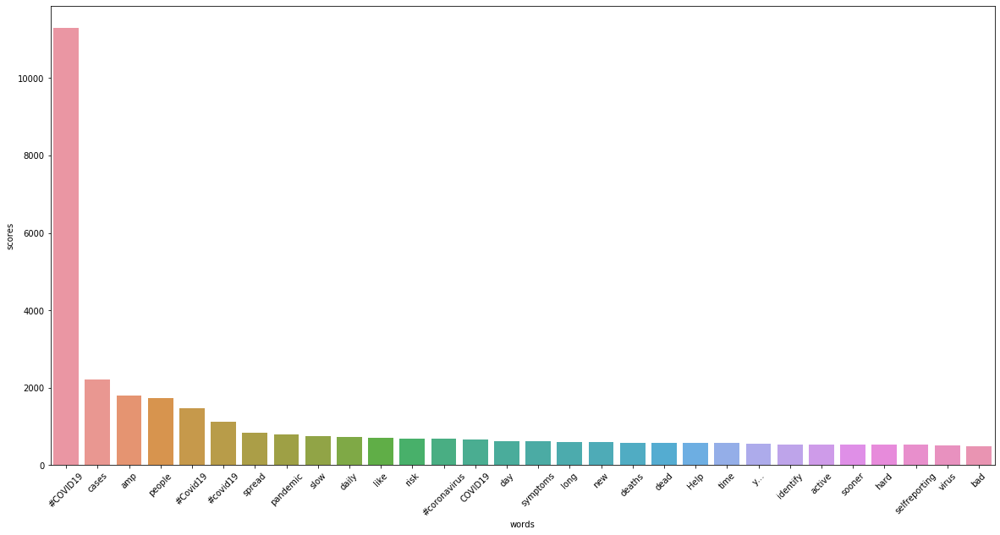

In [63]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

In [64]:
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])

In [65]:
pos_df

,words,scores
0,#COVID19,27053
1,new,10072
2,cases,9668
3,amp,4702
4,positive,3902
5,#Covid19,3542
6,New,3370
7,deaths,2927
8,#covid19,2866
9,people,2665


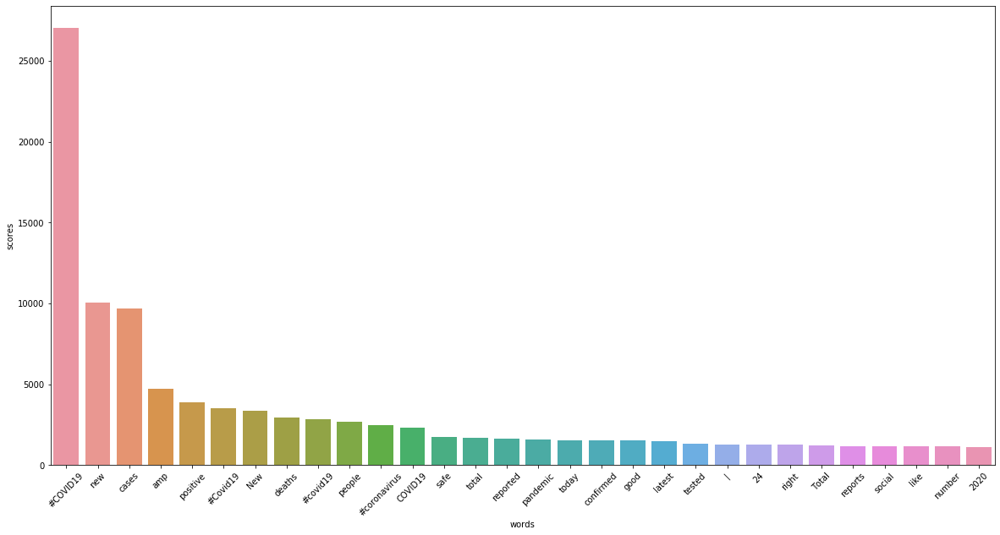

In [66]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()

In [67]:
neut_df = pd.DataFrame(most_common_neut_words.items(),columns=['words','scores'])

In [68]:
neut_df

,words,scores
0,#COVID19,38283
1,amp,5381
2,#Covid19,5297
3,#covid19,4708
4,COVID19,3649
5,cases,3622
6,people,3594
7,#coronavirus,3288
8,pandemic,2582
9,deaths,2330


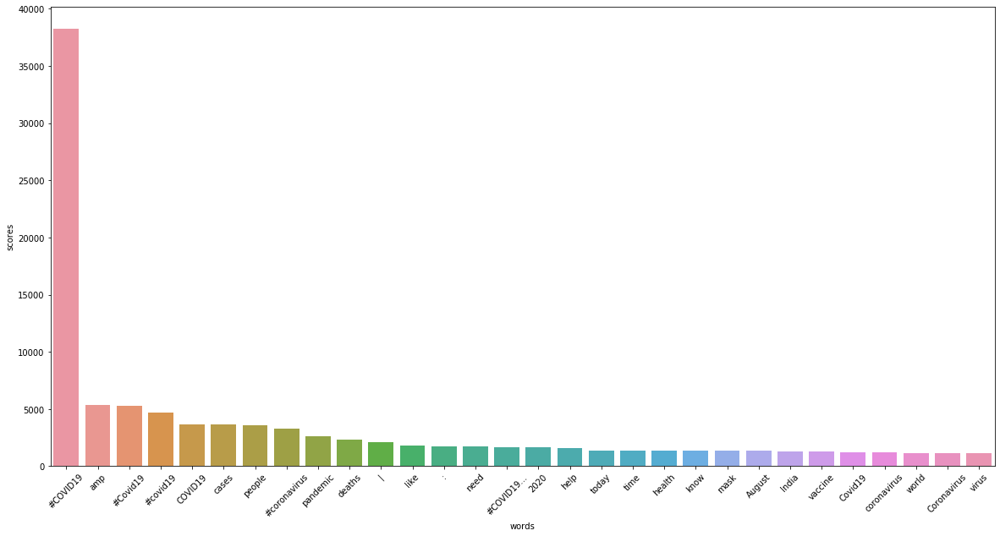

In [69]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neut_df)
plt.xticks(rotation=45)
plt.show()

In [70]:
#!pip install wordcloud

In [71]:
### Word Cloud
from wordcloud import WordCloud
from matplotlib import figure
import pylab as pl

In [72]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [73]:
pos_docx = ' '.join(pos_tokens)
neg_docx = ' '.join(neg_tokens)
neu_docx = ' '.join(neut_tokens)

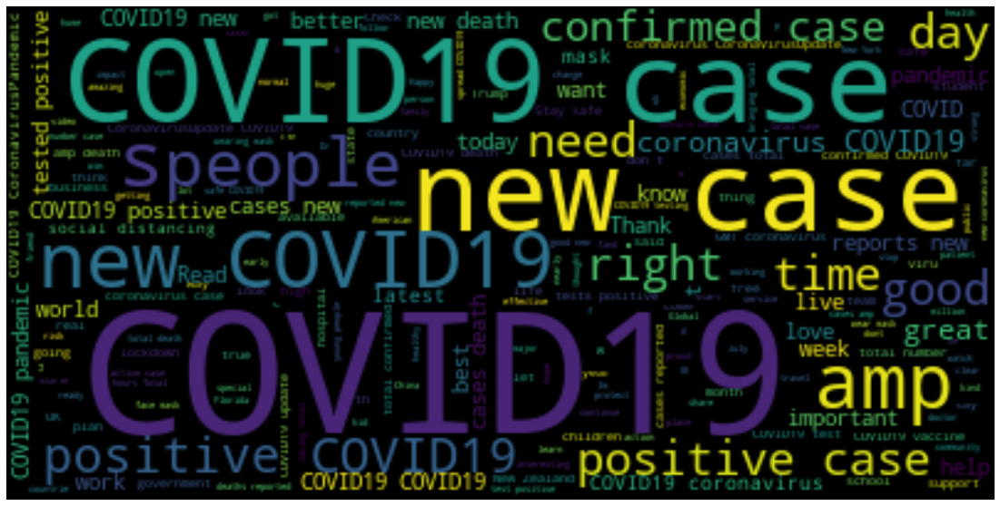

In [74]:
plot_wordcloud(pos_docx)

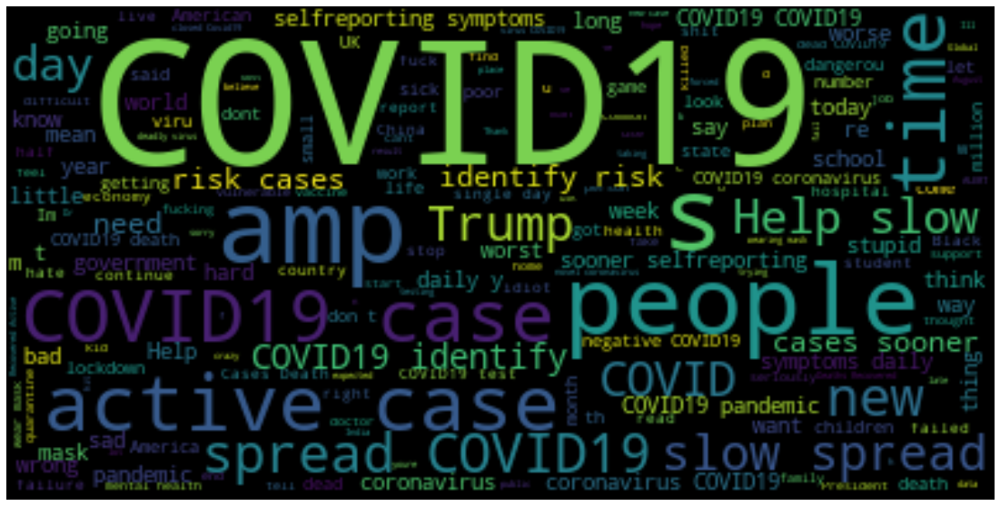

In [75]:
plot_wordcloud(neg_docx)

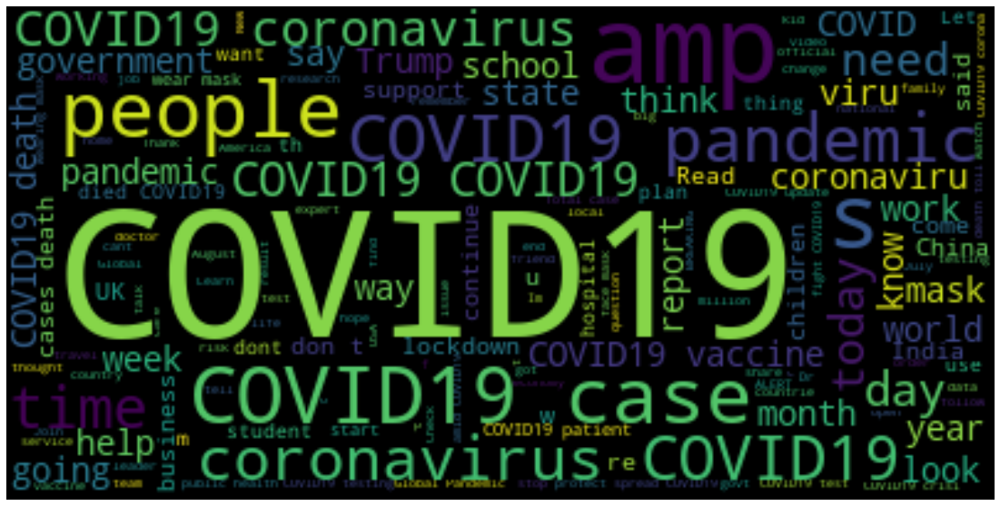

In [76]:
plot_wordcloud(neu_docx)

In [77]:
positive=df[df['sentiment']=='Positive']

In [78]:
positive.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,source,is_retweet,Month,day,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
6,hr bartender,"Gainesville, FL",Workplace tips and advice served up in a frien...,2008-08-12 18:19:49,79956,54810,3801,False,2020-07-25 12:27:03,How #COVID19 Will Change Work in General (and ...,...,Buffer,False,7,Sat,"[#COVID19, #Recruiting…]",#COVID19 Change Work General (and recruiting s...,"{'polarity': 0.05000000000000002, 'subjectivit...",0.050000,0.500000,Positive
8,Prathamesh Bendre,NaN,"A poet, reiki practitioner and a student of law.",2015-04-25 08:15:41,25,29,18,False,2020-07-25 12:26:59,Praying for good health and recovery of @Chouh...,...,Twitter for Android,False,7,Sat,"[#covid19, #covidPositive]",Praying good health recovery #covid19 #covidPo...,"{'polarity': 0.7, 'subjectivity': 0.6000000000...",0.700000,0.600000,Positive
12,SEXXYLYPPS,Hotel living - various cities! Who needs a ho...,"My ink ""My Way...No Regrets""\nAlways Make Happ...",2010-03-25 21:16:20,0,8,32,False,2020-07-25 12:26:47,👋🏻@PattyHajdu @NavdeepSBains — no one will be ...,...,Twitter Web App,False,7,Sat,[#COVID19],— safe #COVID19 safe commit ensure…,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.500000,0.500000,Positive
13,Africa Youth Advisory Board on DRR,Africa,Official account of the Africa Youth Advisory ...,2019-05-13 06:27:47,830,254,3692,False,2020-07-25 12:26:47,Let's all protect ourselves from #COVID19.\nIt...,...,Twitter Web App,False,7,Sat,[#COVID19.],Lets protect #COVID19 real numbers climbing fa...,"{'polarity': 0.2, 'subjectivity': 0.45, 'senti...",0.200000,0.450000,Positive
19,Coronavirus Law,"Florida, USA",COVID-19 Practice of Lechner Law,2019-12-03 19:00:11,14,24,74,False,2020-07-25 12:26:39,COVID Update: The infection rate in Florida is...,...,Twitter for iPad,False,7,Sat,[],COVID Update: infection rate Florida following...,"{'polarity': 0.03333333333333333, 'subjectivit...",0.033333,0.166667,Positive


In [79]:
neutral=df[df['sentiment']=='Neutral']
neutral.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,source,is_retweet,Month,day,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,...,Twitter for Android,False,7,Sat,[],Hey wouldnt sense players pay respects A…,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,...,Twitter for Android,False,7,Sat,[#COVID19],Trump claimed #COVID19 hoax claim effort to…,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,...,Twitter for iPhone,False,7,Sat,[#COVID19],gift #COVID19 appreciation simple things me…,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.0,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,...,Twitter for Android,False,7,Sat,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin Novel #CoronaVirusUpd...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral
7,Derbyshire LPC,NaN,NaN,2012-02-03 18:08:10,608,355,95,False,2020-07-25 12:27:00,You now have to wear face coverings when out s...,...,TweetDeck,False,7,Sat,[],wear face coverings shopping includes visit lo...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.0,0.000000,Neutral


In [80]:
negative=df[df['sentiment']=='Negative']
negative.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,source,is_retweet,Month,day,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,...,Twitter for iPhone,False,7,Sat,[],smelled scent hand sanitizers today past think...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.250000,0.250000,Negative
5,🎹 Franz Schubert,Новоро́ссия,🎼 #Новоро́ссия #Novorossiya #оставайсядома #S...,2018-03-19 16:29:52,1180,1071,1287,False,2020-07-25 12:27:06,#coronavirus #covid19 deaths continue to rise....,...,Twitter Web App,False,7,Sat,"[#coronavirus, #covid19]",#coronavirus #covid19 deaths continue rise bad...,"{'polarity': -0.6999999999999998, 'subjectivit...",-0.700000,0.666667,Negative
22,Micah Pollak,Northwest Indiana,Associate Professor of Economics (PhD in Econo...,2011-07-22 13:41:42,751,183,1308,False,2020-07-25 12:26:31,"@JimBnntt Your image doesn't list a source, bu...",...,Twitter Web App,False,7,Sat,[],image doesnt list source Id careful overall ri...,"{'polarity': -0.03333333333333333, 'subjectivi...",-0.033333,0.466667,Negative
36,harleyb,Deep Heart Texas,Inquisitive; Open minded but clear-eyed; Unapo...,2014-02-03 01:23:36,6156,5463,193090,False,2020-07-25 12:26:06,@NicoleKowalski5 @chrisdameanor19 I'm feeling ...,...,Twitter for Android,False,7,Sat,[#COVID19],Im feeling little anxious #COVID19 detracted e...,"{'polarity': -0.21875, 'subjectivity': 0.75, '...",-0.218750,0.750000,Negative
57,CARLINO,"New Orleans, LA",IG Carlino213: Alumni LA Southwest College: Pr...,2015-04-19 22:07:53,11,3,133,False,2020-07-25 12:25:29,Crazy that the world has come to this but as A...,...,Twitter for iPhone,False,7,Sat,[#covid19],Crazy world come Americans fight #covid19,"{'polarity': -0.6, 'subjectivity': 0.9, 'senti...",-0.600000,0.900000,Negative


In [81]:
positive.shape, neutral.shape, negative.shape

((63792, 21), (88510, 21), (26806, 21))

In [82]:
positive = positive.sample(negative.shape[0])

In [83]:
positive.shape

(26806, 21)

In [84]:
neutral = neutral.sample(negative.shape[0])

In [85]:
neutral.shape

(26806, 21)

In [86]:
data=positive.append(neutral, ignore_index=True).append(negative, ignore_index=True)
data.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,...,source,is_retweet,Month,day,extracted_hashtags,clean_tweet,sentiment_results,polarity,subjectivity,sentiment
0,Times of Oman,Oman,Oman's leading English language media house. h...,2014-03-20 04:50:33,82136,495,828,True,2020-08-11 10:02:02,The Sultanate registered on Tuesday 596 new re...,...,TweetDeck,False,8,Tue,[#COVID19],Sultanate registered Tuesday 596 new recoverie...,"{'polarity': 0.13636363636363635, 'subjectivit...",0.136364,0.454545,Positive
1,ADM Bhanjanagar,NaN,Official Twitter handle of ADM Bhanjanagar,2020-07-06 17:57:02,955,20,72,False,2020-08-12 05:40:32,Happy #InternationalYouthDay! Today we recogni...,...,Twitter Web App,False,8,Wed,[#InternationalYouthDay!],Happy #InternationalYouthDay Today recognize t...,"{'polarity': 0.3666666666666667, 'subjectivity...",0.366667,0.533333,Positive
2,Covid Data,NaN,Posting Covid-19 data from web sources,2020-04-05 14:41:28,54,14,0,False,2020-08-22 10:00:19,New COVID-19 Data at 2020-08-22 06:00:00 am ED...,...,coronaData_Test,False,8,Sat,"[#Coronavirus, #COVID19]",New COVID19 Data 20200822 06:00:00 EDT #Corona...,"{'polarity': 0.13636363636363635, 'subjectivit...",0.136364,0.454545,Positive
3,Marvel IVF Solutions,"Bangkok, Thailand",Medical coordination specialist for #infertili...,2011-01-14 04:13:12,1976,1120,970,False,2020-08-09 09:20:24,It is still good practice to wash your hands a...,...,Twitter Web App,False,8,Sun,[#IVF],good practice wash hands wear mask public spac...,"{'polarity': 0.35, 'subjectivity': 0.333333333...",0.350000,0.333333,Positive
4,UNFPA Iraq,Iraq,Delivering a world where every pregnancy is wa...,2016-05-17 08:35:11,2271,376,1060,False,2020-08-01 16:06:08,🤰 might fear that they ⬆ risk of catching #COV...,...,Twitter Web App,False,8,Sat,[#COVID19],🤰 fear risk catching #COVID19 checkup Staying ...,"{'polarity': 0.6, 'subjectivity': 0.9, 'sentim...",0.600000,0.900000,Positive


In [87]:
data.shape

(80418, 21)

In [88]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.pipeline import Pipeline

In [89]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [90]:
x_train, x_test, y_train, y_test = train_test_split(data['clean_tweet'], data['sentiment'], test_size = 0.3, random_state=0, shuffle=True, stratify=data['sentiment'])

## RF

In [91]:
clf=Pipeline([('Tfdif',TfidfVectorizer()), ('clf', RandomForestClassifier(n_estimators=100,n_jobs=-1))])

In [92]:
clf.fit(x_train,y_train)

Pipeline(memory=None,
         steps=[('Tfdif',
                 TfidfVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.float64'>,
                                 encoding='utf-8', input='content',
                                 lowercase=True, max_df=1.0, max_features=None,
                                 min_df=1, ngram_range=(1, 1), norm='l2',
                                 preprocessor=None, smooth_idf=True,
                                 stop_words=None, strip_accents=None,
                                 sublinear_tf=False,
                                 token_pattern='...
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None

In [93]:
y_pred=clf.predict(x_test)

In [94]:
confusion_matrix(y_test,y_pred)

array([[7256,  334,  452],
       [  93, 7817,  132],
       [ 279,  308, 7455]], dtype=int64)

In [95]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

    Negative       0.95      0.90      0.93      8042
     Neutral       0.92      0.97      0.95      8042
    Positive       0.93      0.93      0.93      8042

    accuracy                           0.93     24126
   macro avg       0.93      0.93      0.93     24126
weighted avg       0.93      0.93      0.93     24126



In [96]:
accuracy_score(y_test,y_pred)

0.9337644035480395

In [97]:
clf.predict(["If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated "])

array(['Negative'], dtype=object)

In [98]:
clf.predict(["Actionables healthy recovery"])

array(['Positive'], dtype=object)

## KNN

In [99]:
clf=Pipeline([('Tfdif',TfidfVectorizer()), ('clf', KNeighborsClassifier(n_neighbors=1))])

In [100]:
clf.fit(x_train,y_train)

Pipeline(memory=None,
         steps=[('Tfdif',
                 TfidfVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.float64'>,
                                 encoding='utf-8', input='content',
                                 lowercase=True, max_df=1.0, max_features=None,
                                 min_df=1, ngram_range=(1, 1), norm='l2',
                                 preprocessor=None, smooth_idf=True,
                                 stop_words=None, strip_accents=None,
                                 sublinear_tf=False,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, use_idf=True,
                                 vocabulary=None)),
                ('clf',
                 KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                      metric='minkowski', metric_params=None,

In [101]:
y_pred=clf.predict(x_test)

In [102]:
confusion_matrix(y_test,y_pred)

array([[1618, 6341,   83],
       [ 165, 7677,  200],
       [  87, 6411, 1544]], dtype=int64)

In [103]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

    Negative       0.87      0.20      0.33      8042
     Neutral       0.38      0.95      0.54      8042
    Positive       0.85      0.19      0.31      8042

    accuracy                           0.45     24126
   macro avg       0.70      0.45      0.39     24126
weighted avg       0.70      0.45      0.39     24126



In [104]:
accuracy_score(y_test,y_pred)

0.44926635165381745

In [105]:
clf.predict(["Actionables healthy recovery"])

array(['Positive'], dtype=object)

In [106]:
clf.predict(["If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated"])

array(['Negative'], dtype=object)

## niave bayes

In [107]:
clf=Pipeline([('Tfdif',TfidfVectorizer()), ('clf',MultinomialNB() )])

In [108]:
clf.fit(x_train,y_train)

Pipeline(memory=None,
         steps=[('Tfdif',
                 TfidfVectorizer(analyzer='word', binary=False,
                                 decode_error='strict',
                                 dtype=<class 'numpy.float64'>,
                                 encoding='utf-8', input='content',
                                 lowercase=True, max_df=1.0, max_features=None,
                                 min_df=1, ngram_range=(1, 1), norm='l2',
                                 preprocessor=None, smooth_idf=True,
                                 stop_words=None, strip_accents=None,
                                 sublinear_tf=False,
                                 token_pattern='(?u)\\b\\w\\w+\\b',
                                 tokenizer=None, use_idf=True,
                                 vocabulary=None)),
                ('clf',
                 MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True))],
         verbose=False)

In [109]:
y_pred=clf.predict(x_test)

In [110]:
confusion_matrix(y_test,y_pred)

array([[6977,  290,  775],
       [1672, 4710, 1660],
       [ 996,  257, 6789]], dtype=int64)

In [111]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

    Negative       0.72      0.87      0.79      8042
     Neutral       0.90      0.59      0.71      8042
    Positive       0.74      0.84      0.79      8042

    accuracy                           0.77     24126
   macro avg       0.79      0.77      0.76     24126
weighted avg       0.79      0.77      0.76     24126



In [112]:
accuracy_score(y_test,y_pred)

0.7658128160490757

In [113]:
clf.predict(["Actionables healthy recovery"])

array(['Positive'], dtype='<U8')

In [114]:
clf.predict(["If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated"])

array(['Negative'], dtype='<U8')

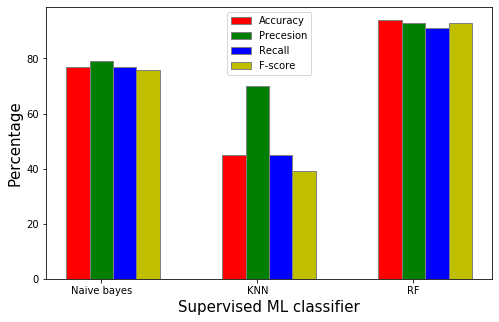

In [82]:
# set width of bar
barWidth = 0.15
fig = plt.subplots(figsize =(8, 5))
 
# set height of bar
Accuracy = [77, 45, 94]
Precesion= [79,70,93]
Recall =[77,45,91]
fScore = [76, 39, 93]
 
# Set position of bar on X axis
br1 = np.arange(len(Accuracy))
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
br4 = [x + barWidth for x in br3]


# Make the plot
plt.bar(br1, Accuracy, color ='r', width = barWidth,
        edgecolor ='grey', label ='Accuracy')
plt.bar(br2, Precesion, color ='g', width = barWidth,
        edgecolor ='grey', label ='Precesion')
plt.bar(br3, Recall, color ='b', width = barWidth,
        edgecolor ='grey', label ='Recall')
plt.bar(br4, fScore, color ='y', width = barWidth,
        edgecolor ='grey', label ='F-score')
 
# Adding Xticks
plt.xlabel('Supervised ML classifier', fontsize = 15)
plt.ylabel('Percentage', fontsize = 15)
plt.xticks([r + barWidth for r in range(len(Accuracy))],
        ['Naive bayes', 'KNN','RF'])
 
plt.legend()
plt.show()